## Loading dataset

In [1]:
import pandas as pd
import glob

df = pd.concat(map(pd.read_csv, glob.glob("backblaze2019/2019-01*.csv")))
df.head()

,date,serial_number,model,capacity_bytes,failure,smart_1_normalized,smart_1_raw,smart_2_normalized,smart_2_raw,smart_3_normalized,...,smart_250_normalized,smart_250_raw,smart_251_normalized,smart_251_raw,smart_252_normalized,smart_252_raw,smart_254_normalized,smart_254_raw,smart_255_normalized,smart_255_raw
0,2019-01-01,Z305B2QN,ST4000DM000,4000787030016,0,111.0,35673128.0,NaN,NaN,91.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,2019-01-01,ZJV0XJQ4,ST12000NM0007,12000138625024,0,83.0,187116872.0,NaN,NaN,98.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,2019-01-01,ZJV0XJQ3,ST12000NM0007,12000138625024,0,73.0,19599104.0,NaN,NaN,99.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,2019-01-01,ZJV0XJQ0,ST12000NM0007,12000138625024,0,81.0,136943696.0,NaN,NaN,93.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,2019-01-01,PL1331LAHG1S4H,HGST HMS5C4040ALE640,4000787030016,0,100.0,0.0,134.0,103.0,100.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [2]:
df.shape

(3314967, 129)

In [3]:
## Isolation Forest

## Taking features

Filter by model ST12000NM0007

In [4]:
df2 = df
df = df[df['model'] == "ST12000NM0007"]
df.shape

(975204, 129)

In [5]:
df = df.filter(['date','serial_number','smart_5_raw', 'smart_187_raw', 'smart_197_raw', 'failure'])
df.shape

(975204, 6)

## Creating features

In [6]:
def create_features(g):
    # 5
    smart_5_shifted = g['smart_5_raw'].shift(fill_value=0)
    g['5_diff'] = g['smart_5_raw'] - smart_5_shifted
    #g.at[1, '5_diff'] = 0
    #g.ix[1, '5_diff'] = 0
    # 187
    smart_187_shifted = g['smart_187_raw'].shift(fill_value=0)
    g['187_diff'] = g['smart_187_raw'] - smart_187_shifted
    #g.at[1, '187_diff'] = 0
    #g.ix[1, '187_diff'] = 0
    # 197
    smart_197_shifted = g['smart_197_raw'].shift(fill_value=0)
    g['197_diff'] = g['smart_197_raw'] - smart_197_shifted
    #g.at[1, '197_diff'] = 0
    #g.ix[1, '197_diff'] = 0
    return g


#df = df.groupby(['serial_number'], group_keys=True).filter(lambda g: len(g['failure'].value_counts()) == 1
#                                                           # disk failed => check variance > 0
#                                                           or len(g['failure'].value_counts()) == 2
#                                                          and len(g['5_diff'].value_counts()) > 0
#                                                          and len(g['187_diff'].value_counts()) > 0
#                                                          and len(g['197_diff'].value_counts()) > 0)

#df1 = df1.reset_index()
df1 = df
df1 = df1.groupby(['serial_number'], group_keys=True, as_index=False).apply(lambda x: create_features(x))
df1.reset_index(drop=True, inplace=True)
df1.head(35)

,date,serial_number,smart_5_raw,smart_187_raw,smart_197_raw,failure,5_diff,187_diff,197_diff
0,2019-01-01,ZCH00XGL,0.0,0.0,0.0,0,0.0,0.0,0.0
1,2019-01-02,ZCH00XGL,0.0,0.0,0.0,0,0.0,0.0,0.0
2,2019-01-03,ZCH00XGL,0.0,0.0,0.0,0,0.0,0.0,0.0
3,2019-01-04,ZCH00XGL,0.0,0.0,0.0,0,0.0,0.0,0.0
4,2019-01-05,ZCH00XGL,0.0,0.0,0.0,0,0.0,0.0,0.0
5,2019-01-06,ZCH00XGL,0.0,0.0,0.0,0,0.0,0.0,0.0
6,2019-01-07,ZCH00XGL,0.0,0.0,0.0,0,0.0,0.0,0.0
7,2019-01-08,ZCH00XGL,0.0,0.0,0.0,0,0.0,0.0,0.0
8,2019-01-09,ZCH00XGL,0.0,0.0,0.0,0,0.0,0.0,0.0
9,2019-01-10,ZCH00XGL,0.0,0.0,0.0,0,0.0,0.0,0.0


In [7]:
df1['5_diff'].value_counts()

0.0       974049
8.0          226
16.0          71
1.0           57
32.0          38
           ...  
2416.0         1
2016.0         1
63.0           1
161.0          1
39.0           1
Name: 5_diff, Length: 259, dtype: int64

In [8]:
df1['187_diff'].value_counts()

0.0       974781
1.0           58
3.0           42
2.0           24
4.0           11
6.0            8
7.0            5
9.0            4
12.0           3
15.0           2
5.0            2
22.0           2
14.0           2
26.0           1
38.0           1
16.0           1
1723.0         1
18.0           1
35.0           1
11.0           1
95.0           1
21.0           1
54.0           1
8.0            1
13.0           1
94.0           1
28.0           1
Name: 187_diff, dtype: int64

In [9]:
df1['197_diff'].value_counts()

 0.0      974744
 8.0         118
 16.0         30
-8.0          19
 24.0         10
 32.0          8
-16.0          5
 40.0          4
 88.0          3
 96.0          3
-32.0          2
 72.0          2
 112.0         2
 56.0          2
 152.0         1
 128.0         1
 64.0          1
 48.0          1
 80.0          1
 120.0         1
Name: 197_diff, dtype: int64

## Dataset preprocessing

1. Removing duplicates

In [10]:
df1.shape

(975204, 9)

In [11]:
df1.drop_duplicates()

,date,serial_number,smart_5_raw,smart_187_raw,smart_197_raw,failure,5_diff,187_diff,197_diff
0,2019-01-01,ZCH00XGL,0.0,0.0,0.0,0,0.0,0.0,0.0
1,2019-01-02,ZCH00XGL,0.0,0.0,0.0,0,0.0,0.0,0.0
2,2019-01-03,ZCH00XGL,0.0,0.0,0.0,0,0.0,0.0,0.0
3,2019-01-04,ZCH00XGL,0.0,0.0,0.0,0,0.0,0.0,0.0
4,2019-01-05,ZCH00XGL,0.0,0.0,0.0,0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...
975199,2019-01-27,ZJV2VATD,0.0,0.0,0.0,0,0.0,0.0,0.0
975200,2019-01-28,ZJV2VATD,0.0,0.0,0.0,0,0.0,0.0,0.0
975201,2019-01-29,ZJV2VATD,0.0,0.0,0.0,0,0.0,0.0,0.0
975202,2019-01-30,ZJV2VATD,0.0,0.0,0.0,0,0.0,0.0,0.0


In [12]:
df1.shape

(975204, 9)

2. Removing empty rows -- did it in previous section

In [13]:
df1 = df1.dropna()
df1.shape

(974958, 9)

3. Check for each disk whether the values are complete. This means that for a working disk, the last sample must match the last day of the dataset, and for a failed disk, the last sample in the failure feature must contain a value of 1. If these conditions are not met, all samples from that disk will be removed from the dataset.

In [14]:
df1['serial_number'].value_counts()

ZCH00XGL    31
ZJV03K9N    31
ZJV03KHW    31
ZJV03KHV    31
ZJV03KHQ    31
            ..
ZJV2EFDA     1
ZJV2ENZ6     1
ZJV2E9XX     1
ZCH0CSJ9     1
ZJV2ECEV     1
Name: serial_number, Length: 32407, dtype: int64

4.  For each failed hard disk, check if it has a variance greater than 0 in its features. If not, the hard disk will be removed from the dataset.

In [15]:
df1.shape

(974958, 9)

## Split data

In [16]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import OneHotEncoder


#df1 = df1[df1['date'] == "2018-01-01"]
#df1.shape

#df1['serial_number_int'] = pd.Categorical(df1['serial_number']).codes
#df1.head()
X = df1.drop(['failure','date','serial_number'], axis=1)
y = df1['failure']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.25, random_state = 42)

y_train.value_counts()

0    731181
1        37
Name: failure, dtype: int64

## Creating model

In [17]:
from sklearn.ensemble import IsolationForest

IF_FDR = IsolationForest(contamination=0.01)

IF_FAR = IsolationForest(contamination=0.0002)

In [18]:
IF_FDR.fit(X_train.values)
IF_FAR.fit(X_train.values)

IsolationForest(contamination=0.0002)

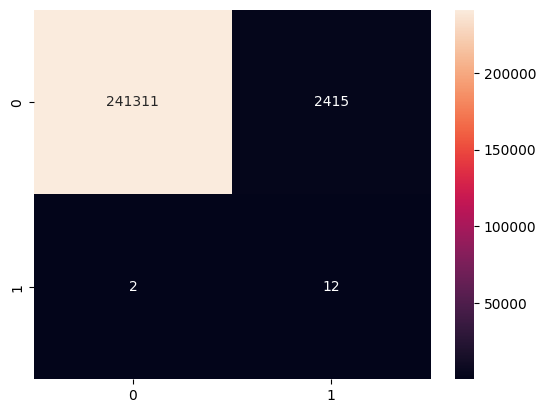

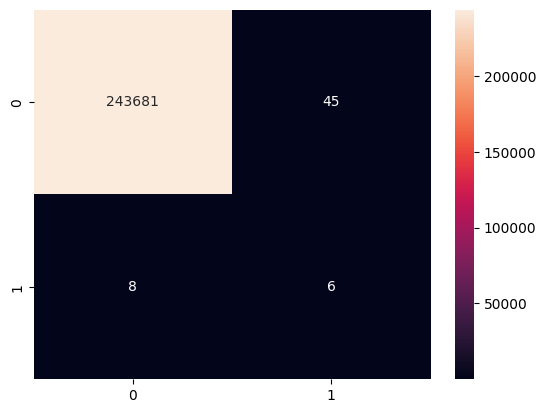

In [19]:
from sklearn.metrics import confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt

def map_function(elem):
    if elem == -1:
        return 1
    else:
        return 0

y_pred_test = IF_FDR.predict(X_test.values)
y_pred_test = [map_function(a) for a in y_pred_test]
sns.heatmap(confusion_matrix(y_test, y_pred_test), annot=True, fmt='.0f')
plt.show()

y_pred_test_far = IF_FAR.predict(X_test.values)
y_pred_test_far = [map_function(a) for a in y_pred_test_far]
sns.heatmap(confusion_matrix(y_test, y_pred_test_far), annot=True, fmt='.0f')
plt.show()


In [20]:
pd.DataFrame(y_pred_test).value_counts()

0    241313
1      2427
dtype: int64

## Mahalanobis distance

### Defining estimators

In [21]:
def median_estimator(t_m, values):
    return np.median(values) > t_m

In [22]:
from scipy import stats

def MAD(values):
    return stats.median_abs_deviation(values, scale=1/1.4826)

# median absolute deviation estimator
def MAD_estimator(t_MAD, values):
    return MAD(values) > t_MAD

In [23]:
def logistic_f(x):
    return (np.exp(x) - 1) / (np.exp(x) + 1)

def logistic_f_derivative(x):
    return (2 * np.exp(x) / (np.exp(x) + 1)**2)

def calculate_arg_for_log_f(value_i, Ln, Sn):
    return (value_i - Ln) / Sn

# location M-estimator
def location_M(values):
    #print("values shape", values.shape, len(values))
    S_0 = MAD(values)
    Ln_0 = np.median(values)
    sum_log_f = np.zeros(values.shape[1])
    sum_der_log_f = np.zeros(values.shape[1])
    for value in values:
        arg = calculate_arg_for_log_f(value, Ln_0, S_0)
        sum_log_f = sum_log_f + logistic_f(arg)
        sum_der_log_f = sum_der_log_f + logistic_f_derivative(arg)
    return Ln_0 + S_0*(sum_log_f / sum_der_log_f)
    

def location_M_estimator(t_locM, values):
    return location_M(values) > t_locM

In [24]:
def ro_f(x):
    return (logistic_f(x / 0.3739))**2

def calculate_arg_for_ro(value_i, Ln, Sn):
    return (value_i - Ln) / Sn

# scale M-estimator
def scale_M(values):
    Sn_0 = MAD(values)
    # location M estimator defined above used here
    Ln_0 = np.median(values)
    sum_ro = 0
    for value in values:
        sum_ro = sum_ro + ro_f(calculate_arg_for_ro(value, Ln_0, Sn_0))    
    return Sn_0 * np.square(2 * sum_ro)

def scale_M_estimator(t_scM, values):
    return scale_M(values) > t_scM

### Combining estimators

In [26]:
def take_decision(values):
    m_est_res = median_estimator(np.repeat(0.1, values.shape[1]), values)
    MAD_est_res = MAD_estimator(3, values)
    locm_est_res = location_M_estimator(np.repeat(0.5, values.shape[1]), values)
    scalem_est_res = scale_M_estimator(np.repeat(0.5, values.shape[1]), values)
    if (m_est_res or MAD_est_res or locm_est_res or scalem_est_res):
        return 1
    else:
        return 0



### Calculate mahalanobis distance

In [27]:
# suppose we have X -- dataset
# X_j -- attributes
# X has n attributes and m observations
# Mahalanobis space is supposed to be built using healthy drives data


In [28]:
# normalize values

from sklearn.preprocessing import StandardScaler

# z_i in paper
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.fit_transform(X_test)

In [29]:
def mahalanobis(x=None, data=None, cov=None):
    """Compute the Mahalanobis Distance between each row of x and the data  
    x    : vector or matrix of data with, say, p columns.
    data : ndarray of the distribution from which Mahalanobis distance of each observation of x is to be computed.
    cov  : covariance matrix (p x p) of the distribution. If None, will be computed from data.
    """
    #x_minus_mu = x - np.mean(data)
    #if not cov:
    #    cov = np.cov(data.values.T)
    #inv_covmat = np.linalg.pinv(cov)
    left_term = np.dot(x, cov)
    mahal = np.dot(left_term, x.T)
    return mahal.diagonal()

In [30]:
def calculate_cov_matrix(X):
    return np.cov(X.T)

def calculate_pseudoinv_matrix(X):
    return np.linalg.pinv(calculate_cov_matrix(X))

### Anomaly detection algorithm

In [31]:
from numpy.lib.stride_tricks import sliding_window_view 
import numpy as np

window_size = 6

def predict(test_values, train_values):
    number_of_features = test_values.shape[1]
    shape = (number_of_features, window_size)
    #print("len of test_values = ", len(test_values), "number of features = ", number_of_features)
    sliding_windows = sliding_window_view(test_values, shape)
    print("sliding windows = ", sliding_windows, " test_values", test_values, "len sliding windows", len(sliding_windows))
    result = np.full(len(test_values), 0)
    print("result = ", result)
    i = 0
    C = calculate_pseudoinv_matrix(train_values)
    for window in sliding_windows:
        # no need to recalculate values inside a sliding window, need to replace this method later
      #  print("window = ", window)
        md_values = mahalanobis(window, X_train, C)
        decision = take_decision(md_values)
        result[i + 5] = decision
        i = i + 1
        print("Iteration ", i, " of ", len(sliding_windows))
    return result

sliding windows =  [[[[-0.02225015 -0.02606585 -0.03646694 -0.00228484 -0.00536437
    -0.00684005]
   [-0.02225015 -0.02606585 -0.03646694 -0.00228484 -0.00536437
    -0.00684005]
   [-0.02225015 -0.02606585 -0.03646694 -0.00228484 -0.00536437
    -0.00684005]
   [-0.02225015 -0.02606585 -0.03646694 -0.00228484 -0.00536437
    -0.00684005]
   [-0.02225015 -0.02606585 -0.03646694 -0.00228484 -0.00536437
    -0.00684005]
   [-0.02225015 -0.02606585 -0.03646694 -0.00228484 -0.00536437
    -0.00684005]]]


 [[[-0.02225015 -0.02606585 -0.03646694 -0.00228484 -0.00536437
    -0.00684005]
   [-0.02225015 -0.02606585 -0.03646694 -0.00228484 -0.00536437
    -0.00684005]
   [-0.02225015 -0.02606585 -0.03646694 -0.00228484 -0.00536437
    -0.00684005]
   [-0.02225015 -0.02606585 -0.03646694 -0.00228484 -0.00536437
    -0.00684005]
   [-0.02225015 -0.02606585 -0.03646694 -0.00228484 -0.00536437
    -0.00684005]
   [-0.02225015 -0.02606585 -0.03646694 -0.00228484 -0.00536437
    -0.00684005]]]


 

Iteration  324  of  243735
Iteration  325  of  243735
Iteration  326  of  243735
Iteration  327  of  243735
Iteration  328  of  243735
Iteration  329  of  243735
Iteration  330  of  243735
Iteration  331  of  243735
Iteration  332  of  243735
Iteration  333  of  243735
Iteration  334  of  243735
Iteration  335  of  243735
Iteration  336  of  243735
Iteration  337  of  243735
Iteration  338  of  243735
Iteration  339  of  243735
Iteration  340  of  243735
Iteration  341  of  243735
Iteration  342  of  243735
Iteration  343  of  243735
Iteration  344  of  243735
Iteration  345  of  243735
Iteration  346  of  243735
Iteration  347  of  243735
Iteration  348  of  243735
Iteration  349  of  243735
Iteration  350  of  243735
Iteration  351  of  243735
Iteration  352  of  243735
Iteration  353  of  243735
Iteration  354  of  243735
Iteration  355  of  243735
Iteration  356  of  243735
Iteration  357  of  243735
Iteration  358  of  243735
Iteration  359  of  243735
Iteration  360  of  243735
I

Iteration  833  of  243735
Iteration  834  of  243735
Iteration  835  of  243735
Iteration  836  of  243735
Iteration  837  of  243735
Iteration  838  of  243735
Iteration  839  of  243735
Iteration  840  of  243735
Iteration  841  of  243735
Iteration  842  of  243735
Iteration  843  of  243735
Iteration  844  of  243735
Iteration  845  of  243735
Iteration  846  of  243735
Iteration  847  of  243735
Iteration  848  of  243735
Iteration  849  of  243735
Iteration  850  of  243735
Iteration  851  of  243735
Iteration  852  of  243735
Iteration  853  of  243735
Iteration  854  of  243735
Iteration  855  of  243735
Iteration  856  of  243735
Iteration  857  of  243735
Iteration  858  of  243735
Iteration  859  of  243735
Iteration  860  of  243735
Iteration  861  of  243735
Iteration  862  of  243735
Iteration  863  of  243735
Iteration  864  of  243735
Iteration  865  of  243735
Iteration  866  of  243735
Iteration  867  of  243735
Iteration  868  of  243735
Iteration  869  of  243735
I

C:\Users\katevi\AppData\Local\Temp\ipykernel_20052\2154559578.py:2: RuntimeWarning: overflow encountered in exp
  return (np.exp(x) - 1) / (np.exp(x) + 1)
C:\Users\katevi\AppData\Local\Temp\ipykernel_20052\2154559578.py:2: RuntimeWarning: invalid value encountered in divide
  return (np.exp(x) - 1) / (np.exp(x) + 1)


Iteration  1199  of  243735
Iteration  1200  of  243735
Iteration  1201  of  243735
Iteration  1202  of  243735
Iteration  1203  of  243735
Iteration  1204  of  243735
Iteration  1205  of  243735
Iteration  1206  of  243735
Iteration  1207  of  243735
Iteration  1208  of  243735
Iteration  1209  of  243735
Iteration  1210  of  243735
Iteration  1211  of  243735
Iteration  1212  of  243735
Iteration  1213  of  243735
Iteration  1214  of  243735
Iteration  1215  of  243735
Iteration  1216  of  243735
Iteration  1217  of  243735
Iteration  1218  of  243735
Iteration  1219  of  243735
Iteration  1220  of  243735
Iteration  1221  of  243735
Iteration  1222  of  243735
Iteration  1223  of  243735
Iteration  1224  of  243735
Iteration  1225  of  243735
Iteration  1226  of  243735
Iteration  1227  of  243735
Iteration  1228  of  243735
Iteration  1229  of  243735
Iteration  1230  of  243735
Iteration  1231  of  243735
Iteration  1232  of  243735
Iteration  1233  of  243735
Iteration  1234  of 

Iteration  1726  of  243735
Iteration  1727  of  243735
Iteration  1728  of  243735
Iteration  1729  of  243735
Iteration  1730  of  243735
Iteration  1731  of  243735
Iteration  1732  of  243735
Iteration  1733  of  243735
Iteration  1734  of  243735
Iteration  1735  of  243735
Iteration  1736  of  243735
Iteration  1737  of  243735
Iteration  1738  of  243735
Iteration  1739  of  243735
Iteration  1740  of  243735
Iteration  1741  of  243735
Iteration  1742  of  243735
Iteration  1743  of  243735
Iteration  1744  of  243735
Iteration  1745  of  243735
Iteration  1746  of  243735
Iteration  1747  of  243735
Iteration  1748  of  243735
Iteration  1749  of  243735
Iteration  1750  of  243735
Iteration  1751  of  243735
Iteration  1752  of  243735
Iteration  1753  of  243735
Iteration  1754  of  243735
Iteration  1755  of  243735
Iteration  1756  of  243735
Iteration  1757  of  243735
Iteration  1758  of  243735
Iteration  1759  of  243735
Iteration  1760  of  243735
Iteration  1761  of 

Iteration  2231  of  243735
Iteration  2232  of  243735
Iteration  2233  of  243735
Iteration  2234  of  243735
Iteration  2235  of  243735
Iteration  2236  of  243735
Iteration  2237  of  243735
Iteration  2238  of  243735
Iteration  2239  of  243735
Iteration  2240  of  243735
Iteration  2241  of  243735
Iteration  2242  of  243735
Iteration  2243  of  243735
Iteration  2244  of  243735
Iteration  2245  of  243735
Iteration  2246  of  243735
Iteration  2247  of  243735
Iteration  2248  of  243735
Iteration  2249  of  243735
Iteration  2250  of  243735
Iteration  2251  of  243735
Iteration  2252  of  243735
Iteration  2253  of  243735
Iteration  2254  of  243735
Iteration  2255  of  243735
Iteration  2256  of  243735
Iteration  2257  of  243735
Iteration  2258  of  243735
Iteration  2259  of  243735
Iteration  2260  of  243735
Iteration  2261  of  243735
Iteration  2262  of  243735
Iteration  2263  of  243735
Iteration  2264  of  243735
Iteration  2265  of  243735
Iteration  2266  of 

Iteration  2702  of  243735
Iteration  2703  of  243735
Iteration  2704  of  243735
Iteration  2705  of  243735
Iteration  2706  of  243735
Iteration  2707  of  243735
Iteration  2708  of  243735
Iteration  2709  of  243735
Iteration  2710  of  243735
Iteration  2711  of  243735
Iteration  2712  of  243735
Iteration  2713  of  243735
Iteration  2714  of  243735
Iteration  2715  of  243735
Iteration  2716  of  243735
Iteration  2717  of  243735
Iteration  2718  of  243735
Iteration  2719  of  243735
Iteration  2720  of  243735
Iteration  2721  of  243735
Iteration  2722  of  243735
Iteration  2723  of  243735
Iteration  2724  of  243735
Iteration  2725  of  243735
Iteration  2726  of  243735
Iteration  2727  of  243735
Iteration  2728  of  243735
Iteration  2729  of  243735
Iteration  2730  of  243735
Iteration  2731  of  243735
Iteration  2732  of  243735
Iteration  2733  of  243735
Iteration  2734  of  243735
Iteration  2735  of  243735
Iteration  2736  of  243735
Iteration  2737  of 

Iteration  3263  of  243735
Iteration  3264  of  243735
Iteration  3265  of  243735
Iteration  3266  of  243735
Iteration  3267  of  243735
Iteration  3268  of  243735
Iteration  3269  of  243735
Iteration  3270  of  243735
Iteration  3271  of  243735
Iteration  3272  of  243735
Iteration  3273  of  243735
Iteration  3274  of  243735
Iteration  3275  of  243735
Iteration  3276  of  243735
Iteration  3277  of  243735
Iteration  3278  of  243735
Iteration  3279  of  243735
Iteration  3280  of  243735
Iteration  3281  of  243735
Iteration  3282  of  243735
Iteration  3283  of  243735
Iteration  3284  of  243735
Iteration  3285  of  243735
Iteration  3286  of  243735
Iteration  3287  of  243735
Iteration  3288  of  243735
Iteration  3289  of  243735
Iteration  3290  of  243735
Iteration  3291  of  243735
Iteration  3292  of  243735
Iteration  3293  of  243735
Iteration  3294  of  243735
Iteration  3295  of  243735
Iteration  3296  of  243735
Iteration  3297  of  243735
Iteration  3298  of 

Iteration  3677  of  243735
Iteration  3678  of  243735
Iteration  3679  of  243735
Iteration  3680  of  243735
Iteration  3681  of  243735
Iteration  3682  of  243735
Iteration  3683  of  243735
Iteration  3684  of  243735
Iteration  3685  of  243735
Iteration  3686  of  243735
Iteration  3687  of  243735
Iteration  3688  of  243735
Iteration  3689  of  243735
Iteration  3690  of  243735
Iteration  3691  of  243735
Iteration  3692  of  243735
Iteration  3693  of  243735
Iteration  3694  of  243735
Iteration  3695  of  243735
Iteration  3696  of  243735
Iteration  3697  of  243735
Iteration  3698  of  243735
Iteration  3699  of  243735
Iteration  3700  of  243735
Iteration  3701  of  243735
Iteration  3702  of  243735
Iteration  3703  of  243735
Iteration  3704  of  243735
Iteration  3705  of  243735
Iteration  3706  of  243735
Iteration  3707  of  243735
Iteration  3708  of  243735
Iteration  3709  of  243735
Iteration  3710  of  243735
Iteration  3711  of  243735
Iteration  3712  of 

Iteration  4199  of  243735
Iteration  4200  of  243735
Iteration  4201  of  243735
Iteration  4202  of  243735
Iteration  4203  of  243735
Iteration  4204  of  243735
Iteration  4205  of  243735
Iteration  4206  of  243735
Iteration  4207  of  243735
Iteration  4208  of  243735
Iteration  4209  of  243735
Iteration  4210  of  243735
Iteration  4211  of  243735
Iteration  4212  of  243735
Iteration  4213  of  243735
Iteration  4214  of  243735
Iteration  4215  of  243735
Iteration  4216  of  243735
Iteration  4217  of  243735
Iteration  4218  of  243735
Iteration  4219  of  243735
Iteration  4220  of  243735
Iteration  4221  of  243735
Iteration  4222  of  243735
Iteration  4223  of  243735
Iteration  4224  of  243735
Iteration  4225  of  243735
Iteration  4226  of  243735
Iteration  4227  of  243735
Iteration  4228  of  243735
Iteration  4229  of  243735
Iteration  4230  of  243735
Iteration  4231  of  243735
Iteration  4232  of  243735
Iteration  4233  of  243735
Iteration  4234  of 

C:\Users\katevi\AppData\Local\Temp\ipykernel_20052\2154559578.py:5: RuntimeWarning: overflow encountered in square
  return (2 * np.exp(x) / (np.exp(x) + 1)**2)


Iteration  4446  of  243735
Iteration  4447  of  243735
Iteration  4448  of  243735
Iteration  4449  of  243735
Iteration  4450  of  243735
Iteration  4451  of  243735
Iteration  4452  of  243735
Iteration  4453  of  243735
Iteration  4454  of  243735
Iteration  4455  of  243735
Iteration  4456  of  243735
Iteration  4457  of  243735
Iteration  4458  of  243735
Iteration  4459  of  243735
Iteration  4460  of  243735
Iteration  4461  of  243735
Iteration  4462  of  243735
Iteration  4463  of  243735
Iteration  4464  of  243735
Iteration  4465  of  243735
Iteration  4466  of  243735
Iteration  4467  of  243735
Iteration  4468  of  243735
Iteration  4469  of  243735
Iteration  4470  of  243735
Iteration  4471  of  243735
Iteration  4472  of  243735
Iteration  4473  of  243735
Iteration  4474  of  243735
Iteration  4475  of  243735
Iteration  4476  of  243735
Iteration  4477  of  243735
Iteration  4478  of  243735
Iteration  4479  of  243735
Iteration  4480  of  243735
Iteration  4481  of 

C:\Users\katevi\AppData\Local\Temp\ipykernel_20052\2154559578.py:5: RuntimeWarning: overflow encountered in exp
  return (2 * np.exp(x) / (np.exp(x) + 1)**2)
C:\Users\katevi\AppData\Local\Temp\ipykernel_20052\2154559578.py:5: RuntimeWarning: invalid value encountered in divide
  return (2 * np.exp(x) / (np.exp(x) + 1)**2)


Iteration  4934  of  243735
Iteration  4935  of  243735
Iteration  4936  of  243735
Iteration  4937  of  243735
Iteration  4938  of  243735
Iteration  4939  of  243735
Iteration  4940  of  243735
Iteration  4941  of  243735
Iteration  4942  of  243735
Iteration  4943  of  243735
Iteration  4944  of  243735
Iteration  4945  of  243735
Iteration  4946  of  243735
Iteration  4947  of  243735
Iteration  4948  of  243735
Iteration  4949  of  243735
Iteration  4950  of  243735
Iteration  4951  of  243735
Iteration  4952  of  243735
Iteration  4953  of  243735
Iteration  4954  of  243735
Iteration  4955  of  243735
Iteration  4956  of  243735
Iteration  4957  of  243735
Iteration  4958  of  243735
Iteration  4959  of  243735
Iteration  4960  of  243735
Iteration  4961  of  243735
Iteration  4962  of  243735
Iteration  4963  of  243735
Iteration  4964  of  243735
Iteration  4965  of  243735
Iteration  4966  of  243735
Iteration  4967  of  243735
Iteration  4968  of  243735
Iteration  4969  of 

Iteration  5512  of  243735
Iteration  5513  of  243735
Iteration  5514  of  243735
Iteration  5515  of  243735
Iteration  5516  of  243735
Iteration  5517  of  243735
Iteration  5518  of  243735
Iteration  5519  of  243735
Iteration  5520  of  243735
Iteration  5521  of  243735
Iteration  5522  of  243735
Iteration  5523  of  243735
Iteration  5524  of  243735
Iteration  5525  of  243735
Iteration  5526  of  243735
Iteration  5527  of  243735
Iteration  5528  of  243735
Iteration  5529  of  243735
Iteration  5530  of  243735
Iteration  5531  of  243735
Iteration  5532  of  243735
Iteration  5533  of  243735
Iteration  5534  of  243735
Iteration  5535  of  243735
Iteration  5536  of  243735
Iteration  5537  of  243735
Iteration  5538  of  243735
Iteration  5539  of  243735
Iteration  5540  of  243735
Iteration  5541  of  243735
Iteration  5542  of  243735
Iteration  5543  of  243735
Iteration  5544  of  243735
Iteration  5545  of  243735
Iteration  5546  of  243735
Iteration  5547  of 

Iteration  6043  of  243735
Iteration  6044  of  243735
Iteration  6045  of  243735
Iteration  6046  of  243735
Iteration  6047  of  243735
Iteration  6048  of  243735
Iteration  6049  of  243735
Iteration  6050  of  243735
Iteration  6051  of  243735
Iteration  6052  of  243735
Iteration  6053  of  243735
Iteration  6054  of  243735
Iteration  6055  of  243735
Iteration  6056  of  243735
Iteration  6057  of  243735
Iteration  6058  of  243735
Iteration  6059  of  243735
Iteration  6060  of  243735
Iteration  6061  of  243735
Iteration  6062  of  243735
Iteration  6063  of  243735
Iteration  6064  of  243735
Iteration  6065  of  243735
Iteration  6066  of  243735
Iteration  6067  of  243735
Iteration  6068  of  243735
Iteration  6069  of  243735
Iteration  6070  of  243735
Iteration  6071  of  243735
Iteration  6072  of  243735
Iteration  6073  of  243735
Iteration  6074  of  243735
Iteration  6075  of  243735
Iteration  6076  of  243735
Iteration  6077  of  243735
Iteration  6078  of 

Iteration  6603  of  243735
Iteration  6604  of  243735
Iteration  6605  of  243735
Iteration  6606  of  243735
Iteration  6607  of  243735
Iteration  6608  of  243735
Iteration  6609  of  243735
Iteration  6610  of  243735
Iteration  6611  of  243735
Iteration  6612  of  243735
Iteration  6613  of  243735
Iteration  6614  of  243735
Iteration  6615  of  243735
Iteration  6616  of  243735
Iteration  6617  of  243735
Iteration  6618  of  243735
Iteration  6619  of  243735
Iteration  6620  of  243735
Iteration  6621  of  243735
Iteration  6622  of  243735
Iteration  6623  of  243735
Iteration  6624  of  243735
Iteration  6625  of  243735
Iteration  6626  of  243735
Iteration  6627  of  243735
Iteration  6628  of  243735
Iteration  6629  of  243735
Iteration  6630  of  243735
Iteration  6631  of  243735
Iteration  6632  of  243735
Iteration  6633  of  243735
Iteration  6634  of  243735
Iteration  6635  of  243735
Iteration  6636  of  243735
Iteration  6637  of  243735
Iteration  6638  of 

Iteration  7084  of  243735
Iteration  7085  of  243735
Iteration  7086  of  243735
Iteration  7087  of  243735
Iteration  7088  of  243735
Iteration  7089  of  243735
Iteration  7090  of  243735
Iteration  7091  of  243735
Iteration  7092  of  243735
Iteration  7093  of  243735
Iteration  7094  of  243735
Iteration  7095  of  243735
Iteration  7096  of  243735
Iteration  7097  of  243735
Iteration  7098  of  243735
Iteration  7099  of  243735
Iteration  7100  of  243735
Iteration  7101  of  243735
Iteration  7102  of  243735
Iteration  7103  of  243735
Iteration  7104  of  243735
Iteration  7105  of  243735
Iteration  7106  of  243735
Iteration  7107  of  243735
Iteration  7108  of  243735
Iteration  7109  of  243735
Iteration  7110  of  243735
Iteration  7111  of  243735
Iteration  7112  of  243735
Iteration  7113  of  243735
Iteration  7114  of  243735
Iteration  7115  of  243735
Iteration  7116  of  243735
Iteration  7117  of  243735
Iteration  7118  of  243735
Iteration  7119  of 

Iteration  7676  of  243735
Iteration  7677  of  243735
Iteration  7678  of  243735
Iteration  7679  of  243735
Iteration  7680  of  243735
Iteration  7681  of  243735
Iteration  7682  of  243735
Iteration  7683  of  243735
Iteration  7684  of  243735
Iteration  7685  of  243735
Iteration  7686  of  243735
Iteration  7687  of  243735
Iteration  7688  of  243735
Iteration  7689  of  243735
Iteration  7690  of  243735
Iteration  7691  of  243735
Iteration  7692  of  243735
Iteration  7693  of  243735
Iteration  7694  of  243735
Iteration  7695  of  243735
Iteration  7696  of  243735
Iteration  7697  of  243735
Iteration  7698  of  243735
Iteration  7699  of  243735
Iteration  7700  of  243735
Iteration  7701  of  243735
Iteration  7702  of  243735
Iteration  7703  of  243735
Iteration  7704  of  243735
Iteration  7705  of  243735
Iteration  7706  of  243735
Iteration  7707  of  243735
Iteration  7708  of  243735
Iteration  7709  of  243735
Iteration  7710  of  243735
Iteration  7711  of 

Iteration  7977  of  243735
Iteration  7978  of  243735
Iteration  7979  of  243735
Iteration  7980  of  243735
Iteration  7981  of  243735
Iteration  7982  of  243735
Iteration  7983  of  243735
Iteration  7984  of  243735
Iteration  7985  of  243735
Iteration  7986  of  243735
Iteration  7987  of  243735
Iteration  7988  of  243735
Iteration  7989  of  243735
Iteration  7990  of  243735
Iteration  7991  of  243735
Iteration  7992  of  243735
Iteration  7993  of  243735
Iteration  7994  of  243735
Iteration  7995  of  243735
Iteration  7996  of  243735
Iteration  7997  of  243735
Iteration  7998  of  243735
Iteration  7999  of  243735
Iteration  8000  of  243735
Iteration  8001  of  243735
Iteration  8002  of  243735
Iteration  8003  of  243735
Iteration  8004  of  243735
Iteration  8005  of  243735
Iteration  8006  of  243735
Iteration  8007  of  243735
Iteration  8008  of  243735
Iteration  8009  of  243735
Iteration  8010  of  243735
Iteration  8011  of  243735
Iteration  8012  of 

Iteration  8481  of  243735
Iteration  8482  of  243735
Iteration  8483  of  243735
Iteration  8484  of  243735
Iteration  8485  of  243735
Iteration  8486  of  243735
Iteration  8487  of  243735
Iteration  8488  of  243735
Iteration  8489  of  243735
Iteration  8490  of  243735
Iteration  8491  of  243735
Iteration  8492  of  243735
Iteration  8493  of  243735
Iteration  8494  of  243735
Iteration  8495  of  243735
Iteration  8496  of  243735
Iteration  8497  of  243735
Iteration  8498  of  243735
Iteration  8499  of  243735
Iteration  8500  of  243735
Iteration  8501  of  243735
Iteration  8502  of  243735
Iteration  8503  of  243735
Iteration  8504  of  243735
Iteration  8505  of  243735
Iteration  8506  of  243735
Iteration  8507  of  243735
Iteration  8508  of  243735
Iteration  8509  of  243735
Iteration  8510  of  243735
Iteration  8511  of  243735
Iteration  8512  of  243735
Iteration  8513  of  243735
Iteration  8514  of  243735
Iteration  8515  of  243735
Iteration  8516  of 

Iteration  9025  of  243735
Iteration  9026  of  243735
Iteration  9027  of  243735
Iteration  9028  of  243735
Iteration  9029  of  243735
Iteration  9030  of  243735
Iteration  9031  of  243735
Iteration  9032  of  243735
Iteration  9033  of  243735
Iteration  9034  of  243735
Iteration  9035  of  243735
Iteration  9036  of  243735
Iteration  9037  of  243735
Iteration  9038  of  243735
Iteration  9039  of  243735
Iteration  9040  of  243735
Iteration  9041  of  243735
Iteration  9042  of  243735
Iteration  9043  of  243735
Iteration  9044  of  243735
Iteration  9045  of  243735
Iteration  9046  of  243735
Iteration  9047  of  243735
Iteration  9048  of  243735
Iteration  9049  of  243735
Iteration  9050  of  243735
Iteration  9051  of  243735
Iteration  9052  of  243735
Iteration  9053  of  243735
Iteration  9054  of  243735
Iteration  9055  of  243735
Iteration  9056  of  243735
Iteration  9057  of  243735
Iteration  9058  of  243735
Iteration  9059  of  243735
Iteration  9060  of 

Iteration  9334  of  243735
Iteration  9335  of  243735
Iteration  9336  of  243735
Iteration  9337  of  243735
Iteration  9338  of  243735
Iteration  9339  of  243735
Iteration  9340  of  243735
Iteration  9341  of  243735
Iteration  9342  of  243735
Iteration  9343  of  243735
Iteration  9344  of  243735
Iteration  9345  of  243735
Iteration  9346  of  243735
Iteration  9347  of  243735
Iteration  9348  of  243735
Iteration  9349  of  243735
Iteration  9350  of  243735
Iteration  9351  of  243735
Iteration  9352  of  243735
Iteration  9353  of  243735
Iteration  9354  of  243735
Iteration  9355  of  243735
Iteration  9356  of  243735
Iteration  9357  of  243735
Iteration  9358  of  243735
Iteration  9359  of  243735
Iteration  9360  of  243735
Iteration  9361  of  243735
Iteration  9362  of  243735
Iteration  9363  of  243735
Iteration  9364  of  243735
Iteration  9365  of  243735
Iteration  9366  of  243735
Iteration  9367  of  243735
Iteration  9368  of  243735
Iteration  9369  of 

Iteration  9632  of  243735
Iteration  9633  of  243735
Iteration  9634  of  243735
Iteration  9635  of  243735
Iteration  9636  of  243735
Iteration  9637  of  243735
Iteration  9638  of  243735
Iteration  9639  of  243735
Iteration  9640  of  243735
Iteration  9641  of  243735
Iteration  9642  of  243735
Iteration  9643  of  243735
Iteration  9644  of  243735
Iteration  9645  of  243735
Iteration  9646  of  243735
Iteration  9647  of  243735
Iteration  9648  of  243735
Iteration  9649  of  243735
Iteration  9650  of  243735
Iteration  9651  of  243735
Iteration  9652  of  243735
Iteration  9653  of  243735
Iteration  9654  of  243735
Iteration  9655  of  243735
Iteration  9656  of  243735
Iteration  9657  of  243735
Iteration  9658  of  243735
Iteration  9659  of  243735
Iteration  9660  of  243735
Iteration  9661  of  243735
Iteration  9662  of  243735
Iteration  9663  of  243735
Iteration  9664  of  243735
Iteration  9665  of  243735
Iteration  9666  of  243735
Iteration  9667  of 

Iteration  10188  of  243735
Iteration  10189  of  243735
Iteration  10190  of  243735
Iteration  10191  of  243735
Iteration  10192  of  243735
Iteration  10193  of  243735
Iteration  10194  of  243735
Iteration  10195  of  243735
Iteration  10196  of  243735
Iteration  10197  of  243735
Iteration  10198  of  243735
Iteration  10199  of  243735
Iteration  10200  of  243735
Iteration  10201  of  243735
Iteration  10202  of  243735
Iteration  10203  of  243735
Iteration  10204  of  243735
Iteration  10205  of  243735
Iteration  10206  of  243735
Iteration  10207  of  243735
Iteration  10208  of  243735
Iteration  10209  of  243735
Iteration  10210  of  243735
Iteration  10211  of  243735
Iteration  10212  of  243735
Iteration  10213  of  243735
Iteration  10214  of  243735
Iteration  10215  of  243735
Iteration  10216  of  243735
Iteration  10217  of  243735
Iteration  10218  of  243735
Iteration  10219  of  243735
Iteration  10220  of  243735
Iteration  10221  of  243735
Iteration  102

Iteration  10758  of  243735
Iteration  10759  of  243735
Iteration  10760  of  243735
Iteration  10761  of  243735
Iteration  10762  of  243735
Iteration  10763  of  243735
Iteration  10764  of  243735
Iteration  10765  of  243735
Iteration  10766  of  243735
Iteration  10767  of  243735
Iteration  10768  of  243735
Iteration  10769  of  243735
Iteration  10770  of  243735
Iteration  10771  of  243735
Iteration  10772  of  243735
Iteration  10773  of  243735
Iteration  10774  of  243735
Iteration  10775  of  243735
Iteration  10776  of  243735
Iteration  10777  of  243735
Iteration  10778  of  243735
Iteration  10779  of  243735
Iteration  10780  of  243735
Iteration  10781  of  243735
Iteration  10782  of  243735
Iteration  10783  of  243735
Iteration  10784  of  243735
Iteration  10785  of  243735
Iteration  10786  of  243735
Iteration  10787  of  243735
Iteration  10788  of  243735
Iteration  10789  of  243735
Iteration  10790  of  243735
Iteration  10791  of  243735
Iteration  107

Iteration  11274  of  243735
Iteration  11275  of  243735
Iteration  11276  of  243735
Iteration  11277  of  243735
Iteration  11278  of  243735
Iteration  11279  of  243735
Iteration  11280  of  243735
Iteration  11281  of  243735
Iteration  11282  of  243735
Iteration  11283  of  243735
Iteration  11284  of  243735
Iteration  11285  of  243735
Iteration  11286  of  243735
Iteration  11287  of  243735
Iteration  11288  of  243735
Iteration  11289  of  243735
Iteration  11290  of  243735
Iteration  11291  of  243735
Iteration  11292  of  243735
Iteration  11293  of  243735
Iteration  11294  of  243735
Iteration  11295  of  243735
Iteration  11296  of  243735
Iteration  11297  of  243735
Iteration  11298  of  243735
Iteration  11299  of  243735
Iteration  11300  of  243735
Iteration  11301  of  243735
Iteration  11302  of  243735
Iteration  11303  of  243735
Iteration  11304  of  243735
Iteration  11305  of  243735
Iteration  11306  of  243735
Iteration  11307  of  243735
Iteration  113

Iteration  11822  of  243735
Iteration  11823  of  243735
Iteration  11824  of  243735
Iteration  11825  of  243735
Iteration  11826  of  243735
Iteration  11827  of  243735
Iteration  11828  of  243735
Iteration  11829  of  243735
Iteration  11830  of  243735
Iteration  11831  of  243735
Iteration  11832  of  243735
Iteration  11833  of  243735
Iteration  11834  of  243735
Iteration  11835  of  243735
Iteration  11836  of  243735
Iteration  11837  of  243735
Iteration  11838  of  243735
Iteration  11839  of  243735
Iteration  11840  of  243735
Iteration  11841  of  243735
Iteration  11842  of  243735
Iteration  11843  of  243735
Iteration  11844  of  243735
Iteration  11845  of  243735
Iteration  11846  of  243735
Iteration  11847  of  243735
Iteration  11848  of  243735
Iteration  11849  of  243735
Iteration  11850  of  243735
Iteration  11851  of  243735
Iteration  11852  of  243735
Iteration  11853  of  243735
Iteration  11854  of  243735
Iteration  11855  of  243735
Iteration  118

Iteration  12108  of  243735
Iteration  12109  of  243735
Iteration  12110  of  243735
Iteration  12111  of  243735
Iteration  12112  of  243735
Iteration  12113  of  243735
Iteration  12114  of  243735
Iteration  12115  of  243735
Iteration  12116  of  243735
Iteration  12117  of  243735
Iteration  12118  of  243735
Iteration  12119  of  243735
Iteration  12120  of  243735
Iteration  12121  of  243735
Iteration  12122  of  243735
Iteration  12123  of  243735
Iteration  12124  of  243735
Iteration  12125  of  243735
Iteration  12126  of  243735
Iteration  12127  of  243735
Iteration  12128  of  243735
Iteration  12129  of  243735
Iteration  12130  of  243735
Iteration  12131  of  243735
Iteration  12132  of  243735
Iteration  12133  of  243735
Iteration  12134  of  243735
Iteration  12135  of  243735
Iteration  12136  of  243735
Iteration  12137  of  243735
Iteration  12138  of  243735
Iteration  12139  of  243735
Iteration  12140  of  243735
Iteration  12141  of  243735
Iteration  121

Iteration  12592  of  243735
Iteration  12593  of  243735
Iteration  12594  of  243735
Iteration  12595  of  243735
Iteration  12596  of  243735
Iteration  12597  of  243735
Iteration  12598  of  243735
Iteration  12599  of  243735
Iteration  12600  of  243735
Iteration  12601  of  243735
Iteration  12602  of  243735
Iteration  12603  of  243735
Iteration  12604  of  243735
Iteration  12605  of  243735
Iteration  12606  of  243735
Iteration  12607  of  243735
Iteration  12608  of  243735
Iteration  12609  of  243735
Iteration  12610  of  243735
Iteration  12611  of  243735
Iteration  12612  of  243735
Iteration  12613  of  243735
Iteration  12614  of  243735
Iteration  12615  of  243735
Iteration  12616  of  243735
Iteration  12617  of  243735
Iteration  12618  of  243735
Iteration  12619  of  243735
Iteration  12620  of  243735
Iteration  12621  of  243735
Iteration  12622  of  243735
Iteration  12623  of  243735
Iteration  12624  of  243735
Iteration  12625  of  243735
Iteration  126

Iteration  12880  of  243735
Iteration  12881  of  243735
Iteration  12882  of  243735
Iteration  12883  of  243735
Iteration  12884  of  243735
Iteration  12885  of  243735
Iteration  12886  of  243735
Iteration  12887  of  243735
Iteration  12888  of  243735
Iteration  12889  of  243735
Iteration  12890  of  243735
Iteration  12891  of  243735
Iteration  12892  of  243735
Iteration  12893  of  243735
Iteration  12894  of  243735
Iteration  12895  of  243735
Iteration  12896  of  243735
Iteration  12897  of  243735
Iteration  12898  of  243735
Iteration  12899  of  243735
Iteration  12900  of  243735
Iteration  12901  of  243735
Iteration  12902  of  243735
Iteration  12903  of  243735
Iteration  12904  of  243735
Iteration  12905  of  243735
Iteration  12906  of  243735
Iteration  12907  of  243735
Iteration  12908  of  243735
Iteration  12909  of  243735
Iteration  12910  of  243735
Iteration  12911  of  243735
Iteration  12912  of  243735
Iteration  12913  of  243735
Iteration  129

Iteration  13171  of  243735
Iteration  13172  of  243735
Iteration  13173  of  243735
Iteration  13174  of  243735
Iteration  13175  of  243735
Iteration  13176  of  243735
Iteration  13177  of  243735
Iteration  13178  of  243735
Iteration  13179  of  243735
Iteration  13180  of  243735
Iteration  13181  of  243735
Iteration  13182  of  243735
Iteration  13183  of  243735
Iteration  13184  of  243735
Iteration  13185  of  243735
Iteration  13186  of  243735
Iteration  13187  of  243735
Iteration  13188  of  243735
Iteration  13189  of  243735
Iteration  13190  of  243735
Iteration  13191  of  243735
Iteration  13192  of  243735
Iteration  13193  of  243735
Iteration  13194  of  243735
Iteration  13195  of  243735
Iteration  13196  of  243735
Iteration  13197  of  243735
Iteration  13198  of  243735
Iteration  13199  of  243735
Iteration  13200  of  243735
Iteration  13201  of  243735
Iteration  13202  of  243735
Iteration  13203  of  243735
Iteration  13204  of  243735
Iteration  132

Iteration  13464  of  243735
Iteration  13465  of  243735
Iteration  13466  of  243735
Iteration  13467  of  243735
Iteration  13468  of  243735
Iteration  13469  of  243735
Iteration  13470  of  243735
Iteration  13471  of  243735
Iteration  13472  of  243735
Iteration  13473  of  243735
Iteration  13474  of  243735
Iteration  13475  of  243735
Iteration  13476  of  243735
Iteration  13477  of  243735
Iteration  13478  of  243735
Iteration  13479  of  243735
Iteration  13480  of  243735
Iteration  13481  of  243735
Iteration  13482  of  243735
Iteration  13483  of  243735
Iteration  13484  of  243735
Iteration  13485  of  243735
Iteration  13486  of  243735
Iteration  13487  of  243735
Iteration  13488  of  243735
Iteration  13489  of  243735
Iteration  13490  of  243735
Iteration  13491  of  243735
Iteration  13492  of  243735
Iteration  13493  of  243735
Iteration  13494  of  243735
Iteration  13495  of  243735
Iteration  13496  of  243735
Iteration  13497  of  243735
Iteration  134

Iteration  13756  of  243735
Iteration  13757  of  243735
Iteration  13758  of  243735
Iteration  13759  of  243735
Iteration  13760  of  243735
Iteration  13761  of  243735
Iteration  13762  of  243735
Iteration  13763  of  243735
Iteration  13764  of  243735
Iteration  13765  of  243735
Iteration  13766  of  243735
Iteration  13767  of  243735
Iteration  13768  of  243735
Iteration  13769  of  243735
Iteration  13770  of  243735
Iteration  13771  of  243735
Iteration  13772  of  243735
Iteration  13773  of  243735
Iteration  13774  of  243735
Iteration  13775  of  243735
Iteration  13776  of  243735
Iteration  13777  of  243735
Iteration  13778  of  243735
Iteration  13779  of  243735
Iteration  13780  of  243735
Iteration  13781  of  243735
Iteration  13782  of  243735
Iteration  13783  of  243735
Iteration  13784  of  243735
Iteration  13785  of  243735
Iteration  13786  of  243735
Iteration  13787  of  243735
Iteration  13788  of  243735
Iteration  13789  of  243735
Iteration  137

Iteration  14337  of  243735
Iteration  14338  of  243735
Iteration  14339  of  243735
Iteration  14340  of  243735
Iteration  14341  of  243735
Iteration  14342  of  243735
Iteration  14343  of  243735
Iteration  14344  of  243735
Iteration  14345  of  243735
Iteration  14346  of  243735
Iteration  14347  of  243735
Iteration  14348  of  243735
Iteration  14349  of  243735
Iteration  14350  of  243735
Iteration  14351  of  243735
Iteration  14352  of  243735
Iteration  14353  of  243735
Iteration  14354  of  243735
Iteration  14355  of  243735
Iteration  14356  of  243735
Iteration  14357  of  243735
Iteration  14358  of  243735
Iteration  14359  of  243735
Iteration  14360  of  243735
Iteration  14361  of  243735
Iteration  14362  of  243735
Iteration  14363  of  243735
Iteration  14364  of  243735
Iteration  14365  of  243735
Iteration  14366  of  243735
Iteration  14367  of  243735
Iteration  14368  of  243735
Iteration  14369  of  243735
Iteration  14370  of  243735
Iteration  143

Iteration  14814  of  243735
Iteration  14815  of  243735
Iteration  14816  of  243735
Iteration  14817  of  243735
Iteration  14818  of  243735
Iteration  14819  of  243735
Iteration  14820  of  243735
Iteration  14821  of  243735
Iteration  14822  of  243735
Iteration  14823  of  243735
Iteration  14824  of  243735
Iteration  14825  of  243735
Iteration  14826  of  243735
Iteration  14827  of  243735
Iteration  14828  of  243735
Iteration  14829  of  243735
Iteration  14830  of  243735
Iteration  14831  of  243735
Iteration  14832  of  243735
Iteration  14833  of  243735
Iteration  14834  of  243735
Iteration  14835  of  243735
Iteration  14836  of  243735
Iteration  14837  of  243735
Iteration  14838  of  243735
Iteration  14839  of  243735
Iteration  14840  of  243735
Iteration  14841  of  243735
Iteration  14842  of  243735
Iteration  14843  of  243735
Iteration  14844  of  243735
Iteration  14845  of  243735
Iteration  14846  of  243735
Iteration  14847  of  243735
Iteration  148

Iteration  15258  of  243735
Iteration  15259  of  243735
Iteration  15260  of  243735
Iteration  15261  of  243735
Iteration  15262  of  243735
Iteration  15263  of  243735
Iteration  15264  of  243735
Iteration  15265  of  243735
Iteration  15266  of  243735
Iteration  15267  of  243735
Iteration  15268  of  243735
Iteration  15269  of  243735
Iteration  15270  of  243735
Iteration  15271  of  243735
Iteration  15272  of  243735
Iteration  15273  of  243735
Iteration  15274  of  243735
Iteration  15275  of  243735
Iteration  15276  of  243735
Iteration  15277  of  243735
Iteration  15278  of  243735
Iteration  15279  of  243735
Iteration  15280  of  243735
Iteration  15281  of  243735
Iteration  15282  of  243735
Iteration  15283  of  243735
Iteration  15284  of  243735
Iteration  15285  of  243735
Iteration  15286  of  243735
Iteration  15287  of  243735
Iteration  15288  of  243735
Iteration  15289  of  243735
Iteration  15290  of  243735
Iteration  15291  of  243735
Iteration  152

Iteration  15792  of  243735
Iteration  15793  of  243735
Iteration  15794  of  243735
Iteration  15795  of  243735
Iteration  15796  of  243735
Iteration  15797  of  243735
Iteration  15798  of  243735
Iteration  15799  of  243735
Iteration  15800  of  243735
Iteration  15801  of  243735
Iteration  15802  of  243735
Iteration  15803  of  243735
Iteration  15804  of  243735
Iteration  15805  of  243735
Iteration  15806  of  243735
Iteration  15807  of  243735
Iteration  15808  of  243735
Iteration  15809  of  243735
Iteration  15810  of  243735
Iteration  15811  of  243735
Iteration  15812  of  243735
Iteration  15813  of  243735
Iteration  15814  of  243735
Iteration  15815  of  243735
Iteration  15816  of  243735
Iteration  15817  of  243735
Iteration  15818  of  243735
Iteration  15819  of  243735
Iteration  15820  of  243735
Iteration  15821  of  243735
Iteration  15822  of  243735
Iteration  15823  of  243735
Iteration  15824  of  243735
Iteration  15825  of  243735
Iteration  158

Iteration  16277  of  243735
Iteration  16278  of  243735
Iteration  16279  of  243735
Iteration  16280  of  243735
Iteration  16281  of  243735
Iteration  16282  of  243735
Iteration  16283  of  243735
Iteration  16284  of  243735
Iteration  16285  of  243735
Iteration  16286  of  243735
Iteration  16287  of  243735
Iteration  16288  of  243735
Iteration  16289  of  243735
Iteration  16290  of  243735
Iteration  16291  of  243735
Iteration  16292  of  243735
Iteration  16293  of  243735
Iteration  16294  of  243735
Iteration  16295  of  243735
Iteration  16296  of  243735
Iteration  16297  of  243735
Iteration  16298  of  243735
Iteration  16299  of  243735
Iteration  16300  of  243735
Iteration  16301  of  243735
Iteration  16302  of  243735
Iteration  16303  of  243735
Iteration  16304  of  243735
Iteration  16305  of  243735
Iteration  16306  of  243735
Iteration  16307  of  243735
Iteration  16308  of  243735
Iteration  16309  of  243735
Iteration  16310  of  243735
Iteration  163

Iteration  16684  of  243735
Iteration  16685  of  243735
Iteration  16686  of  243735
Iteration  16687  of  243735
Iteration  16688  of  243735
Iteration  16689  of  243735
Iteration  16690  of  243735
Iteration  16691  of  243735
Iteration  16692  of  243735
Iteration  16693  of  243735
Iteration  16694  of  243735
Iteration  16695  of  243735
Iteration  16696  of  243735
Iteration  16697  of  243735
Iteration  16698  of  243735
Iteration  16699  of  243735
Iteration  16700  of  243735
Iteration  16701  of  243735
Iteration  16702  of  243735
Iteration  16703  of  243735
Iteration  16704  of  243735
Iteration  16705  of  243735
Iteration  16706  of  243735
Iteration  16707  of  243735
Iteration  16708  of  243735
Iteration  16709  of  243735
Iteration  16710  of  243735
Iteration  16711  of  243735
Iteration  16712  of  243735
Iteration  16713  of  243735
Iteration  16714  of  243735
Iteration  16715  of  243735
Iteration  16716  of  243735
Iteration  16717  of  243735
Iteration  167

Iteration  17016  of  243735
Iteration  17017  of  243735
Iteration  17018  of  243735
Iteration  17019  of  243735
Iteration  17020  of  243735
Iteration  17021  of  243735
Iteration  17022  of  243735
Iteration  17023  of  243735
Iteration  17024  of  243735
Iteration  17025  of  243735
Iteration  17026  of  243735
Iteration  17027  of  243735
Iteration  17028  of  243735
Iteration  17029  of  243735
Iteration  17030  of  243735
Iteration  17031  of  243735
Iteration  17032  of  243735
Iteration  17033  of  243735
Iteration  17034  of  243735
Iteration  17035  of  243735
Iteration  17036  of  243735
Iteration  17037  of  243735
Iteration  17038  of  243735
Iteration  17039  of  243735
Iteration  17040  of  243735
Iteration  17041  of  243735
Iteration  17042  of  243735
Iteration  17043  of  243735
Iteration  17044  of  243735
Iteration  17045  of  243735
Iteration  17046  of  243735
Iteration  17047  of  243735
Iteration  17048  of  243735
Iteration  17049  of  243735
Iteration  170

Iteration  17390  of  243735
Iteration  17391  of  243735
Iteration  17392  of  243735
Iteration  17393  of  243735
Iteration  17394  of  243735
Iteration  17395  of  243735
Iteration  17396  of  243735
Iteration  17397  of  243735
Iteration  17398  of  243735
Iteration  17399  of  243735
Iteration  17400  of  243735
Iteration  17401  of  243735
Iteration  17402  of  243735
Iteration  17403  of  243735
Iteration  17404  of  243735
Iteration  17405  of  243735
Iteration  17406  of  243735
Iteration  17407  of  243735
Iteration  17408  of  243735
Iteration  17409  of  243735
Iteration  17410  of  243735
Iteration  17411  of  243735
Iteration  17412  of  243735
Iteration  17413  of  243735
Iteration  17414  of  243735
Iteration  17415  of  243735
Iteration  17416  of  243735
Iteration  17417  of  243735
Iteration  17418  of  243735
Iteration  17419  of  243735
Iteration  17420  of  243735
Iteration  17421  of  243735
Iteration  17422  of  243735
Iteration  17423  of  243735
Iteration  174

Iteration  17882  of  243735
Iteration  17883  of  243735
Iteration  17884  of  243735
Iteration  17885  of  243735
Iteration  17886  of  243735
Iteration  17887  of  243735
Iteration  17888  of  243735
Iteration  17889  of  243735
Iteration  17890  of  243735
Iteration  17891  of  243735
Iteration  17892  of  243735
Iteration  17893  of  243735
Iteration  17894  of  243735
Iteration  17895  of  243735
Iteration  17896  of  243735
Iteration  17897  of  243735
Iteration  17898  of  243735
Iteration  17899  of  243735
Iteration  17900  of  243735
Iteration  17901  of  243735
Iteration  17902  of  243735
Iteration  17903  of  243735
Iteration  17904  of  243735
Iteration  17905  of  243735
Iteration  17906  of  243735
Iteration  17907  of  243735
Iteration  17908  of  243735
Iteration  17909  of  243735
Iteration  17910  of  243735
Iteration  17911  of  243735
Iteration  17912  of  243735
Iteration  17913  of  243735
Iteration  17914  of  243735
Iteration  17915  of  243735
Iteration  179

Iteration  18237  of  243735
Iteration  18238  of  243735
Iteration  18239  of  243735
Iteration  18240  of  243735
Iteration  18241  of  243735
Iteration  18242  of  243735
Iteration  18243  of  243735
Iteration  18244  of  243735
Iteration  18245  of  243735
Iteration  18246  of  243735
Iteration  18247  of  243735
Iteration  18248  of  243735
Iteration  18249  of  243735
Iteration  18250  of  243735
Iteration  18251  of  243735
Iteration  18252  of  243735
Iteration  18253  of  243735
Iteration  18254  of  243735
Iteration  18255  of  243735
Iteration  18256  of  243735
Iteration  18257  of  243735
Iteration  18258  of  243735
Iteration  18259  of  243735
Iteration  18260  of  243735
Iteration  18261  of  243735
Iteration  18262  of  243735
Iteration  18263  of  243735
Iteration  18264  of  243735
Iteration  18265  of  243735
Iteration  18266  of  243735
Iteration  18267  of  243735
Iteration  18268  of  243735
Iteration  18269  of  243735
Iteration  18270  of  243735
Iteration  182

Iteration  18688  of  243735
Iteration  18689  of  243735
Iteration  18690  of  243735
Iteration  18691  of  243735
Iteration  18692  of  243735
Iteration  18693  of  243735
Iteration  18694  of  243735
Iteration  18695  of  243735
Iteration  18696  of  243735
Iteration  18697  of  243735
Iteration  18698  of  243735
Iteration  18699  of  243735
Iteration  18700  of  243735
Iteration  18701  of  243735
Iteration  18702  of  243735
Iteration  18703  of  243735
Iteration  18704  of  243735
Iteration  18705  of  243735
Iteration  18706  of  243735
Iteration  18707  of  243735
Iteration  18708  of  243735
Iteration  18709  of  243735
Iteration  18710  of  243735
Iteration  18711  of  243735
Iteration  18712  of  243735
Iteration  18713  of  243735
Iteration  18714  of  243735
Iteration  18715  of  243735
Iteration  18716  of  243735
Iteration  18717  of  243735
Iteration  18718  of  243735
Iteration  18719  of  243735
Iteration  18720  of  243735
Iteration  18721  of  243735
Iteration  187

Iteration  19012  of  243735
Iteration  19013  of  243735
Iteration  19014  of  243735
Iteration  19015  of  243735
Iteration  19016  of  243735
Iteration  19017  of  243735
Iteration  19018  of  243735
Iteration  19019  of  243735
Iteration  19020  of  243735
Iteration  19021  of  243735
Iteration  19022  of  243735
Iteration  19023  of  243735
Iteration  19024  of  243735
Iteration  19025  of  243735
Iteration  19026  of  243735
Iteration  19027  of  243735
Iteration  19028  of  243735
Iteration  19029  of  243735
Iteration  19030  of  243735
Iteration  19031  of  243735
Iteration  19032  of  243735
Iteration  19033  of  243735
Iteration  19034  of  243735
Iteration  19035  of  243735
Iteration  19036  of  243735
Iteration  19037  of  243735
Iteration  19038  of  243735
Iteration  19039  of  243735
Iteration  19040  of  243735
Iteration  19041  of  243735
Iteration  19042  of  243735
Iteration  19043  of  243735
Iteration  19044  of  243735
Iteration  19045  of  243735
Iteration  190

Iteration  19430  of  243735
Iteration  19431  of  243735
Iteration  19432  of  243735
Iteration  19433  of  243735
Iteration  19434  of  243735
Iteration  19435  of  243735
Iteration  19436  of  243735
Iteration  19437  of  243735
Iteration  19438  of  243735
Iteration  19439  of  243735
Iteration  19440  of  243735
Iteration  19441  of  243735
Iteration  19442  of  243735
Iteration  19443  of  243735
Iteration  19444  of  243735
Iteration  19445  of  243735
Iteration  19446  of  243735
Iteration  19447  of  243735
Iteration  19448  of  243735
Iteration  19449  of  243735
Iteration  19450  of  243735
Iteration  19451  of  243735
Iteration  19452  of  243735
Iteration  19453  of  243735
Iteration  19454  of  243735
Iteration  19455  of  243735
Iteration  19456  of  243735
Iteration  19457  of  243735
Iteration  19458  of  243735
Iteration  19459  of  243735
Iteration  19460  of  243735
Iteration  19461  of  243735
Iteration  19462  of  243735
Iteration  19463  of  243735
Iteration  194

Iteration  19762  of  243735
Iteration  19763  of  243735
Iteration  19764  of  243735
Iteration  19765  of  243735
Iteration  19766  of  243735
Iteration  19767  of  243735
Iteration  19768  of  243735
Iteration  19769  of  243735
Iteration  19770  of  243735
Iteration  19771  of  243735
Iteration  19772  of  243735
Iteration  19773  of  243735
Iteration  19774  of  243735
Iteration  19775  of  243735
Iteration  19776  of  243735
Iteration  19777  of  243735
Iteration  19778  of  243735
Iteration  19779  of  243735
Iteration  19780  of  243735
Iteration  19781  of  243735
Iteration  19782  of  243735
Iteration  19783  of  243735
Iteration  19784  of  243735
Iteration  19785  of  243735
Iteration  19786  of  243735
Iteration  19787  of  243735
Iteration  19788  of  243735
Iteration  19789  of  243735
Iteration  19790  of  243735
Iteration  19791  of  243735
Iteration  19792  of  243735
Iteration  19793  of  243735
Iteration  19794  of  243735
Iteration  19795  of  243735
Iteration  197

Iteration  20156  of  243735
Iteration  20157  of  243735
Iteration  20158  of  243735
Iteration  20159  of  243735
Iteration  20160  of  243735
Iteration  20161  of  243735
Iteration  20162  of  243735
Iteration  20163  of  243735
Iteration  20164  of  243735
Iteration  20165  of  243735
Iteration  20166  of  243735
Iteration  20167  of  243735
Iteration  20168  of  243735
Iteration  20169  of  243735
Iteration  20170  of  243735
Iteration  20171  of  243735
Iteration  20172  of  243735
Iteration  20173  of  243735
Iteration  20174  of  243735
Iteration  20175  of  243735
Iteration  20176  of  243735
Iteration  20177  of  243735
Iteration  20178  of  243735
Iteration  20179  of  243735
Iteration  20180  of  243735
Iteration  20181  of  243735
Iteration  20182  of  243735
Iteration  20183  of  243735
Iteration  20184  of  243735
Iteration  20185  of  243735
Iteration  20186  of  243735
Iteration  20187  of  243735
Iteration  20188  of  243735
Iteration  20189  of  243735
Iteration  201

Iteration  20535  of  243735
Iteration  20536  of  243735
Iteration  20537  of  243735
Iteration  20538  of  243735
Iteration  20539  of  243735
Iteration  20540  of  243735
Iteration  20541  of  243735
Iteration  20542  of  243735
Iteration  20543  of  243735
Iteration  20544  of  243735
Iteration  20545  of  243735
Iteration  20546  of  243735
Iteration  20547  of  243735
Iteration  20548  of  243735
Iteration  20549  of  243735
Iteration  20550  of  243735
Iteration  20551  of  243735
Iteration  20552  of  243735
Iteration  20553  of  243735
Iteration  20554  of  243735
Iteration  20555  of  243735
Iteration  20556  of  243735
Iteration  20557  of  243735
Iteration  20558  of  243735
Iteration  20559  of  243735
Iteration  20560  of  243735
Iteration  20561  of  243735
Iteration  20562  of  243735
Iteration  20563  of  243735
Iteration  20564  of  243735
Iteration  20565  of  243735
Iteration  20566  of  243735
Iteration  20567  of  243735
Iteration  20568  of  243735
Iteration  205

Iteration  20894  of  243735
Iteration  20895  of  243735
Iteration  20896  of  243735
Iteration  20897  of  243735
Iteration  20898  of  243735
Iteration  20899  of  243735
Iteration  20900  of  243735
Iteration  20901  of  243735
Iteration  20902  of  243735
Iteration  20903  of  243735
Iteration  20904  of  243735
Iteration  20905  of  243735
Iteration  20906  of  243735
Iteration  20907  of  243735
Iteration  20908  of  243735
Iteration  20909  of  243735
Iteration  20910  of  243735
Iteration  20911  of  243735
Iteration  20912  of  243735
Iteration  20913  of  243735
Iteration  20914  of  243735
Iteration  20915  of  243735
Iteration  20916  of  243735
Iteration  20917  of  243735
Iteration  20918  of  243735
Iteration  20919  of  243735
Iteration  20920  of  243735
Iteration  20921  of  243735
Iteration  20922  of  243735
Iteration  20923  of  243735
Iteration  20924  of  243735
Iteration  20925  of  243735
Iteration  20926  of  243735
Iteration  20927  of  243735
Iteration  209

Iteration  21304  of  243735
Iteration  21305  of  243735
Iteration  21306  of  243735
Iteration  21307  of  243735
Iteration  21308  of  243735
Iteration  21309  of  243735
Iteration  21310  of  243735
Iteration  21311  of  243735
Iteration  21312  of  243735
Iteration  21313  of  243735
Iteration  21314  of  243735
Iteration  21315  of  243735
Iteration  21316  of  243735
Iteration  21317  of  243735
Iteration  21318  of  243735
Iteration  21319  of  243735
Iteration  21320  of  243735
Iteration  21321  of  243735
Iteration  21322  of  243735
Iteration  21323  of  243735
Iteration  21324  of  243735
Iteration  21325  of  243735
Iteration  21326  of  243735
Iteration  21327  of  243735
Iteration  21328  of  243735
Iteration  21329  of  243735
Iteration  21330  of  243735
Iteration  21331  of  243735
Iteration  21332  of  243735
Iteration  21333  of  243735
Iteration  21334  of  243735
Iteration  21335  of  243735
Iteration  21336  of  243735
Iteration  21337  of  243735
Iteration  213

Iteration  21726  of  243735
Iteration  21727  of  243735
Iteration  21728  of  243735
Iteration  21729  of  243735
Iteration  21730  of  243735
Iteration  21731  of  243735
Iteration  21732  of  243735
Iteration  21733  of  243735
Iteration  21734  of  243735
Iteration  21735  of  243735
Iteration  21736  of  243735
Iteration  21737  of  243735
Iteration  21738  of  243735
Iteration  21739  of  243735
Iteration  21740  of  243735
Iteration  21741  of  243735
Iteration  21742  of  243735
Iteration  21743  of  243735
Iteration  21744  of  243735
Iteration  21745  of  243735
Iteration  21746  of  243735
Iteration  21747  of  243735
Iteration  21748  of  243735
Iteration  21749  of  243735
Iteration  21750  of  243735
Iteration  21751  of  243735
Iteration  21752  of  243735
Iteration  21753  of  243735
Iteration  21754  of  243735
Iteration  21755  of  243735
Iteration  21756  of  243735
Iteration  21757  of  243735
Iteration  21758  of  243735
Iteration  21759  of  243735
Iteration  217

Iteration  22017  of  243735
Iteration  22018  of  243735
Iteration  22019  of  243735
Iteration  22020  of  243735
Iteration  22021  of  243735
Iteration  22022  of  243735
Iteration  22023  of  243735
Iteration  22024  of  243735
Iteration  22025  of  243735
Iteration  22026  of  243735
Iteration  22027  of  243735
Iteration  22028  of  243735
Iteration  22029  of  243735
Iteration  22030  of  243735
Iteration  22031  of  243735
Iteration  22032  of  243735
Iteration  22033  of  243735
Iteration  22034  of  243735
Iteration  22035  of  243735
Iteration  22036  of  243735
Iteration  22037  of  243735
Iteration  22038  of  243735
Iteration  22039  of  243735
Iteration  22040  of  243735
Iteration  22041  of  243735
Iteration  22042  of  243735
Iteration  22043  of  243735
Iteration  22044  of  243735
Iteration  22045  of  243735
Iteration  22046  of  243735
Iteration  22047  of  243735
Iteration  22048  of  243735
Iteration  22049  of  243735
Iteration  22050  of  243735
Iteration  220

Iteration  22336  of  243735
Iteration  22337  of  243735
Iteration  22338  of  243735
Iteration  22339  of  243735
Iteration  22340  of  243735
Iteration  22341  of  243735
Iteration  22342  of  243735
Iteration  22343  of  243735
Iteration  22344  of  243735
Iteration  22345  of  243735
Iteration  22346  of  243735
Iteration  22347  of  243735
Iteration  22348  of  243735
Iteration  22349  of  243735
Iteration  22350  of  243735
Iteration  22351  of  243735
Iteration  22352  of  243735
Iteration  22353  of  243735
Iteration  22354  of  243735
Iteration  22355  of  243735
Iteration  22356  of  243735
Iteration  22357  of  243735
Iteration  22358  of  243735
Iteration  22359  of  243735
Iteration  22360  of  243735
Iteration  22361  of  243735
Iteration  22362  of  243735
Iteration  22363  of  243735
Iteration  22364  of  243735
Iteration  22365  of  243735
Iteration  22366  of  243735
Iteration  22367  of  243735
Iteration  22368  of  243735
Iteration  22369  of  243735
Iteration  223

Iteration  22693  of  243735
Iteration  22694  of  243735
Iteration  22695  of  243735
Iteration  22696  of  243735
Iteration  22697  of  243735
Iteration  22698  of  243735
Iteration  22699  of  243735
Iteration  22700  of  243735
Iteration  22701  of  243735
Iteration  22702  of  243735
Iteration  22703  of  243735
Iteration  22704  of  243735
Iteration  22705  of  243735
Iteration  22706  of  243735
Iteration  22707  of  243735
Iteration  22708  of  243735
Iteration  22709  of  243735
Iteration  22710  of  243735
Iteration  22711  of  243735
Iteration  22712  of  243735
Iteration  22713  of  243735
Iteration  22714  of  243735
Iteration  22715  of  243735
Iteration  22716  of  243735
Iteration  22717  of  243735
Iteration  22718  of  243735
Iteration  22719  of  243735
Iteration  22720  of  243735
Iteration  22721  of  243735
Iteration  22722  of  243735
Iteration  22723  of  243735
Iteration  22724  of  243735
Iteration  22725  of  243735
Iteration  22726  of  243735
Iteration  227

Iteration  22977  of  243735
Iteration  22978  of  243735
Iteration  22979  of  243735
Iteration  22980  of  243735
Iteration  22981  of  243735
Iteration  22982  of  243735
Iteration  22983  of  243735
Iteration  22984  of  243735
Iteration  22985  of  243735
Iteration  22986  of  243735
Iteration  22987  of  243735
Iteration  22988  of  243735
Iteration  22989  of  243735
Iteration  22990  of  243735
Iteration  22991  of  243735
Iteration  22992  of  243735
Iteration  22993  of  243735
Iteration  22994  of  243735
Iteration  22995  of  243735
Iteration  22996  of  243735
Iteration  22997  of  243735
Iteration  22998  of  243735
Iteration  22999  of  243735
Iteration  23000  of  243735
Iteration  23001  of  243735
Iteration  23002  of  243735
Iteration  23003  of  243735
Iteration  23004  of  243735
Iteration  23005  of  243735
Iteration  23006  of  243735
Iteration  23007  of  243735
Iteration  23008  of  243735
Iteration  23009  of  243735
Iteration  23010  of  243735
Iteration  230

Iteration  23381  of  243735
Iteration  23382  of  243735
Iteration  23383  of  243735
Iteration  23384  of  243735
Iteration  23385  of  243735
Iteration  23386  of  243735
Iteration  23387  of  243735
Iteration  23388  of  243735
Iteration  23389  of  243735
Iteration  23390  of  243735
Iteration  23391  of  243735
Iteration  23392  of  243735
Iteration  23393  of  243735
Iteration  23394  of  243735
Iteration  23395  of  243735
Iteration  23396  of  243735
Iteration  23397  of  243735
Iteration  23398  of  243735
Iteration  23399  of  243735
Iteration  23400  of  243735
Iteration  23401  of  243735
Iteration  23402  of  243735
Iteration  23403  of  243735
Iteration  23404  of  243735
Iteration  23405  of  243735
Iteration  23406  of  243735
Iteration  23407  of  243735
Iteration  23408  of  243735
Iteration  23409  of  243735
Iteration  23410  of  243735
Iteration  23411  of  243735
Iteration  23412  of  243735
Iteration  23413  of  243735
Iteration  23414  of  243735
Iteration  234

Iteration  23682  of  243735
Iteration  23683  of  243735
Iteration  23684  of  243735
Iteration  23685  of  243735
Iteration  23686  of  243735
Iteration  23687  of  243735
Iteration  23688  of  243735
Iteration  23689  of  243735
Iteration  23690  of  243735
Iteration  23691  of  243735
Iteration  23692  of  243735
Iteration  23693  of  243735
Iteration  23694  of  243735
Iteration  23695  of  243735
Iteration  23696  of  243735
Iteration  23697  of  243735
Iteration  23698  of  243735
Iteration  23699  of  243735
Iteration  23700  of  243735
Iteration  23701  of  243735
Iteration  23702  of  243735
Iteration  23703  of  243735
Iteration  23704  of  243735
Iteration  23705  of  243735
Iteration  23706  of  243735
Iteration  23707  of  243735
Iteration  23708  of  243735
Iteration  23709  of  243735
Iteration  23710  of  243735
Iteration  23711  of  243735
Iteration  23712  of  243735
Iteration  23713  of  243735
Iteration  23714  of  243735
Iteration  23715  of  243735
Iteration  237

Iteration  24125  of  243735
Iteration  24126  of  243735
Iteration  24127  of  243735
Iteration  24128  of  243735
Iteration  24129  of  243735
Iteration  24130  of  243735
Iteration  24131  of  243735
Iteration  24132  of  243735
Iteration  24133  of  243735
Iteration  24134  of  243735
Iteration  24135  of  243735
Iteration  24136  of  243735
Iteration  24137  of  243735
Iteration  24138  of  243735
Iteration  24139  of  243735
Iteration  24140  of  243735
Iteration  24141  of  243735
Iteration  24142  of  243735
Iteration  24143  of  243735
Iteration  24144  of  243735
Iteration  24145  of  243735
Iteration  24146  of  243735
Iteration  24147  of  243735
Iteration  24148  of  243735
Iteration  24149  of  243735
Iteration  24150  of  243735
Iteration  24151  of  243735
Iteration  24152  of  243735
Iteration  24153  of  243735
Iteration  24154  of  243735
Iteration  24155  of  243735
Iteration  24156  of  243735
Iteration  24157  of  243735
Iteration  24158  of  243735
Iteration  241

Iteration  24470  of  243735
Iteration  24471  of  243735
Iteration  24472  of  243735
Iteration  24473  of  243735
Iteration  24474  of  243735
Iteration  24475  of  243735
Iteration  24476  of  243735
Iteration  24477  of  243735
Iteration  24478  of  243735
Iteration  24479  of  243735
Iteration  24480  of  243735
Iteration  24481  of  243735
Iteration  24482  of  243735
Iteration  24483  of  243735
Iteration  24484  of  243735
Iteration  24485  of  243735
Iteration  24486  of  243735
Iteration  24487  of  243735
Iteration  24488  of  243735
Iteration  24489  of  243735
Iteration  24490  of  243735
Iteration  24491  of  243735
Iteration  24492  of  243735
Iteration  24493  of  243735
Iteration  24494  of  243735
Iteration  24495  of  243735
Iteration  24496  of  243735
Iteration  24497  of  243735
Iteration  24498  of  243735
Iteration  24499  of  243735
Iteration  24500  of  243735
Iteration  24501  of  243735
Iteration  24502  of  243735
Iteration  24503  of  243735
Iteration  245

Iteration  24811  of  243735
Iteration  24812  of  243735
Iteration  24813  of  243735
Iteration  24814  of  243735
Iteration  24815  of  243735
Iteration  24816  of  243735
Iteration  24817  of  243735
Iteration  24818  of  243735
Iteration  24819  of  243735
Iteration  24820  of  243735
Iteration  24821  of  243735
Iteration  24822  of  243735
Iteration  24823  of  243735
Iteration  24824  of  243735
Iteration  24825  of  243735
Iteration  24826  of  243735
Iteration  24827  of  243735
Iteration  24828  of  243735
Iteration  24829  of  243735
Iteration  24830  of  243735
Iteration  24831  of  243735
Iteration  24832  of  243735
Iteration  24833  of  243735
Iteration  24834  of  243735
Iteration  24835  of  243735
Iteration  24836  of  243735
Iteration  24837  of  243735
Iteration  24838  of  243735
Iteration  24839  of  243735
Iteration  24840  of  243735
Iteration  24841  of  243735
Iteration  24842  of  243735
Iteration  24843  of  243735
Iteration  24844  of  243735
Iteration  248

Iteration  25203  of  243735
Iteration  25204  of  243735
Iteration  25205  of  243735
Iteration  25206  of  243735
Iteration  25207  of  243735
Iteration  25208  of  243735
Iteration  25209  of  243735
Iteration  25210  of  243735
Iteration  25211  of  243735
Iteration  25212  of  243735
Iteration  25213  of  243735
Iteration  25214  of  243735
Iteration  25215  of  243735
Iteration  25216  of  243735
Iteration  25217  of  243735
Iteration  25218  of  243735
Iteration  25219  of  243735
Iteration  25220  of  243735
Iteration  25221  of  243735
Iteration  25222  of  243735
Iteration  25223  of  243735
Iteration  25224  of  243735
Iteration  25225  of  243735
Iteration  25226  of  243735
Iteration  25227  of  243735
Iteration  25228  of  243735
Iteration  25229  of  243735
Iteration  25230  of  243735
Iteration  25231  of  243735
Iteration  25232  of  243735
Iteration  25233  of  243735
Iteration  25234  of  243735
Iteration  25235  of  243735
Iteration  25236  of  243735
Iteration  252

Iteration  25582  of  243735
Iteration  25583  of  243735
Iteration  25584  of  243735
Iteration  25585  of  243735
Iteration  25586  of  243735
Iteration  25587  of  243735
Iteration  25588  of  243735
Iteration  25589  of  243735
Iteration  25590  of  243735
Iteration  25591  of  243735
Iteration  25592  of  243735
Iteration  25593  of  243735
Iteration  25594  of  243735
Iteration  25595  of  243735
Iteration  25596  of  243735
Iteration  25597  of  243735
Iteration  25598  of  243735
Iteration  25599  of  243735
Iteration  25600  of  243735
Iteration  25601  of  243735
Iteration  25602  of  243735
Iteration  25603  of  243735
Iteration  25604  of  243735
Iteration  25605  of  243735
Iteration  25606  of  243735
Iteration  25607  of  243735
Iteration  25608  of  243735
Iteration  25609  of  243735
Iteration  25610  of  243735
Iteration  25611  of  243735
Iteration  25612  of  243735
Iteration  25613  of  243735
Iteration  25614  of  243735
Iteration  25615  of  243735
Iteration  256

Iteration  25979  of  243735
Iteration  25980  of  243735
Iteration  25981  of  243735
Iteration  25982  of  243735
Iteration  25983  of  243735
Iteration  25984  of  243735
Iteration  25985  of  243735
Iteration  25986  of  243735
Iteration  25987  of  243735
Iteration  25988  of  243735
Iteration  25989  of  243735
Iteration  25990  of  243735
Iteration  25991  of  243735
Iteration  25992  of  243735
Iteration  25993  of  243735
Iteration  25994  of  243735
Iteration  25995  of  243735
Iteration  25996  of  243735
Iteration  25997  of  243735
Iteration  25998  of  243735
Iteration  25999  of  243735
Iteration  26000  of  243735
Iteration  26001  of  243735
Iteration  26002  of  243735
Iteration  26003  of  243735
Iteration  26004  of  243735
Iteration  26005  of  243735
Iteration  26006  of  243735
Iteration  26007  of  243735
Iteration  26008  of  243735
Iteration  26009  of  243735
Iteration  26010  of  243735
Iteration  26011  of  243735
Iteration  26012  of  243735
Iteration  260

Iteration  26323  of  243735
Iteration  26324  of  243735
Iteration  26325  of  243735
Iteration  26326  of  243735
Iteration  26327  of  243735
Iteration  26328  of  243735
Iteration  26329  of  243735
Iteration  26330  of  243735
Iteration  26331  of  243735
Iteration  26332  of  243735
Iteration  26333  of  243735
Iteration  26334  of  243735
Iteration  26335  of  243735
Iteration  26336  of  243735
Iteration  26337  of  243735
Iteration  26338  of  243735
Iteration  26339  of  243735
Iteration  26340  of  243735
Iteration  26341  of  243735
Iteration  26342  of  243735
Iteration  26343  of  243735
Iteration  26344  of  243735
Iteration  26345  of  243735
Iteration  26346  of  243735
Iteration  26347  of  243735
Iteration  26348  of  243735
Iteration  26349  of  243735
Iteration  26350  of  243735
Iteration  26351  of  243735
Iteration  26352  of  243735
Iteration  26353  of  243735
Iteration  26354  of  243735
Iteration  26355  of  243735
Iteration  26356  of  243735
Iteration  263

Iteration  26807  of  243735
Iteration  26808  of  243735
Iteration  26809  of  243735
Iteration  26810  of  243735
Iteration  26811  of  243735
Iteration  26812  of  243735
Iteration  26813  of  243735
Iteration  26814  of  243735
Iteration  26815  of  243735
Iteration  26816  of  243735
Iteration  26817  of  243735
Iteration  26818  of  243735
Iteration  26819  of  243735
Iteration  26820  of  243735
Iteration  26821  of  243735
Iteration  26822  of  243735
Iteration  26823  of  243735
Iteration  26824  of  243735
Iteration  26825  of  243735
Iteration  26826  of  243735
Iteration  26827  of  243735
Iteration  26828  of  243735
Iteration  26829  of  243735
Iteration  26830  of  243735
Iteration  26831  of  243735
Iteration  26832  of  243735
Iteration  26833  of  243735
Iteration  26834  of  243735
Iteration  26835  of  243735
Iteration  26836  of  243735
Iteration  26837  of  243735
Iteration  26838  of  243735
Iteration  26839  of  243735
Iteration  26840  of  243735
Iteration  268

Iteration  27235  of  243735
Iteration  27236  of  243735
Iteration  27237  of  243735
Iteration  27238  of  243735
Iteration  27239  of  243735
Iteration  27240  of  243735
Iteration  27241  of  243735
Iteration  27242  of  243735
Iteration  27243  of  243735
Iteration  27244  of  243735
Iteration  27245  of  243735
Iteration  27246  of  243735
Iteration  27247  of  243735
Iteration  27248  of  243735
Iteration  27249  of  243735
Iteration  27250  of  243735
Iteration  27251  of  243735
Iteration  27252  of  243735
Iteration  27253  of  243735
Iteration  27254  of  243735
Iteration  27255  of  243735
Iteration  27256  of  243735
Iteration  27257  of  243735
Iteration  27258  of  243735
Iteration  27259  of  243735
Iteration  27260  of  243735
Iteration  27261  of  243735
Iteration  27262  of  243735
Iteration  27263  of  243735
Iteration  27264  of  243735
Iteration  27265  of  243735
Iteration  27266  of  243735
Iteration  27267  of  243735
Iteration  27268  of  243735
Iteration  272

Iteration  27625  of  243735
Iteration  27626  of  243735
Iteration  27627  of  243735
Iteration  27628  of  243735
Iteration  27629  of  243735
Iteration  27630  of  243735
Iteration  27631  of  243735
Iteration  27632  of  243735
Iteration  27633  of  243735
Iteration  27634  of  243735
Iteration  27635  of  243735
Iteration  27636  of  243735
Iteration  27637  of  243735
Iteration  27638  of  243735
Iteration  27639  of  243735
Iteration  27640  of  243735
Iteration  27641  of  243735
Iteration  27642  of  243735
Iteration  27643  of  243735
Iteration  27644  of  243735
Iteration  27645  of  243735
Iteration  27646  of  243735
Iteration  27647  of  243735
Iteration  27648  of  243735
Iteration  27649  of  243735
Iteration  27650  of  243735
Iteration  27651  of  243735
Iteration  27652  of  243735
Iteration  27653  of  243735
Iteration  27654  of  243735
Iteration  27655  of  243735
Iteration  27656  of  243735
Iteration  27657  of  243735
Iteration  27658  of  243735
Iteration  276

Iteration  28046  of  243735
Iteration  28047  of  243735
Iteration  28048  of  243735
Iteration  28049  of  243735
Iteration  28050  of  243735
Iteration  28051  of  243735
Iteration  28052  of  243735
Iteration  28053  of  243735
Iteration  28054  of  243735
Iteration  28055  of  243735
Iteration  28056  of  243735
Iteration  28057  of  243735
Iteration  28058  of  243735
Iteration  28059  of  243735
Iteration  28060  of  243735
Iteration  28061  of  243735
Iteration  28062  of  243735
Iteration  28063  of  243735
Iteration  28064  of  243735
Iteration  28065  of  243735
Iteration  28066  of  243735
Iteration  28067  of  243735
Iteration  28068  of  243735
Iteration  28069  of  243735
Iteration  28070  of  243735
Iteration  28071  of  243735
Iteration  28072  of  243735
Iteration  28073  of  243735
Iteration  28074  of  243735
Iteration  28075  of  243735
Iteration  28076  of  243735
Iteration  28077  of  243735
Iteration  28078  of  243735
Iteration  28079  of  243735
Iteration  280

Iteration  28464  of  243735
Iteration  28465  of  243735
Iteration  28466  of  243735
Iteration  28467  of  243735
Iteration  28468  of  243735
Iteration  28469  of  243735
Iteration  28470  of  243735
Iteration  28471  of  243735
Iteration  28472  of  243735
Iteration  28473  of  243735
Iteration  28474  of  243735
Iteration  28475  of  243735
Iteration  28476  of  243735
Iteration  28477  of  243735
Iteration  28478  of  243735
Iteration  28479  of  243735
Iteration  28480  of  243735
Iteration  28481  of  243735
Iteration  28482  of  243735
Iteration  28483  of  243735
Iteration  28484  of  243735
Iteration  28485  of  243735
Iteration  28486  of  243735
Iteration  28487  of  243735
Iteration  28488  of  243735
Iteration  28489  of  243735
Iteration  28490  of  243735
Iteration  28491  of  243735
Iteration  28492  of  243735
Iteration  28493  of  243735
Iteration  28494  of  243735
Iteration  28495  of  243735
Iteration  28496  of  243735
Iteration  28497  of  243735
Iteration  284

Iteration  28961  of  243735
Iteration  28962  of  243735
Iteration  28963  of  243735
Iteration  28964  of  243735
Iteration  28965  of  243735
Iteration  28966  of  243735
Iteration  28967  of  243735
Iteration  28968  of  243735
Iteration  28969  of  243735
Iteration  28970  of  243735
Iteration  28971  of  243735
Iteration  28972  of  243735
Iteration  28973  of  243735
Iteration  28974  of  243735
Iteration  28975  of  243735
Iteration  28976  of  243735
Iteration  28977  of  243735
Iteration  28978  of  243735
Iteration  28979  of  243735
Iteration  28980  of  243735
Iteration  28981  of  243735
Iteration  28982  of  243735
Iteration  28983  of  243735
Iteration  28984  of  243735
Iteration  28985  of  243735
Iteration  28986  of  243735
Iteration  28987  of  243735
Iteration  28988  of  243735
Iteration  28989  of  243735
Iteration  28990  of  243735
Iteration  28991  of  243735
Iteration  28992  of  243735
Iteration  28993  of  243735
Iteration  28994  of  243735
Iteration  289

Iteration  29322  of  243735
Iteration  29323  of  243735
Iteration  29324  of  243735
Iteration  29325  of  243735
Iteration  29326  of  243735
Iteration  29327  of  243735
Iteration  29328  of  243735
Iteration  29329  of  243735
Iteration  29330  of  243735
Iteration  29331  of  243735
Iteration  29332  of  243735
Iteration  29333  of  243735
Iteration  29334  of  243735
Iteration  29335  of  243735
Iteration  29336  of  243735
Iteration  29337  of  243735
Iteration  29338  of  243735
Iteration  29339  of  243735
Iteration  29340  of  243735
Iteration  29341  of  243735
Iteration  29342  of  243735
Iteration  29343  of  243735
Iteration  29344  of  243735
Iteration  29345  of  243735
Iteration  29346  of  243735
Iteration  29347  of  243735
Iteration  29348  of  243735
Iteration  29349  of  243735
Iteration  29350  of  243735
Iteration  29351  of  243735
Iteration  29352  of  243735
Iteration  29353  of  243735
Iteration  29354  of  243735
Iteration  29355  of  243735
Iteration  293

Iteration  29747  of  243735
Iteration  29748  of  243735
Iteration  29749  of  243735
Iteration  29750  of  243735
Iteration  29751  of  243735
Iteration  29752  of  243735
Iteration  29753  of  243735
Iteration  29754  of  243735
Iteration  29755  of  243735
Iteration  29756  of  243735
Iteration  29757  of  243735
Iteration  29758  of  243735
Iteration  29759  of  243735
Iteration  29760  of  243735
Iteration  29761  of  243735
Iteration  29762  of  243735
Iteration  29763  of  243735
Iteration  29764  of  243735
Iteration  29765  of  243735
Iteration  29766  of  243735
Iteration  29767  of  243735
Iteration  29768  of  243735
Iteration  29769  of  243735
Iteration  29770  of  243735
Iteration  29771  of  243735
Iteration  29772  of  243735
Iteration  29773  of  243735
Iteration  29774  of  243735
Iteration  29775  of  243735
Iteration  29776  of  243735
Iteration  29777  of  243735
Iteration  29778  of  243735
Iteration  29779  of  243735
Iteration  29780  of  243735
Iteration  297

Iteration  30270  of  243735
Iteration  30271  of  243735
Iteration  30272  of  243735
Iteration  30273  of  243735
Iteration  30274  of  243735
Iteration  30275  of  243735
Iteration  30276  of  243735
Iteration  30277  of  243735
Iteration  30278  of  243735
Iteration  30279  of  243735
Iteration  30280  of  243735
Iteration  30281  of  243735
Iteration  30282  of  243735
Iteration  30283  of  243735
Iteration  30284  of  243735
Iteration  30285  of  243735
Iteration  30286  of  243735
Iteration  30287  of  243735
Iteration  30288  of  243735
Iteration  30289  of  243735
Iteration  30290  of  243735
Iteration  30291  of  243735
Iteration  30292  of  243735
Iteration  30293  of  243735
Iteration  30294  of  243735
Iteration  30295  of  243735
Iteration  30296  of  243735
Iteration  30297  of  243735
Iteration  30298  of  243735
Iteration  30299  of  243735
Iteration  30300  of  243735
Iteration  30301  of  243735
Iteration  30302  of  243735
Iteration  30303  of  243735
Iteration  303

Iteration  30672  of  243735
Iteration  30673  of  243735
Iteration  30674  of  243735
Iteration  30675  of  243735
Iteration  30676  of  243735
Iteration  30677  of  243735
Iteration  30678  of  243735
Iteration  30679  of  243735
Iteration  30680  of  243735
Iteration  30681  of  243735
Iteration  30682  of  243735
Iteration  30683  of  243735
Iteration  30684  of  243735
Iteration  30685  of  243735
Iteration  30686  of  243735
Iteration  30687  of  243735
Iteration  30688  of  243735
Iteration  30689  of  243735
Iteration  30690  of  243735
Iteration  30691  of  243735
Iteration  30692  of  243735
Iteration  30693  of  243735
Iteration  30694  of  243735
Iteration  30695  of  243735
Iteration  30696  of  243735
Iteration  30697  of  243735
Iteration  30698  of  243735
Iteration  30699  of  243735
Iteration  30700  of  243735
Iteration  30701  of  243735
Iteration  30702  of  243735
Iteration  30703  of  243735
Iteration  30704  of  243735
Iteration  30705  of  243735
Iteration  307

Iteration  31227  of  243735
Iteration  31228  of  243735
Iteration  31229  of  243735
Iteration  31230  of  243735
Iteration  31231  of  243735
Iteration  31232  of  243735
Iteration  31233  of  243735
Iteration  31234  of  243735
Iteration  31235  of  243735
Iteration  31236  of  243735
Iteration  31237  of  243735
Iteration  31238  of  243735
Iteration  31239  of  243735
Iteration  31240  of  243735
Iteration  31241  of  243735
Iteration  31242  of  243735
Iteration  31243  of  243735
Iteration  31244  of  243735
Iteration  31245  of  243735
Iteration  31246  of  243735
Iteration  31247  of  243735
Iteration  31248  of  243735
Iteration  31249  of  243735
Iteration  31250  of  243735
Iteration  31251  of  243735
Iteration  31252  of  243735
Iteration  31253  of  243735
Iteration  31254  of  243735
Iteration  31255  of  243735
Iteration  31256  of  243735
Iteration  31257  of  243735
Iteration  31258  of  243735
Iteration  31259  of  243735
Iteration  31260  of  243735
Iteration  312

Iteration  31722  of  243735
Iteration  31723  of  243735
Iteration  31724  of  243735
Iteration  31725  of  243735
Iteration  31726  of  243735
Iteration  31727  of  243735
Iteration  31728  of  243735
Iteration  31729  of  243735
Iteration  31730  of  243735
Iteration  31731  of  243735
Iteration  31732  of  243735
Iteration  31733  of  243735
Iteration  31734  of  243735
Iteration  31735  of  243735
Iteration  31736  of  243735
Iteration  31737  of  243735
Iteration  31738  of  243735
Iteration  31739  of  243735
Iteration  31740  of  243735
Iteration  31741  of  243735
Iteration  31742  of  243735
Iteration  31743  of  243735
Iteration  31744  of  243735
Iteration  31745  of  243735
Iteration  31746  of  243735
Iteration  31747  of  243735
Iteration  31748  of  243735
Iteration  31749  of  243735
Iteration  31750  of  243735
Iteration  31751  of  243735
Iteration  31752  of  243735
Iteration  31753  of  243735
Iteration  31754  of  243735
Iteration  31755  of  243735
Iteration  317

Iteration  32245  of  243735
Iteration  32246  of  243735
Iteration  32247  of  243735
Iteration  32248  of  243735
Iteration  32249  of  243735
Iteration  32250  of  243735
Iteration  32251  of  243735
Iteration  32252  of  243735
Iteration  32253  of  243735
Iteration  32254  of  243735
Iteration  32255  of  243735
Iteration  32256  of  243735
Iteration  32257  of  243735
Iteration  32258  of  243735
Iteration  32259  of  243735
Iteration  32260  of  243735
Iteration  32261  of  243735
Iteration  32262  of  243735
Iteration  32263  of  243735
Iteration  32264  of  243735
Iteration  32265  of  243735
Iteration  32266  of  243735
Iteration  32267  of  243735
Iteration  32268  of  243735
Iteration  32269  of  243735
Iteration  32270  of  243735
Iteration  32271  of  243735
Iteration  32272  of  243735
Iteration  32273  of  243735
Iteration  32274  of  243735
Iteration  32275  of  243735
Iteration  32276  of  243735
Iteration  32277  of  243735
Iteration  32278  of  243735
Iteration  322

Iteration  32784  of  243735
Iteration  32785  of  243735
Iteration  32786  of  243735
Iteration  32787  of  243735
Iteration  32788  of  243735
Iteration  32789  of  243735
Iteration  32790  of  243735
Iteration  32791  of  243735
Iteration  32792  of  243735
Iteration  32793  of  243735
Iteration  32794  of  243735
Iteration  32795  of  243735
Iteration  32796  of  243735
Iteration  32797  of  243735
Iteration  32798  of  243735
Iteration  32799  of  243735
Iteration  32800  of  243735
Iteration  32801  of  243735
Iteration  32802  of  243735
Iteration  32803  of  243735
Iteration  32804  of  243735
Iteration  32805  of  243735
Iteration  32806  of  243735
Iteration  32807  of  243735
Iteration  32808  of  243735
Iteration  32809  of  243735
Iteration  32810  of  243735
Iteration  32811  of  243735
Iteration  32812  of  243735
Iteration  32813  of  243735
Iteration  32814  of  243735
Iteration  32815  of  243735
Iteration  32816  of  243735
Iteration  32817  of  243735
Iteration  328

Iteration  33310  of  243735
Iteration  33311  of  243735
Iteration  33312  of  243735
Iteration  33313  of  243735
Iteration  33314  of  243735
Iteration  33315  of  243735
Iteration  33316  of  243735
Iteration  33317  of  243735
Iteration  33318  of  243735
Iteration  33319  of  243735
Iteration  33320  of  243735
Iteration  33321  of  243735
Iteration  33322  of  243735
Iteration  33323  of  243735
Iteration  33324  of  243735
Iteration  33325  of  243735
Iteration  33326  of  243735
Iteration  33327  of  243735
Iteration  33328  of  243735
Iteration  33329  of  243735
Iteration  33330  of  243735
Iteration  33331  of  243735
Iteration  33332  of  243735
Iteration  33333  of  243735
Iteration  33334  of  243735
Iteration  33335  of  243735
Iteration  33336  of  243735
Iteration  33337  of  243735
Iteration  33338  of  243735
Iteration  33339  of  243735
Iteration  33340  of  243735
Iteration  33341  of  243735
Iteration  33342  of  243735
Iteration  33343  of  243735
Iteration  333

Iteration  33814  of  243735
Iteration  33815  of  243735
Iteration  33816  of  243735
Iteration  33817  of  243735
Iteration  33818  of  243735
Iteration  33819  of  243735
Iteration  33820  of  243735
Iteration  33821  of  243735
Iteration  33822  of  243735
Iteration  33823  of  243735
Iteration  33824  of  243735
Iteration  33825  of  243735
Iteration  33826  of  243735
Iteration  33827  of  243735
Iteration  33828  of  243735
Iteration  33829  of  243735
Iteration  33830  of  243735
Iteration  33831  of  243735
Iteration  33832  of  243735
Iteration  33833  of  243735
Iteration  33834  of  243735
Iteration  33835  of  243735
Iteration  33836  of  243735
Iteration  33837  of  243735
Iteration  33838  of  243735
Iteration  33839  of  243735
Iteration  33840  of  243735
Iteration  33841  of  243735
Iteration  33842  of  243735
Iteration  33843  of  243735
Iteration  33844  of  243735
Iteration  33845  of  243735
Iteration  33846  of  243735
Iteration  33847  of  243735
Iteration  338

Iteration  34325  of  243735
Iteration  34326  of  243735
Iteration  34327  of  243735
Iteration  34328  of  243735
Iteration  34329  of  243735
Iteration  34330  of  243735
Iteration  34331  of  243735
Iteration  34332  of  243735
Iteration  34333  of  243735
Iteration  34334  of  243735
Iteration  34335  of  243735
Iteration  34336  of  243735
Iteration  34337  of  243735
Iteration  34338  of  243735
Iteration  34339  of  243735
Iteration  34340  of  243735
Iteration  34341  of  243735
Iteration  34342  of  243735
Iteration  34343  of  243735
Iteration  34344  of  243735
Iteration  34345  of  243735
Iteration  34346  of  243735
Iteration  34347  of  243735
Iteration  34348  of  243735
Iteration  34349  of  243735
Iteration  34350  of  243735
Iteration  34351  of  243735
Iteration  34352  of  243735
Iteration  34353  of  243735
Iteration  34354  of  243735
Iteration  34355  of  243735
Iteration  34356  of  243735
Iteration  34357  of  243735
Iteration  34358  of  243735
Iteration  343

Iteration  34840  of  243735
Iteration  34841  of  243735
Iteration  34842  of  243735
Iteration  34843  of  243735
Iteration  34844  of  243735
Iteration  34845  of  243735
Iteration  34846  of  243735
Iteration  34847  of  243735
Iteration  34848  of  243735
Iteration  34849  of  243735
Iteration  34850  of  243735
Iteration  34851  of  243735
Iteration  34852  of  243735
Iteration  34853  of  243735
Iteration  34854  of  243735
Iteration  34855  of  243735
Iteration  34856  of  243735
Iteration  34857  of  243735
Iteration  34858  of  243735
Iteration  34859  of  243735
Iteration  34860  of  243735
Iteration  34861  of  243735
Iteration  34862  of  243735
Iteration  34863  of  243735
Iteration  34864  of  243735
Iteration  34865  of  243735
Iteration  34866  of  243735
Iteration  34867  of  243735
Iteration  34868  of  243735
Iteration  34869  of  243735
Iteration  34870  of  243735
Iteration  34871  of  243735
Iteration  34872  of  243735
Iteration  34873  of  243735
Iteration  348

Iteration  35133  of  243735
Iteration  35134  of  243735
Iteration  35135  of  243735
Iteration  35136  of  243735
Iteration  35137  of  243735
Iteration  35138  of  243735
Iteration  35139  of  243735
Iteration  35140  of  243735
Iteration  35141  of  243735
Iteration  35142  of  243735
Iteration  35143  of  243735
Iteration  35144  of  243735
Iteration  35145  of  243735
Iteration  35146  of  243735
Iteration  35147  of  243735
Iteration  35148  of  243735
Iteration  35149  of  243735
Iteration  35150  of  243735
Iteration  35151  of  243735
Iteration  35152  of  243735
Iteration  35153  of  243735
Iteration  35154  of  243735
Iteration  35155  of  243735
Iteration  35156  of  243735
Iteration  35157  of  243735
Iteration  35158  of  243735
Iteration  35159  of  243735
Iteration  35160  of  243735
Iteration  35161  of  243735
Iteration  35162  of  243735
Iteration  35163  of  243735
Iteration  35164  of  243735
Iteration  35165  of  243735
Iteration  35166  of  243735
Iteration  351

Iteration  35420  of  243735
Iteration  35421  of  243735
Iteration  35422  of  243735
Iteration  35423  of  243735
Iteration  35424  of  243735
Iteration  35425  of  243735
Iteration  35426  of  243735
Iteration  35427  of  243735
Iteration  35428  of  243735
Iteration  35429  of  243735
Iteration  35430  of  243735
Iteration  35431  of  243735
Iteration  35432  of  243735
Iteration  35433  of  243735
Iteration  35434  of  243735
Iteration  35435  of  243735
Iteration  35436  of  243735
Iteration  35437  of  243735
Iteration  35438  of  243735
Iteration  35439  of  243735
Iteration  35440  of  243735
Iteration  35441  of  243735
Iteration  35442  of  243735
Iteration  35443  of  243735
Iteration  35444  of  243735
Iteration  35445  of  243735
Iteration  35446  of  243735
Iteration  35447  of  243735
Iteration  35448  of  243735
Iteration  35449  of  243735
Iteration  35450  of  243735
Iteration  35451  of  243735
Iteration  35452  of  243735
Iteration  35453  of  243735
Iteration  354

Iteration  35949  of  243735
Iteration  35950  of  243735
Iteration  35951  of  243735
Iteration  35952  of  243735
Iteration  35953  of  243735
Iteration  35954  of  243735
Iteration  35955  of  243735
Iteration  35956  of  243735
Iteration  35957  of  243735
Iteration  35958  of  243735
Iteration  35959  of  243735
Iteration  35960  of  243735
Iteration  35961  of  243735
Iteration  35962  of  243735
Iteration  35963  of  243735
Iteration  35964  of  243735
Iteration  35965  of  243735
Iteration  35966  of  243735
Iteration  35967  of  243735
Iteration  35968  of  243735
Iteration  35969  of  243735
Iteration  35970  of  243735
Iteration  35971  of  243735
Iteration  35972  of  243735
Iteration  35973  of  243735
Iteration  35974  of  243735
Iteration  35975  of  243735
Iteration  35976  of  243735
Iteration  35977  of  243735
Iteration  35978  of  243735
Iteration  35979  of  243735
Iteration  35980  of  243735
Iteration  35981  of  243735
Iteration  35982  of  243735
Iteration  359

Iteration  36440  of  243735
Iteration  36441  of  243735
Iteration  36442  of  243735
Iteration  36443  of  243735
Iteration  36444  of  243735
Iteration  36445  of  243735
Iteration  36446  of  243735
Iteration  36447  of  243735
Iteration  36448  of  243735
Iteration  36449  of  243735
Iteration  36450  of  243735
Iteration  36451  of  243735
Iteration  36452  of  243735
Iteration  36453  of  243735
Iteration  36454  of  243735
Iteration  36455  of  243735
Iteration  36456  of  243735
Iteration  36457  of  243735
Iteration  36458  of  243735
Iteration  36459  of  243735
Iteration  36460  of  243735
Iteration  36461  of  243735
Iteration  36462  of  243735
Iteration  36463  of  243735
Iteration  36464  of  243735
Iteration  36465  of  243735
Iteration  36466  of  243735
Iteration  36467  of  243735
Iteration  36468  of  243735
Iteration  36469  of  243735
Iteration  36470  of  243735
Iteration  36471  of  243735
Iteration  36472  of  243735
Iteration  36473  of  243735
Iteration  364

Iteration  36736  of  243735
Iteration  36737  of  243735
Iteration  36738  of  243735
Iteration  36739  of  243735
Iteration  36740  of  243735
Iteration  36741  of  243735
Iteration  36742  of  243735
Iteration  36743  of  243735
Iteration  36744  of  243735
Iteration  36745  of  243735
Iteration  36746  of  243735
Iteration  36747  of  243735
Iteration  36748  of  243735
Iteration  36749  of  243735
Iteration  36750  of  243735
Iteration  36751  of  243735
Iteration  36752  of  243735
Iteration  36753  of  243735
Iteration  36754  of  243735
Iteration  36755  of  243735
Iteration  36756  of  243735
Iteration  36757  of  243735
Iteration  36758  of  243735
Iteration  36759  of  243735
Iteration  36760  of  243735
Iteration  36761  of  243735
Iteration  36762  of  243735
Iteration  36763  of  243735
Iteration  36764  of  243735
Iteration  36765  of  243735
Iteration  36766  of  243735
Iteration  36767  of  243735
Iteration  36768  of  243735
Iteration  36769  of  243735
Iteration  367

Iteration  37280  of  243735
Iteration  37281  of  243735
Iteration  37282  of  243735
Iteration  37283  of  243735
Iteration  37284  of  243735
Iteration  37285  of  243735
Iteration  37286  of  243735
Iteration  37287  of  243735
Iteration  37288  of  243735
Iteration  37289  of  243735
Iteration  37290  of  243735
Iteration  37291  of  243735
Iteration  37292  of  243735
Iteration  37293  of  243735
Iteration  37294  of  243735
Iteration  37295  of  243735
Iteration  37296  of  243735
Iteration  37297  of  243735
Iteration  37298  of  243735
Iteration  37299  of  243735
Iteration  37300  of  243735
Iteration  37301  of  243735
Iteration  37302  of  243735
Iteration  37303  of  243735
Iteration  37304  of  243735
Iteration  37305  of  243735
Iteration  37306  of  243735
Iteration  37307  of  243735
Iteration  37308  of  243735
Iteration  37309  of  243735
Iteration  37310  of  243735
Iteration  37311  of  243735
Iteration  37312  of  243735
Iteration  37313  of  243735
Iteration  373

Iteration  37587  of  243735
Iteration  37588  of  243735
Iteration  37589  of  243735
Iteration  37590  of  243735
Iteration  37591  of  243735
Iteration  37592  of  243735
Iteration  37593  of  243735
Iteration  37594  of  243735
Iteration  37595  of  243735
Iteration  37596  of  243735
Iteration  37597  of  243735
Iteration  37598  of  243735
Iteration  37599  of  243735
Iteration  37600  of  243735
Iteration  37601  of  243735
Iteration  37602  of  243735
Iteration  37603  of  243735
Iteration  37604  of  243735
Iteration  37605  of  243735
Iteration  37606  of  243735
Iteration  37607  of  243735
Iteration  37608  of  243735
Iteration  37609  of  243735
Iteration  37610  of  243735
Iteration  37611  of  243735
Iteration  37612  of  243735
Iteration  37613  of  243735
Iteration  37614  of  243735
Iteration  37615  of  243735
Iteration  37616  of  243735
Iteration  37617  of  243735
Iteration  37618  of  243735
Iteration  37619  of  243735
Iteration  37620  of  243735
Iteration  376

Iteration  38059  of  243735
Iteration  38060  of  243735
Iteration  38061  of  243735
Iteration  38062  of  243735
Iteration  38063  of  243735
Iteration  38064  of  243735
Iteration  38065  of  243735
Iteration  38066  of  243735
Iteration  38067  of  243735
Iteration  38068  of  243735
Iteration  38069  of  243735
Iteration  38070  of  243735
Iteration  38071  of  243735
Iteration  38072  of  243735
Iteration  38073  of  243735
Iteration  38074  of  243735
Iteration  38075  of  243735
Iteration  38076  of  243735
Iteration  38077  of  243735
Iteration  38078  of  243735
Iteration  38079  of  243735
Iteration  38080  of  243735
Iteration  38081  of  243735
Iteration  38082  of  243735
Iteration  38083  of  243735
Iteration  38084  of  243735
Iteration  38085  of  243735
Iteration  38086  of  243735
Iteration  38087  of  243735
Iteration  38088  of  243735
Iteration  38089  of  243735
Iteration  38090  of  243735
Iteration  38091  of  243735
Iteration  38092  of  243735
Iteration  380

Iteration  38573  of  243735
Iteration  38574  of  243735
Iteration  38575  of  243735
Iteration  38576  of  243735
Iteration  38577  of  243735
Iteration  38578  of  243735
Iteration  38579  of  243735
Iteration  38580  of  243735
Iteration  38581  of  243735
Iteration  38582  of  243735
Iteration  38583  of  243735
Iteration  38584  of  243735
Iteration  38585  of  243735
Iteration  38586  of  243735
Iteration  38587  of  243735
Iteration  38588  of  243735
Iteration  38589  of  243735
Iteration  38590  of  243735
Iteration  38591  of  243735
Iteration  38592  of  243735
Iteration  38593  of  243735
Iteration  38594  of  243735
Iteration  38595  of  243735
Iteration  38596  of  243735
Iteration  38597  of  243735
Iteration  38598  of  243735
Iteration  38599  of  243735
Iteration  38600  of  243735
Iteration  38601  of  243735
Iteration  38602  of  243735
Iteration  38603  of  243735
Iteration  38604  of  243735
Iteration  38605  of  243735
Iteration  38606  of  243735
Iteration  386

Iteration  39107  of  243735
Iteration  39108  of  243735
Iteration  39109  of  243735
Iteration  39110  of  243735
Iteration  39111  of  243735
Iteration  39112  of  243735
Iteration  39113  of  243735
Iteration  39114  of  243735
Iteration  39115  of  243735
Iteration  39116  of  243735
Iteration  39117  of  243735
Iteration  39118  of  243735
Iteration  39119  of  243735
Iteration  39120  of  243735
Iteration  39121  of  243735
Iteration  39122  of  243735
Iteration  39123  of  243735
Iteration  39124  of  243735
Iteration  39125  of  243735
Iteration  39126  of  243735
Iteration  39127  of  243735
Iteration  39128  of  243735
Iteration  39129  of  243735
Iteration  39130  of  243735
Iteration  39131  of  243735
Iteration  39132  of  243735
Iteration  39133  of  243735
Iteration  39134  of  243735
Iteration  39135  of  243735
Iteration  39136  of  243735
Iteration  39137  of  243735
Iteration  39138  of  243735
Iteration  39139  of  243735
Iteration  39140  of  243735
Iteration  391

Iteration  39408  of  243735
Iteration  39409  of  243735
Iteration  39410  of  243735
Iteration  39411  of  243735
Iteration  39412  of  243735
Iteration  39413  of  243735
Iteration  39414  of  243735
Iteration  39415  of  243735
Iteration  39416  of  243735
Iteration  39417  of  243735
Iteration  39418  of  243735
Iteration  39419  of  243735
Iteration  39420  of  243735
Iteration  39421  of  243735
Iteration  39422  of  243735
Iteration  39423  of  243735
Iteration  39424  of  243735
Iteration  39425  of  243735
Iteration  39426  of  243735
Iteration  39427  of  243735
Iteration  39428  of  243735
Iteration  39429  of  243735
Iteration  39430  of  243735
Iteration  39431  of  243735
Iteration  39432  of  243735
Iteration  39433  of  243735
Iteration  39434  of  243735
Iteration  39435  of  243735
Iteration  39436  of  243735
Iteration  39437  of  243735
Iteration  39438  of  243735
Iteration  39439  of  243735
Iteration  39440  of  243735
Iteration  39441  of  243735
Iteration  394

Iteration  39857  of  243735
Iteration  39858  of  243735
Iteration  39859  of  243735
Iteration  39860  of  243735
Iteration  39861  of  243735
Iteration  39862  of  243735
Iteration  39863  of  243735
Iteration  39864  of  243735
Iteration  39865  of  243735
Iteration  39866  of  243735
Iteration  39867  of  243735
Iteration  39868  of  243735
Iteration  39869  of  243735
Iteration  39870  of  243735
Iteration  39871  of  243735
Iteration  39872  of  243735
Iteration  39873  of  243735
Iteration  39874  of  243735
Iteration  39875  of  243735
Iteration  39876  of  243735
Iteration  39877  of  243735
Iteration  39878  of  243735
Iteration  39879  of  243735
Iteration  39880  of  243735
Iteration  39881  of  243735
Iteration  39882  of  243735
Iteration  39883  of  243735
Iteration  39884  of  243735
Iteration  39885  of  243735
Iteration  39886  of  243735
Iteration  39887  of  243735
Iteration  39888  of  243735
Iteration  39889  of  243735
Iteration  39890  of  243735
Iteration  398

Iteration  40389  of  243735
Iteration  40390  of  243735
Iteration  40391  of  243735
Iteration  40392  of  243735
Iteration  40393  of  243735
Iteration  40394  of  243735
Iteration  40395  of  243735
Iteration  40396  of  243735
Iteration  40397  of  243735
Iteration  40398  of  243735
Iteration  40399  of  243735
Iteration  40400  of  243735
Iteration  40401  of  243735
Iteration  40402  of  243735
Iteration  40403  of  243735
Iteration  40404  of  243735
Iteration  40405  of  243735
Iteration  40406  of  243735
Iteration  40407  of  243735
Iteration  40408  of  243735
Iteration  40409  of  243735
Iteration  40410  of  243735
Iteration  40411  of  243735
Iteration  40412  of  243735
Iteration  40413  of  243735
Iteration  40414  of  243735
Iteration  40415  of  243735
Iteration  40416  of  243735
Iteration  40417  of  243735
Iteration  40418  of  243735
Iteration  40419  of  243735
Iteration  40420  of  243735
Iteration  40421  of  243735
Iteration  40422  of  243735
Iteration  404

Iteration  40694  of  243735
Iteration  40695  of  243735
Iteration  40696  of  243735
Iteration  40697  of  243735
Iteration  40698  of  243735
Iteration  40699  of  243735
Iteration  40700  of  243735
Iteration  40701  of  243735
Iteration  40702  of  243735
Iteration  40703  of  243735
Iteration  40704  of  243735
Iteration  40705  of  243735
Iteration  40706  of  243735
Iteration  40707  of  243735
Iteration  40708  of  243735
Iteration  40709  of  243735
Iteration  40710  of  243735
Iteration  40711  of  243735
Iteration  40712  of  243735
Iteration  40713  of  243735
Iteration  40714  of  243735
Iteration  40715  of  243735
Iteration  40716  of  243735
Iteration  40717  of  243735
Iteration  40718  of  243735
Iteration  40719  of  243735
Iteration  40720  of  243735
Iteration  40721  of  243735
Iteration  40722  of  243735
Iteration  40723  of  243735
Iteration  40724  of  243735
Iteration  40725  of  243735
Iteration  40726  of  243735
Iteration  40727  of  243735
Iteration  407

Iteration  41224  of  243735
Iteration  41225  of  243735
Iteration  41226  of  243735
Iteration  41227  of  243735
Iteration  41228  of  243735
Iteration  41229  of  243735
Iteration  41230  of  243735
Iteration  41231  of  243735
Iteration  41232  of  243735
Iteration  41233  of  243735
Iteration  41234  of  243735
Iteration  41235  of  243735
Iteration  41236  of  243735
Iteration  41237  of  243735
Iteration  41238  of  243735
Iteration  41239  of  243735
Iteration  41240  of  243735
Iteration  41241  of  243735
Iteration  41242  of  243735
Iteration  41243  of  243735
Iteration  41244  of  243735
Iteration  41245  of  243735
Iteration  41246  of  243735
Iteration  41247  of  243735
Iteration  41248  of  243735
Iteration  41249  of  243735
Iteration  41250  of  243735
Iteration  41251  of  243735
Iteration  41252  of  243735
Iteration  41253  of  243735
Iteration  41254  of  243735
Iteration  41255  of  243735
Iteration  41256  of  243735
Iteration  41257  of  243735
Iteration  412

Iteration  41785  of  243735
Iteration  41786  of  243735
Iteration  41787  of  243735
Iteration  41788  of  243735
Iteration  41789  of  243735
Iteration  41790  of  243735
Iteration  41791  of  243735
Iteration  41792  of  243735
Iteration  41793  of  243735
Iteration  41794  of  243735
Iteration  41795  of  243735
Iteration  41796  of  243735
Iteration  41797  of  243735
Iteration  41798  of  243735
Iteration  41799  of  243735
Iteration  41800  of  243735
Iteration  41801  of  243735
Iteration  41802  of  243735
Iteration  41803  of  243735
Iteration  41804  of  243735
Iteration  41805  of  243735
Iteration  41806  of  243735
Iteration  41807  of  243735
Iteration  41808  of  243735
Iteration  41809  of  243735
Iteration  41810  of  243735
Iteration  41811  of  243735
Iteration  41812  of  243735
Iteration  41813  of  243735
Iteration  41814  of  243735
Iteration  41815  of  243735
Iteration  41816  of  243735
Iteration  41817  of  243735
Iteration  41818  of  243735
Iteration  418

Iteration  42083  of  243735
Iteration  42084  of  243735
Iteration  42085  of  243735
Iteration  42086  of  243735
Iteration  42087  of  243735
Iteration  42088  of  243735
Iteration  42089  of  243735
Iteration  42090  of  243735
Iteration  42091  of  243735
Iteration  42092  of  243735
Iteration  42093  of  243735
Iteration  42094  of  243735
Iteration  42095  of  243735
Iteration  42096  of  243735
Iteration  42097  of  243735
Iteration  42098  of  243735
Iteration  42099  of  243735
Iteration  42100  of  243735
Iteration  42101  of  243735
Iteration  42102  of  243735
Iteration  42103  of  243735
Iteration  42104  of  243735
Iteration  42105  of  243735
Iteration  42106  of  243735
Iteration  42107  of  243735
Iteration  42108  of  243735
Iteration  42109  of  243735
Iteration  42110  of  243735
Iteration  42111  of  243735
Iteration  42112  of  243735
Iteration  42113  of  243735
Iteration  42114  of  243735
Iteration  42115  of  243735
Iteration  42116  of  243735
Iteration  421

Iteration  42644  of  243735
Iteration  42645  of  243735
Iteration  42646  of  243735
Iteration  42647  of  243735
Iteration  42648  of  243735
Iteration  42649  of  243735
Iteration  42650  of  243735
Iteration  42651  of  243735
Iteration  42652  of  243735
Iteration  42653  of  243735
Iteration  42654  of  243735
Iteration  42655  of  243735
Iteration  42656  of  243735
Iteration  42657  of  243735
Iteration  42658  of  243735
Iteration  42659  of  243735
Iteration  42660  of  243735
Iteration  42661  of  243735
Iteration  42662  of  243735
Iteration  42663  of  243735
Iteration  42664  of  243735
Iteration  42665  of  243735
Iteration  42666  of  243735
Iteration  42667  of  243735
Iteration  42668  of  243735
Iteration  42669  of  243735
Iteration  42670  of  243735
Iteration  42671  of  243735
Iteration  42672  of  243735
Iteration  42673  of  243735
Iteration  42674  of  243735
Iteration  42675  of  243735
Iteration  42676  of  243735
Iteration  42677  of  243735
Iteration  426

Iteration  42938  of  243735
Iteration  42939  of  243735
Iteration  42940  of  243735
Iteration  42941  of  243735
Iteration  42942  of  243735
Iteration  42943  of  243735
Iteration  42944  of  243735
Iteration  42945  of  243735
Iteration  42946  of  243735
Iteration  42947  of  243735
Iteration  42948  of  243735
Iteration  42949  of  243735
Iteration  42950  of  243735
Iteration  42951  of  243735
Iteration  42952  of  243735
Iteration  42953  of  243735
Iteration  42954  of  243735
Iteration  42955  of  243735
Iteration  42956  of  243735
Iteration  42957  of  243735
Iteration  42958  of  243735
Iteration  42959  of  243735
Iteration  42960  of  243735
Iteration  42961  of  243735
Iteration  42962  of  243735
Iteration  42963  of  243735
Iteration  42964  of  243735
Iteration  42965  of  243735
Iteration  42966  of  243735
Iteration  42967  of  243735
Iteration  42968  of  243735
Iteration  42969  of  243735
Iteration  42970  of  243735
Iteration  42971  of  243735
Iteration  429

Iteration  43489  of  243735
Iteration  43490  of  243735
Iteration  43491  of  243735
Iteration  43492  of  243735
Iteration  43493  of  243735
Iteration  43494  of  243735
Iteration  43495  of  243735
Iteration  43496  of  243735
Iteration  43497  of  243735
Iteration  43498  of  243735
Iteration  43499  of  243735
Iteration  43500  of  243735
Iteration  43501  of  243735
Iteration  43502  of  243735
Iteration  43503  of  243735
Iteration  43504  of  243735
Iteration  43505  of  243735
Iteration  43506  of  243735
Iteration  43507  of  243735
Iteration  43508  of  243735
Iteration  43509  of  243735
Iteration  43510  of  243735
Iteration  43511  of  243735
Iteration  43512  of  243735
Iteration  43513  of  243735
Iteration  43514  of  243735
Iteration  43515  of  243735
Iteration  43516  of  243735
Iteration  43517  of  243735
Iteration  43518  of  243735
Iteration  43519  of  243735
Iteration  43520  of  243735
Iteration  43521  of  243735
Iteration  43522  of  243735
Iteration  435

Iteration  44059  of  243735
Iteration  44060  of  243735
Iteration  44061  of  243735
Iteration  44062  of  243735
Iteration  44063  of  243735
Iteration  44064  of  243735
Iteration  44065  of  243735
Iteration  44066  of  243735
Iteration  44067  of  243735
Iteration  44068  of  243735
Iteration  44069  of  243735
Iteration  44070  of  243735
Iteration  44071  of  243735
Iteration  44072  of  243735
Iteration  44073  of  243735
Iteration  44074  of  243735
Iteration  44075  of  243735
Iteration  44076  of  243735
Iteration  44077  of  243735
Iteration  44078  of  243735
Iteration  44079  of  243735
Iteration  44080  of  243735
Iteration  44081  of  243735
Iteration  44082  of  243735
Iteration  44083  of  243735
Iteration  44084  of  243735
Iteration  44085  of  243735
Iteration  44086  of  243735
Iteration  44087  of  243735
Iteration  44088  of  243735
Iteration  44089  of  243735
Iteration  44090  of  243735
Iteration  44091  of  243735
Iteration  44092  of  243735
Iteration  440

Iteration  44371  of  243735
Iteration  44372  of  243735
Iteration  44373  of  243735
Iteration  44374  of  243735
Iteration  44375  of  243735
Iteration  44376  of  243735
Iteration  44377  of  243735
Iteration  44378  of  243735
Iteration  44379  of  243735
Iteration  44380  of  243735
Iteration  44381  of  243735
Iteration  44382  of  243735
Iteration  44383  of  243735
Iteration  44384  of  243735
Iteration  44385  of  243735
Iteration  44386  of  243735
Iteration  44387  of  243735
Iteration  44388  of  243735
Iteration  44389  of  243735
Iteration  44390  of  243735
Iteration  44391  of  243735
Iteration  44392  of  243735
Iteration  44393  of  243735
Iteration  44394  of  243735
Iteration  44395  of  243735
Iteration  44396  of  243735
Iteration  44397  of  243735
Iteration  44398  of  243735
Iteration  44399  of  243735
Iteration  44400  of  243735
Iteration  44401  of  243735
Iteration  44402  of  243735
Iteration  44403  of  243735
Iteration  44404  of  243735
Iteration  444

Iteration  44660  of  243735
Iteration  44661  of  243735
Iteration  44662  of  243735
Iteration  44663  of  243735
Iteration  44664  of  243735
Iteration  44665  of  243735
Iteration  44666  of  243735
Iteration  44667  of  243735
Iteration  44668  of  243735
Iteration  44669  of  243735
Iteration  44670  of  243735
Iteration  44671  of  243735
Iteration  44672  of  243735
Iteration  44673  of  243735
Iteration  44674  of  243735
Iteration  44675  of  243735
Iteration  44676  of  243735
Iteration  44677  of  243735
Iteration  44678  of  243735
Iteration  44679  of  243735
Iteration  44680  of  243735
Iteration  44681  of  243735
Iteration  44682  of  243735
Iteration  44683  of  243735
Iteration  44684  of  243735
Iteration  44685  of  243735
Iteration  44686  of  243735
Iteration  44687  of  243735
Iteration  44688  of  243735
Iteration  44689  of  243735
Iteration  44690  of  243735
Iteration  44691  of  243735
Iteration  44692  of  243735
Iteration  44693  of  243735
Iteration  446

Iteration  45206  of  243735
Iteration  45207  of  243735
Iteration  45208  of  243735
Iteration  45209  of  243735
Iteration  45210  of  243735
Iteration  45211  of  243735
Iteration  45212  of  243735
Iteration  45213  of  243735
Iteration  45214  of  243735
Iteration  45215  of  243735
Iteration  45216  of  243735
Iteration  45217  of  243735
Iteration  45218  of  243735
Iteration  45219  of  243735
Iteration  45220  of  243735
Iteration  45221  of  243735
Iteration  45222  of  243735
Iteration  45223  of  243735
Iteration  45224  of  243735
Iteration  45225  of  243735
Iteration  45226  of  243735
Iteration  45227  of  243735
Iteration  45228  of  243735
Iteration  45229  of  243735
Iteration  45230  of  243735
Iteration  45231  of  243735
Iteration  45232  of  243735
Iteration  45233  of  243735
Iteration  45234  of  243735
Iteration  45235  of  243735
Iteration  45236  of  243735
Iteration  45237  of  243735
Iteration  45238  of  243735
Iteration  45239  of  243735
Iteration  452

Iteration  45740  of  243735
Iteration  45741  of  243735
Iteration  45742  of  243735
Iteration  45743  of  243735
Iteration  45744  of  243735
Iteration  45745  of  243735
Iteration  45746  of  243735
Iteration  45747  of  243735
Iteration  45748  of  243735
Iteration  45749  of  243735
Iteration  45750  of  243735
Iteration  45751  of  243735
Iteration  45752  of  243735
Iteration  45753  of  243735
Iteration  45754  of  243735
Iteration  45755  of  243735
Iteration  45756  of  243735
Iteration  45757  of  243735
Iteration  45758  of  243735
Iteration  45759  of  243735
Iteration  45760  of  243735
Iteration  45761  of  243735
Iteration  45762  of  243735
Iteration  45763  of  243735
Iteration  45764  of  243735
Iteration  45765  of  243735
Iteration  45766  of  243735
Iteration  45767  of  243735
Iteration  45768  of  243735
Iteration  45769  of  243735
Iteration  45770  of  243735
Iteration  45771  of  243735
Iteration  45772  of  243735
Iteration  45773  of  243735
Iteration  457

Iteration  46037  of  243735
Iteration  46038  of  243735
Iteration  46039  of  243735
Iteration  46040  of  243735
Iteration  46041  of  243735
Iteration  46042  of  243735
Iteration  46043  of  243735
Iteration  46044  of  243735
Iteration  46045  of  243735
Iteration  46046  of  243735
Iteration  46047  of  243735
Iteration  46048  of  243735
Iteration  46049  of  243735
Iteration  46050  of  243735
Iteration  46051  of  243735
Iteration  46052  of  243735
Iteration  46053  of  243735
Iteration  46054  of  243735
Iteration  46055  of  243735
Iteration  46056  of  243735
Iteration  46057  of  243735
Iteration  46058  of  243735
Iteration  46059  of  243735
Iteration  46060  of  243735
Iteration  46061  of  243735
Iteration  46062  of  243735
Iteration  46063  of  243735
Iteration  46064  of  243735
Iteration  46065  of  243735
Iteration  46066  of  243735
Iteration  46067  of  243735
Iteration  46068  of  243735
Iteration  46069  of  243735
Iteration  46070  of  243735
Iteration  460

Iteration  46532  of  243735
Iteration  46533  of  243735
Iteration  46534  of  243735
Iteration  46535  of  243735
Iteration  46536  of  243735
Iteration  46537  of  243735
Iteration  46538  of  243735
Iteration  46539  of  243735
Iteration  46540  of  243735
Iteration  46541  of  243735
Iteration  46542  of  243735
Iteration  46543  of  243735
Iteration  46544  of  243735
Iteration  46545  of  243735
Iteration  46546  of  243735
Iteration  46547  of  243735
Iteration  46548  of  243735
Iteration  46549  of  243735
Iteration  46550  of  243735
Iteration  46551  of  243735
Iteration  46552  of  243735
Iteration  46553  of  243735
Iteration  46554  of  243735
Iteration  46555  of  243735
Iteration  46556  of  243735
Iteration  46557  of  243735
Iteration  46558  of  243735
Iteration  46559  of  243735
Iteration  46560  of  243735
Iteration  46561  of  243735
Iteration  46562  of  243735
Iteration  46563  of  243735
Iteration  46564  of  243735
Iteration  46565  of  243735
Iteration  465

Iteration  46836  of  243735
Iteration  46837  of  243735
Iteration  46838  of  243735
Iteration  46839  of  243735
Iteration  46840  of  243735
Iteration  46841  of  243735
Iteration  46842  of  243735
Iteration  46843  of  243735
Iteration  46844  of  243735
Iteration  46845  of  243735
Iteration  46846  of  243735
Iteration  46847  of  243735
Iteration  46848  of  243735
Iteration  46849  of  243735
Iteration  46850  of  243735
Iteration  46851  of  243735
Iteration  46852  of  243735
Iteration  46853  of  243735
Iteration  46854  of  243735
Iteration  46855  of  243735
Iteration  46856  of  243735
Iteration  46857  of  243735
Iteration  46858  of  243735
Iteration  46859  of  243735
Iteration  46860  of  243735
Iteration  46861  of  243735
Iteration  46862  of  243735
Iteration  46863  of  243735
Iteration  46864  of  243735
Iteration  46865  of  243735
Iteration  46866  of  243735
Iteration  46867  of  243735
Iteration  46868  of  243735
Iteration  46869  of  243735
Iteration  468

Iteration  47408  of  243735
Iteration  47409  of  243735
Iteration  47410  of  243735
Iteration  47411  of  243735
Iteration  47412  of  243735
Iteration  47413  of  243735
Iteration  47414  of  243735
Iteration  47415  of  243735
Iteration  47416  of  243735
Iteration  47417  of  243735
Iteration  47418  of  243735
Iteration  47419  of  243735
Iteration  47420  of  243735
Iteration  47421  of  243735
Iteration  47422  of  243735
Iteration  47423  of  243735
Iteration  47424  of  243735
Iteration  47425  of  243735
Iteration  47426  of  243735
Iteration  47427  of  243735
Iteration  47428  of  243735
Iteration  47429  of  243735
Iteration  47430  of  243735
Iteration  47431  of  243735
Iteration  47432  of  243735
Iteration  47433  of  243735
Iteration  47434  of  243735
Iteration  47435  of  243735
Iteration  47436  of  243735
Iteration  47437  of  243735
Iteration  47438  of  243735
Iteration  47439  of  243735
Iteration  47440  of  243735
Iteration  47441  of  243735
Iteration  474

Iteration  47927  of  243735
Iteration  47928  of  243735
Iteration  47929  of  243735
Iteration  47930  of  243735
Iteration  47931  of  243735
Iteration  47932  of  243735
Iteration  47933  of  243735
Iteration  47934  of  243735
Iteration  47935  of  243735
Iteration  47936  of  243735
Iteration  47937  of  243735
Iteration  47938  of  243735
Iteration  47939  of  243735
Iteration  47940  of  243735
Iteration  47941  of  243735
Iteration  47942  of  243735
Iteration  47943  of  243735
Iteration  47944  of  243735
Iteration  47945  of  243735
Iteration  47946  of  243735
Iteration  47947  of  243735
Iteration  47948  of  243735
Iteration  47949  of  243735
Iteration  47950  of  243735
Iteration  47951  of  243735
Iteration  47952  of  243735
Iteration  47953  of  243735
Iteration  47954  of  243735
Iteration  47955  of  243735
Iteration  47956  of  243735
Iteration  47957  of  243735
Iteration  47958  of  243735
Iteration  47959  of  243735
Iteration  47960  of  243735
Iteration  479

Iteration  48369  of  243735
Iteration  48370  of  243735
Iteration  48371  of  243735
Iteration  48372  of  243735
Iteration  48373  of  243735
Iteration  48374  of  243735
Iteration  48375  of  243735
Iteration  48376  of  243735
Iteration  48377  of  243735
Iteration  48378  of  243735
Iteration  48379  of  243735
Iteration  48380  of  243735
Iteration  48381  of  243735
Iteration  48382  of  243735
Iteration  48383  of  243735
Iteration  48384  of  243735
Iteration  48385  of  243735
Iteration  48386  of  243735
Iteration  48387  of  243735
Iteration  48388  of  243735
Iteration  48389  of  243735
Iteration  48390  of  243735
Iteration  48391  of  243735
Iteration  48392  of  243735
Iteration  48393  of  243735
Iteration  48394  of  243735
Iteration  48395  of  243735
Iteration  48396  of  243735
Iteration  48397  of  243735
Iteration  48398  of  243735
Iteration  48399  of  243735
Iteration  48400  of  243735
Iteration  48401  of  243735
Iteration  48402  of  243735
Iteration  484

Iteration  48663  of  243735
Iteration  48664  of  243735
Iteration  48665  of  243735
Iteration  48666  of  243735
Iteration  48667  of  243735
Iteration  48668  of  243735
Iteration  48669  of  243735
Iteration  48670  of  243735
Iteration  48671  of  243735
Iteration  48672  of  243735
Iteration  48673  of  243735
Iteration  48674  of  243735
Iteration  48675  of  243735
Iteration  48676  of  243735
Iteration  48677  of  243735
Iteration  48678  of  243735
Iteration  48679  of  243735
Iteration  48680  of  243735
Iteration  48681  of  243735
Iteration  48682  of  243735
Iteration  48683  of  243735
Iteration  48684  of  243735
Iteration  48685  of  243735
Iteration  48686  of  243735
Iteration  48687  of  243735
Iteration  48688  of  243735
Iteration  48689  of  243735
Iteration  48690  of  243735
Iteration  48691  of  243735
Iteration  48692  of  243735
Iteration  48693  of  243735
Iteration  48694  of  243735
Iteration  48695  of  243735
Iteration  48696  of  243735
Iteration  486

Iteration  49096  of  243735
Iteration  49097  of  243735
Iteration  49098  of  243735
Iteration  49099  of  243735
Iteration  49100  of  243735
Iteration  49101  of  243735
Iteration  49102  of  243735
Iteration  49103  of  243735
Iteration  49104  of  243735
Iteration  49105  of  243735
Iteration  49106  of  243735
Iteration  49107  of  243735
Iteration  49108  of  243735
Iteration  49109  of  243735
Iteration  49110  of  243735
Iteration  49111  of  243735
Iteration  49112  of  243735
Iteration  49113  of  243735
Iteration  49114  of  243735
Iteration  49115  of  243735
Iteration  49116  of  243735
Iteration  49117  of  243735
Iteration  49118  of  243735
Iteration  49119  of  243735
Iteration  49120  of  243735
Iteration  49121  of  243735
Iteration  49122  of  243735
Iteration  49123  of  243735
Iteration  49124  of  243735
Iteration  49125  of  243735
Iteration  49126  of  243735
Iteration  49127  of  243735
Iteration  49128  of  243735
Iteration  49129  of  243735
Iteration  491

Iteration  49660  of  243735
Iteration  49661  of  243735
Iteration  49662  of  243735
Iteration  49663  of  243735
Iteration  49664  of  243735
Iteration  49665  of  243735
Iteration  49666  of  243735
Iteration  49667  of  243735
Iteration  49668  of  243735
Iteration  49669  of  243735
Iteration  49670  of  243735
Iteration  49671  of  243735
Iteration  49672  of  243735
Iteration  49673  of  243735
Iteration  49674  of  243735
Iteration  49675  of  243735
Iteration  49676  of  243735
Iteration  49677  of  243735
Iteration  49678  of  243735
Iteration  49679  of  243735
Iteration  49680  of  243735
Iteration  49681  of  243735
Iteration  49682  of  243735
Iteration  49683  of  243735
Iteration  49684  of  243735
Iteration  49685  of  243735
Iteration  49686  of  243735
Iteration  49687  of  243735
Iteration  49688  of  243735
Iteration  49689  of  243735
Iteration  49690  of  243735
Iteration  49691  of  243735
Iteration  49692  of  243735
Iteration  49693  of  243735
Iteration  496

Iteration  50139  of  243735
Iteration  50140  of  243735
Iteration  50141  of  243735
Iteration  50142  of  243735
Iteration  50143  of  243735
Iteration  50144  of  243735
Iteration  50145  of  243735
Iteration  50146  of  243735
Iteration  50147  of  243735
Iteration  50148  of  243735
Iteration  50149  of  243735
Iteration  50150  of  243735
Iteration  50151  of  243735
Iteration  50152  of  243735
Iteration  50153  of  243735
Iteration  50154  of  243735
Iteration  50155  of  243735
Iteration  50156  of  243735
Iteration  50157  of  243735
Iteration  50158  of  243735
Iteration  50159  of  243735
Iteration  50160  of  243735
Iteration  50161  of  243735
Iteration  50162  of  243735
Iteration  50163  of  243735
Iteration  50164  of  243735
Iteration  50165  of  243735
Iteration  50166  of  243735
Iteration  50167  of  243735
Iteration  50168  of  243735
Iteration  50169  of  243735
Iteration  50170  of  243735
Iteration  50171  of  243735
Iteration  50172  of  243735
Iteration  501

Iteration  50600  of  243735
Iteration  50601  of  243735
Iteration  50602  of  243735
Iteration  50603  of  243735
Iteration  50604  of  243735
Iteration  50605  of  243735
Iteration  50606  of  243735
Iteration  50607  of  243735
Iteration  50608  of  243735
Iteration  50609  of  243735
Iteration  50610  of  243735
Iteration  50611  of  243735
Iteration  50612  of  243735
Iteration  50613  of  243735
Iteration  50614  of  243735
Iteration  50615  of  243735
Iteration  50616  of  243735
Iteration  50617  of  243735
Iteration  50618  of  243735
Iteration  50619  of  243735
Iteration  50620  of  243735
Iteration  50621  of  243735
Iteration  50622  of  243735
Iteration  50623  of  243735
Iteration  50624  of  243735
Iteration  50625  of  243735
Iteration  50626  of  243735
Iteration  50627  of  243735
Iteration  50628  of  243735
Iteration  50629  of  243735
Iteration  50630  of  243735
Iteration  50631  of  243735
Iteration  50632  of  243735
Iteration  50633  of  243735
Iteration  506

Iteration  51116  of  243735
Iteration  51117  of  243735
Iteration  51118  of  243735
Iteration  51119  of  243735
Iteration  51120  of  243735
Iteration  51121  of  243735
Iteration  51122  of  243735
Iteration  51123  of  243735
Iteration  51124  of  243735
Iteration  51125  of  243735
Iteration  51126  of  243735
Iteration  51127  of  243735
Iteration  51128  of  243735
Iteration  51129  of  243735
Iteration  51130  of  243735
Iteration  51131  of  243735
Iteration  51132  of  243735
Iteration  51133  of  243735
Iteration  51134  of  243735
Iteration  51135  of  243735
Iteration  51136  of  243735
Iteration  51137  of  243735
Iteration  51138  of  243735
Iteration  51139  of  243735
Iteration  51140  of  243735
Iteration  51141  of  243735
Iteration  51142  of  243735
Iteration  51143  of  243735
Iteration  51144  of  243735
Iteration  51145  of  243735
Iteration  51146  of  243735
Iteration  51147  of  243735
Iteration  51148  of  243735
Iteration  51149  of  243735
Iteration  511

Iteration  51476  of  243735
Iteration  51477  of  243735
Iteration  51478  of  243735
Iteration  51479  of  243735
Iteration  51480  of  243735
Iteration  51481  of  243735
Iteration  51482  of  243735
Iteration  51483  of  243735
Iteration  51484  of  243735
Iteration  51485  of  243735
Iteration  51486  of  243735
Iteration  51487  of  243735
Iteration  51488  of  243735
Iteration  51489  of  243735
Iteration  51490  of  243735
Iteration  51491  of  243735
Iteration  51492  of  243735
Iteration  51493  of  243735
Iteration  51494  of  243735
Iteration  51495  of  243735
Iteration  51496  of  243735
Iteration  51497  of  243735
Iteration  51498  of  243735
Iteration  51499  of  243735
Iteration  51500  of  243735
Iteration  51501  of  243735
Iteration  51502  of  243735
Iteration  51503  of  243735
Iteration  51504  of  243735
Iteration  51505  of  243735
Iteration  51506  of  243735
Iteration  51507  of  243735
Iteration  51508  of  243735
Iteration  51509  of  243735
Iteration  515

Iteration  51867  of  243735
Iteration  51868  of  243735
Iteration  51869  of  243735
Iteration  51870  of  243735
Iteration  51871  of  243735
Iteration  51872  of  243735
Iteration  51873  of  243735
Iteration  51874  of  243735
Iteration  51875  of  243735
Iteration  51876  of  243735
Iteration  51877  of  243735
Iteration  51878  of  243735
Iteration  51879  of  243735
Iteration  51880  of  243735
Iteration  51881  of  243735
Iteration  51882  of  243735
Iteration  51883  of  243735
Iteration  51884  of  243735
Iteration  51885  of  243735
Iteration  51886  of  243735
Iteration  51887  of  243735
Iteration  51888  of  243735
Iteration  51889  of  243735
Iteration  51890  of  243735
Iteration  51891  of  243735
Iteration  51892  of  243735
Iteration  51893  of  243735
Iteration  51894  of  243735
Iteration  51895  of  243735
Iteration  51896  of  243735
Iteration  51897  of  243735
Iteration  51898  of  243735
Iteration  51899  of  243735
Iteration  51900  of  243735
Iteration  519

Iteration  52447  of  243735
Iteration  52448  of  243735
Iteration  52449  of  243735
Iteration  52450  of  243735
Iteration  52451  of  243735
Iteration  52452  of  243735
Iteration  52453  of  243735
Iteration  52454  of  243735
Iteration  52455  of  243735
Iteration  52456  of  243735
Iteration  52457  of  243735
Iteration  52458  of  243735
Iteration  52459  of  243735
Iteration  52460  of  243735
Iteration  52461  of  243735
Iteration  52462  of  243735
Iteration  52463  of  243735
Iteration  52464  of  243735
Iteration  52465  of  243735
Iteration  52466  of  243735
Iteration  52467  of  243735
Iteration  52468  of  243735
Iteration  52469  of  243735
Iteration  52470  of  243735
Iteration  52471  of  243735
Iteration  52472  of  243735
Iteration  52473  of  243735
Iteration  52474  of  243735
Iteration  52475  of  243735
Iteration  52476  of  243735
Iteration  52477  of  243735
Iteration  52478  of  243735
Iteration  52479  of  243735
Iteration  52480  of  243735
Iteration  524

Iteration  52752  of  243735
Iteration  52753  of  243735
Iteration  52754  of  243735
Iteration  52755  of  243735
Iteration  52756  of  243735
Iteration  52757  of  243735
Iteration  52758  of  243735
Iteration  52759  of  243735
Iteration  52760  of  243735
Iteration  52761  of  243735
Iteration  52762  of  243735
Iteration  52763  of  243735
Iteration  52764  of  243735
Iteration  52765  of  243735
Iteration  52766  of  243735
Iteration  52767  of  243735
Iteration  52768  of  243735
Iteration  52769  of  243735
Iteration  52770  of  243735
Iteration  52771  of  243735
Iteration  52772  of  243735
Iteration  52773  of  243735
Iteration  52774  of  243735
Iteration  52775  of  243735
Iteration  52776  of  243735
Iteration  52777  of  243735
Iteration  52778  of  243735
Iteration  52779  of  243735
Iteration  52780  of  243735
Iteration  52781  of  243735
Iteration  52782  of  243735
Iteration  52783  of  243735
Iteration  52784  of  243735
Iteration  52785  of  243735
Iteration  527

Iteration  53041  of  243735
Iteration  53042  of  243735
Iteration  53043  of  243735
Iteration  53044  of  243735
Iteration  53045  of  243735
Iteration  53046  of  243735
Iteration  53047  of  243735
Iteration  53048  of  243735
Iteration  53049  of  243735
Iteration  53050  of  243735
Iteration  53051  of  243735
Iteration  53052  of  243735
Iteration  53053  of  243735
Iteration  53054  of  243735
Iteration  53055  of  243735
Iteration  53056  of  243735
Iteration  53057  of  243735
Iteration  53058  of  243735
Iteration  53059  of  243735
Iteration  53060  of  243735
Iteration  53061  of  243735
Iteration  53062  of  243735
Iteration  53063  of  243735
Iteration  53064  of  243735
Iteration  53065  of  243735
Iteration  53066  of  243735
Iteration  53067  of  243735
Iteration  53068  of  243735
Iteration  53069  of  243735
Iteration  53070  of  243735
Iteration  53071  of  243735
Iteration  53072  of  243735
Iteration  53073  of  243735
Iteration  53074  of  243735
Iteration  530

Iteration  53338  of  243735
Iteration  53339  of  243735
Iteration  53340  of  243735
Iteration  53341  of  243735
Iteration  53342  of  243735
Iteration  53343  of  243735
Iteration  53344  of  243735
Iteration  53345  of  243735
Iteration  53346  of  243735
Iteration  53347  of  243735
Iteration  53348  of  243735
Iteration  53349  of  243735
Iteration  53350  of  243735
Iteration  53351  of  243735
Iteration  53352  of  243735
Iteration  53353  of  243735
Iteration  53354  of  243735
Iteration  53355  of  243735
Iteration  53356  of  243735
Iteration  53357  of  243735
Iteration  53358  of  243735
Iteration  53359  of  243735
Iteration  53360  of  243735
Iteration  53361  of  243735
Iteration  53362  of  243735
Iteration  53363  of  243735
Iteration  53364  of  243735
Iteration  53365  of  243735
Iteration  53366  of  243735
Iteration  53367  of  243735
Iteration  53368  of  243735
Iteration  53369  of  243735
Iteration  53370  of  243735
Iteration  53371  of  243735
Iteration  533

Iteration  53631  of  243735
Iteration  53632  of  243735
Iteration  53633  of  243735
Iteration  53634  of  243735
Iteration  53635  of  243735
Iteration  53636  of  243735
Iteration  53637  of  243735
Iteration  53638  of  243735
Iteration  53639  of  243735
Iteration  53640  of  243735
Iteration  53641  of  243735
Iteration  53642  of  243735
Iteration  53643  of  243735
Iteration  53644  of  243735
Iteration  53645  of  243735
Iteration  53646  of  243735
Iteration  53647  of  243735
Iteration  53648  of  243735
Iteration  53649  of  243735
Iteration  53650  of  243735
Iteration  53651  of  243735
Iteration  53652  of  243735
Iteration  53653  of  243735
Iteration  53654  of  243735
Iteration  53655  of  243735
Iteration  53656  of  243735
Iteration  53657  of  243735
Iteration  53658  of  243735
Iteration  53659  of  243735
Iteration  53660  of  243735
Iteration  53661  of  243735
Iteration  53662  of  243735
Iteration  53663  of  243735
Iteration  53664  of  243735
Iteration  536

Iteration  53937  of  243735
Iteration  53938  of  243735
Iteration  53939  of  243735
Iteration  53940  of  243735
Iteration  53941  of  243735
Iteration  53942  of  243735
Iteration  53943  of  243735
Iteration  53944  of  243735
Iteration  53945  of  243735
Iteration  53946  of  243735
Iteration  53947  of  243735
Iteration  53948  of  243735
Iteration  53949  of  243735
Iteration  53950  of  243735
Iteration  53951  of  243735
Iteration  53952  of  243735
Iteration  53953  of  243735
Iteration  53954  of  243735
Iteration  53955  of  243735
Iteration  53956  of  243735
Iteration  53957  of  243735
Iteration  53958  of  243735
Iteration  53959  of  243735
Iteration  53960  of  243735
Iteration  53961  of  243735
Iteration  53962  of  243735
Iteration  53963  of  243735
Iteration  53964  of  243735
Iteration  53965  of  243735
Iteration  53966  of  243735
Iteration  53967  of  243735
Iteration  53968  of  243735
Iteration  53969  of  243735
Iteration  53970  of  243735
Iteration  539

Iteration  54420  of  243735
Iteration  54421  of  243735
Iteration  54422  of  243735
Iteration  54423  of  243735
Iteration  54424  of  243735
Iteration  54425  of  243735
Iteration  54426  of  243735
Iteration  54427  of  243735
Iteration  54428  of  243735
Iteration  54429  of  243735
Iteration  54430  of  243735
Iteration  54431  of  243735
Iteration  54432  of  243735
Iteration  54433  of  243735
Iteration  54434  of  243735
Iteration  54435  of  243735
Iteration  54436  of  243735
Iteration  54437  of  243735
Iteration  54438  of  243735
Iteration  54439  of  243735
Iteration  54440  of  243735
Iteration  54441  of  243735
Iteration  54442  of  243735
Iteration  54443  of  243735
Iteration  54444  of  243735
Iteration  54445  of  243735
Iteration  54446  of  243735
Iteration  54447  of  243735
Iteration  54448  of  243735
Iteration  54449  of  243735
Iteration  54450  of  243735
Iteration  54451  of  243735
Iteration  54452  of  243735
Iteration  54453  of  243735
Iteration  544

Iteration  54920  of  243735
Iteration  54921  of  243735
Iteration  54922  of  243735
Iteration  54923  of  243735
Iteration  54924  of  243735
Iteration  54925  of  243735
Iteration  54926  of  243735
Iteration  54927  of  243735
Iteration  54928  of  243735
Iteration  54929  of  243735
Iteration  54930  of  243735
Iteration  54931  of  243735
Iteration  54932  of  243735
Iteration  54933  of  243735
Iteration  54934  of  243735
Iteration  54935  of  243735
Iteration  54936  of  243735
Iteration  54937  of  243735
Iteration  54938  of  243735
Iteration  54939  of  243735
Iteration  54940  of  243735
Iteration  54941  of  243735
Iteration  54942  of  243735
Iteration  54943  of  243735
Iteration  54944  of  243735
Iteration  54945  of  243735
Iteration  54946  of  243735
Iteration  54947  of  243735
Iteration  54948  of  243735
Iteration  54949  of  243735
Iteration  54950  of  243735
Iteration  54951  of  243735
Iteration  54952  of  243735
Iteration  54953  of  243735
Iteration  549

Iteration  55208  of  243735
Iteration  55209  of  243735
Iteration  55210  of  243735
Iteration  55211  of  243735
Iteration  55212  of  243735
Iteration  55213  of  243735
Iteration  55214  of  243735
Iteration  55215  of  243735
Iteration  55216  of  243735
Iteration  55217  of  243735
Iteration  55218  of  243735
Iteration  55219  of  243735
Iteration  55220  of  243735
Iteration  55221  of  243735
Iteration  55222  of  243735
Iteration  55223  of  243735
Iteration  55224  of  243735
Iteration  55225  of  243735
Iteration  55226  of  243735
Iteration  55227  of  243735
Iteration  55228  of  243735
Iteration  55229  of  243735
Iteration  55230  of  243735
Iteration  55231  of  243735
Iteration  55232  of  243735
Iteration  55233  of  243735
Iteration  55234  of  243735
Iteration  55235  of  243735
Iteration  55236  of  243735
Iteration  55237  of  243735
Iteration  55238  of  243735
Iteration  55239  of  243735
Iteration  55240  of  243735
Iteration  55241  of  243735
Iteration  552

Iteration  55514  of  243735
Iteration  55515  of  243735
Iteration  55516  of  243735
Iteration  55517  of  243735
Iteration  55518  of  243735
Iteration  55519  of  243735
Iteration  55520  of  243735
Iteration  55521  of  243735
Iteration  55522  of  243735
Iteration  55523  of  243735
Iteration  55524  of  243735
Iteration  55525  of  243735
Iteration  55526  of  243735
Iteration  55527  of  243735
Iteration  55528  of  243735
Iteration  55529  of  243735
Iteration  55530  of  243735
Iteration  55531  of  243735
Iteration  55532  of  243735
Iteration  55533  of  243735
Iteration  55534  of  243735
Iteration  55535  of  243735
Iteration  55536  of  243735
Iteration  55537  of  243735
Iteration  55538  of  243735
Iteration  55539  of  243735
Iteration  55540  of  243735
Iteration  55541  of  243735
Iteration  55542  of  243735
Iteration  55543  of  243735
Iteration  55544  of  243735
Iteration  55545  of  243735
Iteration  55546  of  243735
Iteration  55547  of  243735
Iteration  555

Iteration  56030  of  243735
Iteration  56031  of  243735
Iteration  56032  of  243735
Iteration  56033  of  243735
Iteration  56034  of  243735
Iteration  56035  of  243735
Iteration  56036  of  243735
Iteration  56037  of  243735
Iteration  56038  of  243735
Iteration  56039  of  243735
Iteration  56040  of  243735
Iteration  56041  of  243735
Iteration  56042  of  243735
Iteration  56043  of  243735
Iteration  56044  of  243735
Iteration  56045  of  243735
Iteration  56046  of  243735
Iteration  56047  of  243735
Iteration  56048  of  243735
Iteration  56049  of  243735
Iteration  56050  of  243735
Iteration  56051  of  243735
Iteration  56052  of  243735
Iteration  56053  of  243735
Iteration  56054  of  243735
Iteration  56055  of  243735
Iteration  56056  of  243735
Iteration  56057  of  243735
Iteration  56058  of  243735
Iteration  56059  of  243735
Iteration  56060  of  243735
Iteration  56061  of  243735
Iteration  56062  of  243735
Iteration  56063  of  243735
Iteration  560

Iteration  56336  of  243735
Iteration  56337  of  243735
Iteration  56338  of  243735
Iteration  56339  of  243735
Iteration  56340  of  243735
Iteration  56341  of  243735
Iteration  56342  of  243735
Iteration  56343  of  243735
Iteration  56344  of  243735
Iteration  56345  of  243735
Iteration  56346  of  243735
Iteration  56347  of  243735
Iteration  56348  of  243735
Iteration  56349  of  243735
Iteration  56350  of  243735
Iteration  56351  of  243735
Iteration  56352  of  243735
Iteration  56353  of  243735
Iteration  56354  of  243735
Iteration  56355  of  243735
Iteration  56356  of  243735
Iteration  56357  of  243735
Iteration  56358  of  243735
Iteration  56359  of  243735
Iteration  56360  of  243735
Iteration  56361  of  243735
Iteration  56362  of  243735
Iteration  56363  of  243735
Iteration  56364  of  243735
Iteration  56365  of  243735
Iteration  56366  of  243735
Iteration  56367  of  243735
Iteration  56368  of  243735
Iteration  56369  of  243735
Iteration  563

Iteration  56828  of  243735
Iteration  56829  of  243735
Iteration  56830  of  243735
Iteration  56831  of  243735
Iteration  56832  of  243735
Iteration  56833  of  243735
Iteration  56834  of  243735
Iteration  56835  of  243735
Iteration  56836  of  243735
Iteration  56837  of  243735
Iteration  56838  of  243735
Iteration  56839  of  243735
Iteration  56840  of  243735
Iteration  56841  of  243735
Iteration  56842  of  243735
Iteration  56843  of  243735
Iteration  56844  of  243735
Iteration  56845  of  243735
Iteration  56846  of  243735
Iteration  56847  of  243735
Iteration  56848  of  243735
Iteration  56849  of  243735
Iteration  56850  of  243735
Iteration  56851  of  243735
Iteration  56852  of  243735
Iteration  56853  of  243735
Iteration  56854  of  243735
Iteration  56855  of  243735
Iteration  56856  of  243735
Iteration  56857  of  243735
Iteration  56858  of  243735
Iteration  56859  of  243735
Iteration  56860  of  243735
Iteration  56861  of  243735
Iteration  568

Iteration  57114  of  243735
Iteration  57115  of  243735
Iteration  57116  of  243735
Iteration  57117  of  243735
Iteration  57118  of  243735
Iteration  57119  of  243735
Iteration  57120  of  243735
Iteration  57121  of  243735
Iteration  57122  of  243735
Iteration  57123  of  243735
Iteration  57124  of  243735
Iteration  57125  of  243735
Iteration  57126  of  243735
Iteration  57127  of  243735
Iteration  57128  of  243735
Iteration  57129  of  243735
Iteration  57130  of  243735
Iteration  57131  of  243735
Iteration  57132  of  243735
Iteration  57133  of  243735
Iteration  57134  of  243735
Iteration  57135  of  243735
Iteration  57136  of  243735
Iteration  57137  of  243735
Iteration  57138  of  243735
Iteration  57139  of  243735
Iteration  57140  of  243735
Iteration  57141  of  243735
Iteration  57142  of  243735
Iteration  57143  of  243735
Iteration  57144  of  243735
Iteration  57145  of  243735
Iteration  57146  of  243735
Iteration  57147  of  243735
Iteration  571

Iteration  57509  of  243735
Iteration  57510  of  243735
Iteration  57511  of  243735
Iteration  57512  of  243735
Iteration  57513  of  243735
Iteration  57514  of  243735
Iteration  57515  of  243735
Iteration  57516  of  243735
Iteration  57517  of  243735
Iteration  57518  of  243735
Iteration  57519  of  243735
Iteration  57520  of  243735
Iteration  57521  of  243735
Iteration  57522  of  243735
Iteration  57523  of  243735
Iteration  57524  of  243735
Iteration  57525  of  243735
Iteration  57526  of  243735
Iteration  57527  of  243735
Iteration  57528  of  243735
Iteration  57529  of  243735
Iteration  57530  of  243735
Iteration  57531  of  243735
Iteration  57532  of  243735
Iteration  57533  of  243735
Iteration  57534  of  243735
Iteration  57535  of  243735
Iteration  57536  of  243735
Iteration  57537  of  243735
Iteration  57538  of  243735
Iteration  57539  of  243735
Iteration  57540  of  243735
Iteration  57541  of  243735
Iteration  57542  of  243735
Iteration  575

Iteration  58050  of  243735
Iteration  58051  of  243735
Iteration  58052  of  243735
Iteration  58053  of  243735
Iteration  58054  of  243735
Iteration  58055  of  243735
Iteration  58056  of  243735
Iteration  58057  of  243735
Iteration  58058  of  243735
Iteration  58059  of  243735
Iteration  58060  of  243735
Iteration  58061  of  243735
Iteration  58062  of  243735
Iteration  58063  of  243735
Iteration  58064  of  243735
Iteration  58065  of  243735
Iteration  58066  of  243735
Iteration  58067  of  243735
Iteration  58068  of  243735
Iteration  58069  of  243735
Iteration  58070  of  243735
Iteration  58071  of  243735
Iteration  58072  of  243735
Iteration  58073  of  243735
Iteration  58074  of  243735
Iteration  58075  of  243735
Iteration  58076  of  243735
Iteration  58077  of  243735
Iteration  58078  of  243735
Iteration  58079  of  243735
Iteration  58080  of  243735
Iteration  58081  of  243735
Iteration  58082  of  243735
Iteration  58083  of  243735
Iteration  580

Iteration  58597  of  243735
Iteration  58598  of  243735
Iteration  58599  of  243735
Iteration  58600  of  243735
Iteration  58601  of  243735
Iteration  58602  of  243735
Iteration  58603  of  243735
Iteration  58604  of  243735
Iteration  58605  of  243735
Iteration  58606  of  243735
Iteration  58607  of  243735
Iteration  58608  of  243735
Iteration  58609  of  243735
Iteration  58610  of  243735
Iteration  58611  of  243735
Iteration  58612  of  243735
Iteration  58613  of  243735
Iteration  58614  of  243735
Iteration  58615  of  243735
Iteration  58616  of  243735
Iteration  58617  of  243735
Iteration  58618  of  243735
Iteration  58619  of  243735
Iteration  58620  of  243735
Iteration  58621  of  243735
Iteration  58622  of  243735
Iteration  58623  of  243735
Iteration  58624  of  243735
Iteration  58625  of  243735
Iteration  58626  of  243735
Iteration  58627  of  243735
Iteration  58628  of  243735
Iteration  58629  of  243735
Iteration  58630  of  243735
Iteration  586

Iteration  59045  of  243735
Iteration  59046  of  243735
Iteration  59047  of  243735
Iteration  59048  of  243735
Iteration  59049  of  243735
Iteration  59050  of  243735
Iteration  59051  of  243735
Iteration  59052  of  243735
Iteration  59053  of  243735
Iteration  59054  of  243735
Iteration  59055  of  243735
Iteration  59056  of  243735
Iteration  59057  of  243735
Iteration  59058  of  243735
Iteration  59059  of  243735
Iteration  59060  of  243735
Iteration  59061  of  243735
Iteration  59062  of  243735
Iteration  59063  of  243735
Iteration  59064  of  243735
Iteration  59065  of  243735
Iteration  59066  of  243735
Iteration  59067  of  243735
Iteration  59068  of  243735
Iteration  59069  of  243735
Iteration  59070  of  243735
Iteration  59071  of  243735
Iteration  59072  of  243735
Iteration  59073  of  243735
Iteration  59074  of  243735
Iteration  59075  of  243735
Iteration  59076  of  243735
Iteration  59077  of  243735
Iteration  59078  of  243735
Iteration  590

Iteration  59329  of  243735
Iteration  59330  of  243735
Iteration  59331  of  243735
Iteration  59332  of  243735
Iteration  59333  of  243735
Iteration  59334  of  243735
Iteration  59335  of  243735
Iteration  59336  of  243735
Iteration  59337  of  243735
Iteration  59338  of  243735
Iteration  59339  of  243735
Iteration  59340  of  243735
Iteration  59341  of  243735
Iteration  59342  of  243735
Iteration  59343  of  243735
Iteration  59344  of  243735
Iteration  59345  of  243735
Iteration  59346  of  243735
Iteration  59347  of  243735
Iteration  59348  of  243735
Iteration  59349  of  243735
Iteration  59350  of  243735
Iteration  59351  of  243735
Iteration  59352  of  243735
Iteration  59353  of  243735
Iteration  59354  of  243735
Iteration  59355  of  243735
Iteration  59356  of  243735
Iteration  59357  of  243735
Iteration  59358  of  243735
Iteration  59359  of  243735
Iteration  59360  of  243735
Iteration  59361  of  243735
Iteration  59362  of  243735
Iteration  593

Iteration  59630  of  243735
Iteration  59631  of  243735
Iteration  59632  of  243735
Iteration  59633  of  243735
Iteration  59634  of  243735
Iteration  59635  of  243735
Iteration  59636  of  243735
Iteration  59637  of  243735
Iteration  59638  of  243735
Iteration  59639  of  243735
Iteration  59640  of  243735
Iteration  59641  of  243735
Iteration  59642  of  243735
Iteration  59643  of  243735
Iteration  59644  of  243735
Iteration  59645  of  243735
Iteration  59646  of  243735
Iteration  59647  of  243735
Iteration  59648  of  243735
Iteration  59649  of  243735
Iteration  59650  of  243735
Iteration  59651  of  243735
Iteration  59652  of  243735
Iteration  59653  of  243735
Iteration  59654  of  243735
Iteration  59655  of  243735
Iteration  59656  of  243735
Iteration  59657  of  243735
Iteration  59658  of  243735
Iteration  59659  of  243735
Iteration  59660  of  243735
Iteration  59661  of  243735
Iteration  59662  of  243735
Iteration  59663  of  243735
Iteration  596

Iteration  59921  of  243735
Iteration  59922  of  243735
Iteration  59923  of  243735
Iteration  59924  of  243735
Iteration  59925  of  243735
Iteration  59926  of  243735
Iteration  59927  of  243735
Iteration  59928  of  243735
Iteration  59929  of  243735
Iteration  59930  of  243735
Iteration  59931  of  243735
Iteration  59932  of  243735
Iteration  59933  of  243735
Iteration  59934  of  243735
Iteration  59935  of  243735
Iteration  59936  of  243735
Iteration  59937  of  243735
Iteration  59938  of  243735
Iteration  59939  of  243735
Iteration  59940  of  243735
Iteration  59941  of  243735
Iteration  59942  of  243735
Iteration  59943  of  243735
Iteration  59944  of  243735
Iteration  59945  of  243735
Iteration  59946  of  243735
Iteration  59947  of  243735
Iteration  59948  of  243735
Iteration  59949  of  243735
Iteration  59950  of  243735
Iteration  59951  of  243735
Iteration  59952  of  243735
Iteration  59953  of  243735
Iteration  59954  of  243735
Iteration  599

Iteration  60442  of  243735
Iteration  60443  of  243735
Iteration  60444  of  243735
Iteration  60445  of  243735
Iteration  60446  of  243735
Iteration  60447  of  243735
Iteration  60448  of  243735
Iteration  60449  of  243735
Iteration  60450  of  243735
Iteration  60451  of  243735
Iteration  60452  of  243735
Iteration  60453  of  243735
Iteration  60454  of  243735
Iteration  60455  of  243735
Iteration  60456  of  243735
Iteration  60457  of  243735
Iteration  60458  of  243735
Iteration  60459  of  243735
Iteration  60460  of  243735
Iteration  60461  of  243735
Iteration  60462  of  243735
Iteration  60463  of  243735
Iteration  60464  of  243735
Iteration  60465  of  243735
Iteration  60466  of  243735
Iteration  60467  of  243735
Iteration  60468  of  243735
Iteration  60469  of  243735
Iteration  60470  of  243735
Iteration  60471  of  243735
Iteration  60472  of  243735
Iteration  60473  of  243735
Iteration  60474  of  243735
Iteration  60475  of  243735
Iteration  604

Iteration  60927  of  243735
Iteration  60928  of  243735
Iteration  60929  of  243735
Iteration  60930  of  243735
Iteration  60931  of  243735
Iteration  60932  of  243735
Iteration  60933  of  243735
Iteration  60934  of  243735
Iteration  60935  of  243735
Iteration  60936  of  243735
Iteration  60937  of  243735
Iteration  60938  of  243735
Iteration  60939  of  243735
Iteration  60940  of  243735
Iteration  60941  of  243735
Iteration  60942  of  243735
Iteration  60943  of  243735
Iteration  60944  of  243735
Iteration  60945  of  243735
Iteration  60946  of  243735
Iteration  60947  of  243735
Iteration  60948  of  243735
Iteration  60949  of  243735
Iteration  60950  of  243735
Iteration  60951  of  243735
Iteration  60952  of  243735
Iteration  60953  of  243735
Iteration  60954  of  243735
Iteration  60955  of  243735
Iteration  60956  of  243735
Iteration  60957  of  243735
Iteration  60958  of  243735
Iteration  60959  of  243735
Iteration  60960  of  243735
Iteration  609

Iteration  61227  of  243735
Iteration  61228  of  243735
Iteration  61229  of  243735
Iteration  61230  of  243735
Iteration  61231  of  243735
Iteration  61232  of  243735
Iteration  61233  of  243735
Iteration  61234  of  243735
Iteration  61235  of  243735
Iteration  61236  of  243735
Iteration  61237  of  243735
Iteration  61238  of  243735
Iteration  61239  of  243735
Iteration  61240  of  243735
Iteration  61241  of  243735
Iteration  61242  of  243735
Iteration  61243  of  243735
Iteration  61244  of  243735
Iteration  61245  of  243735
Iteration  61246  of  243735
Iteration  61247  of  243735
Iteration  61248  of  243735
Iteration  61249  of  243735
Iteration  61250  of  243735
Iteration  61251  of  243735
Iteration  61252  of  243735
Iteration  61253  of  243735
Iteration  61254  of  243735
Iteration  61255  of  243735
Iteration  61256  of  243735
Iteration  61257  of  243735
Iteration  61258  of  243735
Iteration  61259  of  243735
Iteration  61260  of  243735
Iteration  612

Iteration  61660  of  243735
Iteration  61661  of  243735
Iteration  61662  of  243735
Iteration  61663  of  243735
Iteration  61664  of  243735
Iteration  61665  of  243735
Iteration  61666  of  243735
Iteration  61667  of  243735
Iteration  61668  of  243735
Iteration  61669  of  243735
Iteration  61670  of  243735
Iteration  61671  of  243735
Iteration  61672  of  243735
Iteration  61673  of  243735
Iteration  61674  of  243735
Iteration  61675  of  243735
Iteration  61676  of  243735
Iteration  61677  of  243735
Iteration  61678  of  243735
Iteration  61679  of  243735
Iteration  61680  of  243735
Iteration  61681  of  243735
Iteration  61682  of  243735
Iteration  61683  of  243735
Iteration  61684  of  243735
Iteration  61685  of  243735
Iteration  61686  of  243735
Iteration  61687  of  243735
Iteration  61688  of  243735
Iteration  61689  of  243735
Iteration  61690  of  243735
Iteration  61691  of  243735
Iteration  61692  of  243735
Iteration  61693  of  243735
Iteration  616

Iteration  62028  of  243735
Iteration  62029  of  243735
Iteration  62030  of  243735
Iteration  62031  of  243735
Iteration  62032  of  243735
Iteration  62033  of  243735
Iteration  62034  of  243735
Iteration  62035  of  243735
Iteration  62036  of  243735
Iteration  62037  of  243735
Iteration  62038  of  243735
Iteration  62039  of  243735
Iteration  62040  of  243735
Iteration  62041  of  243735
Iteration  62042  of  243735
Iteration  62043  of  243735
Iteration  62044  of  243735
Iteration  62045  of  243735
Iteration  62046  of  243735
Iteration  62047  of  243735
Iteration  62048  of  243735
Iteration  62049  of  243735
Iteration  62050  of  243735
Iteration  62051  of  243735
Iteration  62052  of  243735
Iteration  62053  of  243735
Iteration  62054  of  243735
Iteration  62055  of  243735
Iteration  62056  of  243735
Iteration  62057  of  243735
Iteration  62058  of  243735
Iteration  62059  of  243735
Iteration  62060  of  243735
Iteration  62061  of  243735
Iteration  620

Iteration  62454  of  243735
Iteration  62455  of  243735
Iteration  62456  of  243735
Iteration  62457  of  243735
Iteration  62458  of  243735
Iteration  62459  of  243735
Iteration  62460  of  243735
Iteration  62461  of  243735
Iteration  62462  of  243735
Iteration  62463  of  243735
Iteration  62464  of  243735
Iteration  62465  of  243735
Iteration  62466  of  243735
Iteration  62467  of  243735
Iteration  62468  of  243735
Iteration  62469  of  243735
Iteration  62470  of  243735
Iteration  62471  of  243735
Iteration  62472  of  243735
Iteration  62473  of  243735
Iteration  62474  of  243735
Iteration  62475  of  243735
Iteration  62476  of  243735
Iteration  62477  of  243735
Iteration  62478  of  243735
Iteration  62479  of  243735
Iteration  62480  of  243735
Iteration  62481  of  243735
Iteration  62482  of  243735
Iteration  62483  of  243735
Iteration  62484  of  243735
Iteration  62485  of  243735
Iteration  62486  of  243735
Iteration  62487  of  243735
Iteration  624

Iteration  62884  of  243735
Iteration  62885  of  243735
Iteration  62886  of  243735
Iteration  62887  of  243735
Iteration  62888  of  243735
Iteration  62889  of  243735
Iteration  62890  of  243735
Iteration  62891  of  243735
Iteration  62892  of  243735
Iteration  62893  of  243735
Iteration  62894  of  243735
Iteration  62895  of  243735
Iteration  62896  of  243735
Iteration  62897  of  243735
Iteration  62898  of  243735
Iteration  62899  of  243735
Iteration  62900  of  243735
Iteration  62901  of  243735
Iteration  62902  of  243735
Iteration  62903  of  243735
Iteration  62904  of  243735
Iteration  62905  of  243735
Iteration  62906  of  243735
Iteration  62907  of  243735
Iteration  62908  of  243735
Iteration  62909  of  243735
Iteration  62910  of  243735
Iteration  62911  of  243735
Iteration  62912  of  243735
Iteration  62913  of  243735
Iteration  62914  of  243735
Iteration  62915  of  243735
Iteration  62916  of  243735
Iteration  62917  of  243735
Iteration  629

Iteration  63258  of  243735
Iteration  63259  of  243735
Iteration  63260  of  243735
Iteration  63261  of  243735
Iteration  63262  of  243735
Iteration  63263  of  243735
Iteration  63264  of  243735
Iteration  63265  of  243735
Iteration  63266  of  243735
Iteration  63267  of  243735
Iteration  63268  of  243735
Iteration  63269  of  243735
Iteration  63270  of  243735
Iteration  63271  of  243735
Iteration  63272  of  243735
Iteration  63273  of  243735
Iteration  63274  of  243735
Iteration  63275  of  243735
Iteration  63276  of  243735
Iteration  63277  of  243735
Iteration  63278  of  243735
Iteration  63279  of  243735
Iteration  63280  of  243735
Iteration  63281  of  243735
Iteration  63282  of  243735
Iteration  63283  of  243735
Iteration  63284  of  243735
Iteration  63285  of  243735
Iteration  63286  of  243735
Iteration  63287  of  243735
Iteration  63288  of  243735
Iteration  63289  of  243735
Iteration  63290  of  243735
Iteration  63291  of  243735
Iteration  632

Iteration  63710  of  243735
Iteration  63711  of  243735
Iteration  63712  of  243735
Iteration  63713  of  243735
Iteration  63714  of  243735
Iteration  63715  of  243735
Iteration  63716  of  243735
Iteration  63717  of  243735
Iteration  63718  of  243735
Iteration  63719  of  243735
Iteration  63720  of  243735
Iteration  63721  of  243735
Iteration  63722  of  243735
Iteration  63723  of  243735
Iteration  63724  of  243735
Iteration  63725  of  243735
Iteration  63726  of  243735
Iteration  63727  of  243735
Iteration  63728  of  243735
Iteration  63729  of  243735
Iteration  63730  of  243735
Iteration  63731  of  243735
Iteration  63732  of  243735
Iteration  63733  of  243735
Iteration  63734  of  243735
Iteration  63735  of  243735
Iteration  63736  of  243735
Iteration  63737  of  243735
Iteration  63738  of  243735
Iteration  63739  of  243735
Iteration  63740  of  243735
Iteration  63741  of  243735
Iteration  63742  of  243735
Iteration  63743  of  243735
Iteration  637

Iteration  64040  of  243735
Iteration  64041  of  243735
Iteration  64042  of  243735
Iteration  64043  of  243735
Iteration  64044  of  243735
Iteration  64045  of  243735
Iteration  64046  of  243735
Iteration  64047  of  243735
Iteration  64048  of  243735
Iteration  64049  of  243735
Iteration  64050  of  243735
Iteration  64051  of  243735
Iteration  64052  of  243735
Iteration  64053  of  243735
Iteration  64054  of  243735
Iteration  64055  of  243735
Iteration  64056  of  243735
Iteration  64057  of  243735
Iteration  64058  of  243735
Iteration  64059  of  243735
Iteration  64060  of  243735
Iteration  64061  of  243735
Iteration  64062  of  243735
Iteration  64063  of  243735
Iteration  64064  of  243735
Iteration  64065  of  243735
Iteration  64066  of  243735
Iteration  64067  of  243735
Iteration  64068  of  243735
Iteration  64069  of  243735
Iteration  64070  of  243735
Iteration  64071  of  243735
Iteration  64072  of  243735
Iteration  64073  of  243735
Iteration  640

Iteration  64353  of  243735
Iteration  64354  of  243735
Iteration  64355  of  243735
Iteration  64356  of  243735
Iteration  64357  of  243735
Iteration  64358  of  243735
Iteration  64359  of  243735
Iteration  64360  of  243735
Iteration  64361  of  243735
Iteration  64362  of  243735
Iteration  64363  of  243735
Iteration  64364  of  243735
Iteration  64365  of  243735
Iteration  64366  of  243735
Iteration  64367  of  243735
Iteration  64368  of  243735
Iteration  64369  of  243735
Iteration  64370  of  243735
Iteration  64371  of  243735
Iteration  64372  of  243735
Iteration  64373  of  243735
Iteration  64374  of  243735
Iteration  64375  of  243735
Iteration  64376  of  243735
Iteration  64377  of  243735
Iteration  64378  of  243735
Iteration  64379  of  243735
Iteration  64380  of  243735
Iteration  64381  of  243735
Iteration  64382  of  243735
Iteration  64383  of  243735
Iteration  64384  of  243735
Iteration  64385  of  243735
Iteration  64386  of  243735
Iteration  643

Iteration  64694  of  243735
Iteration  64695  of  243735
Iteration  64696  of  243735
Iteration  64697  of  243735
Iteration  64698  of  243735
Iteration  64699  of  243735
Iteration  64700  of  243735
Iteration  64701  of  243735
Iteration  64702  of  243735
Iteration  64703  of  243735
Iteration  64704  of  243735
Iteration  64705  of  243735
Iteration  64706  of  243735
Iteration  64707  of  243735
Iteration  64708  of  243735
Iteration  64709  of  243735
Iteration  64710  of  243735
Iteration  64711  of  243735
Iteration  64712  of  243735
Iteration  64713  of  243735
Iteration  64714  of  243735
Iteration  64715  of  243735
Iteration  64716  of  243735
Iteration  64717  of  243735
Iteration  64718  of  243735
Iteration  64719  of  243735
Iteration  64720  of  243735
Iteration  64721  of  243735
Iteration  64722  of  243735
Iteration  64723  of  243735
Iteration  64724  of  243735
Iteration  64725  of  243735
Iteration  64726  of  243735
Iteration  64727  of  243735
Iteration  647

Iteration  64980  of  243735
Iteration  64981  of  243735
Iteration  64982  of  243735
Iteration  64983  of  243735
Iteration  64984  of  243735
Iteration  64985  of  243735
Iteration  64986  of  243735
Iteration  64987  of  243735
Iteration  64988  of  243735
Iteration  64989  of  243735
Iteration  64990  of  243735
Iteration  64991  of  243735
Iteration  64992  of  243735
Iteration  64993  of  243735
Iteration  64994  of  243735
Iteration  64995  of  243735
Iteration  64996  of  243735
Iteration  64997  of  243735
Iteration  64998  of  243735
Iteration  64999  of  243735
Iteration  65000  of  243735
Iteration  65001  of  243735
Iteration  65002  of  243735
Iteration  65003  of  243735
Iteration  65004  of  243735
Iteration  65005  of  243735
Iteration  65006  of  243735
Iteration  65007  of  243735
Iteration  65008  of  243735
Iteration  65009  of  243735
Iteration  65010  of  243735
Iteration  65011  of  243735
Iteration  65012  of  243735
Iteration  65013  of  243735
Iteration  650

Iteration  65273  of  243735
Iteration  65274  of  243735
Iteration  65275  of  243735
Iteration  65276  of  243735
Iteration  65277  of  243735
Iteration  65278  of  243735
Iteration  65279  of  243735
Iteration  65280  of  243735
Iteration  65281  of  243735
Iteration  65282  of  243735
Iteration  65283  of  243735
Iteration  65284  of  243735
Iteration  65285  of  243735
Iteration  65286  of  243735
Iteration  65287  of  243735
Iteration  65288  of  243735
Iteration  65289  of  243735
Iteration  65290  of  243735
Iteration  65291  of  243735
Iteration  65292  of  243735
Iteration  65293  of  243735
Iteration  65294  of  243735
Iteration  65295  of  243735
Iteration  65296  of  243735
Iteration  65297  of  243735
Iteration  65298  of  243735
Iteration  65299  of  243735
Iteration  65300  of  243735
Iteration  65301  of  243735
Iteration  65302  of  243735
Iteration  65303  of  243735
Iteration  65304  of  243735
Iteration  65305  of  243735
Iteration  65306  of  243735
Iteration  653

Iteration  65635  of  243735
Iteration  65636  of  243735
Iteration  65637  of  243735
Iteration  65638  of  243735
Iteration  65639  of  243735
Iteration  65640  of  243735
Iteration  65641  of  243735
Iteration  65642  of  243735
Iteration  65643  of  243735
Iteration  65644  of  243735
Iteration  65645  of  243735
Iteration  65646  of  243735
Iteration  65647  of  243735
Iteration  65648  of  243735
Iteration  65649  of  243735
Iteration  65650  of  243735
Iteration  65651  of  243735
Iteration  65652  of  243735
Iteration  65653  of  243735
Iteration  65654  of  243735
Iteration  65655  of  243735
Iteration  65656  of  243735
Iteration  65657  of  243735
Iteration  65658  of  243735
Iteration  65659  of  243735
Iteration  65660  of  243735
Iteration  65661  of  243735
Iteration  65662  of  243735
Iteration  65663  of  243735
Iteration  65664  of  243735
Iteration  65665  of  243735
Iteration  65666  of  243735
Iteration  65667  of  243735
Iteration  65668  of  243735
Iteration  656

Iteration  66153  of  243735
Iteration  66154  of  243735
Iteration  66155  of  243735
Iteration  66156  of  243735
Iteration  66157  of  243735
Iteration  66158  of  243735
Iteration  66159  of  243735
Iteration  66160  of  243735
Iteration  66161  of  243735
Iteration  66162  of  243735
Iteration  66163  of  243735
Iteration  66164  of  243735
Iteration  66165  of  243735
Iteration  66166  of  243735
Iteration  66167  of  243735
Iteration  66168  of  243735
Iteration  66169  of  243735
Iteration  66170  of  243735
Iteration  66171  of  243735
Iteration  66172  of  243735
Iteration  66173  of  243735
Iteration  66174  of  243735
Iteration  66175  of  243735
Iteration  66176  of  243735
Iteration  66177  of  243735
Iteration  66178  of  243735
Iteration  66179  of  243735
Iteration  66180  of  243735
Iteration  66181  of  243735
Iteration  66182  of  243735
Iteration  66183  of  243735
Iteration  66184  of  243735
Iteration  66185  of  243735
Iteration  66186  of  243735
Iteration  661

Iteration  66592  of  243735
Iteration  66593  of  243735
Iteration  66594  of  243735
Iteration  66595  of  243735
Iteration  66596  of  243735
Iteration  66597  of  243735
Iteration  66598  of  243735
Iteration  66599  of  243735
Iteration  66600  of  243735
Iteration  66601  of  243735
Iteration  66602  of  243735
Iteration  66603  of  243735
Iteration  66604  of  243735
Iteration  66605  of  243735
Iteration  66606  of  243735
Iteration  66607  of  243735
Iteration  66608  of  243735
Iteration  66609  of  243735
Iteration  66610  of  243735
Iteration  66611  of  243735
Iteration  66612  of  243735
Iteration  66613  of  243735
Iteration  66614  of  243735
Iteration  66615  of  243735
Iteration  66616  of  243735
Iteration  66617  of  243735
Iteration  66618  of  243735
Iteration  66619  of  243735
Iteration  66620  of  243735
Iteration  66621  of  243735
Iteration  66622  of  243735
Iteration  66623  of  243735
Iteration  66624  of  243735
Iteration  66625  of  243735
Iteration  666

Iteration  67065  of  243735
Iteration  67066  of  243735
Iteration  67067  of  243735
Iteration  67068  of  243735
Iteration  67069  of  243735
Iteration  67070  of  243735
Iteration  67071  of  243735
Iteration  67072  of  243735
Iteration  67073  of  243735
Iteration  67074  of  243735
Iteration  67075  of  243735
Iteration  67076  of  243735
Iteration  67077  of  243735
Iteration  67078  of  243735
Iteration  67079  of  243735
Iteration  67080  of  243735
Iteration  67081  of  243735
Iteration  67082  of  243735
Iteration  67083  of  243735
Iteration  67084  of  243735
Iteration  67085  of  243735
Iteration  67086  of  243735
Iteration  67087  of  243735
Iteration  67088  of  243735
Iteration  67089  of  243735
Iteration  67090  of  243735
Iteration  67091  of  243735
Iteration  67092  of  243735
Iteration  67093  of  243735
Iteration  67094  of  243735
Iteration  67095  of  243735
Iteration  67096  of  243735
Iteration  67097  of  243735
Iteration  67098  of  243735
Iteration  670

Iteration  67553  of  243735
Iteration  67554  of  243735
Iteration  67555  of  243735
Iteration  67556  of  243735
Iteration  67557  of  243735
Iteration  67558  of  243735
Iteration  67559  of  243735
Iteration  67560  of  243735
Iteration  67561  of  243735
Iteration  67562  of  243735
Iteration  67563  of  243735
Iteration  67564  of  243735
Iteration  67565  of  243735
Iteration  67566  of  243735
Iteration  67567  of  243735
Iteration  67568  of  243735
Iteration  67569  of  243735
Iteration  67570  of  243735
Iteration  67571  of  243735
Iteration  67572  of  243735
Iteration  67573  of  243735
Iteration  67574  of  243735
Iteration  67575  of  243735
Iteration  67576  of  243735
Iteration  67577  of  243735
Iteration  67578  of  243735
Iteration  67579  of  243735
Iteration  67580  of  243735
Iteration  67581  of  243735
Iteration  67582  of  243735
Iteration  67583  of  243735
Iteration  67584  of  243735
Iteration  67585  of  243735
Iteration  67586  of  243735
Iteration  675

Iteration  67982  of  243735
Iteration  67983  of  243735
Iteration  67984  of  243735
Iteration  67985  of  243735
Iteration  67986  of  243735
Iteration  67987  of  243735
Iteration  67988  of  243735
Iteration  67989  of  243735
Iteration  67990  of  243735
Iteration  67991  of  243735
Iteration  67992  of  243735
Iteration  67993  of  243735
Iteration  67994  of  243735
Iteration  67995  of  243735
Iteration  67996  of  243735
Iteration  67997  of  243735
Iteration  67998  of  243735
Iteration  67999  of  243735
Iteration  68000  of  243735
Iteration  68001  of  243735
Iteration  68002  of  243735
Iteration  68003  of  243735
Iteration  68004  of  243735
Iteration  68005  of  243735
Iteration  68006  of  243735
Iteration  68007  of  243735
Iteration  68008  of  243735
Iteration  68009  of  243735
Iteration  68010  of  243735
Iteration  68011  of  243735
Iteration  68012  of  243735
Iteration  68013  of  243735
Iteration  68014  of  243735
Iteration  68015  of  243735
Iteration  680

Iteration  68417  of  243735
Iteration  68418  of  243735
Iteration  68419  of  243735
Iteration  68420  of  243735
Iteration  68421  of  243735
Iteration  68422  of  243735
Iteration  68423  of  243735
Iteration  68424  of  243735
Iteration  68425  of  243735
Iteration  68426  of  243735
Iteration  68427  of  243735
Iteration  68428  of  243735
Iteration  68429  of  243735
Iteration  68430  of  243735
Iteration  68431  of  243735
Iteration  68432  of  243735
Iteration  68433  of  243735
Iteration  68434  of  243735
Iteration  68435  of  243735
Iteration  68436  of  243735
Iteration  68437  of  243735
Iteration  68438  of  243735
Iteration  68439  of  243735
Iteration  68440  of  243735
Iteration  68441  of  243735
Iteration  68442  of  243735
Iteration  68443  of  243735
Iteration  68444  of  243735
Iteration  68445  of  243735
Iteration  68446  of  243735
Iteration  68447  of  243735
Iteration  68448  of  243735
Iteration  68449  of  243735
Iteration  68450  of  243735
Iteration  684

Iteration  68839  of  243735
Iteration  68840  of  243735
Iteration  68841  of  243735
Iteration  68842  of  243735
Iteration  68843  of  243735
Iteration  68844  of  243735
Iteration  68845  of  243735
Iteration  68846  of  243735
Iteration  68847  of  243735
Iteration  68848  of  243735
Iteration  68849  of  243735
Iteration  68850  of  243735
Iteration  68851  of  243735
Iteration  68852  of  243735
Iteration  68853  of  243735
Iteration  68854  of  243735
Iteration  68855  of  243735
Iteration  68856  of  243735
Iteration  68857  of  243735
Iteration  68858  of  243735
Iteration  68859  of  243735
Iteration  68860  of  243735
Iteration  68861  of  243735
Iteration  68862  of  243735
Iteration  68863  of  243735
Iteration  68864  of  243735
Iteration  68865  of  243735
Iteration  68866  of  243735
Iteration  68867  of  243735
Iteration  68868  of  243735
Iteration  68869  of  243735
Iteration  68870  of  243735
Iteration  68871  of  243735
Iteration  68872  of  243735
Iteration  688

Iteration  69136  of  243735
Iteration  69137  of  243735
Iteration  69138  of  243735
Iteration  69139  of  243735
Iteration  69140  of  243735
Iteration  69141  of  243735
Iteration  69142  of  243735
Iteration  69143  of  243735
Iteration  69144  of  243735
Iteration  69145  of  243735
Iteration  69146  of  243735
Iteration  69147  of  243735
Iteration  69148  of  243735
Iteration  69149  of  243735
Iteration  69150  of  243735
Iteration  69151  of  243735
Iteration  69152  of  243735
Iteration  69153  of  243735
Iteration  69154  of  243735
Iteration  69155  of  243735
Iteration  69156  of  243735
Iteration  69157  of  243735
Iteration  69158  of  243735
Iteration  69159  of  243735
Iteration  69160  of  243735
Iteration  69161  of  243735
Iteration  69162  of  243735
Iteration  69163  of  243735
Iteration  69164  of  243735
Iteration  69165  of  243735
Iteration  69166  of  243735
Iteration  69167  of  243735
Iteration  69168  of  243735
Iteration  69169  of  243735
Iteration  691

Iteration  69469  of  243735
Iteration  69470  of  243735
Iteration  69471  of  243735
Iteration  69472  of  243735
Iteration  69473  of  243735
Iteration  69474  of  243735
Iteration  69475  of  243735
Iteration  69476  of  243735
Iteration  69477  of  243735
Iteration  69478  of  243735
Iteration  69479  of  243735
Iteration  69480  of  243735
Iteration  69481  of  243735
Iteration  69482  of  243735
Iteration  69483  of  243735
Iteration  69484  of  243735
Iteration  69485  of  243735
Iteration  69486  of  243735
Iteration  69487  of  243735
Iteration  69488  of  243735
Iteration  69489  of  243735
Iteration  69490  of  243735
Iteration  69491  of  243735
Iteration  69492  of  243735
Iteration  69493  of  243735
Iteration  69494  of  243735
Iteration  69495  of  243735
Iteration  69496  of  243735
Iteration  69497  of  243735
Iteration  69498  of  243735
Iteration  69499  of  243735
Iteration  69500  of  243735
Iteration  69501  of  243735
Iteration  69502  of  243735
Iteration  695

Iteration  69920  of  243735
Iteration  69921  of  243735
Iteration  69922  of  243735
Iteration  69923  of  243735
Iteration  69924  of  243735
Iteration  69925  of  243735
Iteration  69926  of  243735
Iteration  69927  of  243735
Iteration  69928  of  243735
Iteration  69929  of  243735
Iteration  69930  of  243735
Iteration  69931  of  243735
Iteration  69932  of  243735
Iteration  69933  of  243735
Iteration  69934  of  243735
Iteration  69935  of  243735
Iteration  69936  of  243735
Iteration  69937  of  243735
Iteration  69938  of  243735
Iteration  69939  of  243735
Iteration  69940  of  243735
Iteration  69941  of  243735
Iteration  69942  of  243735
Iteration  69943  of  243735
Iteration  69944  of  243735
Iteration  69945  of  243735
Iteration  69946  of  243735
Iteration  69947  of  243735
Iteration  69948  of  243735
Iteration  69949  of  243735
Iteration  69950  of  243735
Iteration  69951  of  243735
Iteration  69952  of  243735
Iteration  69953  of  243735
Iteration  699

Iteration  70416  of  243735
Iteration  70417  of  243735
Iteration  70418  of  243735
Iteration  70419  of  243735
Iteration  70420  of  243735
Iteration  70421  of  243735
Iteration  70422  of  243735
Iteration  70423  of  243735
Iteration  70424  of  243735
Iteration  70425  of  243735
Iteration  70426  of  243735
Iteration  70427  of  243735
Iteration  70428  of  243735
Iteration  70429  of  243735
Iteration  70430  of  243735
Iteration  70431  of  243735
Iteration  70432  of  243735
Iteration  70433  of  243735
Iteration  70434  of  243735
Iteration  70435  of  243735
Iteration  70436  of  243735
Iteration  70437  of  243735
Iteration  70438  of  243735
Iteration  70439  of  243735
Iteration  70440  of  243735
Iteration  70441  of  243735
Iteration  70442  of  243735
Iteration  70443  of  243735
Iteration  70444  of  243735
Iteration  70445  of  243735
Iteration  70446  of  243735
Iteration  70447  of  243735
Iteration  70448  of  243735
Iteration  70449  of  243735
Iteration  704

Iteration  70833  of  243735
Iteration  70834  of  243735
Iteration  70835  of  243735
Iteration  70836  of  243735
Iteration  70837  of  243735
Iteration  70838  of  243735
Iteration  70839  of  243735
Iteration  70840  of  243735
Iteration  70841  of  243735
Iteration  70842  of  243735
Iteration  70843  of  243735
Iteration  70844  of  243735
Iteration  70845  of  243735
Iteration  70846  of  243735
Iteration  70847  of  243735
Iteration  70848  of  243735
Iteration  70849  of  243735
Iteration  70850  of  243735
Iteration  70851  of  243735
Iteration  70852  of  243735
Iteration  70853  of  243735
Iteration  70854  of  243735
Iteration  70855  of  243735
Iteration  70856  of  243735
Iteration  70857  of  243735
Iteration  70858  of  243735
Iteration  70859  of  243735
Iteration  70860  of  243735
Iteration  70861  of  243735
Iteration  70862  of  243735
Iteration  70863  of  243735
Iteration  70864  of  243735
Iteration  70865  of  243735
Iteration  70866  of  243735
Iteration  708

Iteration  71239  of  243735
Iteration  71240  of  243735
Iteration  71241  of  243735
Iteration  71242  of  243735
Iteration  71243  of  243735
Iteration  71244  of  243735
Iteration  71245  of  243735
Iteration  71246  of  243735
Iteration  71247  of  243735
Iteration  71248  of  243735
Iteration  71249  of  243735
Iteration  71250  of  243735
Iteration  71251  of  243735
Iteration  71252  of  243735
Iteration  71253  of  243735
Iteration  71254  of  243735
Iteration  71255  of  243735
Iteration  71256  of  243735
Iteration  71257  of  243735
Iteration  71258  of  243735
Iteration  71259  of  243735
Iteration  71260  of  243735
Iteration  71261  of  243735
Iteration  71262  of  243735
Iteration  71263  of  243735
Iteration  71264  of  243735
Iteration  71265  of  243735
Iteration  71266  of  243735
Iteration  71267  of  243735
Iteration  71268  of  243735
Iteration  71269  of  243735
Iteration  71270  of  243735
Iteration  71271  of  243735
Iteration  71272  of  243735
Iteration  712

Iteration  71790  of  243735
Iteration  71791  of  243735
Iteration  71792  of  243735
Iteration  71793  of  243735
Iteration  71794  of  243735
Iteration  71795  of  243735
Iteration  71796  of  243735
Iteration  71797  of  243735
Iteration  71798  of  243735
Iteration  71799  of  243735
Iteration  71800  of  243735
Iteration  71801  of  243735
Iteration  71802  of  243735
Iteration  71803  of  243735
Iteration  71804  of  243735
Iteration  71805  of  243735
Iteration  71806  of  243735
Iteration  71807  of  243735
Iteration  71808  of  243735
Iteration  71809  of  243735
Iteration  71810  of  243735
Iteration  71811  of  243735
Iteration  71812  of  243735
Iteration  71813  of  243735
Iteration  71814  of  243735
Iteration  71815  of  243735
Iteration  71816  of  243735
Iteration  71817  of  243735
Iteration  71818  of  243735
Iteration  71819  of  243735
Iteration  71820  of  243735
Iteration  71821  of  243735
Iteration  71822  of  243735
Iteration  71823  of  243735
Iteration  718

Iteration  72291  of  243735
Iteration  72292  of  243735
Iteration  72293  of  243735
Iteration  72294  of  243735
Iteration  72295  of  243735
Iteration  72296  of  243735
Iteration  72297  of  243735
Iteration  72298  of  243735
Iteration  72299  of  243735
Iteration  72300  of  243735
Iteration  72301  of  243735
Iteration  72302  of  243735
Iteration  72303  of  243735
Iteration  72304  of  243735
Iteration  72305  of  243735
Iteration  72306  of  243735
Iteration  72307  of  243735
Iteration  72308  of  243735
Iteration  72309  of  243735
Iteration  72310  of  243735
Iteration  72311  of  243735
Iteration  72312  of  243735
Iteration  72313  of  243735
Iteration  72314  of  243735
Iteration  72315  of  243735
Iteration  72316  of  243735
Iteration  72317  of  243735
Iteration  72318  of  243735
Iteration  72319  of  243735
Iteration  72320  of  243735
Iteration  72321  of  243735
Iteration  72322  of  243735
Iteration  72323  of  243735
Iteration  72324  of  243735
Iteration  723

Iteration  72660  of  243735
Iteration  72661  of  243735
Iteration  72662  of  243735
Iteration  72663  of  243735
Iteration  72664  of  243735
Iteration  72665  of  243735
Iteration  72666  of  243735
Iteration  72667  of  243735
Iteration  72668  of  243735
Iteration  72669  of  243735
Iteration  72670  of  243735
Iteration  72671  of  243735
Iteration  72672  of  243735
Iteration  72673  of  243735
Iteration  72674  of  243735
Iteration  72675  of  243735
Iteration  72676  of  243735
Iteration  72677  of  243735
Iteration  72678  of  243735
Iteration  72679  of  243735
Iteration  72680  of  243735
Iteration  72681  of  243735
Iteration  72682  of  243735
Iteration  72683  of  243735
Iteration  72684  of  243735
Iteration  72685  of  243735
Iteration  72686  of  243735
Iteration  72687  of  243735
Iteration  72688  of  243735
Iteration  72689  of  243735
Iteration  72690  of  243735
Iteration  72691  of  243735
Iteration  72692  of  243735
Iteration  72693  of  243735
Iteration  726

Iteration  73118  of  243735
Iteration  73119  of  243735
Iteration  73120  of  243735
Iteration  73121  of  243735
Iteration  73122  of  243735
Iteration  73123  of  243735
Iteration  73124  of  243735
Iteration  73125  of  243735
Iteration  73126  of  243735
Iteration  73127  of  243735
Iteration  73128  of  243735
Iteration  73129  of  243735
Iteration  73130  of  243735
Iteration  73131  of  243735
Iteration  73132  of  243735
Iteration  73133  of  243735
Iteration  73134  of  243735
Iteration  73135  of  243735
Iteration  73136  of  243735
Iteration  73137  of  243735
Iteration  73138  of  243735
Iteration  73139  of  243735
Iteration  73140  of  243735
Iteration  73141  of  243735
Iteration  73142  of  243735
Iteration  73143  of  243735
Iteration  73144  of  243735
Iteration  73145  of  243735
Iteration  73146  of  243735
Iteration  73147  of  243735
Iteration  73148  of  243735
Iteration  73149  of  243735
Iteration  73150  of  243735
Iteration  73151  of  243735
Iteration  731

Iteration  73633  of  243735
Iteration  73634  of  243735
Iteration  73635  of  243735
Iteration  73636  of  243735
Iteration  73637  of  243735
Iteration  73638  of  243735
Iteration  73639  of  243735
Iteration  73640  of  243735
Iteration  73641  of  243735
Iteration  73642  of  243735
Iteration  73643  of  243735
Iteration  73644  of  243735
Iteration  73645  of  243735
Iteration  73646  of  243735
Iteration  73647  of  243735
Iteration  73648  of  243735
Iteration  73649  of  243735
Iteration  73650  of  243735
Iteration  73651  of  243735
Iteration  73652  of  243735
Iteration  73653  of  243735
Iteration  73654  of  243735
Iteration  73655  of  243735
Iteration  73656  of  243735
Iteration  73657  of  243735
Iteration  73658  of  243735
Iteration  73659  of  243735
Iteration  73660  of  243735
Iteration  73661  of  243735
Iteration  73662  of  243735
Iteration  73663  of  243735
Iteration  73664  of  243735
Iteration  73665  of  243735
Iteration  73666  of  243735
Iteration  736

Iteration  74127  of  243735
Iteration  74128  of  243735
Iteration  74129  of  243735
Iteration  74130  of  243735
Iteration  74131  of  243735
Iteration  74132  of  243735
Iteration  74133  of  243735
Iteration  74134  of  243735
Iteration  74135  of  243735
Iteration  74136  of  243735
Iteration  74137  of  243735
Iteration  74138  of  243735
Iteration  74139  of  243735
Iteration  74140  of  243735
Iteration  74141  of  243735
Iteration  74142  of  243735
Iteration  74143  of  243735
Iteration  74144  of  243735
Iteration  74145  of  243735
Iteration  74146  of  243735
Iteration  74147  of  243735
Iteration  74148  of  243735
Iteration  74149  of  243735
Iteration  74150  of  243735
Iteration  74151  of  243735
Iteration  74152  of  243735
Iteration  74153  of  243735
Iteration  74154  of  243735
Iteration  74155  of  243735
Iteration  74156  of  243735
Iteration  74157  of  243735
Iteration  74158  of  243735
Iteration  74159  of  243735
Iteration  74160  of  243735
Iteration  741

Iteration  74537  of  243735
Iteration  74538  of  243735
Iteration  74539  of  243735
Iteration  74540  of  243735
Iteration  74541  of  243735
Iteration  74542  of  243735
Iteration  74543  of  243735
Iteration  74544  of  243735
Iteration  74545  of  243735
Iteration  74546  of  243735
Iteration  74547  of  243735
Iteration  74548  of  243735
Iteration  74549  of  243735
Iteration  74550  of  243735
Iteration  74551  of  243735
Iteration  74552  of  243735
Iteration  74553  of  243735
Iteration  74554  of  243735
Iteration  74555  of  243735
Iteration  74556  of  243735
Iteration  74557  of  243735
Iteration  74558  of  243735
Iteration  74559  of  243735
Iteration  74560  of  243735
Iteration  74561  of  243735
Iteration  74562  of  243735
Iteration  74563  of  243735
Iteration  74564  of  243735
Iteration  74565  of  243735
Iteration  74566  of  243735
Iteration  74567  of  243735
Iteration  74568  of  243735
Iteration  74569  of  243735
Iteration  74570  of  243735
Iteration  745

Iteration  75052  of  243735
Iteration  75053  of  243735
Iteration  75054  of  243735
Iteration  75055  of  243735
Iteration  75056  of  243735
Iteration  75057  of  243735
Iteration  75058  of  243735
Iteration  75059  of  243735
Iteration  75060  of  243735
Iteration  75061  of  243735
Iteration  75062  of  243735
Iteration  75063  of  243735
Iteration  75064  of  243735
Iteration  75065  of  243735
Iteration  75066  of  243735
Iteration  75067  of  243735
Iteration  75068  of  243735
Iteration  75069  of  243735
Iteration  75070  of  243735
Iteration  75071  of  243735
Iteration  75072  of  243735
Iteration  75073  of  243735
Iteration  75074  of  243735
Iteration  75075  of  243735
Iteration  75076  of  243735
Iteration  75077  of  243735
Iteration  75078  of  243735
Iteration  75079  of  243735
Iteration  75080  of  243735
Iteration  75081  of  243735
Iteration  75082  of  243735
Iteration  75083  of  243735
Iteration  75084  of  243735
Iteration  75085  of  243735
Iteration  750

Iteration  75341  of  243735
Iteration  75342  of  243735
Iteration  75343  of  243735
Iteration  75344  of  243735
Iteration  75345  of  243735
Iteration  75346  of  243735
Iteration  75347  of  243735
Iteration  75348  of  243735
Iteration  75349  of  243735
Iteration  75350  of  243735
Iteration  75351  of  243735
Iteration  75352  of  243735
Iteration  75353  of  243735
Iteration  75354  of  243735
Iteration  75355  of  243735
Iteration  75356  of  243735
Iteration  75357  of  243735
Iteration  75358  of  243735
Iteration  75359  of  243735
Iteration  75360  of  243735
Iteration  75361  of  243735
Iteration  75362  of  243735
Iteration  75363  of  243735
Iteration  75364  of  243735
Iteration  75365  of  243735
Iteration  75366  of  243735
Iteration  75367  of  243735
Iteration  75368  of  243735
Iteration  75369  of  243735
Iteration  75370  of  243735
Iteration  75371  of  243735
Iteration  75372  of  243735
Iteration  75373  of  243735
Iteration  75374  of  243735
Iteration  753

Iteration  75885  of  243735
Iteration  75886  of  243735
Iteration  75887  of  243735
Iteration  75888  of  243735
Iteration  75889  of  243735
Iteration  75890  of  243735
Iteration  75891  of  243735
Iteration  75892  of  243735
Iteration  75893  of  243735
Iteration  75894  of  243735
Iteration  75895  of  243735
Iteration  75896  of  243735
Iteration  75897  of  243735
Iteration  75898  of  243735
Iteration  75899  of  243735
Iteration  75900  of  243735
Iteration  75901  of  243735
Iteration  75902  of  243735
Iteration  75903  of  243735
Iteration  75904  of  243735
Iteration  75905  of  243735
Iteration  75906  of  243735
Iteration  75907  of  243735
Iteration  75908  of  243735
Iteration  75909  of  243735
Iteration  75910  of  243735
Iteration  75911  of  243735
Iteration  75912  of  243735
Iteration  75913  of  243735
Iteration  75914  of  243735
Iteration  75915  of  243735
Iteration  75916  of  243735
Iteration  75917  of  243735
Iteration  75918  of  243735
Iteration  759

Iteration  76357  of  243735
Iteration  76358  of  243735
Iteration  76359  of  243735
Iteration  76360  of  243735
Iteration  76361  of  243735
Iteration  76362  of  243735
Iteration  76363  of  243735
Iteration  76364  of  243735
Iteration  76365  of  243735
Iteration  76366  of  243735
Iteration  76367  of  243735
Iteration  76368  of  243735
Iteration  76369  of  243735
Iteration  76370  of  243735
Iteration  76371  of  243735
Iteration  76372  of  243735
Iteration  76373  of  243735
Iteration  76374  of  243735
Iteration  76375  of  243735
Iteration  76376  of  243735
Iteration  76377  of  243735
Iteration  76378  of  243735
Iteration  76379  of  243735
Iteration  76380  of  243735
Iteration  76381  of  243735
Iteration  76382  of  243735
Iteration  76383  of  243735
Iteration  76384  of  243735
Iteration  76385  of  243735
Iteration  76386  of  243735
Iteration  76387  of  243735
Iteration  76388  of  243735
Iteration  76389  of  243735
Iteration  76390  of  243735
Iteration  763

Iteration  76862  of  243735
Iteration  76863  of  243735
Iteration  76864  of  243735
Iteration  76865  of  243735
Iteration  76866  of  243735
Iteration  76867  of  243735
Iteration  76868  of  243735
Iteration  76869  of  243735
Iteration  76870  of  243735
Iteration  76871  of  243735
Iteration  76872  of  243735
Iteration  76873  of  243735
Iteration  76874  of  243735
Iteration  76875  of  243735
Iteration  76876  of  243735
Iteration  76877  of  243735
Iteration  76878  of  243735
Iteration  76879  of  243735
Iteration  76880  of  243735
Iteration  76881  of  243735
Iteration  76882  of  243735
Iteration  76883  of  243735
Iteration  76884  of  243735
Iteration  76885  of  243735
Iteration  76886  of  243735
Iteration  76887  of  243735
Iteration  76888  of  243735
Iteration  76889  of  243735
Iteration  76890  of  243735
Iteration  76891  of  243735
Iteration  76892  of  243735
Iteration  76893  of  243735
Iteration  76894  of  243735
Iteration  76895  of  243735
Iteration  768

Iteration  77237  of  243735
Iteration  77238  of  243735
Iteration  77239  of  243735
Iteration  77240  of  243735
Iteration  77241  of  243735
Iteration  77242  of  243735
Iteration  77243  of  243735
Iteration  77244  of  243735
Iteration  77245  of  243735
Iteration  77246  of  243735
Iteration  77247  of  243735
Iteration  77248  of  243735
Iteration  77249  of  243735
Iteration  77250  of  243735
Iteration  77251  of  243735
Iteration  77252  of  243735
Iteration  77253  of  243735
Iteration  77254  of  243735
Iteration  77255  of  243735
Iteration  77256  of  243735
Iteration  77257  of  243735
Iteration  77258  of  243735
Iteration  77259  of  243735
Iteration  77260  of  243735
Iteration  77261  of  243735
Iteration  77262  of  243735
Iteration  77263  of  243735
Iteration  77264  of  243735
Iteration  77265  of  243735
Iteration  77266  of  243735
Iteration  77267  of  243735
Iteration  77268  of  243735
Iteration  77269  of  243735
Iteration  77270  of  243735
Iteration  772

Iteration  77677  of  243735
Iteration  77678  of  243735
Iteration  77679  of  243735
Iteration  77680  of  243735
Iteration  77681  of  243735
Iteration  77682  of  243735
Iteration  77683  of  243735
Iteration  77684  of  243735
Iteration  77685  of  243735
Iteration  77686  of  243735
Iteration  77687  of  243735
Iteration  77688  of  243735
Iteration  77689  of  243735
Iteration  77690  of  243735
Iteration  77691  of  243735
Iteration  77692  of  243735
Iteration  77693  of  243735
Iteration  77694  of  243735
Iteration  77695  of  243735
Iteration  77696  of  243735
Iteration  77697  of  243735
Iteration  77698  of  243735
Iteration  77699  of  243735
Iteration  77700  of  243735
Iteration  77701  of  243735
Iteration  77702  of  243735
Iteration  77703  of  243735
Iteration  77704  of  243735
Iteration  77705  of  243735
Iteration  77706  of  243735
Iteration  77707  of  243735
Iteration  77708  of  243735
Iteration  77709  of  243735
Iteration  77710  of  243735
Iteration  777

Iteration  78122  of  243735
Iteration  78123  of  243735
Iteration  78124  of  243735
Iteration  78125  of  243735
Iteration  78126  of  243735
Iteration  78127  of  243735
Iteration  78128  of  243735
Iteration  78129  of  243735
Iteration  78130  of  243735
Iteration  78131  of  243735
Iteration  78132  of  243735
Iteration  78133  of  243735
Iteration  78134  of  243735
Iteration  78135  of  243735
Iteration  78136  of  243735
Iteration  78137  of  243735
Iteration  78138  of  243735
Iteration  78139  of  243735
Iteration  78140  of  243735
Iteration  78141  of  243735
Iteration  78142  of  243735
Iteration  78143  of  243735
Iteration  78144  of  243735
Iteration  78145  of  243735
Iteration  78146  of  243735
Iteration  78147  of  243735
Iteration  78148  of  243735
Iteration  78149  of  243735
Iteration  78150  of  243735
Iteration  78151  of  243735
Iteration  78152  of  243735
Iteration  78153  of  243735
Iteration  78154  of  243735
Iteration  78155  of  243735
Iteration  781

Iteration  78472  of  243735
Iteration  78473  of  243735
Iteration  78474  of  243735
Iteration  78475  of  243735
Iteration  78476  of  243735
Iteration  78477  of  243735
Iteration  78478  of  243735
Iteration  78479  of  243735
Iteration  78480  of  243735
Iteration  78481  of  243735
Iteration  78482  of  243735
Iteration  78483  of  243735
Iteration  78484  of  243735
Iteration  78485  of  243735
Iteration  78486  of  243735
Iteration  78487  of  243735
Iteration  78488  of  243735
Iteration  78489  of  243735
Iteration  78490  of  243735
Iteration  78491  of  243735
Iteration  78492  of  243735
Iteration  78493  of  243735
Iteration  78494  of  243735
Iteration  78495  of  243735
Iteration  78496  of  243735
Iteration  78497  of  243735
Iteration  78498  of  243735
Iteration  78499  of  243735
Iteration  78500  of  243735
Iteration  78501  of  243735
Iteration  78502  of  243735
Iteration  78503  of  243735
Iteration  78504  of  243735
Iteration  78505  of  243735
Iteration  785

Iteration  79010  of  243735
Iteration  79011  of  243735
Iteration  79012  of  243735
Iteration  79013  of  243735
Iteration  79014  of  243735
Iteration  79015  of  243735
Iteration  79016  of  243735
Iteration  79017  of  243735
Iteration  79018  of  243735
Iteration  79019  of  243735
Iteration  79020  of  243735
Iteration  79021  of  243735
Iteration  79022  of  243735
Iteration  79023  of  243735
Iteration  79024  of  243735
Iteration  79025  of  243735
Iteration  79026  of  243735
Iteration  79027  of  243735
Iteration  79028  of  243735
Iteration  79029  of  243735
Iteration  79030  of  243735
Iteration  79031  of  243735
Iteration  79032  of  243735
Iteration  79033  of  243735
Iteration  79034  of  243735
Iteration  79035  of  243735
Iteration  79036  of  243735
Iteration  79037  of  243735
Iteration  79038  of  243735
Iteration  79039  of  243735
Iteration  79040  of  243735
Iteration  79041  of  243735
Iteration  79042  of  243735
Iteration  79043  of  243735
Iteration  790

Iteration  79372  of  243735
Iteration  79373  of  243735
Iteration  79374  of  243735
Iteration  79375  of  243735
Iteration  79376  of  243735
Iteration  79377  of  243735
Iteration  79378  of  243735
Iteration  79379  of  243735
Iteration  79380  of  243735
Iteration  79381  of  243735
Iteration  79382  of  243735
Iteration  79383  of  243735
Iteration  79384  of  243735
Iteration  79385  of  243735
Iteration  79386  of  243735
Iteration  79387  of  243735
Iteration  79388  of  243735
Iteration  79389  of  243735
Iteration  79390  of  243735
Iteration  79391  of  243735
Iteration  79392  of  243735
Iteration  79393  of  243735
Iteration  79394  of  243735
Iteration  79395  of  243735
Iteration  79396  of  243735
Iteration  79397  of  243735
Iteration  79398  of  243735
Iteration  79399  of  243735
Iteration  79400  of  243735
Iteration  79401  of  243735
Iteration  79402  of  243735
Iteration  79403  of  243735
Iteration  79404  of  243735
Iteration  79405  of  243735
Iteration  794

Iteration  79843  of  243735
Iteration  79844  of  243735
Iteration  79845  of  243735
Iteration  79846  of  243735
Iteration  79847  of  243735
Iteration  79848  of  243735
Iteration  79849  of  243735
Iteration  79850  of  243735
Iteration  79851  of  243735
Iteration  79852  of  243735
Iteration  79853  of  243735
Iteration  79854  of  243735
Iteration  79855  of  243735
Iteration  79856  of  243735
Iteration  79857  of  243735
Iteration  79858  of  243735
Iteration  79859  of  243735
Iteration  79860  of  243735
Iteration  79861  of  243735
Iteration  79862  of  243735
Iteration  79863  of  243735
Iteration  79864  of  243735
Iteration  79865  of  243735
Iteration  79866  of  243735
Iteration  79867  of  243735
Iteration  79868  of  243735
Iteration  79869  of  243735
Iteration  79870  of  243735
Iteration  79871  of  243735
Iteration  79872  of  243735
Iteration  79873  of  243735
Iteration  79874  of  243735
Iteration  79875  of  243735
Iteration  79876  of  243735
Iteration  798

Iteration  80236  of  243735
Iteration  80237  of  243735
Iteration  80238  of  243735
Iteration  80239  of  243735
Iteration  80240  of  243735
Iteration  80241  of  243735
Iteration  80242  of  243735
Iteration  80243  of  243735
Iteration  80244  of  243735
Iteration  80245  of  243735
Iteration  80246  of  243735
Iteration  80247  of  243735
Iteration  80248  of  243735
Iteration  80249  of  243735
Iteration  80250  of  243735
Iteration  80251  of  243735
Iteration  80252  of  243735
Iteration  80253  of  243735
Iteration  80254  of  243735
Iteration  80255  of  243735
Iteration  80256  of  243735
Iteration  80257  of  243735
Iteration  80258  of  243735
Iteration  80259  of  243735
Iteration  80260  of  243735
Iteration  80261  of  243735
Iteration  80262  of  243735
Iteration  80263  of  243735
Iteration  80264  of  243735
Iteration  80265  of  243735
Iteration  80266  of  243735
Iteration  80267  of  243735
Iteration  80268  of  243735
Iteration  80269  of  243735
Iteration  802

Iteration  80776  of  243735
Iteration  80777  of  243735
Iteration  80778  of  243735
Iteration  80779  of  243735
Iteration  80780  of  243735
Iteration  80781  of  243735
Iteration  80782  of  243735
Iteration  80783  of  243735
Iteration  80784  of  243735
Iteration  80785  of  243735
Iteration  80786  of  243735
Iteration  80787  of  243735
Iteration  80788  of  243735
Iteration  80789  of  243735
Iteration  80790  of  243735
Iteration  80791  of  243735
Iteration  80792  of  243735
Iteration  80793  of  243735
Iteration  80794  of  243735
Iteration  80795  of  243735
Iteration  80796  of  243735
Iteration  80797  of  243735
Iteration  80798  of  243735
Iteration  80799  of  243735
Iteration  80800  of  243735
Iteration  80801  of  243735
Iteration  80802  of  243735
Iteration  80803  of  243735
Iteration  80804  of  243735
Iteration  80805  of  243735
Iteration  80806  of  243735
Iteration  80807  of  243735
Iteration  80808  of  243735
Iteration  80809  of  243735
Iteration  808

Iteration  81143  of  243735
Iteration  81144  of  243735
Iteration  81145  of  243735
Iteration  81146  of  243735
Iteration  81147  of  243735
Iteration  81148  of  243735
Iteration  81149  of  243735
Iteration  81150  of  243735
Iteration  81151  of  243735
Iteration  81152  of  243735
Iteration  81153  of  243735
Iteration  81154  of  243735
Iteration  81155  of  243735
Iteration  81156  of  243735
Iteration  81157  of  243735
Iteration  81158  of  243735
Iteration  81159  of  243735
Iteration  81160  of  243735
Iteration  81161  of  243735
Iteration  81162  of  243735
Iteration  81163  of  243735
Iteration  81164  of  243735
Iteration  81165  of  243735
Iteration  81166  of  243735
Iteration  81167  of  243735
Iteration  81168  of  243735
Iteration  81169  of  243735
Iteration  81170  of  243735
Iteration  81171  of  243735
Iteration  81172  of  243735
Iteration  81173  of  243735
Iteration  81174  of  243735
Iteration  81175  of  243735
Iteration  81176  of  243735
Iteration  811

Iteration  81594  of  243735
Iteration  81595  of  243735
Iteration  81596  of  243735
Iteration  81597  of  243735
Iteration  81598  of  243735
Iteration  81599  of  243735
Iteration  81600  of  243735
Iteration  81601  of  243735
Iteration  81602  of  243735
Iteration  81603  of  243735
Iteration  81604  of  243735
Iteration  81605  of  243735
Iteration  81606  of  243735
Iteration  81607  of  243735
Iteration  81608  of  243735
Iteration  81609  of  243735
Iteration  81610  of  243735
Iteration  81611  of  243735
Iteration  81612  of  243735
Iteration  81613  of  243735
Iteration  81614  of  243735
Iteration  81615  of  243735
Iteration  81616  of  243735
Iteration  81617  of  243735
Iteration  81618  of  243735
Iteration  81619  of  243735
Iteration  81620  of  243735
Iteration  81621  of  243735
Iteration  81622  of  243735
Iteration  81623  of  243735
Iteration  81624  of  243735
Iteration  81625  of  243735
Iteration  81626  of  243735
Iteration  81627  of  243735
Iteration  816

Iteration  82051  of  243735
Iteration  82052  of  243735
Iteration  82053  of  243735
Iteration  82054  of  243735
Iteration  82055  of  243735
Iteration  82056  of  243735
Iteration  82057  of  243735
Iteration  82058  of  243735
Iteration  82059  of  243735
Iteration  82060  of  243735
Iteration  82061  of  243735
Iteration  82062  of  243735
Iteration  82063  of  243735
Iteration  82064  of  243735
Iteration  82065  of  243735
Iteration  82066  of  243735
Iteration  82067  of  243735
Iteration  82068  of  243735
Iteration  82069  of  243735
Iteration  82070  of  243735
Iteration  82071  of  243735
Iteration  82072  of  243735
Iteration  82073  of  243735
Iteration  82074  of  243735
Iteration  82075  of  243735
Iteration  82076  of  243735
Iteration  82077  of  243735
Iteration  82078  of  243735
Iteration  82079  of  243735
Iteration  82080  of  243735
Iteration  82081  of  243735
Iteration  82082  of  243735
Iteration  82083  of  243735
Iteration  82084  of  243735
Iteration  820

Iteration  82339  of  243735
Iteration  82340  of  243735
Iteration  82341  of  243735
Iteration  82342  of  243735
Iteration  82343  of  243735
Iteration  82344  of  243735
Iteration  82345  of  243735
Iteration  82346  of  243735
Iteration  82347  of  243735
Iteration  82348  of  243735
Iteration  82349  of  243735
Iteration  82350  of  243735
Iteration  82351  of  243735
Iteration  82352  of  243735
Iteration  82353  of  243735
Iteration  82354  of  243735
Iteration  82355  of  243735
Iteration  82356  of  243735
Iteration  82357  of  243735
Iteration  82358  of  243735
Iteration  82359  of  243735
Iteration  82360  of  243735
Iteration  82361  of  243735
Iteration  82362  of  243735
Iteration  82363  of  243735
Iteration  82364  of  243735
Iteration  82365  of  243735
Iteration  82366  of  243735
Iteration  82367  of  243735
Iteration  82368  of  243735
Iteration  82369  of  243735
Iteration  82370  of  243735
Iteration  82371  of  243735
Iteration  82372  of  243735
Iteration  823

Iteration  82641  of  243735
Iteration  82642  of  243735
Iteration  82643  of  243735
Iteration  82644  of  243735
Iteration  82645  of  243735
Iteration  82646  of  243735
Iteration  82647  of  243735
Iteration  82648  of  243735
Iteration  82649  of  243735
Iteration  82650  of  243735
Iteration  82651  of  243735
Iteration  82652  of  243735
Iteration  82653  of  243735
Iteration  82654  of  243735
Iteration  82655  of  243735
Iteration  82656  of  243735
Iteration  82657  of  243735
Iteration  82658  of  243735
Iteration  82659  of  243735
Iteration  82660  of  243735
Iteration  82661  of  243735
Iteration  82662  of  243735
Iteration  82663  of  243735
Iteration  82664  of  243735
Iteration  82665  of  243735
Iteration  82666  of  243735
Iteration  82667  of  243735
Iteration  82668  of  243735
Iteration  82669  of  243735
Iteration  82670  of  243735
Iteration  82671  of  243735
Iteration  82672  of  243735
Iteration  82673  of  243735
Iteration  82674  of  243735
Iteration  826

Iteration  82988  of  243735
Iteration  82989  of  243735
Iteration  82990  of  243735
Iteration  82991  of  243735
Iteration  82992  of  243735
Iteration  82993  of  243735
Iteration  82994  of  243735
Iteration  82995  of  243735
Iteration  82996  of  243735
Iteration  82997  of  243735
Iteration  82998  of  243735
Iteration  82999  of  243735
Iteration  83000  of  243735
Iteration  83001  of  243735
Iteration  83002  of  243735
Iteration  83003  of  243735
Iteration  83004  of  243735
Iteration  83005  of  243735
Iteration  83006  of  243735
Iteration  83007  of  243735
Iteration  83008  of  243735
Iteration  83009  of  243735
Iteration  83010  of  243735
Iteration  83011  of  243735
Iteration  83012  of  243735
Iteration  83013  of  243735
Iteration  83014  of  243735
Iteration  83015  of  243735
Iteration  83016  of  243735
Iteration  83017  of  243735
Iteration  83018  of  243735
Iteration  83019  of  243735
Iteration  83020  of  243735
Iteration  83021  of  243735
Iteration  830

Iteration  83415  of  243735
Iteration  83416  of  243735
Iteration  83417  of  243735
Iteration  83418  of  243735
Iteration  83419  of  243735
Iteration  83420  of  243735
Iteration  83421  of  243735
Iteration  83422  of  243735
Iteration  83423  of  243735
Iteration  83424  of  243735
Iteration  83425  of  243735
Iteration  83426  of  243735
Iteration  83427  of  243735
Iteration  83428  of  243735
Iteration  83429  of  243735
Iteration  83430  of  243735
Iteration  83431  of  243735
Iteration  83432  of  243735
Iteration  83433  of  243735
Iteration  83434  of  243735
Iteration  83435  of  243735
Iteration  83436  of  243735
Iteration  83437  of  243735
Iteration  83438  of  243735
Iteration  83439  of  243735
Iteration  83440  of  243735
Iteration  83441  of  243735
Iteration  83442  of  243735
Iteration  83443  of  243735
Iteration  83444  of  243735
Iteration  83445  of  243735
Iteration  83446  of  243735
Iteration  83447  of  243735
Iteration  83448  of  243735
Iteration  834

Iteration  83800  of  243735
Iteration  83801  of  243735
Iteration  83802  of  243735
Iteration  83803  of  243735
Iteration  83804  of  243735
Iteration  83805  of  243735
Iteration  83806  of  243735
Iteration  83807  of  243735
Iteration  83808  of  243735
Iteration  83809  of  243735
Iteration  83810  of  243735
Iteration  83811  of  243735
Iteration  83812  of  243735
Iteration  83813  of  243735
Iteration  83814  of  243735
Iteration  83815  of  243735
Iteration  83816  of  243735
Iteration  83817  of  243735
Iteration  83818  of  243735
Iteration  83819  of  243735
Iteration  83820  of  243735
Iteration  83821  of  243735
Iteration  83822  of  243735
Iteration  83823  of  243735
Iteration  83824  of  243735
Iteration  83825  of  243735
Iteration  83826  of  243735
Iteration  83827  of  243735
Iteration  83828  of  243735
Iteration  83829  of  243735
Iteration  83830  of  243735
Iteration  83831  of  243735
Iteration  83832  of  243735
Iteration  83833  of  243735
Iteration  838

Iteration  84281  of  243735
Iteration  84282  of  243735
Iteration  84283  of  243735
Iteration  84284  of  243735
Iteration  84285  of  243735
Iteration  84286  of  243735
Iteration  84287  of  243735
Iteration  84288  of  243735
Iteration  84289  of  243735
Iteration  84290  of  243735
Iteration  84291  of  243735
Iteration  84292  of  243735
Iteration  84293  of  243735
Iteration  84294  of  243735
Iteration  84295  of  243735
Iteration  84296  of  243735
Iteration  84297  of  243735
Iteration  84298  of  243735
Iteration  84299  of  243735
Iteration  84300  of  243735
Iteration  84301  of  243735
Iteration  84302  of  243735
Iteration  84303  of  243735
Iteration  84304  of  243735
Iteration  84305  of  243735
Iteration  84306  of  243735
Iteration  84307  of  243735
Iteration  84308  of  243735
Iteration  84309  of  243735
Iteration  84310  of  243735
Iteration  84311  of  243735
Iteration  84312  of  243735
Iteration  84313  of  243735
Iteration  84314  of  243735
Iteration  843

Iteration  84831  of  243735
Iteration  84832  of  243735
Iteration  84833  of  243735
Iteration  84834  of  243735
Iteration  84835  of  243735
Iteration  84836  of  243735
Iteration  84837  of  243735
Iteration  84838  of  243735
Iteration  84839  of  243735
Iteration  84840  of  243735
Iteration  84841  of  243735
Iteration  84842  of  243735
Iteration  84843  of  243735
Iteration  84844  of  243735
Iteration  84845  of  243735
Iteration  84846  of  243735
Iteration  84847  of  243735
Iteration  84848  of  243735
Iteration  84849  of  243735
Iteration  84850  of  243735
Iteration  84851  of  243735
Iteration  84852  of  243735
Iteration  84853  of  243735
Iteration  84854  of  243735
Iteration  84855  of  243735
Iteration  84856  of  243735
Iteration  84857  of  243735
Iteration  84858  of  243735
Iteration  84859  of  243735
Iteration  84860  of  243735
Iteration  84861  of  243735
Iteration  84862  of  243735
Iteration  84863  of  243735
Iteration  84864  of  243735
Iteration  848

Iteration  85207  of  243735
Iteration  85208  of  243735
Iteration  85209  of  243735
Iteration  85210  of  243735
Iteration  85211  of  243735
Iteration  85212  of  243735
Iteration  85213  of  243735
Iteration  85214  of  243735
Iteration  85215  of  243735
Iteration  85216  of  243735
Iteration  85217  of  243735
Iteration  85218  of  243735
Iteration  85219  of  243735
Iteration  85220  of  243735
Iteration  85221  of  243735
Iteration  85222  of  243735
Iteration  85223  of  243735
Iteration  85224  of  243735
Iteration  85225  of  243735
Iteration  85226  of  243735
Iteration  85227  of  243735
Iteration  85228  of  243735
Iteration  85229  of  243735
Iteration  85230  of  243735
Iteration  85231  of  243735
Iteration  85232  of  243735
Iteration  85233  of  243735
Iteration  85234  of  243735
Iteration  85235  of  243735
Iteration  85236  of  243735
Iteration  85237  of  243735
Iteration  85238  of  243735
Iteration  85239  of  243735
Iteration  85240  of  243735
Iteration  852

Iteration  85602  of  243735
Iteration  85603  of  243735
Iteration  85604  of  243735
Iteration  85605  of  243735
Iteration  85606  of  243735
Iteration  85607  of  243735
Iteration  85608  of  243735
Iteration  85609  of  243735
Iteration  85610  of  243735
Iteration  85611  of  243735
Iteration  85612  of  243735
Iteration  85613  of  243735
Iteration  85614  of  243735
Iteration  85615  of  243735
Iteration  85616  of  243735
Iteration  85617  of  243735
Iteration  85618  of  243735
Iteration  85619  of  243735
Iteration  85620  of  243735
Iteration  85621  of  243735
Iteration  85622  of  243735
Iteration  85623  of  243735
Iteration  85624  of  243735
Iteration  85625  of  243735
Iteration  85626  of  243735
Iteration  85627  of  243735
Iteration  85628  of  243735
Iteration  85629  of  243735
Iteration  85630  of  243735
Iteration  85631  of  243735
Iteration  85632  of  243735
Iteration  85633  of  243735
Iteration  85634  of  243735
Iteration  85635  of  243735
Iteration  856

Iteration  86152  of  243735
Iteration  86153  of  243735
Iteration  86154  of  243735
Iteration  86155  of  243735
Iteration  86156  of  243735
Iteration  86157  of  243735
Iteration  86158  of  243735
Iteration  86159  of  243735
Iteration  86160  of  243735
Iteration  86161  of  243735
Iteration  86162  of  243735
Iteration  86163  of  243735
Iteration  86164  of  243735
Iteration  86165  of  243735
Iteration  86166  of  243735
Iteration  86167  of  243735
Iteration  86168  of  243735
Iteration  86169  of  243735
Iteration  86170  of  243735
Iteration  86171  of  243735
Iteration  86172  of  243735
Iteration  86173  of  243735
Iteration  86174  of  243735
Iteration  86175  of  243735
Iteration  86176  of  243735
Iteration  86177  of  243735
Iteration  86178  of  243735
Iteration  86179  of  243735
Iteration  86180  of  243735
Iteration  86181  of  243735
Iteration  86182  of  243735
Iteration  86183  of  243735
Iteration  86184  of  243735
Iteration  86185  of  243735
Iteration  861

Iteration  86681  of  243735
Iteration  86682  of  243735
Iteration  86683  of  243735
Iteration  86684  of  243735
Iteration  86685  of  243735
Iteration  86686  of  243735
Iteration  86687  of  243735
Iteration  86688  of  243735
Iteration  86689  of  243735
Iteration  86690  of  243735
Iteration  86691  of  243735
Iteration  86692  of  243735
Iteration  86693  of  243735
Iteration  86694  of  243735
Iteration  86695  of  243735
Iteration  86696  of  243735
Iteration  86697  of  243735
Iteration  86698  of  243735
Iteration  86699  of  243735
Iteration  86700  of  243735
Iteration  86701  of  243735
Iteration  86702  of  243735
Iteration  86703  of  243735
Iteration  86704  of  243735
Iteration  86705  of  243735
Iteration  86706  of  243735
Iteration  86707  of  243735
Iteration  86708  of  243735
Iteration  86709  of  243735
Iteration  86710  of  243735
Iteration  86711  of  243735
Iteration  86712  of  243735
Iteration  86713  of  243735
Iteration  86714  of  243735
Iteration  867

Iteration  87031  of  243735
Iteration  87032  of  243735
Iteration  87033  of  243735
Iteration  87034  of  243735
Iteration  87035  of  243735
Iteration  87036  of  243735
Iteration  87037  of  243735
Iteration  87038  of  243735
Iteration  87039  of  243735
Iteration  87040  of  243735
Iteration  87041  of  243735
Iteration  87042  of  243735
Iteration  87043  of  243735
Iteration  87044  of  243735
Iteration  87045  of  243735
Iteration  87046  of  243735
Iteration  87047  of  243735
Iteration  87048  of  243735
Iteration  87049  of  243735
Iteration  87050  of  243735
Iteration  87051  of  243735
Iteration  87052  of  243735
Iteration  87053  of  243735
Iteration  87054  of  243735
Iteration  87055  of  243735
Iteration  87056  of  243735
Iteration  87057  of  243735
Iteration  87058  of  243735
Iteration  87059  of  243735
Iteration  87060  of  243735
Iteration  87061  of  243735
Iteration  87062  of  243735
Iteration  87063  of  243735
Iteration  87064  of  243735
Iteration  870

Iteration  87565  of  243735
Iteration  87566  of  243735
Iteration  87567  of  243735
Iteration  87568  of  243735
Iteration  87569  of  243735
Iteration  87570  of  243735
Iteration  87571  of  243735
Iteration  87572  of  243735
Iteration  87573  of  243735
Iteration  87574  of  243735
Iteration  87575  of  243735
Iteration  87576  of  243735
Iteration  87577  of  243735
Iteration  87578  of  243735
Iteration  87579  of  243735
Iteration  87580  of  243735
Iteration  87581  of  243735
Iteration  87582  of  243735
Iteration  87583  of  243735
Iteration  87584  of  243735
Iteration  87585  of  243735
Iteration  87586  of  243735
Iteration  87587  of  243735
Iteration  87588  of  243735
Iteration  87589  of  243735
Iteration  87590  of  243735
Iteration  87591  of  243735
Iteration  87592  of  243735
Iteration  87593  of  243735
Iteration  87594  of  243735
Iteration  87595  of  243735
Iteration  87596  of  243735
Iteration  87597  of  243735
Iteration  87598  of  243735
Iteration  875

Iteration  87980  of  243735
Iteration  87981  of  243735
Iteration  87982  of  243735
Iteration  87983  of  243735
Iteration  87984  of  243735
Iteration  87985  of  243735
Iteration  87986  of  243735
Iteration  87987  of  243735
Iteration  87988  of  243735
Iteration  87989  of  243735
Iteration  87990  of  243735
Iteration  87991  of  243735
Iteration  87992  of  243735
Iteration  87993  of  243735
Iteration  87994  of  243735
Iteration  87995  of  243735
Iteration  87996  of  243735
Iteration  87997  of  243735
Iteration  87998  of  243735
Iteration  87999  of  243735
Iteration  88000  of  243735
Iteration  88001  of  243735
Iteration  88002  of  243735
Iteration  88003  of  243735
Iteration  88004  of  243735
Iteration  88005  of  243735
Iteration  88006  of  243735
Iteration  88007  of  243735
Iteration  88008  of  243735
Iteration  88009  of  243735
Iteration  88010  of  243735
Iteration  88011  of  243735
Iteration  88012  of  243735
Iteration  88013  of  243735
Iteration  880

Iteration  88520  of  243735
Iteration  88521  of  243735
Iteration  88522  of  243735
Iteration  88523  of  243735
Iteration  88524  of  243735
Iteration  88525  of  243735
Iteration  88526  of  243735
Iteration  88527  of  243735
Iteration  88528  of  243735
Iteration  88529  of  243735
Iteration  88530  of  243735
Iteration  88531  of  243735
Iteration  88532  of  243735
Iteration  88533  of  243735
Iteration  88534  of  243735
Iteration  88535  of  243735
Iteration  88536  of  243735
Iteration  88537  of  243735
Iteration  88538  of  243735
Iteration  88539  of  243735
Iteration  88540  of  243735
Iteration  88541  of  243735
Iteration  88542  of  243735
Iteration  88543  of  243735
Iteration  88544  of  243735
Iteration  88545  of  243735
Iteration  88546  of  243735
Iteration  88547  of  243735
Iteration  88548  of  243735
Iteration  88549  of  243735
Iteration  88550  of  243735
Iteration  88551  of  243735
Iteration  88552  of  243735
Iteration  88553  of  243735
Iteration  885

Iteration  88966  of  243735
Iteration  88967  of  243735
Iteration  88968  of  243735
Iteration  88969  of  243735
Iteration  88970  of  243735
Iteration  88971  of  243735
Iteration  88972  of  243735
Iteration  88973  of  243735
Iteration  88974  of  243735
Iteration  88975  of  243735
Iteration  88976  of  243735
Iteration  88977  of  243735
Iteration  88978  of  243735
Iteration  88979  of  243735
Iteration  88980  of  243735
Iteration  88981  of  243735
Iteration  88982  of  243735
Iteration  88983  of  243735
Iteration  88984  of  243735
Iteration  88985  of  243735
Iteration  88986  of  243735
Iteration  88987  of  243735
Iteration  88988  of  243735
Iteration  88989  of  243735
Iteration  88990  of  243735
Iteration  88991  of  243735
Iteration  88992  of  243735
Iteration  88993  of  243735
Iteration  88994  of  243735
Iteration  88995  of  243735
Iteration  88996  of  243735
Iteration  88997  of  243735
Iteration  88998  of  243735
Iteration  88999  of  243735
Iteration  890

Iteration  89331  of  243735
Iteration  89332  of  243735
Iteration  89333  of  243735
Iteration  89334  of  243735
Iteration  89335  of  243735
Iteration  89336  of  243735
Iteration  89337  of  243735
Iteration  89338  of  243735
Iteration  89339  of  243735
Iteration  89340  of  243735
Iteration  89341  of  243735
Iteration  89342  of  243735
Iteration  89343  of  243735
Iteration  89344  of  243735
Iteration  89345  of  243735
Iteration  89346  of  243735
Iteration  89347  of  243735
Iteration  89348  of  243735
Iteration  89349  of  243735
Iteration  89350  of  243735
Iteration  89351  of  243735
Iteration  89352  of  243735
Iteration  89353  of  243735
Iteration  89354  of  243735
Iteration  89355  of  243735
Iteration  89356  of  243735
Iteration  89357  of  243735
Iteration  89358  of  243735
Iteration  89359  of  243735
Iteration  89360  of  243735
Iteration  89361  of  243735
Iteration  89362  of  243735
Iteration  89363  of  243735
Iteration  89364  of  243735
Iteration  893

Iteration  89758  of  243735
Iteration  89759  of  243735
Iteration  89760  of  243735
Iteration  89761  of  243735
Iteration  89762  of  243735
Iteration  89763  of  243735
Iteration  89764  of  243735
Iteration  89765  of  243735
Iteration  89766  of  243735
Iteration  89767  of  243735
Iteration  89768  of  243735
Iteration  89769  of  243735
Iteration  89770  of  243735
Iteration  89771  of  243735
Iteration  89772  of  243735
Iteration  89773  of  243735
Iteration  89774  of  243735
Iteration  89775  of  243735
Iteration  89776  of  243735
Iteration  89777  of  243735
Iteration  89778  of  243735
Iteration  89779  of  243735
Iteration  89780  of  243735
Iteration  89781  of  243735
Iteration  89782  of  243735
Iteration  89783  of  243735
Iteration  89784  of  243735
Iteration  89785  of  243735
Iteration  89786  of  243735
Iteration  89787  of  243735
Iteration  89788  of  243735
Iteration  89789  of  243735
Iteration  89790  of  243735
Iteration  89791  of  243735
Iteration  897

Iteration  90187  of  243735
Iteration  90188  of  243735
Iteration  90189  of  243735
Iteration  90190  of  243735
Iteration  90191  of  243735
Iteration  90192  of  243735
Iteration  90193  of  243735
Iteration  90194  of  243735
Iteration  90195  of  243735
Iteration  90196  of  243735
Iteration  90197  of  243735
Iteration  90198  of  243735
Iteration  90199  of  243735
Iteration  90200  of  243735
Iteration  90201  of  243735
Iteration  90202  of  243735
Iteration  90203  of  243735
Iteration  90204  of  243735
Iteration  90205  of  243735
Iteration  90206  of  243735
Iteration  90207  of  243735
Iteration  90208  of  243735
Iteration  90209  of  243735
Iteration  90210  of  243735
Iteration  90211  of  243735
Iteration  90212  of  243735
Iteration  90213  of  243735
Iteration  90214  of  243735
Iteration  90215  of  243735
Iteration  90216  of  243735
Iteration  90217  of  243735
Iteration  90218  of  243735
Iteration  90219  of  243735
Iteration  90220  of  243735
Iteration  902

Iteration  90536  of  243735
Iteration  90537  of  243735
Iteration  90538  of  243735
Iteration  90539  of  243735
Iteration  90540  of  243735
Iteration  90541  of  243735
Iteration  90542  of  243735
Iteration  90543  of  243735
Iteration  90544  of  243735
Iteration  90545  of  243735
Iteration  90546  of  243735
Iteration  90547  of  243735
Iteration  90548  of  243735
Iteration  90549  of  243735
Iteration  90550  of  243735
Iteration  90551  of  243735
Iteration  90552  of  243735
Iteration  90553  of  243735
Iteration  90554  of  243735
Iteration  90555  of  243735
Iteration  90556  of  243735
Iteration  90557  of  243735
Iteration  90558  of  243735
Iteration  90559  of  243735
Iteration  90560  of  243735
Iteration  90561  of  243735
Iteration  90562  of  243735
Iteration  90563  of  243735
Iteration  90564  of  243735
Iteration  90565  of  243735
Iteration  90566  of  243735
Iteration  90567  of  243735
Iteration  90568  of  243735
Iteration  90569  of  243735
Iteration  905

Iteration  91038  of  243735
Iteration  91039  of  243735
Iteration  91040  of  243735
Iteration  91041  of  243735
Iteration  91042  of  243735
Iteration  91043  of  243735
Iteration  91044  of  243735
Iteration  91045  of  243735
Iteration  91046  of  243735
Iteration  91047  of  243735
Iteration  91048  of  243735
Iteration  91049  of  243735
Iteration  91050  of  243735
Iteration  91051  of  243735
Iteration  91052  of  243735
Iteration  91053  of  243735
Iteration  91054  of  243735
Iteration  91055  of  243735
Iteration  91056  of  243735
Iteration  91057  of  243735
Iteration  91058  of  243735
Iteration  91059  of  243735
Iteration  91060  of  243735
Iteration  91061  of  243735
Iteration  91062  of  243735
Iteration  91063  of  243735
Iteration  91064  of  243735
Iteration  91065  of  243735
Iteration  91066  of  243735
Iteration  91067  of  243735
Iteration  91068  of  243735
Iteration  91069  of  243735
Iteration  91070  of  243735
Iteration  91071  of  243735
Iteration  910

Iteration  91352  of  243735
Iteration  91353  of  243735
Iteration  91354  of  243735
Iteration  91355  of  243735
Iteration  91356  of  243735
Iteration  91357  of  243735
Iteration  91358  of  243735
Iteration  91359  of  243735
Iteration  91360  of  243735
Iteration  91361  of  243735
Iteration  91362  of  243735
Iteration  91363  of  243735
Iteration  91364  of  243735
Iteration  91365  of  243735
Iteration  91366  of  243735
Iteration  91367  of  243735
Iteration  91368  of  243735
Iteration  91369  of  243735
Iteration  91370  of  243735
Iteration  91371  of  243735
Iteration  91372  of  243735
Iteration  91373  of  243735
Iteration  91374  of  243735
Iteration  91375  of  243735
Iteration  91376  of  243735
Iteration  91377  of  243735
Iteration  91378  of  243735
Iteration  91379  of  243735
Iteration  91380  of  243735
Iteration  91381  of  243735
Iteration  91382  of  243735
Iteration  91383  of  243735
Iteration  91384  of  243735
Iteration  91385  of  243735
Iteration  913

Iteration  91825  of  243735
Iteration  91826  of  243735
Iteration  91827  of  243735
Iteration  91828  of  243735
Iteration  91829  of  243735
Iteration  91830  of  243735
Iteration  91831  of  243735
Iteration  91832  of  243735
Iteration  91833  of  243735
Iteration  91834  of  243735
Iteration  91835  of  243735
Iteration  91836  of  243735
Iteration  91837  of  243735
Iteration  91838  of  243735
Iteration  91839  of  243735
Iteration  91840  of  243735
Iteration  91841  of  243735
Iteration  91842  of  243735
Iteration  91843  of  243735
Iteration  91844  of  243735
Iteration  91845  of  243735
Iteration  91846  of  243735
Iteration  91847  of  243735
Iteration  91848  of  243735
Iteration  91849  of  243735
Iteration  91850  of  243735
Iteration  91851  of  243735
Iteration  91852  of  243735
Iteration  91853  of  243735
Iteration  91854  of  243735
Iteration  91855  of  243735
Iteration  91856  of  243735
Iteration  91857  of  243735
Iteration  91858  of  243735
Iteration  918

Iteration  92258  of  243735
Iteration  92259  of  243735
Iteration  92260  of  243735
Iteration  92261  of  243735
Iteration  92262  of  243735
Iteration  92263  of  243735
Iteration  92264  of  243735
Iteration  92265  of  243735
Iteration  92266  of  243735
Iteration  92267  of  243735
Iteration  92268  of  243735
Iteration  92269  of  243735
Iteration  92270  of  243735
Iteration  92271  of  243735
Iteration  92272  of  243735
Iteration  92273  of  243735
Iteration  92274  of  243735
Iteration  92275  of  243735
Iteration  92276  of  243735
Iteration  92277  of  243735
Iteration  92278  of  243735
Iteration  92279  of  243735
Iteration  92280  of  243735
Iteration  92281  of  243735
Iteration  92282  of  243735
Iteration  92283  of  243735
Iteration  92284  of  243735
Iteration  92285  of  243735
Iteration  92286  of  243735
Iteration  92287  of  243735
Iteration  92288  of  243735
Iteration  92289  of  243735
Iteration  92290  of  243735
Iteration  92291  of  243735
Iteration  922

Iteration  92624  of  243735
Iteration  92625  of  243735
Iteration  92626  of  243735
Iteration  92627  of  243735
Iteration  92628  of  243735
Iteration  92629  of  243735
Iteration  92630  of  243735
Iteration  92631  of  243735
Iteration  92632  of  243735
Iteration  92633  of  243735
Iteration  92634  of  243735
Iteration  92635  of  243735
Iteration  92636  of  243735
Iteration  92637  of  243735
Iteration  92638  of  243735
Iteration  92639  of  243735
Iteration  92640  of  243735
Iteration  92641  of  243735
Iteration  92642  of  243735
Iteration  92643  of  243735
Iteration  92644  of  243735
Iteration  92645  of  243735
Iteration  92646  of  243735
Iteration  92647  of  243735
Iteration  92648  of  243735
Iteration  92649  of  243735
Iteration  92650  of  243735
Iteration  92651  of  243735
Iteration  92652  of  243735
Iteration  92653  of  243735
Iteration  92654  of  243735
Iteration  92655  of  243735
Iteration  92656  of  243735
Iteration  92657  of  243735
Iteration  926

Iteration  92932  of  243735
Iteration  92933  of  243735
Iteration  92934  of  243735
Iteration  92935  of  243735
Iteration  92936  of  243735
Iteration  92937  of  243735
Iteration  92938  of  243735
Iteration  92939  of  243735
Iteration  92940  of  243735
Iteration  92941  of  243735
Iteration  92942  of  243735
Iteration  92943  of  243735
Iteration  92944  of  243735
Iteration  92945  of  243735
Iteration  92946  of  243735
Iteration  92947  of  243735
Iteration  92948  of  243735
Iteration  92949  of  243735
Iteration  92950  of  243735
Iteration  92951  of  243735
Iteration  92952  of  243735
Iteration  92953  of  243735
Iteration  92954  of  243735
Iteration  92955  of  243735
Iteration  92956  of  243735
Iteration  92957  of  243735
Iteration  92958  of  243735
Iteration  92959  of  243735
Iteration  92960  of  243735
Iteration  92961  of  243735
Iteration  92962  of  243735
Iteration  92963  of  243735
Iteration  92964  of  243735
Iteration  92965  of  243735
Iteration  929

Iteration  93421  of  243735
Iteration  93422  of  243735
Iteration  93423  of  243735
Iteration  93424  of  243735
Iteration  93425  of  243735
Iteration  93426  of  243735
Iteration  93427  of  243735
Iteration  93428  of  243735
Iteration  93429  of  243735
Iteration  93430  of  243735
Iteration  93431  of  243735
Iteration  93432  of  243735
Iteration  93433  of  243735
Iteration  93434  of  243735
Iteration  93435  of  243735
Iteration  93436  of  243735
Iteration  93437  of  243735
Iteration  93438  of  243735
Iteration  93439  of  243735
Iteration  93440  of  243735
Iteration  93441  of  243735
Iteration  93442  of  243735
Iteration  93443  of  243735
Iteration  93444  of  243735
Iteration  93445  of  243735
Iteration  93446  of  243735
Iteration  93447  of  243735
Iteration  93448  of  243735
Iteration  93449  of  243735
Iteration  93450  of  243735
Iteration  93451  of  243735
Iteration  93452  of  243735
Iteration  93453  of  243735
Iteration  93454  of  243735
Iteration  934

Iteration  93885  of  243735
Iteration  93886  of  243735
Iteration  93887  of  243735
Iteration  93888  of  243735
Iteration  93889  of  243735
Iteration  93890  of  243735
Iteration  93891  of  243735
Iteration  93892  of  243735
Iteration  93893  of  243735
Iteration  93894  of  243735
Iteration  93895  of  243735
Iteration  93896  of  243735
Iteration  93897  of  243735
Iteration  93898  of  243735
Iteration  93899  of  243735
Iteration  93900  of  243735
Iteration  93901  of  243735
Iteration  93902  of  243735
Iteration  93903  of  243735
Iteration  93904  of  243735
Iteration  93905  of  243735
Iteration  93906  of  243735
Iteration  93907  of  243735
Iteration  93908  of  243735
Iteration  93909  of  243735
Iteration  93910  of  243735
Iteration  93911  of  243735
Iteration  93912  of  243735
Iteration  93913  of  243735
Iteration  93914  of  243735
Iteration  93915  of  243735
Iteration  93916  of  243735
Iteration  93917  of  243735
Iteration  93918  of  243735
Iteration  939

Iteration  94278  of  243735
Iteration  94279  of  243735
Iteration  94280  of  243735
Iteration  94281  of  243735
Iteration  94282  of  243735
Iteration  94283  of  243735
Iteration  94284  of  243735
Iteration  94285  of  243735
Iteration  94286  of  243735
Iteration  94287  of  243735
Iteration  94288  of  243735
Iteration  94289  of  243735
Iteration  94290  of  243735
Iteration  94291  of  243735
Iteration  94292  of  243735
Iteration  94293  of  243735
Iteration  94294  of  243735
Iteration  94295  of  243735
Iteration  94296  of  243735
Iteration  94297  of  243735
Iteration  94298  of  243735
Iteration  94299  of  243735
Iteration  94300  of  243735
Iteration  94301  of  243735
Iteration  94302  of  243735
Iteration  94303  of  243735
Iteration  94304  of  243735
Iteration  94305  of  243735
Iteration  94306  of  243735
Iteration  94307  of  243735
Iteration  94308  of  243735
Iteration  94309  of  243735
Iteration  94310  of  243735
Iteration  94311  of  243735
Iteration  943

Iteration  94680  of  243735
Iteration  94681  of  243735
Iteration  94682  of  243735
Iteration  94683  of  243735
Iteration  94684  of  243735
Iteration  94685  of  243735
Iteration  94686  of  243735
Iteration  94687  of  243735
Iteration  94688  of  243735
Iteration  94689  of  243735
Iteration  94690  of  243735
Iteration  94691  of  243735
Iteration  94692  of  243735
Iteration  94693  of  243735
Iteration  94694  of  243735
Iteration  94695  of  243735
Iteration  94696  of  243735
Iteration  94697  of  243735
Iteration  94698  of  243735
Iteration  94699  of  243735
Iteration  94700  of  243735
Iteration  94701  of  243735
Iteration  94702  of  243735
Iteration  94703  of  243735
Iteration  94704  of  243735
Iteration  94705  of  243735
Iteration  94706  of  243735
Iteration  94707  of  243735
Iteration  94708  of  243735
Iteration  94709  of  243735
Iteration  94710  of  243735
Iteration  94711  of  243735
Iteration  94712  of  243735
Iteration  94713  of  243735
Iteration  947

Iteration  95044  of  243735
Iteration  95045  of  243735
Iteration  95046  of  243735
Iteration  95047  of  243735
Iteration  95048  of  243735
Iteration  95049  of  243735
Iteration  95050  of  243735
Iteration  95051  of  243735
Iteration  95052  of  243735
Iteration  95053  of  243735
Iteration  95054  of  243735
Iteration  95055  of  243735
Iteration  95056  of  243735
Iteration  95057  of  243735
Iteration  95058  of  243735
Iteration  95059  of  243735
Iteration  95060  of  243735
Iteration  95061  of  243735
Iteration  95062  of  243735
Iteration  95063  of  243735
Iteration  95064  of  243735
Iteration  95065  of  243735
Iteration  95066  of  243735
Iteration  95067  of  243735
Iteration  95068  of  243735
Iteration  95069  of  243735
Iteration  95070  of  243735
Iteration  95071  of  243735
Iteration  95072  of  243735
Iteration  95073  of  243735
Iteration  95074  of  243735
Iteration  95075  of  243735
Iteration  95076  of  243735
Iteration  95077  of  243735
Iteration  950

Iteration  95433  of  243735
Iteration  95434  of  243735
Iteration  95435  of  243735
Iteration  95436  of  243735
Iteration  95437  of  243735
Iteration  95438  of  243735
Iteration  95439  of  243735
Iteration  95440  of  243735
Iteration  95441  of  243735
Iteration  95442  of  243735
Iteration  95443  of  243735
Iteration  95444  of  243735
Iteration  95445  of  243735
Iteration  95446  of  243735
Iteration  95447  of  243735
Iteration  95448  of  243735
Iteration  95449  of  243735
Iteration  95450  of  243735
Iteration  95451  of  243735
Iteration  95452  of  243735
Iteration  95453  of  243735
Iteration  95454  of  243735
Iteration  95455  of  243735
Iteration  95456  of  243735
Iteration  95457  of  243735
Iteration  95458  of  243735
Iteration  95459  of  243735
Iteration  95460  of  243735
Iteration  95461  of  243735
Iteration  95462  of  243735
Iteration  95463  of  243735
Iteration  95464  of  243735
Iteration  95465  of  243735
Iteration  95466  of  243735
Iteration  954

Iteration  95866  of  243735
Iteration  95867  of  243735
Iteration  95868  of  243735
Iteration  95869  of  243735
Iteration  95870  of  243735
Iteration  95871  of  243735
Iteration  95872  of  243735
Iteration  95873  of  243735
Iteration  95874  of  243735
Iteration  95875  of  243735
Iteration  95876  of  243735
Iteration  95877  of  243735
Iteration  95878  of  243735
Iteration  95879  of  243735
Iteration  95880  of  243735
Iteration  95881  of  243735
Iteration  95882  of  243735
Iteration  95883  of  243735
Iteration  95884  of  243735
Iteration  95885  of  243735
Iteration  95886  of  243735
Iteration  95887  of  243735
Iteration  95888  of  243735
Iteration  95889  of  243735
Iteration  95890  of  243735
Iteration  95891  of  243735
Iteration  95892  of  243735
Iteration  95893  of  243735
Iteration  95894  of  243735
Iteration  95895  of  243735
Iteration  95896  of  243735
Iteration  95897  of  243735
Iteration  95898  of  243735
Iteration  95899  of  243735
Iteration  959

Iteration  96270  of  243735
Iteration  96271  of  243735
Iteration  96272  of  243735
Iteration  96273  of  243735
Iteration  96274  of  243735
Iteration  96275  of  243735
Iteration  96276  of  243735
Iteration  96277  of  243735
Iteration  96278  of  243735
Iteration  96279  of  243735
Iteration  96280  of  243735
Iteration  96281  of  243735
Iteration  96282  of  243735
Iteration  96283  of  243735
Iteration  96284  of  243735
Iteration  96285  of  243735
Iteration  96286  of  243735
Iteration  96287  of  243735
Iteration  96288  of  243735
Iteration  96289  of  243735
Iteration  96290  of  243735
Iteration  96291  of  243735
Iteration  96292  of  243735
Iteration  96293  of  243735
Iteration  96294  of  243735
Iteration  96295  of  243735
Iteration  96296  of  243735
Iteration  96297  of  243735
Iteration  96298  of  243735
Iteration  96299  of  243735
Iteration  96300  of  243735
Iteration  96301  of  243735
Iteration  96302  of  243735
Iteration  96303  of  243735
Iteration  963

Iteration  96664  of  243735
Iteration  96665  of  243735
Iteration  96666  of  243735
Iteration  96667  of  243735
Iteration  96668  of  243735
Iteration  96669  of  243735
Iteration  96670  of  243735
Iteration  96671  of  243735
Iteration  96672  of  243735
Iteration  96673  of  243735
Iteration  96674  of  243735
Iteration  96675  of  243735
Iteration  96676  of  243735
Iteration  96677  of  243735
Iteration  96678  of  243735
Iteration  96679  of  243735
Iteration  96680  of  243735
Iteration  96681  of  243735
Iteration  96682  of  243735
Iteration  96683  of  243735
Iteration  96684  of  243735
Iteration  96685  of  243735
Iteration  96686  of  243735
Iteration  96687  of  243735
Iteration  96688  of  243735
Iteration  96689  of  243735
Iteration  96690  of  243735
Iteration  96691  of  243735
Iteration  96692  of  243735
Iteration  96693  of  243735
Iteration  96694  of  243735
Iteration  96695  of  243735
Iteration  96696  of  243735
Iteration  96697  of  243735
Iteration  966

Iteration  97220  of  243735
Iteration  97221  of  243735
Iteration  97222  of  243735
Iteration  97223  of  243735
Iteration  97224  of  243735
Iteration  97225  of  243735
Iteration  97226  of  243735
Iteration  97227  of  243735
Iteration  97228  of  243735
Iteration  97229  of  243735
Iteration  97230  of  243735
Iteration  97231  of  243735
Iteration  97232  of  243735
Iteration  97233  of  243735
Iteration  97234  of  243735
Iteration  97235  of  243735
Iteration  97236  of  243735
Iteration  97237  of  243735
Iteration  97238  of  243735
Iteration  97239  of  243735
Iteration  97240  of  243735
Iteration  97241  of  243735
Iteration  97242  of  243735
Iteration  97243  of  243735
Iteration  97244  of  243735
Iteration  97245  of  243735
Iteration  97246  of  243735
Iteration  97247  of  243735
Iteration  97248  of  243735
Iteration  97249  of  243735
Iteration  97250  of  243735
Iteration  97251  of  243735
Iteration  97252  of  243735
Iteration  97253  of  243735
Iteration  972

Iteration  97652  of  243735
Iteration  97653  of  243735
Iteration  97654  of  243735
Iteration  97655  of  243735
Iteration  97656  of  243735
Iteration  97657  of  243735
Iteration  97658  of  243735
Iteration  97659  of  243735
Iteration  97660  of  243735
Iteration  97661  of  243735
Iteration  97662  of  243735
Iteration  97663  of  243735
Iteration  97664  of  243735
Iteration  97665  of  243735
Iteration  97666  of  243735
Iteration  97667  of  243735
Iteration  97668  of  243735
Iteration  97669  of  243735
Iteration  97670  of  243735
Iteration  97671  of  243735
Iteration  97672  of  243735
Iteration  97673  of  243735
Iteration  97674  of  243735
Iteration  97675  of  243735
Iteration  97676  of  243735
Iteration  97677  of  243735
Iteration  97678  of  243735
Iteration  97679  of  243735
Iteration  97680  of  243735
Iteration  97681  of  243735
Iteration  97682  of  243735
Iteration  97683  of  243735
Iteration  97684  of  243735
Iteration  97685  of  243735
Iteration  976

Iteration  98108  of  243735
Iteration  98109  of  243735
Iteration  98110  of  243735
Iteration  98111  of  243735
Iteration  98112  of  243735
Iteration  98113  of  243735
Iteration  98114  of  243735
Iteration  98115  of  243735
Iteration  98116  of  243735
Iteration  98117  of  243735
Iteration  98118  of  243735
Iteration  98119  of  243735
Iteration  98120  of  243735
Iteration  98121  of  243735
Iteration  98122  of  243735
Iteration  98123  of  243735
Iteration  98124  of  243735
Iteration  98125  of  243735
Iteration  98126  of  243735
Iteration  98127  of  243735
Iteration  98128  of  243735
Iteration  98129  of  243735
Iteration  98130  of  243735
Iteration  98131  of  243735
Iteration  98132  of  243735
Iteration  98133  of  243735
Iteration  98134  of  243735
Iteration  98135  of  243735
Iteration  98136  of  243735
Iteration  98137  of  243735
Iteration  98138  of  243735
Iteration  98139  of  243735
Iteration  98140  of  243735
Iteration  98141  of  243735
Iteration  981

Iteration  98394  of  243735
Iteration  98395  of  243735
Iteration  98396  of  243735
Iteration  98397  of  243735
Iteration  98398  of  243735
Iteration  98399  of  243735
Iteration  98400  of  243735
Iteration  98401  of  243735
Iteration  98402  of  243735
Iteration  98403  of  243735
Iteration  98404  of  243735
Iteration  98405  of  243735
Iteration  98406  of  243735
Iteration  98407  of  243735
Iteration  98408  of  243735
Iteration  98409  of  243735
Iteration  98410  of  243735
Iteration  98411  of  243735
Iteration  98412  of  243735
Iteration  98413  of  243735
Iteration  98414  of  243735
Iteration  98415  of  243735
Iteration  98416  of  243735
Iteration  98417  of  243735
Iteration  98418  of  243735
Iteration  98419  of  243735
Iteration  98420  of  243735
Iteration  98421  of  243735
Iteration  98422  of  243735
Iteration  98423  of  243735
Iteration  98424  of  243735
Iteration  98425  of  243735
Iteration  98426  of  243735
Iteration  98427  of  243735
Iteration  984

Iteration  98766  of  243735
Iteration  98767  of  243735
Iteration  98768  of  243735
Iteration  98769  of  243735
Iteration  98770  of  243735
Iteration  98771  of  243735
Iteration  98772  of  243735
Iteration  98773  of  243735
Iteration  98774  of  243735
Iteration  98775  of  243735
Iteration  98776  of  243735
Iteration  98777  of  243735
Iteration  98778  of  243735
Iteration  98779  of  243735
Iteration  98780  of  243735
Iteration  98781  of  243735
Iteration  98782  of  243735
Iteration  98783  of  243735
Iteration  98784  of  243735
Iteration  98785  of  243735
Iteration  98786  of  243735
Iteration  98787  of  243735
Iteration  98788  of  243735
Iteration  98789  of  243735
Iteration  98790  of  243735
Iteration  98791  of  243735
Iteration  98792  of  243735
Iteration  98793  of  243735
Iteration  98794  of  243735
Iteration  98795  of  243735
Iteration  98796  of  243735
Iteration  98797  of  243735
Iteration  98798  of  243735
Iteration  98799  of  243735
Iteration  988

Iteration  99236  of  243735
Iteration  99237  of  243735
Iteration  99238  of  243735
Iteration  99239  of  243735
Iteration  99240  of  243735
Iteration  99241  of  243735
Iteration  99242  of  243735
Iteration  99243  of  243735
Iteration  99244  of  243735
Iteration  99245  of  243735
Iteration  99246  of  243735
Iteration  99247  of  243735
Iteration  99248  of  243735
Iteration  99249  of  243735
Iteration  99250  of  243735
Iteration  99251  of  243735
Iteration  99252  of  243735
Iteration  99253  of  243735
Iteration  99254  of  243735
Iteration  99255  of  243735
Iteration  99256  of  243735
Iteration  99257  of  243735
Iteration  99258  of  243735
Iteration  99259  of  243735
Iteration  99260  of  243735
Iteration  99261  of  243735
Iteration  99262  of  243735
Iteration  99263  of  243735
Iteration  99264  of  243735
Iteration  99265  of  243735
Iteration  99266  of  243735
Iteration  99267  of  243735
Iteration  99268  of  243735
Iteration  99269  of  243735
Iteration  992

Iteration  99534  of  243735
Iteration  99535  of  243735
Iteration  99536  of  243735
Iteration  99537  of  243735
Iteration  99538  of  243735
Iteration  99539  of  243735
Iteration  99540  of  243735
Iteration  99541  of  243735
Iteration  99542  of  243735
Iteration  99543  of  243735
Iteration  99544  of  243735
Iteration  99545  of  243735
Iteration  99546  of  243735
Iteration  99547  of  243735
Iteration  99548  of  243735
Iteration  99549  of  243735
Iteration  99550  of  243735
Iteration  99551  of  243735
Iteration  99552  of  243735
Iteration  99553  of  243735
Iteration  99554  of  243735
Iteration  99555  of  243735
Iteration  99556  of  243735
Iteration  99557  of  243735
Iteration  99558  of  243735
Iteration  99559  of  243735
Iteration  99560  of  243735
Iteration  99561  of  243735
Iteration  99562  of  243735
Iteration  99563  of  243735
Iteration  99564  of  243735
Iteration  99565  of  243735
Iteration  99566  of  243735
Iteration  99567  of  243735
Iteration  995

Iteration  100050  of  243735
Iteration  100051  of  243735
Iteration  100052  of  243735
Iteration  100053  of  243735
Iteration  100054  of  243735
Iteration  100055  of  243735
Iteration  100056  of  243735
Iteration  100057  of  243735
Iteration  100058  of  243735
Iteration  100059  of  243735
Iteration  100060  of  243735
Iteration  100061  of  243735
Iteration  100062  of  243735
Iteration  100063  of  243735
Iteration  100064  of  243735
Iteration  100065  of  243735
Iteration  100066  of  243735
Iteration  100067  of  243735
Iteration  100068  of  243735
Iteration  100069  of  243735
Iteration  100070  of  243735
Iteration  100071  of  243735
Iteration  100072  of  243735
Iteration  100073  of  243735
Iteration  100074  of  243735
Iteration  100075  of  243735
Iteration  100076  of  243735
Iteration  100077  of  243735
Iteration  100078  of  243735
Iteration  100079  of  243735
Iteration  100080  of  243735
Iteration  100081  of  243735
Iteration  100082  of  243735
Iteration 

Iteration  100459  of  243735
Iteration  100460  of  243735
Iteration  100461  of  243735
Iteration  100462  of  243735
Iteration  100463  of  243735
Iteration  100464  of  243735
Iteration  100465  of  243735
Iteration  100466  of  243735
Iteration  100467  of  243735
Iteration  100468  of  243735
Iteration  100469  of  243735
Iteration  100470  of  243735
Iteration  100471  of  243735
Iteration  100472  of  243735
Iteration  100473  of  243735
Iteration  100474  of  243735
Iteration  100475  of  243735
Iteration  100476  of  243735
Iteration  100477  of  243735
Iteration  100478  of  243735
Iteration  100479  of  243735
Iteration  100480  of  243735
Iteration  100481  of  243735
Iteration  100482  of  243735
Iteration  100483  of  243735
Iteration  100484  of  243735
Iteration  100485  of  243735
Iteration  100486  of  243735
Iteration  100487  of  243735
Iteration  100488  of  243735
Iteration  100489  of  243735
Iteration  100490  of  243735
Iteration  100491  of  243735
Iteration 

Iteration  100768  of  243735
Iteration  100769  of  243735
Iteration  100770  of  243735
Iteration  100771  of  243735
Iteration  100772  of  243735
Iteration  100773  of  243735
Iteration  100774  of  243735
Iteration  100775  of  243735
Iteration  100776  of  243735
Iteration  100777  of  243735
Iteration  100778  of  243735
Iteration  100779  of  243735
Iteration  100780  of  243735
Iteration  100781  of  243735
Iteration  100782  of  243735
Iteration  100783  of  243735
Iteration  100784  of  243735
Iteration  100785  of  243735
Iteration  100786  of  243735
Iteration  100787  of  243735
Iteration  100788  of  243735
Iteration  100789  of  243735
Iteration  100790  of  243735
Iteration  100791  of  243735
Iteration  100792  of  243735
Iteration  100793  of  243735
Iteration  100794  of  243735
Iteration  100795  of  243735
Iteration  100796  of  243735
Iteration  100797  of  243735
Iteration  100798  of  243735
Iteration  100799  of  243735
Iteration  100800  of  243735
Iteration 

Iteration  101219  of  243735
Iteration  101220  of  243735
Iteration  101221  of  243735
Iteration  101222  of  243735
Iteration  101223  of  243735
Iteration  101224  of  243735
Iteration  101225  of  243735
Iteration  101226  of  243735
Iteration  101227  of  243735
Iteration  101228  of  243735
Iteration  101229  of  243735
Iteration  101230  of  243735
Iteration  101231  of  243735
Iteration  101232  of  243735
Iteration  101233  of  243735
Iteration  101234  of  243735
Iteration  101235  of  243735
Iteration  101236  of  243735
Iteration  101237  of  243735
Iteration  101238  of  243735
Iteration  101239  of  243735
Iteration  101240  of  243735
Iteration  101241  of  243735
Iteration  101242  of  243735
Iteration  101243  of  243735
Iteration  101244  of  243735
Iteration  101245  of  243735
Iteration  101246  of  243735
Iteration  101247  of  243735
Iteration  101248  of  243735
Iteration  101249  of  243735
Iteration  101250  of  243735
Iteration  101251  of  243735
Iteration 

Iteration  101715  of  243735
Iteration  101716  of  243735
Iteration  101717  of  243735
Iteration  101718  of  243735
Iteration  101719  of  243735
Iteration  101720  of  243735
Iteration  101721  of  243735
Iteration  101722  of  243735
Iteration  101723  of  243735
Iteration  101724  of  243735
Iteration  101725  of  243735
Iteration  101726  of  243735
Iteration  101727  of  243735
Iteration  101728  of  243735
Iteration  101729  of  243735
Iteration  101730  of  243735
Iteration  101731  of  243735
Iteration  101732  of  243735
Iteration  101733  of  243735
Iteration  101734  of  243735
Iteration  101735  of  243735
Iteration  101736  of  243735
Iteration  101737  of  243735
Iteration  101738  of  243735
Iteration  101739  of  243735
Iteration  101740  of  243735
Iteration  101741  of  243735
Iteration  101742  of  243735
Iteration  101743  of  243735
Iteration  101744  of  243735
Iteration  101745  of  243735
Iteration  101746  of  243735
Iteration  101747  of  243735
Iteration 

Iteration  102008  of  243735
Iteration  102009  of  243735
Iteration  102010  of  243735
Iteration  102011  of  243735
Iteration  102012  of  243735
Iteration  102013  of  243735
Iteration  102014  of  243735
Iteration  102015  of  243735
Iteration  102016  of  243735
Iteration  102017  of  243735
Iteration  102018  of  243735
Iteration  102019  of  243735
Iteration  102020  of  243735
Iteration  102021  of  243735
Iteration  102022  of  243735
Iteration  102023  of  243735
Iteration  102024  of  243735
Iteration  102025  of  243735
Iteration  102026  of  243735
Iteration  102027  of  243735
Iteration  102028  of  243735
Iteration  102029  of  243735
Iteration  102030  of  243735
Iteration  102031  of  243735
Iteration  102032  of  243735
Iteration  102033  of  243735
Iteration  102034  of  243735
Iteration  102035  of  243735
Iteration  102036  of  243735
Iteration  102037  of  243735
Iteration  102038  of  243735
Iteration  102039  of  243735
Iteration  102040  of  243735
Iteration 

Iteration  102309  of  243735
Iteration  102310  of  243735
Iteration  102311  of  243735
Iteration  102312  of  243735
Iteration  102313  of  243735
Iteration  102314  of  243735
Iteration  102315  of  243735
Iteration  102316  of  243735
Iteration  102317  of  243735
Iteration  102318  of  243735
Iteration  102319  of  243735
Iteration  102320  of  243735
Iteration  102321  of  243735
Iteration  102322  of  243735
Iteration  102323  of  243735
Iteration  102324  of  243735
Iteration  102325  of  243735
Iteration  102326  of  243735
Iteration  102327  of  243735
Iteration  102328  of  243735
Iteration  102329  of  243735
Iteration  102330  of  243735
Iteration  102331  of  243735
Iteration  102332  of  243735
Iteration  102333  of  243735
Iteration  102334  of  243735
Iteration  102335  of  243735
Iteration  102336  of  243735
Iteration  102337  of  243735
Iteration  102338  of  243735
Iteration  102339  of  243735
Iteration  102340  of  243735
Iteration  102341  of  243735
Iteration 

Iteration  102605  of  243735
Iteration  102606  of  243735
Iteration  102607  of  243735
Iteration  102608  of  243735
Iteration  102609  of  243735
Iteration  102610  of  243735
Iteration  102611  of  243735
Iteration  102612  of  243735
Iteration  102613  of  243735
Iteration  102614  of  243735
Iteration  102615  of  243735
Iteration  102616  of  243735
Iteration  102617  of  243735
Iteration  102618  of  243735
Iteration  102619  of  243735
Iteration  102620  of  243735
Iteration  102621  of  243735
Iteration  102622  of  243735
Iteration  102623  of  243735
Iteration  102624  of  243735
Iteration  102625  of  243735
Iteration  102626  of  243735
Iteration  102627  of  243735
Iteration  102628  of  243735
Iteration  102629  of  243735
Iteration  102630  of  243735
Iteration  102631  of  243735
Iteration  102632  of  243735
Iteration  102633  of  243735
Iteration  102634  of  243735
Iteration  102635  of  243735
Iteration  102636  of  243735
Iteration  102637  of  243735
Iteration 

Iteration  103103  of  243735
Iteration  103104  of  243735
Iteration  103105  of  243735
Iteration  103106  of  243735
Iteration  103107  of  243735
Iteration  103108  of  243735
Iteration  103109  of  243735
Iteration  103110  of  243735
Iteration  103111  of  243735
Iteration  103112  of  243735
Iteration  103113  of  243735
Iteration  103114  of  243735
Iteration  103115  of  243735
Iteration  103116  of  243735
Iteration  103117  of  243735
Iteration  103118  of  243735
Iteration  103119  of  243735
Iteration  103120  of  243735
Iteration  103121  of  243735
Iteration  103122  of  243735
Iteration  103123  of  243735
Iteration  103124  of  243735
Iteration  103125  of  243735
Iteration  103126  of  243735
Iteration  103127  of  243735
Iteration  103128  of  243735
Iteration  103129  of  243735
Iteration  103130  of  243735
Iteration  103131  of  243735
Iteration  103132  of  243735
Iteration  103133  of  243735
Iteration  103134  of  243735
Iteration  103135  of  243735
Iteration 

Iteration  103513  of  243735
Iteration  103514  of  243735
Iteration  103515  of  243735
Iteration  103516  of  243735
Iteration  103517  of  243735
Iteration  103518  of  243735
Iteration  103519  of  243735
Iteration  103520  of  243735
Iteration  103521  of  243735
Iteration  103522  of  243735
Iteration  103523  of  243735
Iteration  103524  of  243735
Iteration  103525  of  243735
Iteration  103526  of  243735
Iteration  103527  of  243735
Iteration  103528  of  243735
Iteration  103529  of  243735
Iteration  103530  of  243735
Iteration  103531  of  243735
Iteration  103532  of  243735
Iteration  103533  of  243735
Iteration  103534  of  243735
Iteration  103535  of  243735
Iteration  103536  of  243735
Iteration  103537  of  243735
Iteration  103538  of  243735
Iteration  103539  of  243735
Iteration  103540  of  243735
Iteration  103541  of  243735
Iteration  103542  of  243735
Iteration  103543  of  243735
Iteration  103544  of  243735
Iteration  103545  of  243735
Iteration 

Iteration  103895  of  243735
Iteration  103896  of  243735
Iteration  103897  of  243735
Iteration  103898  of  243735
Iteration  103899  of  243735
Iteration  103900  of  243735
Iteration  103901  of  243735
Iteration  103902  of  243735
Iteration  103903  of  243735
Iteration  103904  of  243735
Iteration  103905  of  243735
Iteration  103906  of  243735
Iteration  103907  of  243735
Iteration  103908  of  243735
Iteration  103909  of  243735
Iteration  103910  of  243735
Iteration  103911  of  243735
Iteration  103912  of  243735
Iteration  103913  of  243735
Iteration  103914  of  243735
Iteration  103915  of  243735
Iteration  103916  of  243735
Iteration  103917  of  243735
Iteration  103918  of  243735
Iteration  103919  of  243735
Iteration  103920  of  243735
Iteration  103921  of  243735
Iteration  103922  of  243735
Iteration  103923  of  243735
Iteration  103924  of  243735
Iteration  103925  of  243735
Iteration  103926  of  243735
Iteration  103927  of  243735
Iteration 

Iteration  104358  of  243735
Iteration  104359  of  243735
Iteration  104360  of  243735
Iteration  104361  of  243735
Iteration  104362  of  243735
Iteration  104363  of  243735
Iteration  104364  of  243735
Iteration  104365  of  243735
Iteration  104366  of  243735
Iteration  104367  of  243735
Iteration  104368  of  243735
Iteration  104369  of  243735
Iteration  104370  of  243735
Iteration  104371  of  243735
Iteration  104372  of  243735
Iteration  104373  of  243735
Iteration  104374  of  243735
Iteration  104375  of  243735
Iteration  104376  of  243735
Iteration  104377  of  243735
Iteration  104378  of  243735
Iteration  104379  of  243735
Iteration  104380  of  243735
Iteration  104381  of  243735
Iteration  104382  of  243735
Iteration  104383  of  243735
Iteration  104384  of  243735
Iteration  104385  of  243735
Iteration  104386  of  243735
Iteration  104387  of  243735
Iteration  104388  of  243735
Iteration  104389  of  243735
Iteration  104390  of  243735
Iteration 

Iteration  104756  of  243735
Iteration  104757  of  243735
Iteration  104758  of  243735
Iteration  104759  of  243735
Iteration  104760  of  243735
Iteration  104761  of  243735
Iteration  104762  of  243735
Iteration  104763  of  243735
Iteration  104764  of  243735
Iteration  104765  of  243735
Iteration  104766  of  243735
Iteration  104767  of  243735
Iteration  104768  of  243735
Iteration  104769  of  243735
Iteration  104770  of  243735
Iteration  104771  of  243735
Iteration  104772  of  243735
Iteration  104773  of  243735
Iteration  104774  of  243735
Iteration  104775  of  243735
Iteration  104776  of  243735
Iteration  104777  of  243735
Iteration  104778  of  243735
Iteration  104779  of  243735
Iteration  104780  of  243735
Iteration  104781  of  243735
Iteration  104782  of  243735
Iteration  104783  of  243735
Iteration  104784  of  243735
Iteration  104785  of  243735
Iteration  104786  of  243735
Iteration  104787  of  243735
Iteration  104788  of  243735
Iteration 

Iteration  105123  of  243735
Iteration  105124  of  243735
Iteration  105125  of  243735
Iteration  105126  of  243735
Iteration  105127  of  243735
Iteration  105128  of  243735
Iteration  105129  of  243735
Iteration  105130  of  243735
Iteration  105131  of  243735
Iteration  105132  of  243735
Iteration  105133  of  243735
Iteration  105134  of  243735
Iteration  105135  of  243735
Iteration  105136  of  243735
Iteration  105137  of  243735
Iteration  105138  of  243735
Iteration  105139  of  243735
Iteration  105140  of  243735
Iteration  105141  of  243735
Iteration  105142  of  243735
Iteration  105143  of  243735
Iteration  105144  of  243735
Iteration  105145  of  243735
Iteration  105146  of  243735
Iteration  105147  of  243735
Iteration  105148  of  243735
Iteration  105149  of  243735
Iteration  105150  of  243735
Iteration  105151  of  243735
Iteration  105152  of  243735
Iteration  105153  of  243735
Iteration  105154  of  243735
Iteration  105155  of  243735
Iteration 

Iteration  105460  of  243735
Iteration  105461  of  243735
Iteration  105462  of  243735
Iteration  105463  of  243735
Iteration  105464  of  243735
Iteration  105465  of  243735
Iteration  105466  of  243735
Iteration  105467  of  243735
Iteration  105468  of  243735
Iteration  105469  of  243735
Iteration  105470  of  243735
Iteration  105471  of  243735
Iteration  105472  of  243735
Iteration  105473  of  243735
Iteration  105474  of  243735
Iteration  105475  of  243735
Iteration  105476  of  243735
Iteration  105477  of  243735
Iteration  105478  of  243735
Iteration  105479  of  243735
Iteration  105480  of  243735
Iteration  105481  of  243735
Iteration  105482  of  243735
Iteration  105483  of  243735
Iteration  105484  of  243735
Iteration  105485  of  243735
Iteration  105486  of  243735
Iteration  105487  of  243735
Iteration  105488  of  243735
Iteration  105489  of  243735
Iteration  105490  of  243735
Iteration  105491  of  243735
Iteration  105492  of  243735
Iteration 

Iteration  105907  of  243735
Iteration  105908  of  243735
Iteration  105909  of  243735
Iteration  105910  of  243735
Iteration  105911  of  243735
Iteration  105912  of  243735
Iteration  105913  of  243735
Iteration  105914  of  243735
Iteration  105915  of  243735
Iteration  105916  of  243735
Iteration  105917  of  243735
Iteration  105918  of  243735
Iteration  105919  of  243735
Iteration  105920  of  243735
Iteration  105921  of  243735
Iteration  105922  of  243735
Iteration  105923  of  243735
Iteration  105924  of  243735
Iteration  105925  of  243735
Iteration  105926  of  243735
Iteration  105927  of  243735
Iteration  105928  of  243735
Iteration  105929  of  243735
Iteration  105930  of  243735
Iteration  105931  of  243735
Iteration  105932  of  243735
Iteration  105933  of  243735
Iteration  105934  of  243735
Iteration  105935  of  243735
Iteration  105936  of  243735
Iteration  105937  of  243735
Iteration  105938  of  243735
Iteration  105939  of  243735
Iteration 

Iteration  106311  of  243735
Iteration  106312  of  243735
Iteration  106313  of  243735
Iteration  106314  of  243735
Iteration  106315  of  243735
Iteration  106316  of  243735
Iteration  106317  of  243735
Iteration  106318  of  243735
Iteration  106319  of  243735
Iteration  106320  of  243735
Iteration  106321  of  243735
Iteration  106322  of  243735
Iteration  106323  of  243735
Iteration  106324  of  243735
Iteration  106325  of  243735
Iteration  106326  of  243735
Iteration  106327  of  243735
Iteration  106328  of  243735
Iteration  106329  of  243735
Iteration  106330  of  243735
Iteration  106331  of  243735
Iteration  106332  of  243735
Iteration  106333  of  243735
Iteration  106334  of  243735
Iteration  106335  of  243735
Iteration  106336  of  243735
Iteration  106337  of  243735
Iteration  106338  of  243735
Iteration  106339  of  243735
Iteration  106340  of  243735
Iteration  106341  of  243735
Iteration  106342  of  243735
Iteration  106343  of  243735
Iteration 

Iteration  106746  of  243735
Iteration  106747  of  243735
Iteration  106748  of  243735
Iteration  106749  of  243735
Iteration  106750  of  243735
Iteration  106751  of  243735
Iteration  106752  of  243735
Iteration  106753  of  243735
Iteration  106754  of  243735
Iteration  106755  of  243735
Iteration  106756  of  243735
Iteration  106757  of  243735
Iteration  106758  of  243735
Iteration  106759  of  243735
Iteration  106760  of  243735
Iteration  106761  of  243735
Iteration  106762  of  243735
Iteration  106763  of  243735
Iteration  106764  of  243735
Iteration  106765  of  243735
Iteration  106766  of  243735
Iteration  106767  of  243735
Iteration  106768  of  243735
Iteration  106769  of  243735
Iteration  106770  of  243735
Iteration  106771  of  243735
Iteration  106772  of  243735
Iteration  106773  of  243735
Iteration  106774  of  243735
Iteration  106775  of  243735
Iteration  106776  of  243735
Iteration  106777  of  243735
Iteration  106778  of  243735
Iteration 

Iteration  107219  of  243735
Iteration  107220  of  243735
Iteration  107221  of  243735
Iteration  107222  of  243735
Iteration  107223  of  243735
Iteration  107224  of  243735
Iteration  107225  of  243735
Iteration  107226  of  243735
Iteration  107227  of  243735
Iteration  107228  of  243735
Iteration  107229  of  243735
Iteration  107230  of  243735
Iteration  107231  of  243735
Iteration  107232  of  243735
Iteration  107233  of  243735
Iteration  107234  of  243735
Iteration  107235  of  243735
Iteration  107236  of  243735
Iteration  107237  of  243735
Iteration  107238  of  243735
Iteration  107239  of  243735
Iteration  107240  of  243735
Iteration  107241  of  243735
Iteration  107242  of  243735
Iteration  107243  of  243735
Iteration  107244  of  243735
Iteration  107245  of  243735
Iteration  107246  of  243735
Iteration  107247  of  243735
Iteration  107248  of  243735
Iteration  107249  of  243735
Iteration  107250  of  243735
Iteration  107251  of  243735
Iteration 

Iteration  107503  of  243735
Iteration  107504  of  243735
Iteration  107505  of  243735
Iteration  107506  of  243735
Iteration  107507  of  243735
Iteration  107508  of  243735
Iteration  107509  of  243735
Iteration  107510  of  243735
Iteration  107511  of  243735
Iteration  107512  of  243735
Iteration  107513  of  243735
Iteration  107514  of  243735
Iteration  107515  of  243735
Iteration  107516  of  243735
Iteration  107517  of  243735
Iteration  107518  of  243735
Iteration  107519  of  243735
Iteration  107520  of  243735
Iteration  107521  of  243735
Iteration  107522  of  243735
Iteration  107523  of  243735
Iteration  107524  of  243735
Iteration  107525  of  243735
Iteration  107526  of  243735
Iteration  107527  of  243735
Iteration  107528  of  243735
Iteration  107529  of  243735
Iteration  107530  of  243735
Iteration  107531  of  243735
Iteration  107532  of  243735
Iteration  107533  of  243735
Iteration  107534  of  243735
Iteration  107535  of  243735
Iteration 

Iteration  107992  of  243735
Iteration  107993  of  243735
Iteration  107994  of  243735
Iteration  107995  of  243735
Iteration  107996  of  243735
Iteration  107997  of  243735
Iteration  107998  of  243735
Iteration  107999  of  243735
Iteration  108000  of  243735
Iteration  108001  of  243735
Iteration  108002  of  243735
Iteration  108003  of  243735
Iteration  108004  of  243735
Iteration  108005  of  243735
Iteration  108006  of  243735
Iteration  108007  of  243735
Iteration  108008  of  243735
Iteration  108009  of  243735
Iteration  108010  of  243735
Iteration  108011  of  243735
Iteration  108012  of  243735
Iteration  108013  of  243735
Iteration  108014  of  243735
Iteration  108015  of  243735
Iteration  108016  of  243735
Iteration  108017  of  243735
Iteration  108018  of  243735
Iteration  108019  of  243735
Iteration  108020  of  243735
Iteration  108021  of  243735
Iteration  108022  of  243735
Iteration  108023  of  243735
Iteration  108024  of  243735
Iteration 

Iteration  108504  of  243735
Iteration  108505  of  243735
Iteration  108506  of  243735
Iteration  108507  of  243735
Iteration  108508  of  243735
Iteration  108509  of  243735
Iteration  108510  of  243735
Iteration  108511  of  243735
Iteration  108512  of  243735
Iteration  108513  of  243735
Iteration  108514  of  243735
Iteration  108515  of  243735
Iteration  108516  of  243735
Iteration  108517  of  243735
Iteration  108518  of  243735
Iteration  108519  of  243735
Iteration  108520  of  243735
Iteration  108521  of  243735
Iteration  108522  of  243735
Iteration  108523  of  243735
Iteration  108524  of  243735
Iteration  108525  of  243735
Iteration  108526  of  243735
Iteration  108527  of  243735
Iteration  108528  of  243735
Iteration  108529  of  243735
Iteration  108530  of  243735
Iteration  108531  of  243735
Iteration  108532  of  243735
Iteration  108533  of  243735
Iteration  108534  of  243735
Iteration  108535  of  243735
Iteration  108536  of  243735
Iteration 

Iteration  108998  of  243735
Iteration  108999  of  243735
Iteration  109000  of  243735
Iteration  109001  of  243735
Iteration  109002  of  243735
Iteration  109003  of  243735
Iteration  109004  of  243735
Iteration  109005  of  243735
Iteration  109006  of  243735
Iteration  109007  of  243735
Iteration  109008  of  243735
Iteration  109009  of  243735
Iteration  109010  of  243735
Iteration  109011  of  243735
Iteration  109012  of  243735
Iteration  109013  of  243735
Iteration  109014  of  243735
Iteration  109015  of  243735
Iteration  109016  of  243735
Iteration  109017  of  243735
Iteration  109018  of  243735
Iteration  109019  of  243735
Iteration  109020  of  243735
Iteration  109021  of  243735
Iteration  109022  of  243735
Iteration  109023  of  243735
Iteration  109024  of  243735
Iteration  109025  of  243735
Iteration  109026  of  243735
Iteration  109027  of  243735
Iteration  109028  of  243735
Iteration  109029  of  243735
Iteration  109030  of  243735
Iteration 

Iteration  109306  of  243735
Iteration  109307  of  243735
Iteration  109308  of  243735
Iteration  109309  of  243735
Iteration  109310  of  243735
Iteration  109311  of  243735
Iteration  109312  of  243735
Iteration  109313  of  243735
Iteration  109314  of  243735
Iteration  109315  of  243735
Iteration  109316  of  243735
Iteration  109317  of  243735
Iteration  109318  of  243735
Iteration  109319  of  243735
Iteration  109320  of  243735
Iteration  109321  of  243735
Iteration  109322  of  243735
Iteration  109323  of  243735
Iteration  109324  of  243735
Iteration  109325  of  243735
Iteration  109326  of  243735
Iteration  109327  of  243735
Iteration  109328  of  243735
Iteration  109329  of  243735
Iteration  109330  of  243735
Iteration  109331  of  243735
Iteration  109332  of  243735
Iteration  109333  of  243735
Iteration  109334  of  243735
Iteration  109335  of  243735
Iteration  109336  of  243735
Iteration  109337  of  243735
Iteration  109338  of  243735
Iteration 

Iteration  109757  of  243735
Iteration  109758  of  243735
Iteration  109759  of  243735
Iteration  109760  of  243735
Iteration  109761  of  243735
Iteration  109762  of  243735
Iteration  109763  of  243735
Iteration  109764  of  243735
Iteration  109765  of  243735
Iteration  109766  of  243735
Iteration  109767  of  243735
Iteration  109768  of  243735
Iteration  109769  of  243735
Iteration  109770  of  243735
Iteration  109771  of  243735
Iteration  109772  of  243735
Iteration  109773  of  243735
Iteration  109774  of  243735
Iteration  109775  of  243735
Iteration  109776  of  243735
Iteration  109777  of  243735
Iteration  109778  of  243735
Iteration  109779  of  243735
Iteration  109780  of  243735
Iteration  109781  of  243735
Iteration  109782  of  243735
Iteration  109783  of  243735
Iteration  109784  of  243735
Iteration  109785  of  243735
Iteration  109786  of  243735
Iteration  109787  of  243735
Iteration  109788  of  243735
Iteration  109789  of  243735
Iteration 

Iteration  110032  of  243735
Iteration  110033  of  243735
Iteration  110034  of  243735
Iteration  110035  of  243735
Iteration  110036  of  243735
Iteration  110037  of  243735
Iteration  110038  of  243735
Iteration  110039  of  243735
Iteration  110040  of  243735
Iteration  110041  of  243735
Iteration  110042  of  243735
Iteration  110043  of  243735
Iteration  110044  of  243735
Iteration  110045  of  243735
Iteration  110046  of  243735
Iteration  110047  of  243735
Iteration  110048  of  243735
Iteration  110049  of  243735
Iteration  110050  of  243735
Iteration  110051  of  243735
Iteration  110052  of  243735
Iteration  110053  of  243735
Iteration  110054  of  243735
Iteration  110055  of  243735
Iteration  110056  of  243735
Iteration  110057  of  243735
Iteration  110058  of  243735
Iteration  110059  of  243735
Iteration  110060  of  243735
Iteration  110061  of  243735
Iteration  110062  of  243735
Iteration  110063  of  243735
Iteration  110064  of  243735
Iteration 

Iteration  110338  of  243735
Iteration  110339  of  243735
Iteration  110340  of  243735
Iteration  110341  of  243735
Iteration  110342  of  243735
Iteration  110343  of  243735
Iteration  110344  of  243735
Iteration  110345  of  243735
Iteration  110346  of  243735
Iteration  110347  of  243735
Iteration  110348  of  243735
Iteration  110349  of  243735
Iteration  110350  of  243735
Iteration  110351  of  243735
Iteration  110352  of  243735
Iteration  110353  of  243735
Iteration  110354  of  243735
Iteration  110355  of  243735
Iteration  110356  of  243735
Iteration  110357  of  243735
Iteration  110358  of  243735
Iteration  110359  of  243735
Iteration  110360  of  243735
Iteration  110361  of  243735
Iteration  110362  of  243735
Iteration  110363  of  243735
Iteration  110364  of  243735
Iteration  110365  of  243735
Iteration  110366  of  243735
Iteration  110367  of  243735
Iteration  110368  of  243735
Iteration  110369  of  243735
Iteration  110370  of  243735
Iteration 

Iteration  110798  of  243735
Iteration  110799  of  243735
Iteration  110800  of  243735
Iteration  110801  of  243735
Iteration  110802  of  243735
Iteration  110803  of  243735
Iteration  110804  of  243735
Iteration  110805  of  243735
Iteration  110806  of  243735
Iteration  110807  of  243735
Iteration  110808  of  243735
Iteration  110809  of  243735
Iteration  110810  of  243735
Iteration  110811  of  243735
Iteration  110812  of  243735
Iteration  110813  of  243735
Iteration  110814  of  243735
Iteration  110815  of  243735
Iteration  110816  of  243735
Iteration  110817  of  243735
Iteration  110818  of  243735
Iteration  110819  of  243735
Iteration  110820  of  243735
Iteration  110821  of  243735
Iteration  110822  of  243735
Iteration  110823  of  243735
Iteration  110824  of  243735
Iteration  110825  of  243735
Iteration  110826  of  243735
Iteration  110827  of  243735
Iteration  110828  of  243735
Iteration  110829  of  243735
Iteration  110830  of  243735
Iteration 

Iteration  111230  of  243735
Iteration  111231  of  243735
Iteration  111232  of  243735
Iteration  111233  of  243735
Iteration  111234  of  243735
Iteration  111235  of  243735
Iteration  111236  of  243735
Iteration  111237  of  243735
Iteration  111238  of  243735
Iteration  111239  of  243735
Iteration  111240  of  243735
Iteration  111241  of  243735
Iteration  111242  of  243735
Iteration  111243  of  243735
Iteration  111244  of  243735
Iteration  111245  of  243735
Iteration  111246  of  243735
Iteration  111247  of  243735
Iteration  111248  of  243735
Iteration  111249  of  243735
Iteration  111250  of  243735
Iteration  111251  of  243735
Iteration  111252  of  243735
Iteration  111253  of  243735
Iteration  111254  of  243735
Iteration  111255  of  243735
Iteration  111256  of  243735
Iteration  111257  of  243735
Iteration  111258  of  243735
Iteration  111259  of  243735
Iteration  111260  of  243735
Iteration  111261  of  243735
Iteration  111262  of  243735
Iteration 

Iteration  111635  of  243735
Iteration  111636  of  243735
Iteration  111637  of  243735
Iteration  111638  of  243735
Iteration  111639  of  243735
Iteration  111640  of  243735
Iteration  111641  of  243735
Iteration  111642  of  243735
Iteration  111643  of  243735
Iteration  111644  of  243735
Iteration  111645  of  243735
Iteration  111646  of  243735
Iteration  111647  of  243735
Iteration  111648  of  243735
Iteration  111649  of  243735
Iteration  111650  of  243735
Iteration  111651  of  243735
Iteration  111652  of  243735
Iteration  111653  of  243735
Iteration  111654  of  243735
Iteration  111655  of  243735
Iteration  111656  of  243735
Iteration  111657  of  243735
Iteration  111658  of  243735
Iteration  111659  of  243735
Iteration  111660  of  243735
Iteration  111661  of  243735
Iteration  111662  of  243735
Iteration  111663  of  243735
Iteration  111664  of  243735
Iteration  111665  of  243735
Iteration  111666  of  243735
Iteration  111667  of  243735
Iteration 

Iteration  112103  of  243735
Iteration  112104  of  243735
Iteration  112105  of  243735
Iteration  112106  of  243735
Iteration  112107  of  243735
Iteration  112108  of  243735
Iteration  112109  of  243735
Iteration  112110  of  243735
Iteration  112111  of  243735
Iteration  112112  of  243735
Iteration  112113  of  243735
Iteration  112114  of  243735
Iteration  112115  of  243735
Iteration  112116  of  243735
Iteration  112117  of  243735
Iteration  112118  of  243735
Iteration  112119  of  243735
Iteration  112120  of  243735
Iteration  112121  of  243735
Iteration  112122  of  243735
Iteration  112123  of  243735
Iteration  112124  of  243735
Iteration  112125  of  243735
Iteration  112126  of  243735
Iteration  112127  of  243735
Iteration  112128  of  243735
Iteration  112129  of  243735
Iteration  112130  of  243735
Iteration  112131  of  243735
Iteration  112132  of  243735
Iteration  112133  of  243735
Iteration  112134  of  243735
Iteration  112135  of  243735
Iteration 

Iteration  112517  of  243735
Iteration  112518  of  243735
Iteration  112519  of  243735
Iteration  112520  of  243735
Iteration  112521  of  243735
Iteration  112522  of  243735
Iteration  112523  of  243735
Iteration  112524  of  243735
Iteration  112525  of  243735
Iteration  112526  of  243735
Iteration  112527  of  243735
Iteration  112528  of  243735
Iteration  112529  of  243735
Iteration  112530  of  243735
Iteration  112531  of  243735
Iteration  112532  of  243735
Iteration  112533  of  243735
Iteration  112534  of  243735
Iteration  112535  of  243735
Iteration  112536  of  243735
Iteration  112537  of  243735
Iteration  112538  of  243735
Iteration  112539  of  243735
Iteration  112540  of  243735
Iteration  112541  of  243735
Iteration  112542  of  243735
Iteration  112543  of  243735
Iteration  112544  of  243735
Iteration  112545  of  243735
Iteration  112546  of  243735
Iteration  112547  of  243735
Iteration  112548  of  243735
Iteration  112549  of  243735
Iteration 

Iteration  112988  of  243735
Iteration  112989  of  243735
Iteration  112990  of  243735
Iteration  112991  of  243735
Iteration  112992  of  243735
Iteration  112993  of  243735
Iteration  112994  of  243735
Iteration  112995  of  243735
Iteration  112996  of  243735
Iteration  112997  of  243735
Iteration  112998  of  243735
Iteration  112999  of  243735
Iteration  113000  of  243735
Iteration  113001  of  243735
Iteration  113002  of  243735
Iteration  113003  of  243735
Iteration  113004  of  243735
Iteration  113005  of  243735
Iteration  113006  of  243735
Iteration  113007  of  243735
Iteration  113008  of  243735
Iteration  113009  of  243735
Iteration  113010  of  243735
Iteration  113011  of  243735
Iteration  113012  of  243735
Iteration  113013  of  243735
Iteration  113014  of  243735
Iteration  113015  of  243735
Iteration  113016  of  243735
Iteration  113017  of  243735
Iteration  113018  of  243735
Iteration  113019  of  243735
Iteration  113020  of  243735
Iteration 

Iteration  113351  of  243735
Iteration  113352  of  243735
Iteration  113353  of  243735
Iteration  113354  of  243735
Iteration  113355  of  243735
Iteration  113356  of  243735
Iteration  113357  of  243735
Iteration  113358  of  243735
Iteration  113359  of  243735
Iteration  113360  of  243735
Iteration  113361  of  243735
Iteration  113362  of  243735
Iteration  113363  of  243735
Iteration  113364  of  243735
Iteration  113365  of  243735
Iteration  113366  of  243735
Iteration  113367  of  243735
Iteration  113368  of  243735
Iteration  113369  of  243735
Iteration  113370  of  243735
Iteration  113371  of  243735
Iteration  113372  of  243735
Iteration  113373  of  243735
Iteration  113374  of  243735
Iteration  113375  of  243735
Iteration  113376  of  243735
Iteration  113377  of  243735
Iteration  113378  of  243735
Iteration  113379  of  243735
Iteration  113380  of  243735
Iteration  113381  of  243735
Iteration  113382  of  243735
Iteration  113383  of  243735
Iteration 

Iteration  113634  of  243735
Iteration  113635  of  243735
Iteration  113636  of  243735
Iteration  113637  of  243735
Iteration  113638  of  243735
Iteration  113639  of  243735
Iteration  113640  of  243735
Iteration  113641  of  243735
Iteration  113642  of  243735
Iteration  113643  of  243735
Iteration  113644  of  243735
Iteration  113645  of  243735
Iteration  113646  of  243735
Iteration  113647  of  243735
Iteration  113648  of  243735
Iteration  113649  of  243735
Iteration  113650  of  243735
Iteration  113651  of  243735
Iteration  113652  of  243735
Iteration  113653  of  243735
Iteration  113654  of  243735
Iteration  113655  of  243735
Iteration  113656  of  243735
Iteration  113657  of  243735
Iteration  113658  of  243735
Iteration  113659  of  243735
Iteration  113660  of  243735
Iteration  113661  of  243735
Iteration  113662  of  243735
Iteration  113663  of  243735
Iteration  113664  of  243735
Iteration  113665  of  243735
Iteration  113666  of  243735
Iteration 

Iteration  113933  of  243735
Iteration  113934  of  243735
Iteration  113935  of  243735
Iteration  113936  of  243735
Iteration  113937  of  243735
Iteration  113938  of  243735
Iteration  113939  of  243735
Iteration  113940  of  243735
Iteration  113941  of  243735
Iteration  113942  of  243735
Iteration  113943  of  243735
Iteration  113944  of  243735
Iteration  113945  of  243735
Iteration  113946  of  243735
Iteration  113947  of  243735
Iteration  113948  of  243735
Iteration  113949  of  243735
Iteration  113950  of  243735
Iteration  113951  of  243735
Iteration  113952  of  243735
Iteration  113953  of  243735
Iteration  113954  of  243735
Iteration  113955  of  243735
Iteration  113956  of  243735
Iteration  113957  of  243735
Iteration  113958  of  243735
Iteration  113959  of  243735
Iteration  113960  of  243735
Iteration  113961  of  243735
Iteration  113962  of  243735
Iteration  113963  of  243735
Iteration  113964  of  243735
Iteration  113965  of  243735
Iteration 

Iteration  114326  of  243735
Iteration  114327  of  243735
Iteration  114328  of  243735
Iteration  114329  of  243735
Iteration  114330  of  243735
Iteration  114331  of  243735
Iteration  114332  of  243735
Iteration  114333  of  243735
Iteration  114334  of  243735
Iteration  114335  of  243735
Iteration  114336  of  243735
Iteration  114337  of  243735
Iteration  114338  of  243735
Iteration  114339  of  243735
Iteration  114340  of  243735
Iteration  114341  of  243735
Iteration  114342  of  243735
Iteration  114343  of  243735
Iteration  114344  of  243735
Iteration  114345  of  243735
Iteration  114346  of  243735
Iteration  114347  of  243735
Iteration  114348  of  243735
Iteration  114349  of  243735
Iteration  114350  of  243735
Iteration  114351  of  243735
Iteration  114352  of  243735
Iteration  114353  of  243735
Iteration  114354  of  243735
Iteration  114355  of  243735
Iteration  114356  of  243735
Iteration  114357  of  243735
Iteration  114358  of  243735
Iteration 

Iteration  114727  of  243735
Iteration  114728  of  243735
Iteration  114729  of  243735
Iteration  114730  of  243735
Iteration  114731  of  243735
Iteration  114732  of  243735
Iteration  114733  of  243735
Iteration  114734  of  243735
Iteration  114735  of  243735
Iteration  114736  of  243735
Iteration  114737  of  243735
Iteration  114738  of  243735
Iteration  114739  of  243735
Iteration  114740  of  243735
Iteration  114741  of  243735
Iteration  114742  of  243735
Iteration  114743  of  243735
Iteration  114744  of  243735
Iteration  114745  of  243735
Iteration  114746  of  243735
Iteration  114747  of  243735
Iteration  114748  of  243735
Iteration  114749  of  243735
Iteration  114750  of  243735
Iteration  114751  of  243735
Iteration  114752  of  243735
Iteration  114753  of  243735
Iteration  114754  of  243735
Iteration  114755  of  243735
Iteration  114756  of  243735
Iteration  114757  of  243735
Iteration  114758  of  243735
Iteration  114759  of  243735
Iteration 

Iteration  115067  of  243735
Iteration  115068  of  243735
Iteration  115069  of  243735
Iteration  115070  of  243735
Iteration  115071  of  243735
Iteration  115072  of  243735
Iteration  115073  of  243735
Iteration  115074  of  243735
Iteration  115075  of  243735
Iteration  115076  of  243735
Iteration  115077  of  243735
Iteration  115078  of  243735
Iteration  115079  of  243735
Iteration  115080  of  243735
Iteration  115081  of  243735
Iteration  115082  of  243735
Iteration  115083  of  243735
Iteration  115084  of  243735
Iteration  115085  of  243735
Iteration  115086  of  243735
Iteration  115087  of  243735
Iteration  115088  of  243735
Iteration  115089  of  243735
Iteration  115090  of  243735
Iteration  115091  of  243735
Iteration  115092  of  243735
Iteration  115093  of  243735
Iteration  115094  of  243735
Iteration  115095  of  243735
Iteration  115096  of  243735
Iteration  115097  of  243735
Iteration  115098  of  243735
Iteration  115099  of  243735
Iteration 

Iteration  115442  of  243735
Iteration  115443  of  243735
Iteration  115444  of  243735
Iteration  115445  of  243735
Iteration  115446  of  243735
Iteration  115447  of  243735
Iteration  115448  of  243735
Iteration  115449  of  243735
Iteration  115450  of  243735
Iteration  115451  of  243735
Iteration  115452  of  243735
Iteration  115453  of  243735
Iteration  115454  of  243735
Iteration  115455  of  243735
Iteration  115456  of  243735
Iteration  115457  of  243735
Iteration  115458  of  243735
Iteration  115459  of  243735
Iteration  115460  of  243735
Iteration  115461  of  243735
Iteration  115462  of  243735
Iteration  115463  of  243735
Iteration  115464  of  243735
Iteration  115465  of  243735
Iteration  115466  of  243735
Iteration  115467  of  243735
Iteration  115468  of  243735
Iteration  115469  of  243735
Iteration  115470  of  243735
Iteration  115471  of  243735
Iteration  115472  of  243735
Iteration  115473  of  243735
Iteration  115474  of  243735
Iteration 

Iteration  115819  of  243735
Iteration  115820  of  243735
Iteration  115821  of  243735
Iteration  115822  of  243735
Iteration  115823  of  243735
Iteration  115824  of  243735
Iteration  115825  of  243735
Iteration  115826  of  243735
Iteration  115827  of  243735
Iteration  115828  of  243735
Iteration  115829  of  243735
Iteration  115830  of  243735
Iteration  115831  of  243735
Iteration  115832  of  243735
Iteration  115833  of  243735
Iteration  115834  of  243735
Iteration  115835  of  243735
Iteration  115836  of  243735
Iteration  115837  of  243735
Iteration  115838  of  243735
Iteration  115839  of  243735
Iteration  115840  of  243735
Iteration  115841  of  243735
Iteration  115842  of  243735
Iteration  115843  of  243735
Iteration  115844  of  243735
Iteration  115845  of  243735
Iteration  115846  of  243735
Iteration  115847  of  243735
Iteration  115848  of  243735
Iteration  115849  of  243735
Iteration  115850  of  243735
Iteration  115851  of  243735
Iteration 

Iteration  116307  of  243735
Iteration  116308  of  243735
Iteration  116309  of  243735
Iteration  116310  of  243735
Iteration  116311  of  243735
Iteration  116312  of  243735
Iteration  116313  of  243735
Iteration  116314  of  243735
Iteration  116315  of  243735
Iteration  116316  of  243735
Iteration  116317  of  243735
Iteration  116318  of  243735
Iteration  116319  of  243735
Iteration  116320  of  243735
Iteration  116321  of  243735
Iteration  116322  of  243735
Iteration  116323  of  243735
Iteration  116324  of  243735
Iteration  116325  of  243735
Iteration  116326  of  243735
Iteration  116327  of  243735
Iteration  116328  of  243735
Iteration  116329  of  243735
Iteration  116330  of  243735
Iteration  116331  of  243735
Iteration  116332  of  243735
Iteration  116333  of  243735
Iteration  116334  of  243735
Iteration  116335  of  243735
Iteration  116336  of  243735
Iteration  116337  of  243735
Iteration  116338  of  243735
Iteration  116339  of  243735
Iteration 

Iteration  116797  of  243735
Iteration  116798  of  243735
Iteration  116799  of  243735
Iteration  116800  of  243735
Iteration  116801  of  243735
Iteration  116802  of  243735
Iteration  116803  of  243735
Iteration  116804  of  243735
Iteration  116805  of  243735
Iteration  116806  of  243735
Iteration  116807  of  243735
Iteration  116808  of  243735
Iteration  116809  of  243735
Iteration  116810  of  243735
Iteration  116811  of  243735
Iteration  116812  of  243735
Iteration  116813  of  243735
Iteration  116814  of  243735
Iteration  116815  of  243735
Iteration  116816  of  243735
Iteration  116817  of  243735
Iteration  116818  of  243735
Iteration  116819  of  243735
Iteration  116820  of  243735
Iteration  116821  of  243735
Iteration  116822  of  243735
Iteration  116823  of  243735
Iteration  116824  of  243735
Iteration  116825  of  243735
Iteration  116826  of  243735
Iteration  116827  of  243735
Iteration  116828  of  243735
Iteration  116829  of  243735
Iteration 

Iteration  117192  of  243735
Iteration  117193  of  243735
Iteration  117194  of  243735
Iteration  117195  of  243735
Iteration  117196  of  243735
Iteration  117197  of  243735
Iteration  117198  of  243735
Iteration  117199  of  243735
Iteration  117200  of  243735
Iteration  117201  of  243735
Iteration  117202  of  243735
Iteration  117203  of  243735
Iteration  117204  of  243735
Iteration  117205  of  243735
Iteration  117206  of  243735
Iteration  117207  of  243735
Iteration  117208  of  243735
Iteration  117209  of  243735
Iteration  117210  of  243735
Iteration  117211  of  243735
Iteration  117212  of  243735
Iteration  117213  of  243735
Iteration  117214  of  243735
Iteration  117215  of  243735
Iteration  117216  of  243735
Iteration  117217  of  243735
Iteration  117218  of  243735
Iteration  117219  of  243735
Iteration  117220  of  243735
Iteration  117221  of  243735
Iteration  117222  of  243735
Iteration  117223  of  243735
Iteration  117224  of  243735
Iteration 

Iteration  117656  of  243735
Iteration  117657  of  243735
Iteration  117658  of  243735
Iteration  117659  of  243735
Iteration  117660  of  243735
Iteration  117661  of  243735
Iteration  117662  of  243735
Iteration  117663  of  243735
Iteration  117664  of  243735
Iteration  117665  of  243735
Iteration  117666  of  243735
Iteration  117667  of  243735
Iteration  117668  of  243735
Iteration  117669  of  243735
Iteration  117670  of  243735
Iteration  117671  of  243735
Iteration  117672  of  243735
Iteration  117673  of  243735
Iteration  117674  of  243735
Iteration  117675  of  243735
Iteration  117676  of  243735
Iteration  117677  of  243735
Iteration  117678  of  243735
Iteration  117679  of  243735
Iteration  117680  of  243735
Iteration  117681  of  243735
Iteration  117682  of  243735
Iteration  117683  of  243735
Iteration  117684  of  243735
Iteration  117685  of  243735
Iteration  117686  of  243735
Iteration  117687  of  243735
Iteration  117688  of  243735
Iteration 

Iteration  118123  of  243735
Iteration  118124  of  243735
Iteration  118125  of  243735
Iteration  118126  of  243735
Iteration  118127  of  243735
Iteration  118128  of  243735
Iteration  118129  of  243735
Iteration  118130  of  243735
Iteration  118131  of  243735
Iteration  118132  of  243735
Iteration  118133  of  243735
Iteration  118134  of  243735
Iteration  118135  of  243735
Iteration  118136  of  243735
Iteration  118137  of  243735
Iteration  118138  of  243735
Iteration  118139  of  243735
Iteration  118140  of  243735
Iteration  118141  of  243735
Iteration  118142  of  243735
Iteration  118143  of  243735
Iteration  118144  of  243735
Iteration  118145  of  243735
Iteration  118146  of  243735
Iteration  118147  of  243735
Iteration  118148  of  243735
Iteration  118149  of  243735
Iteration  118150  of  243735
Iteration  118151  of  243735
Iteration  118152  of  243735
Iteration  118153  of  243735
Iteration  118154  of  243735
Iteration  118155  of  243735
Iteration 

Iteration  118624  of  243735
Iteration  118625  of  243735
Iteration  118626  of  243735
Iteration  118627  of  243735
Iteration  118628  of  243735
Iteration  118629  of  243735
Iteration  118630  of  243735
Iteration  118631  of  243735
Iteration  118632  of  243735
Iteration  118633  of  243735
Iteration  118634  of  243735
Iteration  118635  of  243735
Iteration  118636  of  243735
Iteration  118637  of  243735
Iteration  118638  of  243735
Iteration  118639  of  243735
Iteration  118640  of  243735
Iteration  118641  of  243735
Iteration  118642  of  243735
Iteration  118643  of  243735
Iteration  118644  of  243735
Iteration  118645  of  243735
Iteration  118646  of  243735
Iteration  118647  of  243735
Iteration  118648  of  243735
Iteration  118649  of  243735
Iteration  118650  of  243735
Iteration  118651  of  243735
Iteration  118652  of  243735
Iteration  118653  of  243735
Iteration  118654  of  243735
Iteration  118655  of  243735
Iteration  118656  of  243735
Iteration 

Iteration  119147  of  243735
Iteration  119148  of  243735
Iteration  119149  of  243735
Iteration  119150  of  243735
Iteration  119151  of  243735
Iteration  119152  of  243735
Iteration  119153  of  243735
Iteration  119154  of  243735
Iteration  119155  of  243735
Iteration  119156  of  243735
Iteration  119157  of  243735
Iteration  119158  of  243735
Iteration  119159  of  243735
Iteration  119160  of  243735
Iteration  119161  of  243735
Iteration  119162  of  243735
Iteration  119163  of  243735
Iteration  119164  of  243735
Iteration  119165  of  243735
Iteration  119166  of  243735
Iteration  119167  of  243735
Iteration  119168  of  243735
Iteration  119169  of  243735
Iteration  119170  of  243735
Iteration  119171  of  243735
Iteration  119172  of  243735
Iteration  119173  of  243735
Iteration  119174  of  243735
Iteration  119175  of  243735
Iteration  119176  of  243735
Iteration  119177  of  243735
Iteration  119178  of  243735
Iteration  119179  of  243735
Iteration 

Iteration  119456  of  243735
Iteration  119457  of  243735
Iteration  119458  of  243735
Iteration  119459  of  243735
Iteration  119460  of  243735
Iteration  119461  of  243735
Iteration  119462  of  243735
Iteration  119463  of  243735
Iteration  119464  of  243735
Iteration  119465  of  243735
Iteration  119466  of  243735
Iteration  119467  of  243735
Iteration  119468  of  243735
Iteration  119469  of  243735
Iteration  119470  of  243735
Iteration  119471  of  243735
Iteration  119472  of  243735
Iteration  119473  of  243735
Iteration  119474  of  243735
Iteration  119475  of  243735
Iteration  119476  of  243735
Iteration  119477  of  243735
Iteration  119478  of  243735
Iteration  119479  of  243735
Iteration  119480  of  243735
Iteration  119481  of  243735
Iteration  119482  of  243735
Iteration  119483  of  243735
Iteration  119484  of  243735
Iteration  119485  of  243735
Iteration  119486  of  243735
Iteration  119487  of  243735
Iteration  119488  of  243735
Iteration 

Iteration  119906  of  243735
Iteration  119907  of  243735
Iteration  119908  of  243735
Iteration  119909  of  243735
Iteration  119910  of  243735
Iteration  119911  of  243735
Iteration  119912  of  243735
Iteration  119913  of  243735
Iteration  119914  of  243735
Iteration  119915  of  243735
Iteration  119916  of  243735
Iteration  119917  of  243735
Iteration  119918  of  243735
Iteration  119919  of  243735
Iteration  119920  of  243735
Iteration  119921  of  243735
Iteration  119922  of  243735
Iteration  119923  of  243735
Iteration  119924  of  243735
Iteration  119925  of  243735
Iteration  119926  of  243735
Iteration  119927  of  243735
Iteration  119928  of  243735
Iteration  119929  of  243735
Iteration  119930  of  243735
Iteration  119931  of  243735
Iteration  119932  of  243735
Iteration  119933  of  243735
Iteration  119934  of  243735
Iteration  119935  of  243735
Iteration  119936  of  243735
Iteration  119937  of  243735
Iteration  119938  of  243735
Iteration 

Iteration  120184  of  243735
Iteration  120185  of  243735
Iteration  120186  of  243735
Iteration  120187  of  243735
Iteration  120188  of  243735
Iteration  120189  of  243735
Iteration  120190  of  243735
Iteration  120191  of  243735
Iteration  120192  of  243735
Iteration  120193  of  243735
Iteration  120194  of  243735
Iteration  120195  of  243735
Iteration  120196  of  243735
Iteration  120197  of  243735
Iteration  120198  of  243735
Iteration  120199  of  243735
Iteration  120200  of  243735
Iteration  120201  of  243735
Iteration  120202  of  243735
Iteration  120203  of  243735
Iteration  120204  of  243735
Iteration  120205  of  243735
Iteration  120206  of  243735
Iteration  120207  of  243735
Iteration  120208  of  243735
Iteration  120209  of  243735
Iteration  120210  of  243735
Iteration  120211  of  243735
Iteration  120212  of  243735
Iteration  120213  of  243735
Iteration  120214  of  243735
Iteration  120215  of  243735
Iteration  120216  of  243735
Iteration 

Iteration  120656  of  243735
Iteration  120657  of  243735
Iteration  120658  of  243735
Iteration  120659  of  243735
Iteration  120660  of  243735
Iteration  120661  of  243735
Iteration  120662  of  243735
Iteration  120663  of  243735
Iteration  120664  of  243735
Iteration  120665  of  243735
Iteration  120666  of  243735
Iteration  120667  of  243735
Iteration  120668  of  243735
Iteration  120669  of  243735
Iteration  120670  of  243735
Iteration  120671  of  243735
Iteration  120672  of  243735
Iteration  120673  of  243735
Iteration  120674  of  243735
Iteration  120675  of  243735
Iteration  120676  of  243735
Iteration  120677  of  243735
Iteration  120678  of  243735
Iteration  120679  of  243735
Iteration  120680  of  243735
Iteration  120681  of  243735
Iteration  120682  of  243735
Iteration  120683  of  243735
Iteration  120684  of  243735
Iteration  120685  of  243735
Iteration  120686  of  243735
Iteration  120687  of  243735
Iteration  120688  of  243735
Iteration 

Iteration  121145  of  243735
Iteration  121146  of  243735
Iteration  121147  of  243735
Iteration  121148  of  243735
Iteration  121149  of  243735
Iteration  121150  of  243735
Iteration  121151  of  243735
Iteration  121152  of  243735
Iteration  121153  of  243735
Iteration  121154  of  243735
Iteration  121155  of  243735
Iteration  121156  of  243735
Iteration  121157  of  243735
Iteration  121158  of  243735
Iteration  121159  of  243735
Iteration  121160  of  243735
Iteration  121161  of  243735
Iteration  121162  of  243735
Iteration  121163  of  243735
Iteration  121164  of  243735
Iteration  121165  of  243735
Iteration  121166  of  243735
Iteration  121167  of  243735
Iteration  121168  of  243735
Iteration  121169  of  243735
Iteration  121170  of  243735
Iteration  121171  of  243735
Iteration  121172  of  243735
Iteration  121173  of  243735
Iteration  121174  of  243735
Iteration  121175  of  243735
Iteration  121176  of  243735
Iteration  121177  of  243735
Iteration 

Iteration  121611  of  243735
Iteration  121612  of  243735
Iteration  121613  of  243735
Iteration  121614  of  243735
Iteration  121615  of  243735
Iteration  121616  of  243735
Iteration  121617  of  243735
Iteration  121618  of  243735
Iteration  121619  of  243735
Iteration  121620  of  243735
Iteration  121621  of  243735
Iteration  121622  of  243735
Iteration  121623  of  243735
Iteration  121624  of  243735
Iteration  121625  of  243735
Iteration  121626  of  243735
Iteration  121627  of  243735
Iteration  121628  of  243735
Iteration  121629  of  243735
Iteration  121630  of  243735
Iteration  121631  of  243735
Iteration  121632  of  243735
Iteration  121633  of  243735
Iteration  121634  of  243735
Iteration  121635  of  243735
Iteration  121636  of  243735
Iteration  121637  of  243735
Iteration  121638  of  243735
Iteration  121639  of  243735
Iteration  121640  of  243735
Iteration  121641  of  243735
Iteration  121642  of  243735
Iteration  121643  of  243735
Iteration 

Iteration  122166  of  243735
Iteration  122167  of  243735
Iteration  122168  of  243735
Iteration  122169  of  243735
Iteration  122170  of  243735
Iteration  122171  of  243735
Iteration  122172  of  243735
Iteration  122173  of  243735
Iteration  122174  of  243735
Iteration  122175  of  243735
Iteration  122176  of  243735
Iteration  122177  of  243735
Iteration  122178  of  243735
Iteration  122179  of  243735
Iteration  122180  of  243735
Iteration  122181  of  243735
Iteration  122182  of  243735
Iteration  122183  of  243735
Iteration  122184  of  243735
Iteration  122185  of  243735
Iteration  122186  of  243735
Iteration  122187  of  243735
Iteration  122188  of  243735
Iteration  122189  of  243735
Iteration  122190  of  243735
Iteration  122191  of  243735
Iteration  122192  of  243735
Iteration  122193  of  243735
Iteration  122194  of  243735
Iteration  122195  of  243735
Iteration  122196  of  243735
Iteration  122197  of  243735
Iteration  122198  of  243735
Iteration 

Iteration  122470  of  243735
Iteration  122471  of  243735
Iteration  122472  of  243735
Iteration  122473  of  243735
Iteration  122474  of  243735
Iteration  122475  of  243735
Iteration  122476  of  243735
Iteration  122477  of  243735
Iteration  122478  of  243735
Iteration  122479  of  243735
Iteration  122480  of  243735
Iteration  122481  of  243735
Iteration  122482  of  243735
Iteration  122483  of  243735
Iteration  122484  of  243735
Iteration  122485  of  243735
Iteration  122486  of  243735
Iteration  122487  of  243735
Iteration  122488  of  243735
Iteration  122489  of  243735
Iteration  122490  of  243735
Iteration  122491  of  243735
Iteration  122492  of  243735
Iteration  122493  of  243735
Iteration  122494  of  243735
Iteration  122495  of  243735
Iteration  122496  of  243735
Iteration  122497  of  243735
Iteration  122498  of  243735
Iteration  122499  of  243735
Iteration  122500  of  243735
Iteration  122501  of  243735
Iteration  122502  of  243735
Iteration 

Iteration  122775  of  243735
Iteration  122776  of  243735
Iteration  122777  of  243735
Iteration  122778  of  243735
Iteration  122779  of  243735
Iteration  122780  of  243735
Iteration  122781  of  243735
Iteration  122782  of  243735
Iteration  122783  of  243735
Iteration  122784  of  243735
Iteration  122785  of  243735
Iteration  122786  of  243735
Iteration  122787  of  243735
Iteration  122788  of  243735
Iteration  122789  of  243735
Iteration  122790  of  243735
Iteration  122791  of  243735
Iteration  122792  of  243735
Iteration  122793  of  243735
Iteration  122794  of  243735
Iteration  122795  of  243735
Iteration  122796  of  243735
Iteration  122797  of  243735
Iteration  122798  of  243735
Iteration  122799  of  243735
Iteration  122800  of  243735
Iteration  122801  of  243735
Iteration  122802  of  243735
Iteration  122803  of  243735
Iteration  122804  of  243735
Iteration  122805  of  243735
Iteration  122806  of  243735
Iteration  122807  of  243735
Iteration 

Iteration  123065  of  243735
Iteration  123066  of  243735
Iteration  123067  of  243735
Iteration  123068  of  243735
Iteration  123069  of  243735
Iteration  123070  of  243735
Iteration  123071  of  243735
Iteration  123072  of  243735
Iteration  123073  of  243735
Iteration  123074  of  243735
Iteration  123075  of  243735
Iteration  123076  of  243735
Iteration  123077  of  243735
Iteration  123078  of  243735
Iteration  123079  of  243735
Iteration  123080  of  243735
Iteration  123081  of  243735
Iteration  123082  of  243735
Iteration  123083  of  243735
Iteration  123084  of  243735
Iteration  123085  of  243735
Iteration  123086  of  243735
Iteration  123087  of  243735
Iteration  123088  of  243735
Iteration  123089  of  243735
Iteration  123090  of  243735
Iteration  123091  of  243735
Iteration  123092  of  243735
Iteration  123093  of  243735
Iteration  123094  of  243735
Iteration  123095  of  243735
Iteration  123096  of  243735
Iteration  123097  of  243735
Iteration 

Iteration  123371  of  243735
Iteration  123372  of  243735
Iteration  123373  of  243735
Iteration  123374  of  243735
Iteration  123375  of  243735
Iteration  123376  of  243735
Iteration  123377  of  243735
Iteration  123378  of  243735
Iteration  123379  of  243735
Iteration  123380  of  243735
Iteration  123381  of  243735
Iteration  123382  of  243735
Iteration  123383  of  243735
Iteration  123384  of  243735
Iteration  123385  of  243735
Iteration  123386  of  243735
Iteration  123387  of  243735
Iteration  123388  of  243735
Iteration  123389  of  243735
Iteration  123390  of  243735
Iteration  123391  of  243735
Iteration  123392  of  243735
Iteration  123393  of  243735
Iteration  123394  of  243735
Iteration  123395  of  243735
Iteration  123396  of  243735
Iteration  123397  of  243735
Iteration  123398  of  243735
Iteration  123399  of  243735
Iteration  123400  of  243735
Iteration  123401  of  243735
Iteration  123402  of  243735
Iteration  123403  of  243735
Iteration 

Iteration  123679  of  243735
Iteration  123680  of  243735
Iteration  123681  of  243735
Iteration  123682  of  243735
Iteration  123683  of  243735
Iteration  123684  of  243735
Iteration  123685  of  243735
Iteration  123686  of  243735
Iteration  123687  of  243735
Iteration  123688  of  243735
Iteration  123689  of  243735
Iteration  123690  of  243735
Iteration  123691  of  243735
Iteration  123692  of  243735
Iteration  123693  of  243735
Iteration  123694  of  243735
Iteration  123695  of  243735
Iteration  123696  of  243735
Iteration  123697  of  243735
Iteration  123698  of  243735
Iteration  123699  of  243735
Iteration  123700  of  243735
Iteration  123701  of  243735
Iteration  123702  of  243735
Iteration  123703  of  243735
Iteration  123704  of  243735
Iteration  123705  of  243735
Iteration  123706  of  243735
Iteration  123707  of  243735
Iteration  123708  of  243735
Iteration  123709  of  243735
Iteration  123710  of  243735
Iteration  123711  of  243735
Iteration 

Iteration  124073  of  243735
Iteration  124074  of  243735
Iteration  124075  of  243735
Iteration  124076  of  243735
Iteration  124077  of  243735
Iteration  124078  of  243735
Iteration  124079  of  243735
Iteration  124080  of  243735
Iteration  124081  of  243735
Iteration  124082  of  243735
Iteration  124083  of  243735
Iteration  124084  of  243735
Iteration  124085  of  243735
Iteration  124086  of  243735
Iteration  124087  of  243735
Iteration  124088  of  243735
Iteration  124089  of  243735
Iteration  124090  of  243735
Iteration  124091  of  243735
Iteration  124092  of  243735
Iteration  124093  of  243735
Iteration  124094  of  243735
Iteration  124095  of  243735
Iteration  124096  of  243735
Iteration  124097  of  243735
Iteration  124098  of  243735
Iteration  124099  of  243735
Iteration  124100  of  243735
Iteration  124101  of  243735
Iteration  124102  of  243735
Iteration  124103  of  243735
Iteration  124104  of  243735
Iteration  124105  of  243735
Iteration 

Iteration  124516  of  243735
Iteration  124517  of  243735
Iteration  124518  of  243735
Iteration  124519  of  243735
Iteration  124520  of  243735
Iteration  124521  of  243735
Iteration  124522  of  243735
Iteration  124523  of  243735
Iteration  124524  of  243735
Iteration  124525  of  243735
Iteration  124526  of  243735
Iteration  124527  of  243735
Iteration  124528  of  243735
Iteration  124529  of  243735
Iteration  124530  of  243735
Iteration  124531  of  243735
Iteration  124532  of  243735
Iteration  124533  of  243735
Iteration  124534  of  243735
Iteration  124535  of  243735
Iteration  124536  of  243735
Iteration  124537  of  243735
Iteration  124538  of  243735
Iteration  124539  of  243735
Iteration  124540  of  243735
Iteration  124541  of  243735
Iteration  124542  of  243735
Iteration  124543  of  243735
Iteration  124544  of  243735
Iteration  124545  of  243735
Iteration  124546  of  243735
Iteration  124547  of  243735
Iteration  124548  of  243735
Iteration 

Iteration  124896  of  243735
Iteration  124897  of  243735
Iteration  124898  of  243735
Iteration  124899  of  243735
Iteration  124900  of  243735
Iteration  124901  of  243735
Iteration  124902  of  243735
Iteration  124903  of  243735
Iteration  124904  of  243735
Iteration  124905  of  243735
Iteration  124906  of  243735
Iteration  124907  of  243735
Iteration  124908  of  243735
Iteration  124909  of  243735
Iteration  124910  of  243735
Iteration  124911  of  243735
Iteration  124912  of  243735
Iteration  124913  of  243735
Iteration  124914  of  243735
Iteration  124915  of  243735
Iteration  124916  of  243735
Iteration  124917  of  243735
Iteration  124918  of  243735
Iteration  124919  of  243735
Iteration  124920  of  243735
Iteration  124921  of  243735
Iteration  124922  of  243735
Iteration  124923  of  243735
Iteration  124924  of  243735
Iteration  124925  of  243735
Iteration  124926  of  243735
Iteration  124927  of  243735
Iteration  124928  of  243735
Iteration 

Iteration  125234  of  243735
Iteration  125235  of  243735
Iteration  125236  of  243735
Iteration  125237  of  243735
Iteration  125238  of  243735
Iteration  125239  of  243735
Iteration  125240  of  243735
Iteration  125241  of  243735
Iteration  125242  of  243735
Iteration  125243  of  243735
Iteration  125244  of  243735
Iteration  125245  of  243735
Iteration  125246  of  243735
Iteration  125247  of  243735
Iteration  125248  of  243735
Iteration  125249  of  243735
Iteration  125250  of  243735
Iteration  125251  of  243735
Iteration  125252  of  243735
Iteration  125253  of  243735
Iteration  125254  of  243735
Iteration  125255  of  243735
Iteration  125256  of  243735
Iteration  125257  of  243735
Iteration  125258  of  243735
Iteration  125259  of  243735
Iteration  125260  of  243735
Iteration  125261  of  243735
Iteration  125262  of  243735
Iteration  125263  of  243735
Iteration  125264  of  243735
Iteration  125265  of  243735
Iteration  125266  of  243735
Iteration 

Iteration  125542  of  243735
Iteration  125543  of  243735
Iteration  125544  of  243735
Iteration  125545  of  243735
Iteration  125546  of  243735
Iteration  125547  of  243735
Iteration  125548  of  243735
Iteration  125549  of  243735
Iteration  125550  of  243735
Iteration  125551  of  243735
Iteration  125552  of  243735
Iteration  125553  of  243735
Iteration  125554  of  243735
Iteration  125555  of  243735
Iteration  125556  of  243735
Iteration  125557  of  243735
Iteration  125558  of  243735
Iteration  125559  of  243735
Iteration  125560  of  243735
Iteration  125561  of  243735
Iteration  125562  of  243735
Iteration  125563  of  243735
Iteration  125564  of  243735
Iteration  125565  of  243735
Iteration  125566  of  243735
Iteration  125567  of  243735
Iteration  125568  of  243735
Iteration  125569  of  243735
Iteration  125570  of  243735
Iteration  125571  of  243735
Iteration  125572  of  243735
Iteration  125573  of  243735
Iteration  125574  of  243735
Iteration 

Iteration  126008  of  243735
Iteration  126009  of  243735
Iteration  126010  of  243735
Iteration  126011  of  243735
Iteration  126012  of  243735
Iteration  126013  of  243735
Iteration  126014  of  243735
Iteration  126015  of  243735
Iteration  126016  of  243735
Iteration  126017  of  243735
Iteration  126018  of  243735
Iteration  126019  of  243735
Iteration  126020  of  243735
Iteration  126021  of  243735
Iteration  126022  of  243735
Iteration  126023  of  243735
Iteration  126024  of  243735
Iteration  126025  of  243735
Iteration  126026  of  243735
Iteration  126027  of  243735
Iteration  126028  of  243735
Iteration  126029  of  243735
Iteration  126030  of  243735
Iteration  126031  of  243735
Iteration  126032  of  243735
Iteration  126033  of  243735
Iteration  126034  of  243735
Iteration  126035  of  243735
Iteration  126036  of  243735
Iteration  126037  of  243735
Iteration  126038  of  243735
Iteration  126039  of  243735
Iteration  126040  of  243735
Iteration 

Iteration  126414  of  243735
Iteration  126415  of  243735
Iteration  126416  of  243735
Iteration  126417  of  243735
Iteration  126418  of  243735
Iteration  126419  of  243735
Iteration  126420  of  243735
Iteration  126421  of  243735
Iteration  126422  of  243735
Iteration  126423  of  243735
Iteration  126424  of  243735
Iteration  126425  of  243735
Iteration  126426  of  243735
Iteration  126427  of  243735
Iteration  126428  of  243735
Iteration  126429  of  243735
Iteration  126430  of  243735
Iteration  126431  of  243735
Iteration  126432  of  243735
Iteration  126433  of  243735
Iteration  126434  of  243735
Iteration  126435  of  243735
Iteration  126436  of  243735
Iteration  126437  of  243735
Iteration  126438  of  243735
Iteration  126439  of  243735
Iteration  126440  of  243735
Iteration  126441  of  243735
Iteration  126442  of  243735
Iteration  126443  of  243735
Iteration  126444  of  243735
Iteration  126445  of  243735
Iteration  126446  of  243735
Iteration 

Iteration  126806  of  243735
Iteration  126807  of  243735
Iteration  126808  of  243735
Iteration  126809  of  243735
Iteration  126810  of  243735
Iteration  126811  of  243735
Iteration  126812  of  243735
Iteration  126813  of  243735
Iteration  126814  of  243735
Iteration  126815  of  243735
Iteration  126816  of  243735
Iteration  126817  of  243735
Iteration  126818  of  243735
Iteration  126819  of  243735
Iteration  126820  of  243735
Iteration  126821  of  243735
Iteration  126822  of  243735
Iteration  126823  of  243735
Iteration  126824  of  243735
Iteration  126825  of  243735
Iteration  126826  of  243735
Iteration  126827  of  243735
Iteration  126828  of  243735
Iteration  126829  of  243735
Iteration  126830  of  243735
Iteration  126831  of  243735
Iteration  126832  of  243735
Iteration  126833  of  243735
Iteration  126834  of  243735
Iteration  126835  of  243735
Iteration  126836  of  243735
Iteration  126837  of  243735
Iteration  126838  of  243735
Iteration 

Iteration  127092  of  243735
Iteration  127093  of  243735
Iteration  127094  of  243735
Iteration  127095  of  243735
Iteration  127096  of  243735
Iteration  127097  of  243735
Iteration  127098  of  243735
Iteration  127099  of  243735
Iteration  127100  of  243735
Iteration  127101  of  243735
Iteration  127102  of  243735
Iteration  127103  of  243735
Iteration  127104  of  243735
Iteration  127105  of  243735
Iteration  127106  of  243735
Iteration  127107  of  243735
Iteration  127108  of  243735
Iteration  127109  of  243735
Iteration  127110  of  243735
Iteration  127111  of  243735
Iteration  127112  of  243735
Iteration  127113  of  243735
Iteration  127114  of  243735
Iteration  127115  of  243735
Iteration  127116  of  243735
Iteration  127117  of  243735
Iteration  127118  of  243735
Iteration  127119  of  243735
Iteration  127120  of  243735
Iteration  127121  of  243735
Iteration  127122  of  243735
Iteration  127123  of  243735
Iteration  127124  of  243735
Iteration 

Iteration  127575  of  243735
Iteration  127576  of  243735
Iteration  127577  of  243735
Iteration  127578  of  243735
Iteration  127579  of  243735
Iteration  127580  of  243735
Iteration  127581  of  243735
Iteration  127582  of  243735
Iteration  127583  of  243735
Iteration  127584  of  243735
Iteration  127585  of  243735
Iteration  127586  of  243735
Iteration  127587  of  243735
Iteration  127588  of  243735
Iteration  127589  of  243735
Iteration  127590  of  243735
Iteration  127591  of  243735
Iteration  127592  of  243735
Iteration  127593  of  243735
Iteration  127594  of  243735
Iteration  127595  of  243735
Iteration  127596  of  243735
Iteration  127597  of  243735
Iteration  127598  of  243735
Iteration  127599  of  243735
Iteration  127600  of  243735
Iteration  127601  of  243735
Iteration  127602  of  243735
Iteration  127603  of  243735
Iteration  127604  of  243735
Iteration  127605  of  243735
Iteration  127606  of  243735
Iteration  127607  of  243735
Iteration 

Iteration  127872  of  243735
Iteration  127873  of  243735
Iteration  127874  of  243735
Iteration  127875  of  243735
Iteration  127876  of  243735
Iteration  127877  of  243735
Iteration  127878  of  243735
Iteration  127879  of  243735
Iteration  127880  of  243735
Iteration  127881  of  243735
Iteration  127882  of  243735
Iteration  127883  of  243735
Iteration  127884  of  243735
Iteration  127885  of  243735
Iteration  127886  of  243735
Iteration  127887  of  243735
Iteration  127888  of  243735
Iteration  127889  of  243735
Iteration  127890  of  243735
Iteration  127891  of  243735
Iteration  127892  of  243735
Iteration  127893  of  243735
Iteration  127894  of  243735
Iteration  127895  of  243735
Iteration  127896  of  243735
Iteration  127897  of  243735
Iteration  127898  of  243735
Iteration  127899  of  243735
Iteration  127900  of  243735
Iteration  127901  of  243735
Iteration  127902  of  243735
Iteration  127903  of  243735
Iteration  127904  of  243735
Iteration 

Iteration  128441  of  243735
Iteration  128442  of  243735
Iteration  128443  of  243735
Iteration  128444  of  243735
Iteration  128445  of  243735
Iteration  128446  of  243735
Iteration  128447  of  243735
Iteration  128448  of  243735
Iteration  128449  of  243735
Iteration  128450  of  243735
Iteration  128451  of  243735
Iteration  128452  of  243735
Iteration  128453  of  243735
Iteration  128454  of  243735
Iteration  128455  of  243735
Iteration  128456  of  243735
Iteration  128457  of  243735
Iteration  128458  of  243735
Iteration  128459  of  243735
Iteration  128460  of  243735
Iteration  128461  of  243735
Iteration  128462  of  243735
Iteration  128463  of  243735
Iteration  128464  of  243735
Iteration  128465  of  243735
Iteration  128466  of  243735
Iteration  128467  of  243735
Iteration  128468  of  243735
Iteration  128469  of  243735
Iteration  128470  of  243735
Iteration  128471  of  243735
Iteration  128472  of  243735
Iteration  128473  of  243735
Iteration 

Iteration  128743  of  243735
Iteration  128744  of  243735
Iteration  128745  of  243735
Iteration  128746  of  243735
Iteration  128747  of  243735
Iteration  128748  of  243735
Iteration  128749  of  243735
Iteration  128750  of  243735
Iteration  128751  of  243735
Iteration  128752  of  243735
Iteration  128753  of  243735
Iteration  128754  of  243735
Iteration  128755  of  243735
Iteration  128756  of  243735
Iteration  128757  of  243735
Iteration  128758  of  243735
Iteration  128759  of  243735
Iteration  128760  of  243735
Iteration  128761  of  243735
Iteration  128762  of  243735
Iteration  128763  of  243735
Iteration  128764  of  243735
Iteration  128765  of  243735
Iteration  128766  of  243735
Iteration  128767  of  243735
Iteration  128768  of  243735
Iteration  128769  of  243735
Iteration  128770  of  243735
Iteration  128771  of  243735
Iteration  128772  of  243735
Iteration  128773  of  243735
Iteration  128774  of  243735
Iteration  128775  of  243735
Iteration 

Iteration  129274  of  243735
Iteration  129275  of  243735
Iteration  129276  of  243735
Iteration  129277  of  243735
Iteration  129278  of  243735
Iteration  129279  of  243735
Iteration  129280  of  243735
Iteration  129281  of  243735
Iteration  129282  of  243735
Iteration  129283  of  243735
Iteration  129284  of  243735
Iteration  129285  of  243735
Iteration  129286  of  243735
Iteration  129287  of  243735
Iteration  129288  of  243735
Iteration  129289  of  243735
Iteration  129290  of  243735
Iteration  129291  of  243735
Iteration  129292  of  243735
Iteration  129293  of  243735
Iteration  129294  of  243735
Iteration  129295  of  243735
Iteration  129296  of  243735
Iteration  129297  of  243735
Iteration  129298  of  243735
Iteration  129299  of  243735
Iteration  129300  of  243735
Iteration  129301  of  243735
Iteration  129302  of  243735
Iteration  129303  of  243735
Iteration  129304  of  243735
Iteration  129305  of  243735
Iteration  129306  of  243735
Iteration 

Iteration  129566  of  243735
Iteration  129567  of  243735
Iteration  129568  of  243735
Iteration  129569  of  243735
Iteration  129570  of  243735
Iteration  129571  of  243735
Iteration  129572  of  243735
Iteration  129573  of  243735
Iteration  129574  of  243735
Iteration  129575  of  243735
Iteration  129576  of  243735
Iteration  129577  of  243735
Iteration  129578  of  243735
Iteration  129579  of  243735
Iteration  129580  of  243735
Iteration  129581  of  243735
Iteration  129582  of  243735
Iteration  129583  of  243735
Iteration  129584  of  243735
Iteration  129585  of  243735
Iteration  129586  of  243735
Iteration  129587  of  243735
Iteration  129588  of  243735
Iteration  129589  of  243735
Iteration  129590  of  243735
Iteration  129591  of  243735
Iteration  129592  of  243735
Iteration  129593  of  243735
Iteration  129594  of  243735
Iteration  129595  of  243735
Iteration  129596  of  243735
Iteration  129597  of  243735
Iteration  129598  of  243735
Iteration 

Iteration  129879  of  243735
Iteration  129880  of  243735
Iteration  129881  of  243735
Iteration  129882  of  243735
Iteration  129883  of  243735
Iteration  129884  of  243735
Iteration  129885  of  243735
Iteration  129886  of  243735
Iteration  129887  of  243735
Iteration  129888  of  243735
Iteration  129889  of  243735
Iteration  129890  of  243735
Iteration  129891  of  243735
Iteration  129892  of  243735
Iteration  129893  of  243735
Iteration  129894  of  243735
Iteration  129895  of  243735
Iteration  129896  of  243735
Iteration  129897  of  243735
Iteration  129898  of  243735
Iteration  129899  of  243735
Iteration  129900  of  243735
Iteration  129901  of  243735
Iteration  129902  of  243735
Iteration  129903  of  243735
Iteration  129904  of  243735
Iteration  129905  of  243735
Iteration  129906  of  243735
Iteration  129907  of  243735
Iteration  129908  of  243735
Iteration  129909  of  243735
Iteration  129910  of  243735
Iteration  129911  of  243735
Iteration 

Iteration  130383  of  243735
Iteration  130384  of  243735
Iteration  130385  of  243735
Iteration  130386  of  243735
Iteration  130387  of  243735
Iteration  130388  of  243735
Iteration  130389  of  243735
Iteration  130390  of  243735
Iteration  130391  of  243735
Iteration  130392  of  243735
Iteration  130393  of  243735
Iteration  130394  of  243735
Iteration  130395  of  243735
Iteration  130396  of  243735
Iteration  130397  of  243735
Iteration  130398  of  243735
Iteration  130399  of  243735
Iteration  130400  of  243735
Iteration  130401  of  243735
Iteration  130402  of  243735
Iteration  130403  of  243735
Iteration  130404  of  243735
Iteration  130405  of  243735
Iteration  130406  of  243735
Iteration  130407  of  243735
Iteration  130408  of  243735
Iteration  130409  of  243735
Iteration  130410  of  243735
Iteration  130411  of  243735
Iteration  130412  of  243735
Iteration  130413  of  243735
Iteration  130414  of  243735
Iteration  130415  of  243735
Iteration 

Iteration  130891  of  243735
Iteration  130892  of  243735
Iteration  130893  of  243735
Iteration  130894  of  243735
Iteration  130895  of  243735
Iteration  130896  of  243735
Iteration  130897  of  243735
Iteration  130898  of  243735
Iteration  130899  of  243735
Iteration  130900  of  243735
Iteration  130901  of  243735
Iteration  130902  of  243735
Iteration  130903  of  243735
Iteration  130904  of  243735
Iteration  130905  of  243735
Iteration  130906  of  243735
Iteration  130907  of  243735
Iteration  130908  of  243735
Iteration  130909  of  243735
Iteration  130910  of  243735
Iteration  130911  of  243735
Iteration  130912  of  243735
Iteration  130913  of  243735
Iteration  130914  of  243735
Iteration  130915  of  243735
Iteration  130916  of  243735
Iteration  130917  of  243735
Iteration  130918  of  243735
Iteration  130919  of  243735
Iteration  130920  of  243735
Iteration  130921  of  243735
Iteration  130922  of  243735
Iteration  130923  of  243735
Iteration 

Iteration  131358  of  243735
Iteration  131359  of  243735
Iteration  131360  of  243735
Iteration  131361  of  243735
Iteration  131362  of  243735
Iteration  131363  of  243735
Iteration  131364  of  243735
Iteration  131365  of  243735
Iteration  131366  of  243735
Iteration  131367  of  243735
Iteration  131368  of  243735
Iteration  131369  of  243735
Iteration  131370  of  243735
Iteration  131371  of  243735
Iteration  131372  of  243735
Iteration  131373  of  243735
Iteration  131374  of  243735
Iteration  131375  of  243735
Iteration  131376  of  243735
Iteration  131377  of  243735
Iteration  131378  of  243735
Iteration  131379  of  243735
Iteration  131380  of  243735
Iteration  131381  of  243735
Iteration  131382  of  243735
Iteration  131383  of  243735
Iteration  131384  of  243735
Iteration  131385  of  243735
Iteration  131386  of  243735
Iteration  131387  of  243735
Iteration  131388  of  243735
Iteration  131389  of  243735
Iteration  131390  of  243735
Iteration 

Iteration  131632  of  243735
Iteration  131633  of  243735
Iteration  131634  of  243735
Iteration  131635  of  243735
Iteration  131636  of  243735
Iteration  131637  of  243735
Iteration  131638  of  243735
Iteration  131639  of  243735
Iteration  131640  of  243735
Iteration  131641  of  243735
Iteration  131642  of  243735
Iteration  131643  of  243735
Iteration  131644  of  243735
Iteration  131645  of  243735
Iteration  131646  of  243735
Iteration  131647  of  243735
Iteration  131648  of  243735
Iteration  131649  of  243735
Iteration  131650  of  243735
Iteration  131651  of  243735
Iteration  131652  of  243735
Iteration  131653  of  243735
Iteration  131654  of  243735
Iteration  131655  of  243735
Iteration  131656  of  243735
Iteration  131657  of  243735
Iteration  131658  of  243735
Iteration  131659  of  243735
Iteration  131660  of  243735
Iteration  131661  of  243735
Iteration  131662  of  243735
Iteration  131663  of  243735
Iteration  131664  of  243735
Iteration 

Iteration  131978  of  243735
Iteration  131979  of  243735
Iteration  131980  of  243735
Iteration  131981  of  243735
Iteration  131982  of  243735
Iteration  131983  of  243735
Iteration  131984  of  243735
Iteration  131985  of  243735
Iteration  131986  of  243735
Iteration  131987  of  243735
Iteration  131988  of  243735
Iteration  131989  of  243735
Iteration  131990  of  243735
Iteration  131991  of  243735
Iteration  131992  of  243735
Iteration  131993  of  243735
Iteration  131994  of  243735
Iteration  131995  of  243735
Iteration  131996  of  243735
Iteration  131997  of  243735
Iteration  131998  of  243735
Iteration  131999  of  243735
Iteration  132000  of  243735
Iteration  132001  of  243735
Iteration  132002  of  243735
Iteration  132003  of  243735
Iteration  132004  of  243735
Iteration  132005  of  243735
Iteration  132006  of  243735
Iteration  132007  of  243735
Iteration  132008  of  243735
Iteration  132009  of  243735
Iteration  132010  of  243735
Iteration 

Iteration  132367  of  243735
Iteration  132368  of  243735
Iteration  132369  of  243735
Iteration  132370  of  243735
Iteration  132371  of  243735
Iteration  132372  of  243735
Iteration  132373  of  243735
Iteration  132374  of  243735
Iteration  132375  of  243735
Iteration  132376  of  243735
Iteration  132377  of  243735
Iteration  132378  of  243735
Iteration  132379  of  243735
Iteration  132380  of  243735
Iteration  132381  of  243735
Iteration  132382  of  243735
Iteration  132383  of  243735
Iteration  132384  of  243735
Iteration  132385  of  243735
Iteration  132386  of  243735
Iteration  132387  of  243735
Iteration  132388  of  243735
Iteration  132389  of  243735
Iteration  132390  of  243735
Iteration  132391  of  243735
Iteration  132392  of  243735
Iteration  132393  of  243735
Iteration  132394  of  243735
Iteration  132395  of  243735
Iteration  132396  of  243735
Iteration  132397  of  243735
Iteration  132398  of  243735
Iteration  132399  of  243735
Iteration 

Iteration  132880  of  243735
Iteration  132881  of  243735
Iteration  132882  of  243735
Iteration  132883  of  243735
Iteration  132884  of  243735
Iteration  132885  of  243735
Iteration  132886  of  243735
Iteration  132887  of  243735
Iteration  132888  of  243735
Iteration  132889  of  243735
Iteration  132890  of  243735
Iteration  132891  of  243735
Iteration  132892  of  243735
Iteration  132893  of  243735
Iteration  132894  of  243735
Iteration  132895  of  243735
Iteration  132896  of  243735
Iteration  132897  of  243735
Iteration  132898  of  243735
Iteration  132899  of  243735
Iteration  132900  of  243735
Iteration  132901  of  243735
Iteration  132902  of  243735
Iteration  132903  of  243735
Iteration  132904  of  243735
Iteration  132905  of  243735
Iteration  132906  of  243735
Iteration  132907  of  243735
Iteration  132908  of  243735
Iteration  132909  of  243735
Iteration  132910  of  243735
Iteration  132911  of  243735
Iteration  132912  of  243735
Iteration 

Iteration  133354  of  243735
Iteration  133355  of  243735
Iteration  133356  of  243735
Iteration  133357  of  243735
Iteration  133358  of  243735
Iteration  133359  of  243735
Iteration  133360  of  243735
Iteration  133361  of  243735
Iteration  133362  of  243735
Iteration  133363  of  243735
Iteration  133364  of  243735
Iteration  133365  of  243735
Iteration  133366  of  243735
Iteration  133367  of  243735
Iteration  133368  of  243735
Iteration  133369  of  243735
Iteration  133370  of  243735
Iteration  133371  of  243735
Iteration  133372  of  243735
Iteration  133373  of  243735
Iteration  133374  of  243735
Iteration  133375  of  243735
Iteration  133376  of  243735
Iteration  133377  of  243735
Iteration  133378  of  243735
Iteration  133379  of  243735
Iteration  133380  of  243735
Iteration  133381  of  243735
Iteration  133382  of  243735
Iteration  133383  of  243735
Iteration  133384  of  243735
Iteration  133385  of  243735
Iteration  133386  of  243735
Iteration 

Iteration  133888  of  243735
Iteration  133889  of  243735
Iteration  133890  of  243735
Iteration  133891  of  243735
Iteration  133892  of  243735
Iteration  133893  of  243735
Iteration  133894  of  243735
Iteration  133895  of  243735
Iteration  133896  of  243735
Iteration  133897  of  243735
Iteration  133898  of  243735
Iteration  133899  of  243735
Iteration  133900  of  243735
Iteration  133901  of  243735
Iteration  133902  of  243735
Iteration  133903  of  243735
Iteration  133904  of  243735
Iteration  133905  of  243735
Iteration  133906  of  243735
Iteration  133907  of  243735
Iteration  133908  of  243735
Iteration  133909  of  243735
Iteration  133910  of  243735
Iteration  133911  of  243735
Iteration  133912  of  243735
Iteration  133913  of  243735
Iteration  133914  of  243735
Iteration  133915  of  243735
Iteration  133916  of  243735
Iteration  133917  of  243735
Iteration  133918  of  243735
Iteration  133919  of  243735
Iteration  133920  of  243735
Iteration 

Iteration  134399  of  243735
Iteration  134400  of  243735
Iteration  134401  of  243735
Iteration  134402  of  243735
Iteration  134403  of  243735
Iteration  134404  of  243735
Iteration  134405  of  243735
Iteration  134406  of  243735
Iteration  134407  of  243735
Iteration  134408  of  243735
Iteration  134409  of  243735
Iteration  134410  of  243735
Iteration  134411  of  243735
Iteration  134412  of  243735
Iteration  134413  of  243735
Iteration  134414  of  243735
Iteration  134415  of  243735
Iteration  134416  of  243735
Iteration  134417  of  243735
Iteration  134418  of  243735
Iteration  134419  of  243735
Iteration  134420  of  243735
Iteration  134421  of  243735
Iteration  134422  of  243735
Iteration  134423  of  243735
Iteration  134424  of  243735
Iteration  134425  of  243735
Iteration  134426  of  243735
Iteration  134427  of  243735
Iteration  134428  of  243735
Iteration  134429  of  243735
Iteration  134430  of  243735
Iteration  134431  of  243735
Iteration 

Iteration  134917  of  243735
Iteration  134918  of  243735
Iteration  134919  of  243735
Iteration  134920  of  243735
Iteration  134921  of  243735
Iteration  134922  of  243735
Iteration  134923  of  243735
Iteration  134924  of  243735
Iteration  134925  of  243735
Iteration  134926  of  243735
Iteration  134927  of  243735
Iteration  134928  of  243735
Iteration  134929  of  243735
Iteration  134930  of  243735
Iteration  134931  of  243735
Iteration  134932  of  243735
Iteration  134933  of  243735
Iteration  134934  of  243735
Iteration  134935  of  243735
Iteration  134936  of  243735
Iteration  134937  of  243735
Iteration  134938  of  243735
Iteration  134939  of  243735
Iteration  134940  of  243735
Iteration  134941  of  243735
Iteration  134942  of  243735
Iteration  134943  of  243735
Iteration  134944  of  243735
Iteration  134945  of  243735
Iteration  134946  of  243735
Iteration  134947  of  243735
Iteration  134948  of  243735
Iteration  134949  of  243735
Iteration 

Iteration  135403  of  243735
Iteration  135404  of  243735
Iteration  135405  of  243735
Iteration  135406  of  243735
Iteration  135407  of  243735
Iteration  135408  of  243735
Iteration  135409  of  243735
Iteration  135410  of  243735
Iteration  135411  of  243735
Iteration  135412  of  243735
Iteration  135413  of  243735
Iteration  135414  of  243735
Iteration  135415  of  243735
Iteration  135416  of  243735
Iteration  135417  of  243735
Iteration  135418  of  243735
Iteration  135419  of  243735
Iteration  135420  of  243735
Iteration  135421  of  243735
Iteration  135422  of  243735
Iteration  135423  of  243735
Iteration  135424  of  243735
Iteration  135425  of  243735
Iteration  135426  of  243735
Iteration  135427  of  243735
Iteration  135428  of  243735
Iteration  135429  of  243735
Iteration  135430  of  243735
Iteration  135431  of  243735
Iteration  135432  of  243735
Iteration  135433  of  243735
Iteration  135434  of  243735
Iteration  135435  of  243735
Iteration 

Iteration  135936  of  243735
Iteration  135937  of  243735
Iteration  135938  of  243735
Iteration  135939  of  243735
Iteration  135940  of  243735
Iteration  135941  of  243735
Iteration  135942  of  243735
Iteration  135943  of  243735
Iteration  135944  of  243735
Iteration  135945  of  243735
Iteration  135946  of  243735
Iteration  135947  of  243735
Iteration  135948  of  243735
Iteration  135949  of  243735
Iteration  135950  of  243735
Iteration  135951  of  243735
Iteration  135952  of  243735
Iteration  135953  of  243735
Iteration  135954  of  243735
Iteration  135955  of  243735
Iteration  135956  of  243735
Iteration  135957  of  243735
Iteration  135958  of  243735
Iteration  135959  of  243735
Iteration  135960  of  243735
Iteration  135961  of  243735
Iteration  135962  of  243735
Iteration  135963  of  243735
Iteration  135964  of  243735
Iteration  135965  of  243735
Iteration  135966  of  243735
Iteration  135967  of  243735
Iteration  135968  of  243735
Iteration 

Iteration  136477  of  243735
Iteration  136478  of  243735
Iteration  136479  of  243735
Iteration  136480  of  243735
Iteration  136481  of  243735
Iteration  136482  of  243735
Iteration  136483  of  243735
Iteration  136484  of  243735
Iteration  136485  of  243735
Iteration  136486  of  243735
Iteration  136487  of  243735
Iteration  136488  of  243735
Iteration  136489  of  243735
Iteration  136490  of  243735
Iteration  136491  of  243735
Iteration  136492  of  243735
Iteration  136493  of  243735
Iteration  136494  of  243735
Iteration  136495  of  243735
Iteration  136496  of  243735
Iteration  136497  of  243735
Iteration  136498  of  243735
Iteration  136499  of  243735
Iteration  136500  of  243735
Iteration  136501  of  243735
Iteration  136502  of  243735
Iteration  136503  of  243735
Iteration  136504  of  243735
Iteration  136505  of  243735
Iteration  136506  of  243735
Iteration  136507  of  243735
Iteration  136508  of  243735
Iteration  136509  of  243735
Iteration 

Iteration  137016  of  243735
Iteration  137017  of  243735
Iteration  137018  of  243735
Iteration  137019  of  243735
Iteration  137020  of  243735
Iteration  137021  of  243735
Iteration  137022  of  243735
Iteration  137023  of  243735
Iteration  137024  of  243735
Iteration  137025  of  243735
Iteration  137026  of  243735
Iteration  137027  of  243735
Iteration  137028  of  243735
Iteration  137029  of  243735
Iteration  137030  of  243735
Iteration  137031  of  243735
Iteration  137032  of  243735
Iteration  137033  of  243735
Iteration  137034  of  243735
Iteration  137035  of  243735
Iteration  137036  of  243735
Iteration  137037  of  243735
Iteration  137038  of  243735
Iteration  137039  of  243735
Iteration  137040  of  243735
Iteration  137041  of  243735
Iteration  137042  of  243735
Iteration  137043  of  243735
Iteration  137044  of  243735
Iteration  137045  of  243735
Iteration  137046  of  243735
Iteration  137047  of  243735
Iteration  137048  of  243735
Iteration 

Iteration  137318  of  243735
Iteration  137319  of  243735
Iteration  137320  of  243735
Iteration  137321  of  243735
Iteration  137322  of  243735
Iteration  137323  of  243735
Iteration  137324  of  243735
Iteration  137325  of  243735
Iteration  137326  of  243735
Iteration  137327  of  243735
Iteration  137328  of  243735
Iteration  137329  of  243735
Iteration  137330  of  243735
Iteration  137331  of  243735
Iteration  137332  of  243735
Iteration  137333  of  243735
Iteration  137334  of  243735
Iteration  137335  of  243735
Iteration  137336  of  243735
Iteration  137337  of  243735
Iteration  137338  of  243735
Iteration  137339  of  243735
Iteration  137340  of  243735
Iteration  137341  of  243735
Iteration  137342  of  243735
Iteration  137343  of  243735
Iteration  137344  of  243735
Iteration  137345  of  243735
Iteration  137346  of  243735
Iteration  137347  of  243735
Iteration  137348  of  243735
Iteration  137349  of  243735
Iteration  137350  of  243735
Iteration 

Iteration  137782  of  243735
Iteration  137783  of  243735
Iteration  137784  of  243735
Iteration  137785  of  243735
Iteration  137786  of  243735
Iteration  137787  of  243735
Iteration  137788  of  243735
Iteration  137789  of  243735
Iteration  137790  of  243735
Iteration  137791  of  243735
Iteration  137792  of  243735
Iteration  137793  of  243735
Iteration  137794  of  243735
Iteration  137795  of  243735
Iteration  137796  of  243735
Iteration  137797  of  243735
Iteration  137798  of  243735
Iteration  137799  of  243735
Iteration  137800  of  243735
Iteration  137801  of  243735
Iteration  137802  of  243735
Iteration  137803  of  243735
Iteration  137804  of  243735
Iteration  137805  of  243735
Iteration  137806  of  243735
Iteration  137807  of  243735
Iteration  137808  of  243735
Iteration  137809  of  243735
Iteration  137810  of  243735
Iteration  137811  of  243735
Iteration  137812  of  243735
Iteration  137813  of  243735
Iteration  137814  of  243735
Iteration 

Iteration  138084  of  243735
Iteration  138085  of  243735
Iteration  138086  of  243735
Iteration  138087  of  243735
Iteration  138088  of  243735
Iteration  138089  of  243735
Iteration  138090  of  243735
Iteration  138091  of  243735
Iteration  138092  of  243735
Iteration  138093  of  243735
Iteration  138094  of  243735
Iteration  138095  of  243735
Iteration  138096  of  243735
Iteration  138097  of  243735
Iteration  138098  of  243735
Iteration  138099  of  243735
Iteration  138100  of  243735
Iteration  138101  of  243735
Iteration  138102  of  243735
Iteration  138103  of  243735
Iteration  138104  of  243735
Iteration  138105  of  243735
Iteration  138106  of  243735
Iteration  138107  of  243735
Iteration  138108  of  243735
Iteration  138109  of  243735
Iteration  138110  of  243735
Iteration  138111  of  243735
Iteration  138112  of  243735
Iteration  138113  of  243735
Iteration  138114  of  243735
Iteration  138115  of  243735
Iteration  138116  of  243735
Iteration 

Iteration  138645  of  243735
Iteration  138646  of  243735
Iteration  138647  of  243735
Iteration  138648  of  243735
Iteration  138649  of  243735
Iteration  138650  of  243735
Iteration  138651  of  243735
Iteration  138652  of  243735
Iteration  138653  of  243735
Iteration  138654  of  243735
Iteration  138655  of  243735
Iteration  138656  of  243735
Iteration  138657  of  243735
Iteration  138658  of  243735
Iteration  138659  of  243735
Iteration  138660  of  243735
Iteration  138661  of  243735
Iteration  138662  of  243735
Iteration  138663  of  243735
Iteration  138664  of  243735
Iteration  138665  of  243735
Iteration  138666  of  243735
Iteration  138667  of  243735
Iteration  138668  of  243735
Iteration  138669  of  243735
Iteration  138670  of  243735
Iteration  138671  of  243735
Iteration  138672  of  243735
Iteration  138673  of  243735
Iteration  138674  of  243735
Iteration  138675  of  243735
Iteration  138676  of  243735
Iteration  138677  of  243735
Iteration 

Iteration  139170  of  243735
Iteration  139171  of  243735
Iteration  139172  of  243735
Iteration  139173  of  243735
Iteration  139174  of  243735
Iteration  139175  of  243735
Iteration  139176  of  243735
Iteration  139177  of  243735
Iteration  139178  of  243735
Iteration  139179  of  243735
Iteration  139180  of  243735
Iteration  139181  of  243735
Iteration  139182  of  243735
Iteration  139183  of  243735
Iteration  139184  of  243735
Iteration  139185  of  243735
Iteration  139186  of  243735
Iteration  139187  of  243735
Iteration  139188  of  243735
Iteration  139189  of  243735
Iteration  139190  of  243735
Iteration  139191  of  243735
Iteration  139192  of  243735
Iteration  139193  of  243735
Iteration  139194  of  243735
Iteration  139195  of  243735
Iteration  139196  of  243735
Iteration  139197  of  243735
Iteration  139198  of  243735
Iteration  139199  of  243735
Iteration  139200  of  243735
Iteration  139201  of  243735
Iteration  139202  of  243735
Iteration 

Iteration  139473  of  243735
Iteration  139474  of  243735
Iteration  139475  of  243735
Iteration  139476  of  243735
Iteration  139477  of  243735
Iteration  139478  of  243735
Iteration  139479  of  243735
Iteration  139480  of  243735
Iteration  139481  of  243735
Iteration  139482  of  243735
Iteration  139483  of  243735
Iteration  139484  of  243735
Iteration  139485  of  243735
Iteration  139486  of  243735
Iteration  139487  of  243735
Iteration  139488  of  243735
Iteration  139489  of  243735
Iteration  139490  of  243735
Iteration  139491  of  243735
Iteration  139492  of  243735
Iteration  139493  of  243735
Iteration  139494  of  243735
Iteration  139495  of  243735
Iteration  139496  of  243735
Iteration  139497  of  243735
Iteration  139498  of  243735
Iteration  139499  of  243735
Iteration  139500  of  243735
Iteration  139501  of  243735
Iteration  139502  of  243735
Iteration  139503  of  243735
Iteration  139504  of  243735
Iteration  139505  of  243735
Iteration 

Iteration  139779  of  243735
Iteration  139780  of  243735
Iteration  139781  of  243735
Iteration  139782  of  243735
Iteration  139783  of  243735
Iteration  139784  of  243735
Iteration  139785  of  243735
Iteration  139786  of  243735
Iteration  139787  of  243735
Iteration  139788  of  243735
Iteration  139789  of  243735
Iteration  139790  of  243735
Iteration  139791  of  243735
Iteration  139792  of  243735
Iteration  139793  of  243735
Iteration  139794  of  243735
Iteration  139795  of  243735
Iteration  139796  of  243735
Iteration  139797  of  243735
Iteration  139798  of  243735
Iteration  139799  of  243735
Iteration  139800  of  243735
Iteration  139801  of  243735
Iteration  139802  of  243735
Iteration  139803  of  243735
Iteration  139804  of  243735
Iteration  139805  of  243735
Iteration  139806  of  243735
Iteration  139807  of  243735
Iteration  139808  of  243735
Iteration  139809  of  243735
Iteration  139810  of  243735
Iteration  139811  of  243735
Iteration 

Iteration  140083  of  243735
Iteration  140084  of  243735
Iteration  140085  of  243735
Iteration  140086  of  243735
Iteration  140087  of  243735
Iteration  140088  of  243735
Iteration  140089  of  243735
Iteration  140090  of  243735
Iteration  140091  of  243735
Iteration  140092  of  243735
Iteration  140093  of  243735
Iteration  140094  of  243735
Iteration  140095  of  243735
Iteration  140096  of  243735
Iteration  140097  of  243735
Iteration  140098  of  243735
Iteration  140099  of  243735
Iteration  140100  of  243735
Iteration  140101  of  243735
Iteration  140102  of  243735
Iteration  140103  of  243735
Iteration  140104  of  243735
Iteration  140105  of  243735
Iteration  140106  of  243735
Iteration  140107  of  243735
Iteration  140108  of  243735
Iteration  140109  of  243735
Iteration  140110  of  243735
Iteration  140111  of  243735
Iteration  140112  of  243735
Iteration  140113  of  243735
Iteration  140114  of  243735
Iteration  140115  of  243735
Iteration 

Iteration  140385  of  243735
Iteration  140386  of  243735
Iteration  140387  of  243735
Iteration  140388  of  243735
Iteration  140389  of  243735
Iteration  140390  of  243735
Iteration  140391  of  243735
Iteration  140392  of  243735
Iteration  140393  of  243735
Iteration  140394  of  243735
Iteration  140395  of  243735
Iteration  140396  of  243735
Iteration  140397  of  243735
Iteration  140398  of  243735
Iteration  140399  of  243735
Iteration  140400  of  243735
Iteration  140401  of  243735
Iteration  140402  of  243735
Iteration  140403  of  243735
Iteration  140404  of  243735
Iteration  140405  of  243735
Iteration  140406  of  243735
Iteration  140407  of  243735
Iteration  140408  of  243735
Iteration  140409  of  243735
Iteration  140410  of  243735
Iteration  140411  of  243735
Iteration  140412  of  243735
Iteration  140413  of  243735
Iteration  140414  of  243735
Iteration  140415  of  243735
Iteration  140416  of  243735
Iteration  140417  of  243735
Iteration 

Iteration  140691  of  243735
Iteration  140692  of  243735
Iteration  140693  of  243735
Iteration  140694  of  243735
Iteration  140695  of  243735
Iteration  140696  of  243735
Iteration  140697  of  243735
Iteration  140698  of  243735
Iteration  140699  of  243735
Iteration  140700  of  243735
Iteration  140701  of  243735
Iteration  140702  of  243735
Iteration  140703  of  243735
Iteration  140704  of  243735
Iteration  140705  of  243735
Iteration  140706  of  243735
Iteration  140707  of  243735
Iteration  140708  of  243735
Iteration  140709  of  243735
Iteration  140710  of  243735
Iteration  140711  of  243735
Iteration  140712  of  243735
Iteration  140713  of  243735
Iteration  140714  of  243735
Iteration  140715  of  243735
Iteration  140716  of  243735
Iteration  140717  of  243735
Iteration  140718  of  243735
Iteration  140719  of  243735
Iteration  140720  of  243735
Iteration  140721  of  243735
Iteration  140722  of  243735
Iteration  140723  of  243735
Iteration 

Iteration  141133  of  243735
Iteration  141134  of  243735
Iteration  141135  of  243735
Iteration  141136  of  243735
Iteration  141137  of  243735
Iteration  141138  of  243735
Iteration  141139  of  243735
Iteration  141140  of  243735
Iteration  141141  of  243735
Iteration  141142  of  243735
Iteration  141143  of  243735
Iteration  141144  of  243735
Iteration  141145  of  243735
Iteration  141146  of  243735
Iteration  141147  of  243735
Iteration  141148  of  243735
Iteration  141149  of  243735
Iteration  141150  of  243735
Iteration  141151  of  243735
Iteration  141152  of  243735
Iteration  141153  of  243735
Iteration  141154  of  243735
Iteration  141155  of  243735
Iteration  141156  of  243735
Iteration  141157  of  243735
Iteration  141158  of  243735
Iteration  141159  of  243735
Iteration  141160  of  243735
Iteration  141161  of  243735
Iteration  141162  of  243735
Iteration  141163  of  243735
Iteration  141164  of  243735
Iteration  141165  of  243735
Iteration 

Iteration  141641  of  243735
Iteration  141642  of  243735
Iteration  141643  of  243735
Iteration  141644  of  243735
Iteration  141645  of  243735
Iteration  141646  of  243735
Iteration  141647  of  243735
Iteration  141648  of  243735
Iteration  141649  of  243735
Iteration  141650  of  243735
Iteration  141651  of  243735
Iteration  141652  of  243735
Iteration  141653  of  243735
Iteration  141654  of  243735
Iteration  141655  of  243735
Iteration  141656  of  243735
Iteration  141657  of  243735
Iteration  141658  of  243735
Iteration  141659  of  243735
Iteration  141660  of  243735
Iteration  141661  of  243735
Iteration  141662  of  243735
Iteration  141663  of  243735
Iteration  141664  of  243735
Iteration  141665  of  243735
Iteration  141666  of  243735
Iteration  141667  of  243735
Iteration  141668  of  243735
Iteration  141669  of  243735
Iteration  141670  of  243735
Iteration  141671  of  243735
Iteration  141672  of  243735
Iteration  141673  of  243735
Iteration 

Iteration  141942  of  243735
Iteration  141943  of  243735
Iteration  141944  of  243735
Iteration  141945  of  243735
Iteration  141946  of  243735
Iteration  141947  of  243735
Iteration  141948  of  243735
Iteration  141949  of  243735
Iteration  141950  of  243735
Iteration  141951  of  243735
Iteration  141952  of  243735
Iteration  141953  of  243735
Iteration  141954  of  243735
Iteration  141955  of  243735
Iteration  141956  of  243735
Iteration  141957  of  243735
Iteration  141958  of  243735
Iteration  141959  of  243735
Iteration  141960  of  243735
Iteration  141961  of  243735
Iteration  141962  of  243735
Iteration  141963  of  243735
Iteration  141964  of  243735
Iteration  141965  of  243735
Iteration  141966  of  243735
Iteration  141967  of  243735
Iteration  141968  of  243735
Iteration  141969  of  243735
Iteration  141970  of  243735
Iteration  141971  of  243735
Iteration  141972  of  243735
Iteration  141973  of  243735
Iteration  141974  of  243735
Iteration 

Iteration  142474  of  243735
Iteration  142475  of  243735
Iteration  142476  of  243735
Iteration  142477  of  243735
Iteration  142478  of  243735
Iteration  142479  of  243735
Iteration  142480  of  243735
Iteration  142481  of  243735
Iteration  142482  of  243735
Iteration  142483  of  243735
Iteration  142484  of  243735
Iteration  142485  of  243735
Iteration  142486  of  243735
Iteration  142487  of  243735
Iteration  142488  of  243735
Iteration  142489  of  243735
Iteration  142490  of  243735
Iteration  142491  of  243735
Iteration  142492  of  243735
Iteration  142493  of  243735
Iteration  142494  of  243735
Iteration  142495  of  243735
Iteration  142496  of  243735
Iteration  142497  of  243735
Iteration  142498  of  243735
Iteration  142499  of  243735
Iteration  142500  of  243735
Iteration  142501  of  243735
Iteration  142502  of  243735
Iteration  142503  of  243735
Iteration  142504  of  243735
Iteration  142505  of  243735
Iteration  142506  of  243735
Iteration 

Iteration  142775  of  243735
Iteration  142776  of  243735
Iteration  142777  of  243735
Iteration  142778  of  243735
Iteration  142779  of  243735
Iteration  142780  of  243735
Iteration  142781  of  243735
Iteration  142782  of  243735
Iteration  142783  of  243735
Iteration  142784  of  243735
Iteration  142785  of  243735
Iteration  142786  of  243735
Iteration  142787  of  243735
Iteration  142788  of  243735
Iteration  142789  of  243735
Iteration  142790  of  243735
Iteration  142791  of  243735
Iteration  142792  of  243735
Iteration  142793  of  243735
Iteration  142794  of  243735
Iteration  142795  of  243735
Iteration  142796  of  243735
Iteration  142797  of  243735
Iteration  142798  of  243735
Iteration  142799  of  243735
Iteration  142800  of  243735
Iteration  142801  of  243735
Iteration  142802  of  243735
Iteration  142803  of  243735
Iteration  142804  of  243735
Iteration  142805  of  243735
Iteration  142806  of  243735
Iteration  142807  of  243735
Iteration 

Iteration  143078  of  243735
Iteration  143079  of  243735
Iteration  143080  of  243735
Iteration  143081  of  243735
Iteration  143082  of  243735
Iteration  143083  of  243735
Iteration  143084  of  243735
Iteration  143085  of  243735
Iteration  143086  of  243735
Iteration  143087  of  243735
Iteration  143088  of  243735
Iteration  143089  of  243735
Iteration  143090  of  243735
Iteration  143091  of  243735
Iteration  143092  of  243735
Iteration  143093  of  243735
Iteration  143094  of  243735
Iteration  143095  of  243735
Iteration  143096  of  243735
Iteration  143097  of  243735
Iteration  143098  of  243735
Iteration  143099  of  243735
Iteration  143100  of  243735
Iteration  143101  of  243735
Iteration  143102  of  243735
Iteration  143103  of  243735
Iteration  143104  of  243735
Iteration  143105  of  243735
Iteration  143106  of  243735
Iteration  143107  of  243735
Iteration  143108  of  243735
Iteration  143109  of  243735
Iteration  143110  of  243735
Iteration 

Iteration  143557  of  243735
Iteration  143558  of  243735
Iteration  143559  of  243735
Iteration  143560  of  243735
Iteration  143561  of  243735
Iteration  143562  of  243735
Iteration  143563  of  243735
Iteration  143564  of  243735
Iteration  143565  of  243735
Iteration  143566  of  243735
Iteration  143567  of  243735
Iteration  143568  of  243735
Iteration  143569  of  243735
Iteration  143570  of  243735
Iteration  143571  of  243735
Iteration  143572  of  243735
Iteration  143573  of  243735
Iteration  143574  of  243735
Iteration  143575  of  243735
Iteration  143576  of  243735
Iteration  143577  of  243735
Iteration  143578  of  243735
Iteration  143579  of  243735
Iteration  143580  of  243735
Iteration  143581  of  243735
Iteration  143582  of  243735
Iteration  143583  of  243735
Iteration  143584  of  243735
Iteration  143585  of  243735
Iteration  143586  of  243735
Iteration  143587  of  243735
Iteration  143588  of  243735
Iteration  143589  of  243735
Iteration 

Iteration  144098  of  243735
Iteration  144099  of  243735
Iteration  144100  of  243735
Iteration  144101  of  243735
Iteration  144102  of  243735
Iteration  144103  of  243735
Iteration  144104  of  243735
Iteration  144105  of  243735
Iteration  144106  of  243735
Iteration  144107  of  243735
Iteration  144108  of  243735
Iteration  144109  of  243735
Iteration  144110  of  243735
Iteration  144111  of  243735
Iteration  144112  of  243735
Iteration  144113  of  243735
Iteration  144114  of  243735
Iteration  144115  of  243735
Iteration  144116  of  243735
Iteration  144117  of  243735
Iteration  144118  of  243735
Iteration  144119  of  243735
Iteration  144120  of  243735
Iteration  144121  of  243735
Iteration  144122  of  243735
Iteration  144123  of  243735
Iteration  144124  of  243735
Iteration  144125  of  243735
Iteration  144126  of  243735
Iteration  144127  of  243735
Iteration  144128  of  243735
Iteration  144129  of  243735
Iteration  144130  of  243735
Iteration 

Iteration  144532  of  243735
Iteration  144533  of  243735
Iteration  144534  of  243735
Iteration  144535  of  243735
Iteration  144536  of  243735
Iteration  144537  of  243735
Iteration  144538  of  243735
Iteration  144539  of  243735
Iteration  144540  of  243735
Iteration  144541  of  243735
Iteration  144542  of  243735
Iteration  144543  of  243735
Iteration  144544  of  243735
Iteration  144545  of  243735
Iteration  144546  of  243735
Iteration  144547  of  243735
Iteration  144548  of  243735
Iteration  144549  of  243735
Iteration  144550  of  243735
Iteration  144551  of  243735
Iteration  144552  of  243735
Iteration  144553  of  243735
Iteration  144554  of  243735
Iteration  144555  of  243735
Iteration  144556  of  243735
Iteration  144557  of  243735
Iteration  144558  of  243735
Iteration  144559  of  243735
Iteration  144560  of  243735
Iteration  144561  of  243735
Iteration  144562  of  243735
Iteration  144563  of  243735
Iteration  144564  of  243735
Iteration 

Iteration  145076  of  243735
Iteration  145077  of  243735
Iteration  145078  of  243735
Iteration  145079  of  243735
Iteration  145080  of  243735
Iteration  145081  of  243735
Iteration  145082  of  243735
Iteration  145083  of  243735
Iteration  145084  of  243735
Iteration  145085  of  243735
Iteration  145086  of  243735
Iteration  145087  of  243735
Iteration  145088  of  243735
Iteration  145089  of  243735
Iteration  145090  of  243735
Iteration  145091  of  243735
Iteration  145092  of  243735
Iteration  145093  of  243735
Iteration  145094  of  243735
Iteration  145095  of  243735
Iteration  145096  of  243735
Iteration  145097  of  243735
Iteration  145098  of  243735
Iteration  145099  of  243735
Iteration  145100  of  243735
Iteration  145101  of  243735
Iteration  145102  of  243735
Iteration  145103  of  243735
Iteration  145104  of  243735
Iteration  145105  of  243735
Iteration  145106  of  243735
Iteration  145107  of  243735
Iteration  145108  of  243735
Iteration 

Iteration  145567  of  243735
Iteration  145568  of  243735
Iteration  145569  of  243735
Iteration  145570  of  243735
Iteration  145571  of  243735
Iteration  145572  of  243735
Iteration  145573  of  243735
Iteration  145574  of  243735
Iteration  145575  of  243735
Iteration  145576  of  243735
Iteration  145577  of  243735
Iteration  145578  of  243735
Iteration  145579  of  243735
Iteration  145580  of  243735
Iteration  145581  of  243735
Iteration  145582  of  243735
Iteration  145583  of  243735
Iteration  145584  of  243735
Iteration  145585  of  243735
Iteration  145586  of  243735
Iteration  145587  of  243735
Iteration  145588  of  243735
Iteration  145589  of  243735
Iteration  145590  of  243735
Iteration  145591  of  243735
Iteration  145592  of  243735
Iteration  145593  of  243735
Iteration  145594  of  243735
Iteration  145595  of  243735
Iteration  145596  of  243735
Iteration  145597  of  243735
Iteration  145598  of  243735
Iteration  145599  of  243735
Iteration 

Iteration  146031  of  243735
Iteration  146032  of  243735
Iteration  146033  of  243735
Iteration  146034  of  243735
Iteration  146035  of  243735
Iteration  146036  of  243735
Iteration  146037  of  243735
Iteration  146038  of  243735
Iteration  146039  of  243735
Iteration  146040  of  243735
Iteration  146041  of  243735
Iteration  146042  of  243735
Iteration  146043  of  243735
Iteration  146044  of  243735
Iteration  146045  of  243735
Iteration  146046  of  243735
Iteration  146047  of  243735
Iteration  146048  of  243735
Iteration  146049  of  243735
Iteration  146050  of  243735
Iteration  146051  of  243735
Iteration  146052  of  243735
Iteration  146053  of  243735
Iteration  146054  of  243735
Iteration  146055  of  243735
Iteration  146056  of  243735
Iteration  146057  of  243735
Iteration  146058  of  243735
Iteration  146059  of  243735
Iteration  146060  of  243735
Iteration  146061  of  243735
Iteration  146062  of  243735
Iteration  146063  of  243735
Iteration 

Iteration  146329  of  243735
Iteration  146330  of  243735
Iteration  146331  of  243735
Iteration  146332  of  243735
Iteration  146333  of  243735
Iteration  146334  of  243735
Iteration  146335  of  243735
Iteration  146336  of  243735
Iteration  146337  of  243735
Iteration  146338  of  243735
Iteration  146339  of  243735
Iteration  146340  of  243735
Iteration  146341  of  243735
Iteration  146342  of  243735
Iteration  146343  of  243735
Iteration  146344  of  243735
Iteration  146345  of  243735
Iteration  146346  of  243735
Iteration  146347  of  243735
Iteration  146348  of  243735
Iteration  146349  of  243735
Iteration  146350  of  243735
Iteration  146351  of  243735
Iteration  146352  of  243735
Iteration  146353  of  243735
Iteration  146354  of  243735
Iteration  146355  of  243735
Iteration  146356  of  243735
Iteration  146357  of  243735
Iteration  146358  of  243735
Iteration  146359  of  243735
Iteration  146360  of  243735
Iteration  146361  of  243735
Iteration 

Iteration  146820  of  243735
Iteration  146821  of  243735
Iteration  146822  of  243735
Iteration  146823  of  243735
Iteration  146824  of  243735
Iteration  146825  of  243735
Iteration  146826  of  243735
Iteration  146827  of  243735
Iteration  146828  of  243735
Iteration  146829  of  243735
Iteration  146830  of  243735
Iteration  146831  of  243735
Iteration  146832  of  243735
Iteration  146833  of  243735
Iteration  146834  of  243735
Iteration  146835  of  243735
Iteration  146836  of  243735
Iteration  146837  of  243735
Iteration  146838  of  243735
Iteration  146839  of  243735
Iteration  146840  of  243735
Iteration  146841  of  243735
Iteration  146842  of  243735
Iteration  146843  of  243735
Iteration  146844  of  243735
Iteration  146845  of  243735
Iteration  146846  of  243735
Iteration  146847  of  243735
Iteration  146848  of  243735
Iteration  146849  of  243735
Iteration  146850  of  243735
Iteration  146851  of  243735
Iteration  146852  of  243735
Iteration 

Iteration  147143  of  243735
Iteration  147144  of  243735
Iteration  147145  of  243735
Iteration  147146  of  243735
Iteration  147147  of  243735
Iteration  147148  of  243735
Iteration  147149  of  243735
Iteration  147150  of  243735
Iteration  147151  of  243735
Iteration  147152  of  243735
Iteration  147153  of  243735
Iteration  147154  of  243735
Iteration  147155  of  243735
Iteration  147156  of  243735
Iteration  147157  of  243735
Iteration  147158  of  243735
Iteration  147159  of  243735
Iteration  147160  of  243735
Iteration  147161  of  243735
Iteration  147162  of  243735
Iteration  147163  of  243735
Iteration  147164  of  243735
Iteration  147165  of  243735
Iteration  147166  of  243735
Iteration  147167  of  243735
Iteration  147168  of  243735
Iteration  147169  of  243735
Iteration  147170  of  243735
Iteration  147171  of  243735
Iteration  147172  of  243735
Iteration  147173  of  243735
Iteration  147174  of  243735
Iteration  147175  of  243735
Iteration 

Iteration  147565  of  243735
Iteration  147566  of  243735
Iteration  147567  of  243735
Iteration  147568  of  243735
Iteration  147569  of  243735
Iteration  147570  of  243735
Iteration  147571  of  243735
Iteration  147572  of  243735
Iteration  147573  of  243735
Iteration  147574  of  243735
Iteration  147575  of  243735
Iteration  147576  of  243735
Iteration  147577  of  243735
Iteration  147578  of  243735
Iteration  147579  of  243735
Iteration  147580  of  243735
Iteration  147581  of  243735
Iteration  147582  of  243735
Iteration  147583  of  243735
Iteration  147584  of  243735
Iteration  147585  of  243735
Iteration  147586  of  243735
Iteration  147587  of  243735
Iteration  147588  of  243735
Iteration  147589  of  243735
Iteration  147590  of  243735
Iteration  147591  of  243735
Iteration  147592  of  243735
Iteration  147593  of  243735
Iteration  147594  of  243735
Iteration  147595  of  243735
Iteration  147596  of  243735
Iteration  147597  of  243735
Iteration 

Iteration  148068  of  243735
Iteration  148069  of  243735
Iteration  148070  of  243735
Iteration  148071  of  243735
Iteration  148072  of  243735
Iteration  148073  of  243735
Iteration  148074  of  243735
Iteration  148075  of  243735
Iteration  148076  of  243735
Iteration  148077  of  243735
Iteration  148078  of  243735
Iteration  148079  of  243735
Iteration  148080  of  243735
Iteration  148081  of  243735
Iteration  148082  of  243735
Iteration  148083  of  243735
Iteration  148084  of  243735
Iteration  148085  of  243735
Iteration  148086  of  243735
Iteration  148087  of  243735
Iteration  148088  of  243735
Iteration  148089  of  243735
Iteration  148090  of  243735
Iteration  148091  of  243735
Iteration  148092  of  243735
Iteration  148093  of  243735
Iteration  148094  of  243735
Iteration  148095  of  243735
Iteration  148096  of  243735
Iteration  148097  of  243735
Iteration  148098  of  243735
Iteration  148099  of  243735
Iteration  148100  of  243735
Iteration 

Iteration  148391  of  243735
Iteration  148392  of  243735
Iteration  148393  of  243735
Iteration  148394  of  243735
Iteration  148395  of  243735
Iteration  148396  of  243735
Iteration  148397  of  243735
Iteration  148398  of  243735
Iteration  148399  of  243735
Iteration  148400  of  243735
Iteration  148401  of  243735
Iteration  148402  of  243735
Iteration  148403  of  243735
Iteration  148404  of  243735
Iteration  148405  of  243735
Iteration  148406  of  243735
Iteration  148407  of  243735
Iteration  148408  of  243735
Iteration  148409  of  243735
Iteration  148410  of  243735
Iteration  148411  of  243735
Iteration  148412  of  243735
Iteration  148413  of  243735
Iteration  148414  of  243735
Iteration  148415  of  243735
Iteration  148416  of  243735
Iteration  148417  of  243735
Iteration  148418  of  243735
Iteration  148419  of  243735
Iteration  148420  of  243735
Iteration  148421  of  243735
Iteration  148422  of  243735
Iteration  148423  of  243735
Iteration 

Iteration  148915  of  243735
Iteration  148916  of  243735
Iteration  148917  of  243735
Iteration  148918  of  243735
Iteration  148919  of  243735
Iteration  148920  of  243735
Iteration  148921  of  243735
Iteration  148922  of  243735
Iteration  148923  of  243735
Iteration  148924  of  243735
Iteration  148925  of  243735
Iteration  148926  of  243735
Iteration  148927  of  243735
Iteration  148928  of  243735
Iteration  148929  of  243735
Iteration  148930  of  243735
Iteration  148931  of  243735
Iteration  148932  of  243735
Iteration  148933  of  243735
Iteration  148934  of  243735
Iteration  148935  of  243735
Iteration  148936  of  243735
Iteration  148937  of  243735
Iteration  148938  of  243735
Iteration  148939  of  243735
Iteration  148940  of  243735
Iteration  148941  of  243735
Iteration  148942  of  243735
Iteration  148943  of  243735
Iteration  148944  of  243735
Iteration  148945  of  243735
Iteration  148946  of  243735
Iteration  148947  of  243735
Iteration 

Iteration  149398  of  243735
Iteration  149399  of  243735
Iteration  149400  of  243735
Iteration  149401  of  243735
Iteration  149402  of  243735
Iteration  149403  of  243735
Iteration  149404  of  243735
Iteration  149405  of  243735
Iteration  149406  of  243735
Iteration  149407  of  243735
Iteration  149408  of  243735
Iteration  149409  of  243735
Iteration  149410  of  243735
Iteration  149411  of  243735
Iteration  149412  of  243735
Iteration  149413  of  243735
Iteration  149414  of  243735
Iteration  149415  of  243735
Iteration  149416  of  243735
Iteration  149417  of  243735
Iteration  149418  of  243735
Iteration  149419  of  243735
Iteration  149420  of  243735
Iteration  149421  of  243735
Iteration  149422  of  243735
Iteration  149423  of  243735
Iteration  149424  of  243735
Iteration  149425  of  243735
Iteration  149426  of  243735
Iteration  149427  of  243735
Iteration  149428  of  243735
Iteration  149429  of  243735
Iteration  149430  of  243735
Iteration 

Iteration  149687  of  243735
Iteration  149688  of  243735
Iteration  149689  of  243735
Iteration  149690  of  243735
Iteration  149691  of  243735
Iteration  149692  of  243735
Iteration  149693  of  243735
Iteration  149694  of  243735
Iteration  149695  of  243735
Iteration  149696  of  243735
Iteration  149697  of  243735
Iteration  149698  of  243735
Iteration  149699  of  243735
Iteration  149700  of  243735
Iteration  149701  of  243735
Iteration  149702  of  243735
Iteration  149703  of  243735
Iteration  149704  of  243735
Iteration  149705  of  243735
Iteration  149706  of  243735
Iteration  149707  of  243735
Iteration  149708  of  243735
Iteration  149709  of  243735
Iteration  149710  of  243735
Iteration  149711  of  243735
Iteration  149712  of  243735
Iteration  149713  of  243735
Iteration  149714  of  243735
Iteration  149715  of  243735
Iteration  149716  of  243735
Iteration  149717  of  243735
Iteration  149718  of  243735
Iteration  149719  of  243735
Iteration 

Iteration  150138  of  243735
Iteration  150139  of  243735
Iteration  150140  of  243735
Iteration  150141  of  243735
Iteration  150142  of  243735
Iteration  150143  of  243735
Iteration  150144  of  243735
Iteration  150145  of  243735
Iteration  150146  of  243735
Iteration  150147  of  243735
Iteration  150148  of  243735
Iteration  150149  of  243735
Iteration  150150  of  243735
Iteration  150151  of  243735
Iteration  150152  of  243735
Iteration  150153  of  243735
Iteration  150154  of  243735
Iteration  150155  of  243735
Iteration  150156  of  243735
Iteration  150157  of  243735
Iteration  150158  of  243735
Iteration  150159  of  243735
Iteration  150160  of  243735
Iteration  150161  of  243735
Iteration  150162  of  243735
Iteration  150163  of  243735
Iteration  150164  of  243735
Iteration  150165  of  243735
Iteration  150166  of  243735
Iteration  150167  of  243735
Iteration  150168  of  243735
Iteration  150169  of  243735
Iteration  150170  of  243735
Iteration 

Iteration  150544  of  243735
Iteration  150545  of  243735
Iteration  150546  of  243735
Iteration  150547  of  243735
Iteration  150548  of  243735
Iteration  150549  of  243735
Iteration  150550  of  243735
Iteration  150551  of  243735
Iteration  150552  of  243735
Iteration  150553  of  243735
Iteration  150554  of  243735
Iteration  150555  of  243735
Iteration  150556  of  243735
Iteration  150557  of  243735
Iteration  150558  of  243735
Iteration  150559  of  243735
Iteration  150560  of  243735
Iteration  150561  of  243735
Iteration  150562  of  243735
Iteration  150563  of  243735
Iteration  150564  of  243735
Iteration  150565  of  243735
Iteration  150566  of  243735
Iteration  150567  of  243735
Iteration  150568  of  243735
Iteration  150569  of  243735
Iteration  150570  of  243735
Iteration  150571  of  243735
Iteration  150572  of  243735
Iteration  150573  of  243735
Iteration  150574  of  243735
Iteration  150575  of  243735
Iteration  150576  of  243735
Iteration 

Iteration  150987  of  243735
Iteration  150988  of  243735
Iteration  150989  of  243735
Iteration  150990  of  243735
Iteration  150991  of  243735
Iteration  150992  of  243735
Iteration  150993  of  243735
Iteration  150994  of  243735
Iteration  150995  of  243735
Iteration  150996  of  243735
Iteration  150997  of  243735
Iteration  150998  of  243735
Iteration  150999  of  243735
Iteration  151000  of  243735
Iteration  151001  of  243735
Iteration  151002  of  243735
Iteration  151003  of  243735
Iteration  151004  of  243735
Iteration  151005  of  243735
Iteration  151006  of  243735
Iteration  151007  of  243735
Iteration  151008  of  243735
Iteration  151009  of  243735
Iteration  151010  of  243735
Iteration  151011  of  243735
Iteration  151012  of  243735
Iteration  151013  of  243735
Iteration  151014  of  243735
Iteration  151015  of  243735
Iteration  151016  of  243735
Iteration  151017  of  243735
Iteration  151018  of  243735
Iteration  151019  of  243735
Iteration 

Iteration  151423  of  243735
Iteration  151424  of  243735
Iteration  151425  of  243735
Iteration  151426  of  243735
Iteration  151427  of  243735
Iteration  151428  of  243735
Iteration  151429  of  243735
Iteration  151430  of  243735
Iteration  151431  of  243735
Iteration  151432  of  243735
Iteration  151433  of  243735
Iteration  151434  of  243735
Iteration  151435  of  243735
Iteration  151436  of  243735
Iteration  151437  of  243735
Iteration  151438  of  243735
Iteration  151439  of  243735
Iteration  151440  of  243735
Iteration  151441  of  243735
Iteration  151442  of  243735
Iteration  151443  of  243735
Iteration  151444  of  243735
Iteration  151445  of  243735
Iteration  151446  of  243735
Iteration  151447  of  243735
Iteration  151448  of  243735
Iteration  151449  of  243735
Iteration  151450  of  243735
Iteration  151451  of  243735
Iteration  151452  of  243735
Iteration  151453  of  243735
Iteration  151454  of  243735
Iteration  151455  of  243735
Iteration 

Iteration  151984  of  243735
Iteration  151985  of  243735
Iteration  151986  of  243735
Iteration  151987  of  243735
Iteration  151988  of  243735
Iteration  151989  of  243735
Iteration  151990  of  243735
Iteration  151991  of  243735
Iteration  151992  of  243735
Iteration  151993  of  243735
Iteration  151994  of  243735
Iteration  151995  of  243735
Iteration  151996  of  243735
Iteration  151997  of  243735
Iteration  151998  of  243735
Iteration  151999  of  243735
Iteration  152000  of  243735
Iteration  152001  of  243735
Iteration  152002  of  243735
Iteration  152003  of  243735
Iteration  152004  of  243735
Iteration  152005  of  243735
Iteration  152006  of  243735
Iteration  152007  of  243735
Iteration  152008  of  243735
Iteration  152009  of  243735
Iteration  152010  of  243735
Iteration  152011  of  243735
Iteration  152012  of  243735
Iteration  152013  of  243735
Iteration  152014  of  243735
Iteration  152015  of  243735
Iteration  152016  of  243735
Iteration 

Iteration  152290  of  243735
Iteration  152291  of  243735
Iteration  152292  of  243735
Iteration  152293  of  243735
Iteration  152294  of  243735
Iteration  152295  of  243735
Iteration  152296  of  243735
Iteration  152297  of  243735
Iteration  152298  of  243735
Iteration  152299  of  243735
Iteration  152300  of  243735
Iteration  152301  of  243735
Iteration  152302  of  243735
Iteration  152303  of  243735
Iteration  152304  of  243735
Iteration  152305  of  243735
Iteration  152306  of  243735
Iteration  152307  of  243735
Iteration  152308  of  243735
Iteration  152309  of  243735
Iteration  152310  of  243735
Iteration  152311  of  243735
Iteration  152312  of  243735
Iteration  152313  of  243735
Iteration  152314  of  243735
Iteration  152315  of  243735
Iteration  152316  of  243735
Iteration  152317  of  243735
Iteration  152318  of  243735
Iteration  152319  of  243735
Iteration  152320  of  243735
Iteration  152321  of  243735
Iteration  152322  of  243735
Iteration 

Iteration  152586  of  243735
Iteration  152587  of  243735
Iteration  152588  of  243735
Iteration  152589  of  243735
Iteration  152590  of  243735
Iteration  152591  of  243735
Iteration  152592  of  243735
Iteration  152593  of  243735
Iteration  152594  of  243735
Iteration  152595  of  243735
Iteration  152596  of  243735
Iteration  152597  of  243735
Iteration  152598  of  243735
Iteration  152599  of  243735
Iteration  152600  of  243735
Iteration  152601  of  243735
Iteration  152602  of  243735
Iteration  152603  of  243735
Iteration  152604  of  243735
Iteration  152605  of  243735
Iteration  152606  of  243735
Iteration  152607  of  243735
Iteration  152608  of  243735
Iteration  152609  of  243735
Iteration  152610  of  243735
Iteration  152611  of  243735
Iteration  152612  of  243735
Iteration  152613  of  243735
Iteration  152614  of  243735
Iteration  152615  of  243735
Iteration  152616  of  243735
Iteration  152617  of  243735
Iteration  152618  of  243735
Iteration 

Iteration  152948  of  243735
Iteration  152949  of  243735
Iteration  152950  of  243735
Iteration  152951  of  243735
Iteration  152952  of  243735
Iteration  152953  of  243735
Iteration  152954  of  243735
Iteration  152955  of  243735
Iteration  152956  of  243735
Iteration  152957  of  243735
Iteration  152958  of  243735
Iteration  152959  of  243735
Iteration  152960  of  243735
Iteration  152961  of  243735
Iteration  152962  of  243735
Iteration  152963  of  243735
Iteration  152964  of  243735
Iteration  152965  of  243735
Iteration  152966  of  243735
Iteration  152967  of  243735
Iteration  152968  of  243735
Iteration  152969  of  243735
Iteration  152970  of  243735
Iteration  152971  of  243735
Iteration  152972  of  243735
Iteration  152973  of  243735
Iteration  152974  of  243735
Iteration  152975  of  243735
Iteration  152976  of  243735
Iteration  152977  of  243735
Iteration  152978  of  243735
Iteration  152979  of  243735
Iteration  152980  of  243735
Iteration 

Iteration  153271  of  243735
Iteration  153272  of  243735
Iteration  153273  of  243735
Iteration  153274  of  243735
Iteration  153275  of  243735
Iteration  153276  of  243735
Iteration  153277  of  243735
Iteration  153278  of  243735
Iteration  153279  of  243735
Iteration  153280  of  243735
Iteration  153281  of  243735
Iteration  153282  of  243735
Iteration  153283  of  243735
Iteration  153284  of  243735
Iteration  153285  of  243735
Iteration  153286  of  243735
Iteration  153287  of  243735
Iteration  153288  of  243735
Iteration  153289  of  243735
Iteration  153290  of  243735
Iteration  153291  of  243735
Iteration  153292  of  243735
Iteration  153293  of  243735
Iteration  153294  of  243735
Iteration  153295  of  243735
Iteration  153296  of  243735
Iteration  153297  of  243735
Iteration  153298  of  243735
Iteration  153299  of  243735
Iteration  153300  of  243735
Iteration  153301  of  243735
Iteration  153302  of  243735
Iteration  153303  of  243735
Iteration 

Iteration  153759  of  243735
Iteration  153760  of  243735
Iteration  153761  of  243735
Iteration  153762  of  243735
Iteration  153763  of  243735
Iteration  153764  of  243735
Iteration  153765  of  243735
Iteration  153766  of  243735
Iteration  153767  of  243735
Iteration  153768  of  243735
Iteration  153769  of  243735
Iteration  153770  of  243735
Iteration  153771  of  243735
Iteration  153772  of  243735
Iteration  153773  of  243735
Iteration  153774  of  243735
Iteration  153775  of  243735
Iteration  153776  of  243735
Iteration  153777  of  243735
Iteration  153778  of  243735
Iteration  153779  of  243735
Iteration  153780  of  243735
Iteration  153781  of  243735
Iteration  153782  of  243735
Iteration  153783  of  243735
Iteration  153784  of  243735
Iteration  153785  of  243735
Iteration  153786  of  243735
Iteration  153787  of  243735
Iteration  153788  of  243735
Iteration  153789  of  243735
Iteration  153790  of  243735
Iteration  153791  of  243735
Iteration 

Iteration  154109  of  243735
Iteration  154110  of  243735
Iteration  154111  of  243735
Iteration  154112  of  243735
Iteration  154113  of  243735
Iteration  154114  of  243735
Iteration  154115  of  243735
Iteration  154116  of  243735
Iteration  154117  of  243735
Iteration  154118  of  243735
Iteration  154119  of  243735
Iteration  154120  of  243735
Iteration  154121  of  243735
Iteration  154122  of  243735
Iteration  154123  of  243735
Iteration  154124  of  243735
Iteration  154125  of  243735
Iteration  154126  of  243735
Iteration  154127  of  243735
Iteration  154128  of  243735
Iteration  154129  of  243735
Iteration  154130  of  243735
Iteration  154131  of  243735
Iteration  154132  of  243735
Iteration  154133  of  243735
Iteration  154134  of  243735
Iteration  154135  of  243735
Iteration  154136  of  243735
Iteration  154137  of  243735
Iteration  154138  of  243735
Iteration  154139  of  243735
Iteration  154140  of  243735
Iteration  154141  of  243735
Iteration 

Iteration  154439  of  243735
Iteration  154440  of  243735
Iteration  154441  of  243735
Iteration  154442  of  243735
Iteration  154443  of  243735
Iteration  154444  of  243735
Iteration  154445  of  243735
Iteration  154446  of  243735
Iteration  154447  of  243735
Iteration  154448  of  243735
Iteration  154449  of  243735
Iteration  154450  of  243735
Iteration  154451  of  243735
Iteration  154452  of  243735
Iteration  154453  of  243735
Iteration  154454  of  243735
Iteration  154455  of  243735
Iteration  154456  of  243735
Iteration  154457  of  243735
Iteration  154458  of  243735
Iteration  154459  of  243735
Iteration  154460  of  243735
Iteration  154461  of  243735
Iteration  154462  of  243735
Iteration  154463  of  243735
Iteration  154464  of  243735
Iteration  154465  of  243735
Iteration  154466  of  243735
Iteration  154467  of  243735
Iteration  154468  of  243735
Iteration  154469  of  243735
Iteration  154470  of  243735
Iteration  154471  of  243735
Iteration 

Iteration  154888  of  243735
Iteration  154889  of  243735
Iteration  154890  of  243735
Iteration  154891  of  243735
Iteration  154892  of  243735
Iteration  154893  of  243735
Iteration  154894  of  243735
Iteration  154895  of  243735
Iteration  154896  of  243735
Iteration  154897  of  243735
Iteration  154898  of  243735
Iteration  154899  of  243735
Iteration  154900  of  243735
Iteration  154901  of  243735
Iteration  154902  of  243735
Iteration  154903  of  243735
Iteration  154904  of  243735
Iteration  154905  of  243735
Iteration  154906  of  243735
Iteration  154907  of  243735
Iteration  154908  of  243735
Iteration  154909  of  243735
Iteration  154910  of  243735
Iteration  154911  of  243735
Iteration  154912  of  243735
Iteration  154913  of  243735
Iteration  154914  of  243735
Iteration  154915  of  243735
Iteration  154916  of  243735
Iteration  154917  of  243735
Iteration  154918  of  243735
Iteration  154919  of  243735
Iteration  154920  of  243735
Iteration 

Iteration  155285  of  243735
Iteration  155286  of  243735
Iteration  155287  of  243735
Iteration  155288  of  243735
Iteration  155289  of  243735
Iteration  155290  of  243735
Iteration  155291  of  243735
Iteration  155292  of  243735
Iteration  155293  of  243735
Iteration  155294  of  243735
Iteration  155295  of  243735
Iteration  155296  of  243735
Iteration  155297  of  243735
Iteration  155298  of  243735
Iteration  155299  of  243735
Iteration  155300  of  243735
Iteration  155301  of  243735
Iteration  155302  of  243735
Iteration  155303  of  243735
Iteration  155304  of  243735
Iteration  155305  of  243735
Iteration  155306  of  243735
Iteration  155307  of  243735
Iteration  155308  of  243735
Iteration  155309  of  243735
Iteration  155310  of  243735
Iteration  155311  of  243735
Iteration  155312  of  243735
Iteration  155313  of  243735
Iteration  155314  of  243735
Iteration  155315  of  243735
Iteration  155316  of  243735
Iteration  155317  of  243735
Iteration 

Iteration  155704  of  243735
Iteration  155705  of  243735
Iteration  155706  of  243735
Iteration  155707  of  243735
Iteration  155708  of  243735
Iteration  155709  of  243735
Iteration  155710  of  243735
Iteration  155711  of  243735
Iteration  155712  of  243735
Iteration  155713  of  243735
Iteration  155714  of  243735
Iteration  155715  of  243735
Iteration  155716  of  243735
Iteration  155717  of  243735
Iteration  155718  of  243735
Iteration  155719  of  243735
Iteration  155720  of  243735
Iteration  155721  of  243735
Iteration  155722  of  243735
Iteration  155723  of  243735
Iteration  155724  of  243735
Iteration  155725  of  243735
Iteration  155726  of  243735
Iteration  155727  of  243735
Iteration  155728  of  243735
Iteration  155729  of  243735
Iteration  155730  of  243735
Iteration  155731  of  243735
Iteration  155732  of  243735
Iteration  155733  of  243735
Iteration  155734  of  243735
Iteration  155735  of  243735
Iteration  155736  of  243735
Iteration 

Iteration  156193  of  243735
Iteration  156194  of  243735
Iteration  156195  of  243735
Iteration  156196  of  243735
Iteration  156197  of  243735
Iteration  156198  of  243735
Iteration  156199  of  243735
Iteration  156200  of  243735
Iteration  156201  of  243735
Iteration  156202  of  243735
Iteration  156203  of  243735
Iteration  156204  of  243735
Iteration  156205  of  243735
Iteration  156206  of  243735
Iteration  156207  of  243735
Iteration  156208  of  243735
Iteration  156209  of  243735
Iteration  156210  of  243735
Iteration  156211  of  243735
Iteration  156212  of  243735
Iteration  156213  of  243735
Iteration  156214  of  243735
Iteration  156215  of  243735
Iteration  156216  of  243735
Iteration  156217  of  243735
Iteration  156218  of  243735
Iteration  156219  of  243735
Iteration  156220  of  243735
Iteration  156221  of  243735
Iteration  156222  of  243735
Iteration  156223  of  243735
Iteration  156224  of  243735
Iteration  156225  of  243735
Iteration 

Iteration  156730  of  243735
Iteration  156731  of  243735
Iteration  156732  of  243735
Iteration  156733  of  243735
Iteration  156734  of  243735
Iteration  156735  of  243735
Iteration  156736  of  243735
Iteration  156737  of  243735
Iteration  156738  of  243735
Iteration  156739  of  243735
Iteration  156740  of  243735
Iteration  156741  of  243735
Iteration  156742  of  243735
Iteration  156743  of  243735
Iteration  156744  of  243735
Iteration  156745  of  243735
Iteration  156746  of  243735
Iteration  156747  of  243735
Iteration  156748  of  243735
Iteration  156749  of  243735
Iteration  156750  of  243735
Iteration  156751  of  243735
Iteration  156752  of  243735
Iteration  156753  of  243735
Iteration  156754  of  243735
Iteration  156755  of  243735
Iteration  156756  of  243735
Iteration  156757  of  243735
Iteration  156758  of  243735
Iteration  156759  of  243735
Iteration  156760  of  243735
Iteration  156761  of  243735
Iteration  156762  of  243735
Iteration 

Iteration  157008  of  243735
Iteration  157009  of  243735
Iteration  157010  of  243735
Iteration  157011  of  243735
Iteration  157012  of  243735
Iteration  157013  of  243735
Iteration  157014  of  243735
Iteration  157015  of  243735
Iteration  157016  of  243735
Iteration  157017  of  243735
Iteration  157018  of  243735
Iteration  157019  of  243735
Iteration  157020  of  243735
Iteration  157021  of  243735
Iteration  157022  of  243735
Iteration  157023  of  243735
Iteration  157024  of  243735
Iteration  157025  of  243735
Iteration  157026  of  243735
Iteration  157027  of  243735
Iteration  157028  of  243735
Iteration  157029  of  243735
Iteration  157030  of  243735
Iteration  157031  of  243735
Iteration  157032  of  243735
Iteration  157033  of  243735
Iteration  157034  of  243735
Iteration  157035  of  243735
Iteration  157036  of  243735
Iteration  157037  of  243735
Iteration  157038  of  243735
Iteration  157039  of  243735
Iteration  157040  of  243735
Iteration 

Iteration  157283  of  243735
Iteration  157284  of  243735
Iteration  157285  of  243735
Iteration  157286  of  243735
Iteration  157287  of  243735
Iteration  157288  of  243735
Iteration  157289  of  243735
Iteration  157290  of  243735
Iteration  157291  of  243735
Iteration  157292  of  243735
Iteration  157293  of  243735
Iteration  157294  of  243735
Iteration  157295  of  243735
Iteration  157296  of  243735
Iteration  157297  of  243735
Iteration  157298  of  243735
Iteration  157299  of  243735
Iteration  157300  of  243735
Iteration  157301  of  243735
Iteration  157302  of  243735
Iteration  157303  of  243735
Iteration  157304  of  243735
Iteration  157305  of  243735
Iteration  157306  of  243735
Iteration  157307  of  243735
Iteration  157308  of  243735
Iteration  157309  of  243735
Iteration  157310  of  243735
Iteration  157311  of  243735
Iteration  157312  of  243735
Iteration  157313  of  243735
Iteration  157314  of  243735
Iteration  157315  of  243735
Iteration 

Iteration  157782  of  243735
Iteration  157783  of  243735
Iteration  157784  of  243735
Iteration  157785  of  243735
Iteration  157786  of  243735
Iteration  157787  of  243735
Iteration  157788  of  243735
Iteration  157789  of  243735
Iteration  157790  of  243735
Iteration  157791  of  243735
Iteration  157792  of  243735
Iteration  157793  of  243735
Iteration  157794  of  243735
Iteration  157795  of  243735
Iteration  157796  of  243735
Iteration  157797  of  243735
Iteration  157798  of  243735
Iteration  157799  of  243735
Iteration  157800  of  243735
Iteration  157801  of  243735
Iteration  157802  of  243735
Iteration  157803  of  243735
Iteration  157804  of  243735
Iteration  157805  of  243735
Iteration  157806  of  243735
Iteration  157807  of  243735
Iteration  157808  of  243735
Iteration  157809  of  243735
Iteration  157810  of  243735
Iteration  157811  of  243735
Iteration  157812  of  243735
Iteration  157813  of  243735
Iteration  157814  of  243735
Iteration 

Iteration  158163  of  243735
Iteration  158164  of  243735
Iteration  158165  of  243735
Iteration  158166  of  243735
Iteration  158167  of  243735
Iteration  158168  of  243735
Iteration  158169  of  243735
Iteration  158170  of  243735
Iteration  158171  of  243735
Iteration  158172  of  243735
Iteration  158173  of  243735
Iteration  158174  of  243735
Iteration  158175  of  243735
Iteration  158176  of  243735
Iteration  158177  of  243735
Iteration  158178  of  243735
Iteration  158179  of  243735
Iteration  158180  of  243735
Iteration  158181  of  243735
Iteration  158182  of  243735
Iteration  158183  of  243735
Iteration  158184  of  243735
Iteration  158185  of  243735
Iteration  158186  of  243735
Iteration  158187  of  243735
Iteration  158188  of  243735
Iteration  158189  of  243735
Iteration  158190  of  243735
Iteration  158191  of  243735
Iteration  158192  of  243735
Iteration  158193  of  243735
Iteration  158194  of  243735
Iteration  158195  of  243735
Iteration 

Iteration  158630  of  243735
Iteration  158631  of  243735
Iteration  158632  of  243735
Iteration  158633  of  243735
Iteration  158634  of  243735
Iteration  158635  of  243735
Iteration  158636  of  243735
Iteration  158637  of  243735
Iteration  158638  of  243735
Iteration  158639  of  243735
Iteration  158640  of  243735
Iteration  158641  of  243735
Iteration  158642  of  243735
Iteration  158643  of  243735
Iteration  158644  of  243735
Iteration  158645  of  243735
Iteration  158646  of  243735
Iteration  158647  of  243735
Iteration  158648  of  243735
Iteration  158649  of  243735
Iteration  158650  of  243735
Iteration  158651  of  243735
Iteration  158652  of  243735
Iteration  158653  of  243735
Iteration  158654  of  243735
Iteration  158655  of  243735
Iteration  158656  of  243735
Iteration  158657  of  243735
Iteration  158658  of  243735
Iteration  158659  of  243735
Iteration  158660  of  243735
Iteration  158661  of  243735
Iteration  158662  of  243735
Iteration 

Iteration  159036  of  243735
Iteration  159037  of  243735
Iteration  159038  of  243735
Iteration  159039  of  243735
Iteration  159040  of  243735
Iteration  159041  of  243735
Iteration  159042  of  243735
Iteration  159043  of  243735
Iteration  159044  of  243735
Iteration  159045  of  243735
Iteration  159046  of  243735
Iteration  159047  of  243735
Iteration  159048  of  243735
Iteration  159049  of  243735
Iteration  159050  of  243735
Iteration  159051  of  243735
Iteration  159052  of  243735
Iteration  159053  of  243735
Iteration  159054  of  243735
Iteration  159055  of  243735
Iteration  159056  of  243735
Iteration  159057  of  243735
Iteration  159058  of  243735
Iteration  159059  of  243735
Iteration  159060  of  243735
Iteration  159061  of  243735
Iteration  159062  of  243735
Iteration  159063  of  243735
Iteration  159064  of  243735
Iteration  159065  of  243735
Iteration  159066  of  243735
Iteration  159067  of  243735
Iteration  159068  of  243735
Iteration 

Iteration  159529  of  243735
Iteration  159530  of  243735
Iteration  159531  of  243735
Iteration  159532  of  243735
Iteration  159533  of  243735
Iteration  159534  of  243735
Iteration  159535  of  243735
Iteration  159536  of  243735
Iteration  159537  of  243735
Iteration  159538  of  243735
Iteration  159539  of  243735
Iteration  159540  of  243735
Iteration  159541  of  243735
Iteration  159542  of  243735
Iteration  159543  of  243735
Iteration  159544  of  243735
Iteration  159545  of  243735
Iteration  159546  of  243735
Iteration  159547  of  243735
Iteration  159548  of  243735
Iteration  159549  of  243735
Iteration  159550  of  243735
Iteration  159551  of  243735
Iteration  159552  of  243735
Iteration  159553  of  243735
Iteration  159554  of  243735
Iteration  159555  of  243735
Iteration  159556  of  243735
Iteration  159557  of  243735
Iteration  159558  of  243735
Iteration  159559  of  243735
Iteration  159560  of  243735
Iteration  159561  of  243735
Iteration 

Iteration  160008  of  243735
Iteration  160009  of  243735
Iteration  160010  of  243735
Iteration  160011  of  243735
Iteration  160012  of  243735
Iteration  160013  of  243735
Iteration  160014  of  243735
Iteration  160015  of  243735
Iteration  160016  of  243735
Iteration  160017  of  243735
Iteration  160018  of  243735
Iteration  160019  of  243735
Iteration  160020  of  243735
Iteration  160021  of  243735
Iteration  160022  of  243735
Iteration  160023  of  243735
Iteration  160024  of  243735
Iteration  160025  of  243735
Iteration  160026  of  243735
Iteration  160027  of  243735
Iteration  160028  of  243735
Iteration  160029  of  243735
Iteration  160030  of  243735
Iteration  160031  of  243735
Iteration  160032  of  243735
Iteration  160033  of  243735
Iteration  160034  of  243735
Iteration  160035  of  243735
Iteration  160036  of  243735
Iteration  160037  of  243735
Iteration  160038  of  243735
Iteration  160039  of  243735
Iteration  160040  of  243735
Iteration 

Iteration  160426  of  243735
Iteration  160427  of  243735
Iteration  160428  of  243735
Iteration  160429  of  243735
Iteration  160430  of  243735
Iteration  160431  of  243735
Iteration  160432  of  243735
Iteration  160433  of  243735
Iteration  160434  of  243735
Iteration  160435  of  243735
Iteration  160436  of  243735
Iteration  160437  of  243735
Iteration  160438  of  243735
Iteration  160439  of  243735
Iteration  160440  of  243735
Iteration  160441  of  243735
Iteration  160442  of  243735
Iteration  160443  of  243735
Iteration  160444  of  243735
Iteration  160445  of  243735
Iteration  160446  of  243735
Iteration  160447  of  243735
Iteration  160448  of  243735
Iteration  160449  of  243735
Iteration  160450  of  243735
Iteration  160451  of  243735
Iteration  160452  of  243735
Iteration  160453  of  243735
Iteration  160454  of  243735
Iteration  160455  of  243735
Iteration  160456  of  243735
Iteration  160457  of  243735
Iteration  160458  of  243735
Iteration 

Iteration  160879  of  243735
Iteration  160880  of  243735
Iteration  160881  of  243735
Iteration  160882  of  243735
Iteration  160883  of  243735
Iteration  160884  of  243735
Iteration  160885  of  243735
Iteration  160886  of  243735
Iteration  160887  of  243735
Iteration  160888  of  243735
Iteration  160889  of  243735
Iteration  160890  of  243735
Iteration  160891  of  243735
Iteration  160892  of  243735
Iteration  160893  of  243735
Iteration  160894  of  243735
Iteration  160895  of  243735
Iteration  160896  of  243735
Iteration  160897  of  243735
Iteration  160898  of  243735
Iteration  160899  of  243735
Iteration  160900  of  243735
Iteration  160901  of  243735
Iteration  160902  of  243735
Iteration  160903  of  243735
Iteration  160904  of  243735
Iteration  160905  of  243735
Iteration  160906  of  243735
Iteration  160907  of  243735
Iteration  160908  of  243735
Iteration  160909  of  243735
Iteration  160910  of  243735
Iteration  160911  of  243735
Iteration 

Iteration  161161  of  243735
Iteration  161162  of  243735
Iteration  161163  of  243735
Iteration  161164  of  243735
Iteration  161165  of  243735
Iteration  161166  of  243735
Iteration  161167  of  243735
Iteration  161168  of  243735
Iteration  161169  of  243735
Iteration  161170  of  243735
Iteration  161171  of  243735
Iteration  161172  of  243735
Iteration  161173  of  243735
Iteration  161174  of  243735
Iteration  161175  of  243735
Iteration  161176  of  243735
Iteration  161177  of  243735
Iteration  161178  of  243735
Iteration  161179  of  243735
Iteration  161180  of  243735
Iteration  161181  of  243735
Iteration  161182  of  243735
Iteration  161183  of  243735
Iteration  161184  of  243735
Iteration  161185  of  243735
Iteration  161186  of  243735
Iteration  161187  of  243735
Iteration  161188  of  243735
Iteration  161189  of  243735
Iteration  161190  of  243735
Iteration  161191  of  243735
Iteration  161192  of  243735
Iteration  161193  of  243735
Iteration 

Iteration  161460  of  243735
Iteration  161461  of  243735
Iteration  161462  of  243735
Iteration  161463  of  243735
Iteration  161464  of  243735
Iteration  161465  of  243735
Iteration  161466  of  243735
Iteration  161467  of  243735
Iteration  161468  of  243735
Iteration  161469  of  243735
Iteration  161470  of  243735
Iteration  161471  of  243735
Iteration  161472  of  243735
Iteration  161473  of  243735
Iteration  161474  of  243735
Iteration  161475  of  243735
Iteration  161476  of  243735
Iteration  161477  of  243735
Iteration  161478  of  243735
Iteration  161479  of  243735
Iteration  161480  of  243735
Iteration  161481  of  243735
Iteration  161482  of  243735
Iteration  161483  of  243735
Iteration  161484  of  243735
Iteration  161485  of  243735
Iteration  161486  of  243735
Iteration  161487  of  243735
Iteration  161488  of  243735
Iteration  161489  of  243735
Iteration  161490  of  243735
Iteration  161491  of  243735
Iteration  161492  of  243735
Iteration 

Iteration  161766  of  243735
Iteration  161767  of  243735
Iteration  161768  of  243735
Iteration  161769  of  243735
Iteration  161770  of  243735
Iteration  161771  of  243735
Iteration  161772  of  243735
Iteration  161773  of  243735
Iteration  161774  of  243735
Iteration  161775  of  243735
Iteration  161776  of  243735
Iteration  161777  of  243735
Iteration  161778  of  243735
Iteration  161779  of  243735
Iteration  161780  of  243735
Iteration  161781  of  243735
Iteration  161782  of  243735
Iteration  161783  of  243735
Iteration  161784  of  243735
Iteration  161785  of  243735
Iteration  161786  of  243735
Iteration  161787  of  243735
Iteration  161788  of  243735
Iteration  161789  of  243735
Iteration  161790  of  243735
Iteration  161791  of  243735
Iteration  161792  of  243735
Iteration  161793  of  243735
Iteration  161794  of  243735
Iteration  161795  of  243735
Iteration  161796  of  243735
Iteration  161797  of  243735
Iteration  161798  of  243735
Iteration 

Iteration  162161  of  243735
Iteration  162162  of  243735
Iteration  162163  of  243735
Iteration  162164  of  243735
Iteration  162165  of  243735
Iteration  162166  of  243735
Iteration  162167  of  243735
Iteration  162168  of  243735
Iteration  162169  of  243735
Iteration  162170  of  243735
Iteration  162171  of  243735
Iteration  162172  of  243735
Iteration  162173  of  243735
Iteration  162174  of  243735
Iteration  162175  of  243735
Iteration  162176  of  243735
Iteration  162177  of  243735
Iteration  162178  of  243735
Iteration  162179  of  243735
Iteration  162180  of  243735
Iteration  162181  of  243735
Iteration  162182  of  243735
Iteration  162183  of  243735
Iteration  162184  of  243735
Iteration  162185  of  243735
Iteration  162186  of  243735
Iteration  162187  of  243735
Iteration  162188  of  243735
Iteration  162189  of  243735
Iteration  162190  of  243735
Iteration  162191  of  243735
Iteration  162192  of  243735
Iteration  162193  of  243735
Iteration 

Iteration  162459  of  243735
Iteration  162460  of  243735
Iteration  162461  of  243735
Iteration  162462  of  243735
Iteration  162463  of  243735
Iteration  162464  of  243735
Iteration  162465  of  243735
Iteration  162466  of  243735
Iteration  162467  of  243735
Iteration  162468  of  243735
Iteration  162469  of  243735
Iteration  162470  of  243735
Iteration  162471  of  243735
Iteration  162472  of  243735
Iteration  162473  of  243735
Iteration  162474  of  243735
Iteration  162475  of  243735
Iteration  162476  of  243735
Iteration  162477  of  243735
Iteration  162478  of  243735
Iteration  162479  of  243735
Iteration  162480  of  243735
Iteration  162481  of  243735
Iteration  162482  of  243735
Iteration  162483  of  243735
Iteration  162484  of  243735
Iteration  162485  of  243735
Iteration  162486  of  243735
Iteration  162487  of  243735
Iteration  162488  of  243735
Iteration  162489  of  243735
Iteration  162490  of  243735
Iteration  162491  of  243735
Iteration 

Iteration  162949  of  243735
Iteration  162950  of  243735
Iteration  162951  of  243735
Iteration  162952  of  243735
Iteration  162953  of  243735
Iteration  162954  of  243735
Iteration  162955  of  243735
Iteration  162956  of  243735
Iteration  162957  of  243735
Iteration  162958  of  243735
Iteration  162959  of  243735
Iteration  162960  of  243735
Iteration  162961  of  243735
Iteration  162962  of  243735
Iteration  162963  of  243735
Iteration  162964  of  243735
Iteration  162965  of  243735
Iteration  162966  of  243735
Iteration  162967  of  243735
Iteration  162968  of  243735
Iteration  162969  of  243735
Iteration  162970  of  243735
Iteration  162971  of  243735
Iteration  162972  of  243735
Iteration  162973  of  243735
Iteration  162974  of  243735
Iteration  162975  of  243735
Iteration  162976  of  243735
Iteration  162977  of  243735
Iteration  162978  of  243735
Iteration  162979  of  243735
Iteration  162980  of  243735
Iteration  162981  of  243735
Iteration 

Iteration  163429  of  243735
Iteration  163430  of  243735
Iteration  163431  of  243735
Iteration  163432  of  243735
Iteration  163433  of  243735
Iteration  163434  of  243735
Iteration  163435  of  243735
Iteration  163436  of  243735
Iteration  163437  of  243735
Iteration  163438  of  243735
Iteration  163439  of  243735
Iteration  163440  of  243735
Iteration  163441  of  243735
Iteration  163442  of  243735
Iteration  163443  of  243735
Iteration  163444  of  243735
Iteration  163445  of  243735
Iteration  163446  of  243735
Iteration  163447  of  243735
Iteration  163448  of  243735
Iteration  163449  of  243735
Iteration  163450  of  243735
Iteration  163451  of  243735
Iteration  163452  of  243735
Iteration  163453  of  243735
Iteration  163454  of  243735
Iteration  163455  of  243735
Iteration  163456  of  243735
Iteration  163457  of  243735
Iteration  163458  of  243735
Iteration  163459  of  243735
Iteration  163460  of  243735
Iteration  163461  of  243735
Iteration 

Iteration  163764  of  243735
Iteration  163765  of  243735
Iteration  163766  of  243735
Iteration  163767  of  243735
Iteration  163768  of  243735
Iteration  163769  of  243735
Iteration  163770  of  243735
Iteration  163771  of  243735
Iteration  163772  of  243735
Iteration  163773  of  243735
Iteration  163774  of  243735
Iteration  163775  of  243735
Iteration  163776  of  243735
Iteration  163777  of  243735
Iteration  163778  of  243735
Iteration  163779  of  243735
Iteration  163780  of  243735
Iteration  163781  of  243735
Iteration  163782  of  243735
Iteration  163783  of  243735
Iteration  163784  of  243735
Iteration  163785  of  243735
Iteration  163786  of  243735
Iteration  163787  of  243735
Iteration  163788  of  243735
Iteration  163789  of  243735
Iteration  163790  of  243735
Iteration  163791  of  243735
Iteration  163792  of  243735
Iteration  163793  of  243735
Iteration  163794  of  243735
Iteration  163795  of  243735
Iteration  163796  of  243735
Iteration 

Iteration  164303  of  243735
Iteration  164304  of  243735
Iteration  164305  of  243735
Iteration  164306  of  243735
Iteration  164307  of  243735
Iteration  164308  of  243735
Iteration  164309  of  243735
Iteration  164310  of  243735
Iteration  164311  of  243735
Iteration  164312  of  243735
Iteration  164313  of  243735
Iteration  164314  of  243735
Iteration  164315  of  243735
Iteration  164316  of  243735
Iteration  164317  of  243735
Iteration  164318  of  243735
Iteration  164319  of  243735
Iteration  164320  of  243735
Iteration  164321  of  243735
Iteration  164322  of  243735
Iteration  164323  of  243735
Iteration  164324  of  243735
Iteration  164325  of  243735
Iteration  164326  of  243735
Iteration  164327  of  243735
Iteration  164328  of  243735
Iteration  164329  of  243735
Iteration  164330  of  243735
Iteration  164331  of  243735
Iteration  164332  of  243735
Iteration  164333  of  243735
Iteration  164334  of  243735
Iteration  164335  of  243735
Iteration 

Iteration  164802  of  243735
Iteration  164803  of  243735
Iteration  164804  of  243735
Iteration  164805  of  243735
Iteration  164806  of  243735
Iteration  164807  of  243735
Iteration  164808  of  243735
Iteration  164809  of  243735
Iteration  164810  of  243735
Iteration  164811  of  243735
Iteration  164812  of  243735
Iteration  164813  of  243735
Iteration  164814  of  243735
Iteration  164815  of  243735
Iteration  164816  of  243735
Iteration  164817  of  243735
Iteration  164818  of  243735
Iteration  164819  of  243735
Iteration  164820  of  243735
Iteration  164821  of  243735
Iteration  164822  of  243735
Iteration  164823  of  243735
Iteration  164824  of  243735
Iteration  164825  of  243735
Iteration  164826  of  243735
Iteration  164827  of  243735
Iteration  164828  of  243735
Iteration  164829  of  243735
Iteration  164830  of  243735
Iteration  164831  of  243735
Iteration  164832  of  243735
Iteration  164833  of  243735
Iteration  164834  of  243735
Iteration 

Iteration  165094  of  243735
Iteration  165095  of  243735
Iteration  165096  of  243735
Iteration  165097  of  243735
Iteration  165098  of  243735
Iteration  165099  of  243735
Iteration  165100  of  243735
Iteration  165101  of  243735
Iteration  165102  of  243735
Iteration  165103  of  243735
Iteration  165104  of  243735
Iteration  165105  of  243735
Iteration  165106  of  243735
Iteration  165107  of  243735
Iteration  165108  of  243735
Iteration  165109  of  243735
Iteration  165110  of  243735
Iteration  165111  of  243735
Iteration  165112  of  243735
Iteration  165113  of  243735
Iteration  165114  of  243735
Iteration  165115  of  243735
Iteration  165116  of  243735
Iteration  165117  of  243735
Iteration  165118  of  243735
Iteration  165119  of  243735
Iteration  165120  of  243735
Iteration  165121  of  243735
Iteration  165122  of  243735
Iteration  165123  of  243735
Iteration  165124  of  243735
Iteration  165125  of  243735
Iteration  165126  of  243735
Iteration 

Iteration  165389  of  243735
Iteration  165390  of  243735
Iteration  165391  of  243735
Iteration  165392  of  243735
Iteration  165393  of  243735
Iteration  165394  of  243735
Iteration  165395  of  243735
Iteration  165396  of  243735
Iteration  165397  of  243735
Iteration  165398  of  243735
Iteration  165399  of  243735
Iteration  165400  of  243735
Iteration  165401  of  243735
Iteration  165402  of  243735
Iteration  165403  of  243735
Iteration  165404  of  243735
Iteration  165405  of  243735
Iteration  165406  of  243735
Iteration  165407  of  243735
Iteration  165408  of  243735
Iteration  165409  of  243735
Iteration  165410  of  243735
Iteration  165411  of  243735
Iteration  165412  of  243735
Iteration  165413  of  243735
Iteration  165414  of  243735
Iteration  165415  of  243735
Iteration  165416  of  243735
Iteration  165417  of  243735
Iteration  165418  of  243735
Iteration  165419  of  243735
Iteration  165420  of  243735
Iteration  165421  of  243735
Iteration 

Iteration  165679  of  243735
Iteration  165680  of  243735
Iteration  165681  of  243735
Iteration  165682  of  243735
Iteration  165683  of  243735
Iteration  165684  of  243735
Iteration  165685  of  243735
Iteration  165686  of  243735
Iteration  165687  of  243735
Iteration  165688  of  243735
Iteration  165689  of  243735
Iteration  165690  of  243735
Iteration  165691  of  243735
Iteration  165692  of  243735
Iteration  165693  of  243735
Iteration  165694  of  243735
Iteration  165695  of  243735
Iteration  165696  of  243735
Iteration  165697  of  243735
Iteration  165698  of  243735
Iteration  165699  of  243735
Iteration  165700  of  243735
Iteration  165701  of  243735
Iteration  165702  of  243735
Iteration  165703  of  243735
Iteration  165704  of  243735
Iteration  165705  of  243735
Iteration  165706  of  243735
Iteration  165707  of  243735
Iteration  165708  of  243735
Iteration  165709  of  243735
Iteration  165710  of  243735
Iteration  165711  of  243735
Iteration 

Iteration  165989  of  243735
Iteration  165990  of  243735
Iteration  165991  of  243735
Iteration  165992  of  243735
Iteration  165993  of  243735
Iteration  165994  of  243735
Iteration  165995  of  243735
Iteration  165996  of  243735
Iteration  165997  of  243735
Iteration  165998  of  243735
Iteration  165999  of  243735
Iteration  166000  of  243735
Iteration  166001  of  243735
Iteration  166002  of  243735
Iteration  166003  of  243735
Iteration  166004  of  243735
Iteration  166005  of  243735
Iteration  166006  of  243735
Iteration  166007  of  243735
Iteration  166008  of  243735
Iteration  166009  of  243735
Iteration  166010  of  243735
Iteration  166011  of  243735
Iteration  166012  of  243735
Iteration  166013  of  243735
Iteration  166014  of  243735
Iteration  166015  of  243735
Iteration  166016  of  243735
Iteration  166017  of  243735
Iteration  166018  of  243735
Iteration  166019  of  243735
Iteration  166020  of  243735
Iteration  166021  of  243735
Iteration 

Iteration  166501  of  243735
Iteration  166502  of  243735
Iteration  166503  of  243735
Iteration  166504  of  243735
Iteration  166505  of  243735
Iteration  166506  of  243735
Iteration  166507  of  243735
Iteration  166508  of  243735
Iteration  166509  of  243735
Iteration  166510  of  243735
Iteration  166511  of  243735
Iteration  166512  of  243735
Iteration  166513  of  243735
Iteration  166514  of  243735
Iteration  166515  of  243735
Iteration  166516  of  243735
Iteration  166517  of  243735
Iteration  166518  of  243735
Iteration  166519  of  243735
Iteration  166520  of  243735
Iteration  166521  of  243735
Iteration  166522  of  243735
Iteration  166523  of  243735
Iteration  166524  of  243735
Iteration  166525  of  243735
Iteration  166526  of  243735
Iteration  166527  of  243735
Iteration  166528  of  243735
Iteration  166529  of  243735
Iteration  166530  of  243735
Iteration  166531  of  243735
Iteration  166532  of  243735
Iteration  166533  of  243735
Iteration 

Iteration  166786  of  243735
Iteration  166787  of  243735
Iteration  166788  of  243735
Iteration  166789  of  243735
Iteration  166790  of  243735
Iteration  166791  of  243735
Iteration  166792  of  243735
Iteration  166793  of  243735
Iteration  166794  of  243735
Iteration  166795  of  243735
Iteration  166796  of  243735
Iteration  166797  of  243735
Iteration  166798  of  243735
Iteration  166799  of  243735
Iteration  166800  of  243735
Iteration  166801  of  243735
Iteration  166802  of  243735
Iteration  166803  of  243735
Iteration  166804  of  243735
Iteration  166805  of  243735
Iteration  166806  of  243735
Iteration  166807  of  243735
Iteration  166808  of  243735
Iteration  166809  of  243735
Iteration  166810  of  243735
Iteration  166811  of  243735
Iteration  166812  of  243735
Iteration  166813  of  243735
Iteration  166814  of  243735
Iteration  166815  of  243735
Iteration  166816  of  243735
Iteration  166817  of  243735
Iteration  166818  of  243735
Iteration 

Iteration  167071  of  243735
Iteration  167072  of  243735
Iteration  167073  of  243735
Iteration  167074  of  243735
Iteration  167075  of  243735
Iteration  167076  of  243735
Iteration  167077  of  243735
Iteration  167078  of  243735
Iteration  167079  of  243735
Iteration  167080  of  243735
Iteration  167081  of  243735
Iteration  167082  of  243735
Iteration  167083  of  243735
Iteration  167084  of  243735
Iteration  167085  of  243735
Iteration  167086  of  243735
Iteration  167087  of  243735
Iteration  167088  of  243735
Iteration  167089  of  243735
Iteration  167090  of  243735
Iteration  167091  of  243735
Iteration  167092  of  243735
Iteration  167093  of  243735
Iteration  167094  of  243735
Iteration  167095  of  243735
Iteration  167096  of  243735
Iteration  167097  of  243735
Iteration  167098  of  243735
Iteration  167099  of  243735
Iteration  167100  of  243735
Iteration  167101  of  243735
Iteration  167102  of  243735
Iteration  167103  of  243735
Iteration 

Iteration  167491  of  243735
Iteration  167492  of  243735
Iteration  167493  of  243735
Iteration  167494  of  243735
Iteration  167495  of  243735
Iteration  167496  of  243735
Iteration  167497  of  243735
Iteration  167498  of  243735
Iteration  167499  of  243735
Iteration  167500  of  243735
Iteration  167501  of  243735
Iteration  167502  of  243735
Iteration  167503  of  243735
Iteration  167504  of  243735
Iteration  167505  of  243735
Iteration  167506  of  243735
Iteration  167507  of  243735
Iteration  167508  of  243735
Iteration  167509  of  243735
Iteration  167510  of  243735
Iteration  167511  of  243735
Iteration  167512  of  243735
Iteration  167513  of  243735
Iteration  167514  of  243735
Iteration  167515  of  243735
Iteration  167516  of  243735
Iteration  167517  of  243735
Iteration  167518  of  243735
Iteration  167519  of  243735
Iteration  167520  of  243735
Iteration  167521  of  243735
Iteration  167522  of  243735
Iteration  167523  of  243735
Iteration 

Iteration  167904  of  243735
Iteration  167905  of  243735
Iteration  167906  of  243735
Iteration  167907  of  243735
Iteration  167908  of  243735
Iteration  167909  of  243735
Iteration  167910  of  243735
Iteration  167911  of  243735
Iteration  167912  of  243735
Iteration  167913  of  243735
Iteration  167914  of  243735
Iteration  167915  of  243735
Iteration  167916  of  243735
Iteration  167917  of  243735
Iteration  167918  of  243735
Iteration  167919  of  243735
Iteration  167920  of  243735
Iteration  167921  of  243735
Iteration  167922  of  243735
Iteration  167923  of  243735
Iteration  167924  of  243735
Iteration  167925  of  243735
Iteration  167926  of  243735
Iteration  167927  of  243735
Iteration  167928  of  243735
Iteration  167929  of  243735
Iteration  167930  of  243735
Iteration  167931  of  243735
Iteration  167932  of  243735
Iteration  167933  of  243735
Iteration  167934  of  243735
Iteration  167935  of  243735
Iteration  167936  of  243735
Iteration 

Iteration  168355  of  243735
Iteration  168356  of  243735
Iteration  168357  of  243735
Iteration  168358  of  243735
Iteration  168359  of  243735
Iteration  168360  of  243735
Iteration  168361  of  243735
Iteration  168362  of  243735
Iteration  168363  of  243735
Iteration  168364  of  243735
Iteration  168365  of  243735
Iteration  168366  of  243735
Iteration  168367  of  243735
Iteration  168368  of  243735
Iteration  168369  of  243735
Iteration  168370  of  243735
Iteration  168371  of  243735
Iteration  168372  of  243735
Iteration  168373  of  243735
Iteration  168374  of  243735
Iteration  168375  of  243735
Iteration  168376  of  243735
Iteration  168377  of  243735
Iteration  168378  of  243735
Iteration  168379  of  243735
Iteration  168380  of  243735
Iteration  168381  of  243735
Iteration  168382  of  243735
Iteration  168383  of  243735
Iteration  168384  of  243735
Iteration  168385  of  243735
Iteration  168386  of  243735
Iteration  168387  of  243735
Iteration 

Iteration  168831  of  243735
Iteration  168832  of  243735
Iteration  168833  of  243735
Iteration  168834  of  243735
Iteration  168835  of  243735
Iteration  168836  of  243735
Iteration  168837  of  243735
Iteration  168838  of  243735
Iteration  168839  of  243735
Iteration  168840  of  243735
Iteration  168841  of  243735
Iteration  168842  of  243735
Iteration  168843  of  243735
Iteration  168844  of  243735
Iteration  168845  of  243735
Iteration  168846  of  243735
Iteration  168847  of  243735
Iteration  168848  of  243735
Iteration  168849  of  243735
Iteration  168850  of  243735
Iteration  168851  of  243735
Iteration  168852  of  243735
Iteration  168853  of  243735
Iteration  168854  of  243735
Iteration  168855  of  243735
Iteration  168856  of  243735
Iteration  168857  of  243735
Iteration  168858  of  243735
Iteration  168859  of  243735
Iteration  168860  of  243735
Iteration  168861  of  243735
Iteration  168862  of  243735
Iteration  168863  of  243735
Iteration 

Iteration  169365  of  243735
Iteration  169366  of  243735
Iteration  169367  of  243735
Iteration  169368  of  243735
Iteration  169369  of  243735
Iteration  169370  of  243735
Iteration  169371  of  243735
Iteration  169372  of  243735
Iteration  169373  of  243735
Iteration  169374  of  243735
Iteration  169375  of  243735
Iteration  169376  of  243735
Iteration  169377  of  243735
Iteration  169378  of  243735
Iteration  169379  of  243735
Iteration  169380  of  243735
Iteration  169381  of  243735
Iteration  169382  of  243735
Iteration  169383  of  243735
Iteration  169384  of  243735
Iteration  169385  of  243735
Iteration  169386  of  243735
Iteration  169387  of  243735
Iteration  169388  of  243735
Iteration  169389  of  243735
Iteration  169390  of  243735
Iteration  169391  of  243735
Iteration  169392  of  243735
Iteration  169393  of  243735
Iteration  169394  of  243735
Iteration  169395  of  243735
Iteration  169396  of  243735
Iteration  169397  of  243735
Iteration 

Iteration  169863  of  243735
Iteration  169864  of  243735
Iteration  169865  of  243735
Iteration  169866  of  243735
Iteration  169867  of  243735
Iteration  169868  of  243735
Iteration  169869  of  243735
Iteration  169870  of  243735
Iteration  169871  of  243735
Iteration  169872  of  243735
Iteration  169873  of  243735
Iteration  169874  of  243735
Iteration  169875  of  243735
Iteration  169876  of  243735
Iteration  169877  of  243735
Iteration  169878  of  243735
Iteration  169879  of  243735
Iteration  169880  of  243735
Iteration  169881  of  243735
Iteration  169882  of  243735
Iteration  169883  of  243735
Iteration  169884  of  243735
Iteration  169885  of  243735
Iteration  169886  of  243735
Iteration  169887  of  243735
Iteration  169888  of  243735
Iteration  169889  of  243735
Iteration  169890  of  243735
Iteration  169891  of  243735
Iteration  169892  of  243735
Iteration  169893  of  243735
Iteration  169894  of  243735
Iteration  169895  of  243735
Iteration 

Iteration  170155  of  243735
Iteration  170156  of  243735
Iteration  170157  of  243735
Iteration  170158  of  243735
Iteration  170159  of  243735
Iteration  170160  of  243735
Iteration  170161  of  243735
Iteration  170162  of  243735
Iteration  170163  of  243735
Iteration  170164  of  243735
Iteration  170165  of  243735
Iteration  170166  of  243735
Iteration  170167  of  243735
Iteration  170168  of  243735
Iteration  170169  of  243735
Iteration  170170  of  243735
Iteration  170171  of  243735
Iteration  170172  of  243735
Iteration  170173  of  243735
Iteration  170174  of  243735
Iteration  170175  of  243735
Iteration  170176  of  243735
Iteration  170177  of  243735
Iteration  170178  of  243735
Iteration  170179  of  243735
Iteration  170180  of  243735
Iteration  170181  of  243735
Iteration  170182  of  243735
Iteration  170183  of  243735
Iteration  170184  of  243735
Iteration  170185  of  243735
Iteration  170186  of  243735
Iteration  170187  of  243735
Iteration 

Iteration  170598  of  243735
Iteration  170599  of  243735
Iteration  170600  of  243735
Iteration  170601  of  243735
Iteration  170602  of  243735
Iteration  170603  of  243735
Iteration  170604  of  243735
Iteration  170605  of  243735
Iteration  170606  of  243735
Iteration  170607  of  243735
Iteration  170608  of  243735
Iteration  170609  of  243735
Iteration  170610  of  243735
Iteration  170611  of  243735
Iteration  170612  of  243735
Iteration  170613  of  243735
Iteration  170614  of  243735
Iteration  170615  of  243735
Iteration  170616  of  243735
Iteration  170617  of  243735
Iteration  170618  of  243735
Iteration  170619  of  243735
Iteration  170620  of  243735
Iteration  170621  of  243735
Iteration  170622  of  243735
Iteration  170623  of  243735
Iteration  170624  of  243735
Iteration  170625  of  243735
Iteration  170626  of  243735
Iteration  170627  of  243735
Iteration  170628  of  243735
Iteration  170629  of  243735
Iteration  170630  of  243735
Iteration 

Iteration  170949  of  243735
Iteration  170950  of  243735
Iteration  170951  of  243735
Iteration  170952  of  243735
Iteration  170953  of  243735
Iteration  170954  of  243735
Iteration  170955  of  243735
Iteration  170956  of  243735
Iteration  170957  of  243735
Iteration  170958  of  243735
Iteration  170959  of  243735
Iteration  170960  of  243735
Iteration  170961  of  243735
Iteration  170962  of  243735
Iteration  170963  of  243735
Iteration  170964  of  243735
Iteration  170965  of  243735
Iteration  170966  of  243735
Iteration  170967  of  243735
Iteration  170968  of  243735
Iteration  170969  of  243735
Iteration  170970  of  243735
Iteration  170971  of  243735
Iteration  170972  of  243735
Iteration  170973  of  243735
Iteration  170974  of  243735
Iteration  170975  of  243735
Iteration  170976  of  243735
Iteration  170977  of  243735
Iteration  170978  of  243735
Iteration  170979  of  243735
Iteration  170980  of  243735
Iteration  170981  of  243735
Iteration 

Iteration  171382  of  243735
Iteration  171383  of  243735
Iteration  171384  of  243735
Iteration  171385  of  243735
Iteration  171386  of  243735
Iteration  171387  of  243735
Iteration  171388  of  243735
Iteration  171389  of  243735
Iteration  171390  of  243735
Iteration  171391  of  243735
Iteration  171392  of  243735
Iteration  171393  of  243735
Iteration  171394  of  243735
Iteration  171395  of  243735
Iteration  171396  of  243735
Iteration  171397  of  243735
Iteration  171398  of  243735
Iteration  171399  of  243735
Iteration  171400  of  243735
Iteration  171401  of  243735
Iteration  171402  of  243735
Iteration  171403  of  243735
Iteration  171404  of  243735
Iteration  171405  of  243735
Iteration  171406  of  243735
Iteration  171407  of  243735
Iteration  171408  of  243735
Iteration  171409  of  243735
Iteration  171410  of  243735
Iteration  171411  of  243735
Iteration  171412  of  243735
Iteration  171413  of  243735
Iteration  171414  of  243735
Iteration 

Iteration  171900  of  243735
Iteration  171901  of  243735
Iteration  171902  of  243735
Iteration  171903  of  243735
Iteration  171904  of  243735
Iteration  171905  of  243735
Iteration  171906  of  243735
Iteration  171907  of  243735
Iteration  171908  of  243735
Iteration  171909  of  243735
Iteration  171910  of  243735
Iteration  171911  of  243735
Iteration  171912  of  243735
Iteration  171913  of  243735
Iteration  171914  of  243735
Iteration  171915  of  243735
Iteration  171916  of  243735
Iteration  171917  of  243735
Iteration  171918  of  243735
Iteration  171919  of  243735
Iteration  171920  of  243735
Iteration  171921  of  243735
Iteration  171922  of  243735
Iteration  171923  of  243735
Iteration  171924  of  243735
Iteration  171925  of  243735
Iteration  171926  of  243735
Iteration  171927  of  243735
Iteration  171928  of  243735
Iteration  171929  of  243735
Iteration  171930  of  243735
Iteration  171931  of  243735
Iteration  171932  of  243735
Iteration 

Iteration  172386  of  243735
Iteration  172387  of  243735
Iteration  172388  of  243735
Iteration  172389  of  243735
Iteration  172390  of  243735
Iteration  172391  of  243735
Iteration  172392  of  243735
Iteration  172393  of  243735
Iteration  172394  of  243735
Iteration  172395  of  243735
Iteration  172396  of  243735
Iteration  172397  of  243735
Iteration  172398  of  243735
Iteration  172399  of  243735
Iteration  172400  of  243735
Iteration  172401  of  243735
Iteration  172402  of  243735
Iteration  172403  of  243735
Iteration  172404  of  243735
Iteration  172405  of  243735
Iteration  172406  of  243735
Iteration  172407  of  243735
Iteration  172408  of  243735
Iteration  172409  of  243735
Iteration  172410  of  243735
Iteration  172411  of  243735
Iteration  172412  of  243735
Iteration  172413  of  243735
Iteration  172414  of  243735
Iteration  172415  of  243735
Iteration  172416  of  243735
Iteration  172417  of  243735
Iteration  172418  of  243735
Iteration 

Iteration  172840  of  243735
Iteration  172841  of  243735
Iteration  172842  of  243735
Iteration  172843  of  243735
Iteration  172844  of  243735
Iteration  172845  of  243735
Iteration  172846  of  243735
Iteration  172847  of  243735
Iteration  172848  of  243735
Iteration  172849  of  243735
Iteration  172850  of  243735
Iteration  172851  of  243735
Iteration  172852  of  243735
Iteration  172853  of  243735
Iteration  172854  of  243735
Iteration  172855  of  243735
Iteration  172856  of  243735
Iteration  172857  of  243735
Iteration  172858  of  243735
Iteration  172859  of  243735
Iteration  172860  of  243735
Iteration  172861  of  243735
Iteration  172862  of  243735
Iteration  172863  of  243735
Iteration  172864  of  243735
Iteration  172865  of  243735
Iteration  172866  of  243735
Iteration  172867  of  243735
Iteration  172868  of  243735
Iteration  172869  of  243735
Iteration  172870  of  243735
Iteration  172871  of  243735
Iteration  172872  of  243735
Iteration 

Iteration  173240  of  243735
Iteration  173241  of  243735
Iteration  173242  of  243735
Iteration  173243  of  243735
Iteration  173244  of  243735
Iteration  173245  of  243735
Iteration  173246  of  243735
Iteration  173247  of  243735
Iteration  173248  of  243735
Iteration  173249  of  243735
Iteration  173250  of  243735
Iteration  173251  of  243735
Iteration  173252  of  243735
Iteration  173253  of  243735
Iteration  173254  of  243735
Iteration  173255  of  243735
Iteration  173256  of  243735
Iteration  173257  of  243735
Iteration  173258  of  243735
Iteration  173259  of  243735
Iteration  173260  of  243735
Iteration  173261  of  243735
Iteration  173262  of  243735
Iteration  173263  of  243735
Iteration  173264  of  243735
Iteration  173265  of  243735
Iteration  173266  of  243735
Iteration  173267  of  243735
Iteration  173268  of  243735
Iteration  173269  of  243735
Iteration  173270  of  243735
Iteration  173271  of  243735
Iteration  173272  of  243735
Iteration 

Iteration  173734  of  243735
Iteration  173735  of  243735
Iteration  173736  of  243735
Iteration  173737  of  243735
Iteration  173738  of  243735
Iteration  173739  of  243735
Iteration  173740  of  243735
Iteration  173741  of  243735
Iteration  173742  of  243735
Iteration  173743  of  243735
Iteration  173744  of  243735
Iteration  173745  of  243735
Iteration  173746  of  243735
Iteration  173747  of  243735
Iteration  173748  of  243735
Iteration  173749  of  243735
Iteration  173750  of  243735
Iteration  173751  of  243735
Iteration  173752  of  243735
Iteration  173753  of  243735
Iteration  173754  of  243735
Iteration  173755  of  243735
Iteration  173756  of  243735
Iteration  173757  of  243735
Iteration  173758  of  243735
Iteration  173759  of  243735
Iteration  173760  of  243735
Iteration  173761  of  243735
Iteration  173762  of  243735
Iteration  173763  of  243735
Iteration  173764  of  243735
Iteration  173765  of  243735
Iteration  173766  of  243735
Iteration 

Iteration  174108  of  243735
Iteration  174109  of  243735
Iteration  174110  of  243735
Iteration  174111  of  243735
Iteration  174112  of  243735
Iteration  174113  of  243735
Iteration  174114  of  243735
Iteration  174115  of  243735
Iteration  174116  of  243735
Iteration  174117  of  243735
Iteration  174118  of  243735
Iteration  174119  of  243735
Iteration  174120  of  243735
Iteration  174121  of  243735
Iteration  174122  of  243735
Iteration  174123  of  243735
Iteration  174124  of  243735
Iteration  174125  of  243735
Iteration  174126  of  243735
Iteration  174127  of  243735
Iteration  174128  of  243735
Iteration  174129  of  243735
Iteration  174130  of  243735
Iteration  174131  of  243735
Iteration  174132  of  243735
Iteration  174133  of  243735
Iteration  174134  of  243735
Iteration  174135  of  243735
Iteration  174136  of  243735
Iteration  174137  of  243735
Iteration  174138  of  243735
Iteration  174139  of  243735
Iteration  174140  of  243735
Iteration 

Iteration  174591  of  243735
Iteration  174592  of  243735
Iteration  174593  of  243735
Iteration  174594  of  243735
Iteration  174595  of  243735
Iteration  174596  of  243735
Iteration  174597  of  243735
Iteration  174598  of  243735
Iteration  174599  of  243735
Iteration  174600  of  243735
Iteration  174601  of  243735
Iteration  174602  of  243735
Iteration  174603  of  243735
Iteration  174604  of  243735
Iteration  174605  of  243735
Iteration  174606  of  243735
Iteration  174607  of  243735
Iteration  174608  of  243735
Iteration  174609  of  243735
Iteration  174610  of  243735
Iteration  174611  of  243735
Iteration  174612  of  243735
Iteration  174613  of  243735
Iteration  174614  of  243735
Iteration  174615  of  243735
Iteration  174616  of  243735
Iteration  174617  of  243735
Iteration  174618  of  243735
Iteration  174619  of  243735
Iteration  174620  of  243735
Iteration  174621  of  243735
Iteration  174622  of  243735
Iteration  174623  of  243735
Iteration 

Iteration  175073  of  243735
Iteration  175074  of  243735
Iteration  175075  of  243735
Iteration  175076  of  243735
Iteration  175077  of  243735
Iteration  175078  of  243735
Iteration  175079  of  243735
Iteration  175080  of  243735
Iteration  175081  of  243735
Iteration  175082  of  243735
Iteration  175083  of  243735
Iteration  175084  of  243735
Iteration  175085  of  243735
Iteration  175086  of  243735
Iteration  175087  of  243735
Iteration  175088  of  243735
Iteration  175089  of  243735
Iteration  175090  of  243735
Iteration  175091  of  243735
Iteration  175092  of  243735
Iteration  175093  of  243735
Iteration  175094  of  243735
Iteration  175095  of  243735
Iteration  175096  of  243735
Iteration  175097  of  243735
Iteration  175098  of  243735
Iteration  175099  of  243735
Iteration  175100  of  243735
Iteration  175101  of  243735
Iteration  175102  of  243735
Iteration  175103  of  243735
Iteration  175104  of  243735
Iteration  175105  of  243735
Iteration 

Iteration  175421  of  243735
Iteration  175422  of  243735
Iteration  175423  of  243735
Iteration  175424  of  243735
Iteration  175425  of  243735
Iteration  175426  of  243735
Iteration  175427  of  243735
Iteration  175428  of  243735
Iteration  175429  of  243735
Iteration  175430  of  243735
Iteration  175431  of  243735
Iteration  175432  of  243735
Iteration  175433  of  243735
Iteration  175434  of  243735
Iteration  175435  of  243735
Iteration  175436  of  243735
Iteration  175437  of  243735
Iteration  175438  of  243735
Iteration  175439  of  243735
Iteration  175440  of  243735
Iteration  175441  of  243735
Iteration  175442  of  243735
Iteration  175443  of  243735
Iteration  175444  of  243735
Iteration  175445  of  243735
Iteration  175446  of  243735
Iteration  175447  of  243735
Iteration  175448  of  243735
Iteration  175449  of  243735
Iteration  175450  of  243735
Iteration  175451  of  243735
Iteration  175452  of  243735
Iteration  175453  of  243735
Iteration 

Iteration  175911  of  243735
Iteration  175912  of  243735
Iteration  175913  of  243735
Iteration  175914  of  243735
Iteration  175915  of  243735
Iteration  175916  of  243735
Iteration  175917  of  243735
Iteration  175918  of  243735
Iteration  175919  of  243735
Iteration  175920  of  243735
Iteration  175921  of  243735
Iteration  175922  of  243735
Iteration  175923  of  243735
Iteration  175924  of  243735
Iteration  175925  of  243735
Iteration  175926  of  243735
Iteration  175927  of  243735
Iteration  175928  of  243735
Iteration  175929  of  243735
Iteration  175930  of  243735
Iteration  175931  of  243735
Iteration  175932  of  243735
Iteration  175933  of  243735
Iteration  175934  of  243735
Iteration  175935  of  243735
Iteration  175936  of  243735
Iteration  175937  of  243735
Iteration  175938  of  243735
Iteration  175939  of  243735
Iteration  175940  of  243735
Iteration  175941  of  243735
Iteration  175942  of  243735
Iteration  175943  of  243735
Iteration 

Iteration  176369  of  243735
Iteration  176370  of  243735
Iteration  176371  of  243735
Iteration  176372  of  243735
Iteration  176373  of  243735
Iteration  176374  of  243735
Iteration  176375  of  243735
Iteration  176376  of  243735
Iteration  176377  of  243735
Iteration  176378  of  243735
Iteration  176379  of  243735
Iteration  176380  of  243735
Iteration  176381  of  243735
Iteration  176382  of  243735
Iteration  176383  of  243735
Iteration  176384  of  243735
Iteration  176385  of  243735
Iteration  176386  of  243735
Iteration  176387  of  243735
Iteration  176388  of  243735
Iteration  176389  of  243735
Iteration  176390  of  243735
Iteration  176391  of  243735
Iteration  176392  of  243735
Iteration  176393  of  243735
Iteration  176394  of  243735
Iteration  176395  of  243735
Iteration  176396  of  243735
Iteration  176397  of  243735
Iteration  176398  of  243735
Iteration  176399  of  243735
Iteration  176400  of  243735
Iteration  176401  of  243735
Iteration 

Iteration  176805  of  243735
Iteration  176806  of  243735
Iteration  176807  of  243735
Iteration  176808  of  243735
Iteration  176809  of  243735
Iteration  176810  of  243735
Iteration  176811  of  243735
Iteration  176812  of  243735
Iteration  176813  of  243735
Iteration  176814  of  243735
Iteration  176815  of  243735
Iteration  176816  of  243735
Iteration  176817  of  243735
Iteration  176818  of  243735
Iteration  176819  of  243735
Iteration  176820  of  243735
Iteration  176821  of  243735
Iteration  176822  of  243735
Iteration  176823  of  243735
Iteration  176824  of  243735
Iteration  176825  of  243735
Iteration  176826  of  243735
Iteration  176827  of  243735
Iteration  176828  of  243735
Iteration  176829  of  243735
Iteration  176830  of  243735
Iteration  176831  of  243735
Iteration  176832  of  243735
Iteration  176833  of  243735
Iteration  176834  of  243735
Iteration  176835  of  243735
Iteration  176836  of  243735
Iteration  176837  of  243735
Iteration 

Iteration  177261  of  243735
Iteration  177262  of  243735
Iteration  177263  of  243735
Iteration  177264  of  243735
Iteration  177265  of  243735
Iteration  177266  of  243735
Iteration  177267  of  243735
Iteration  177268  of  243735
Iteration  177269  of  243735
Iteration  177270  of  243735
Iteration  177271  of  243735
Iteration  177272  of  243735
Iteration  177273  of  243735
Iteration  177274  of  243735
Iteration  177275  of  243735
Iteration  177276  of  243735
Iteration  177277  of  243735
Iteration  177278  of  243735
Iteration  177279  of  243735
Iteration  177280  of  243735
Iteration  177281  of  243735
Iteration  177282  of  243735
Iteration  177283  of  243735
Iteration  177284  of  243735
Iteration  177285  of  243735
Iteration  177286  of  243735
Iteration  177287  of  243735
Iteration  177288  of  243735
Iteration  177289  of  243735
Iteration  177290  of  243735
Iteration  177291  of  243735
Iteration  177292  of  243735
Iteration  177293  of  243735
Iteration 

Iteration  177711  of  243735
Iteration  177712  of  243735
Iteration  177713  of  243735
Iteration  177714  of  243735
Iteration  177715  of  243735
Iteration  177716  of  243735
Iteration  177717  of  243735
Iteration  177718  of  243735
Iteration  177719  of  243735
Iteration  177720  of  243735
Iteration  177721  of  243735
Iteration  177722  of  243735
Iteration  177723  of  243735
Iteration  177724  of  243735
Iteration  177725  of  243735
Iteration  177726  of  243735
Iteration  177727  of  243735
Iteration  177728  of  243735
Iteration  177729  of  243735
Iteration  177730  of  243735
Iteration  177731  of  243735
Iteration  177732  of  243735
Iteration  177733  of  243735
Iteration  177734  of  243735
Iteration  177735  of  243735
Iteration  177736  of  243735
Iteration  177737  of  243735
Iteration  177738  of  243735
Iteration  177739  of  243735
Iteration  177740  of  243735
Iteration  177741  of  243735
Iteration  177742  of  243735
Iteration  177743  of  243735
Iteration 

Iteration  178288  of  243735
Iteration  178289  of  243735
Iteration  178290  of  243735
Iteration  178291  of  243735
Iteration  178292  of  243735
Iteration  178293  of  243735
Iteration  178294  of  243735
Iteration  178295  of  243735
Iteration  178296  of  243735
Iteration  178297  of  243735
Iteration  178298  of  243735
Iteration  178299  of  243735
Iteration  178300  of  243735
Iteration  178301  of  243735
Iteration  178302  of  243735
Iteration  178303  of  243735
Iteration  178304  of  243735
Iteration  178305  of  243735
Iteration  178306  of  243735
Iteration  178307  of  243735
Iteration  178308  of  243735
Iteration  178309  of  243735
Iteration  178310  of  243735
Iteration  178311  of  243735
Iteration  178312  of  243735
Iteration  178313  of  243735
Iteration  178314  of  243735
Iteration  178315  of  243735
Iteration  178316  of  243735
Iteration  178317  of  243735
Iteration  178318  of  243735
Iteration  178319  of  243735
Iteration  178320  of  243735
Iteration 

Iteration  178574  of  243735
Iteration  178575  of  243735
Iteration  178576  of  243735
Iteration  178577  of  243735
Iteration  178578  of  243735
Iteration  178579  of  243735
Iteration  178580  of  243735
Iteration  178581  of  243735
Iteration  178582  of  243735
Iteration  178583  of  243735
Iteration  178584  of  243735
Iteration  178585  of  243735
Iteration  178586  of  243735
Iteration  178587  of  243735
Iteration  178588  of  243735
Iteration  178589  of  243735
Iteration  178590  of  243735
Iteration  178591  of  243735
Iteration  178592  of  243735
Iteration  178593  of  243735
Iteration  178594  of  243735
Iteration  178595  of  243735
Iteration  178596  of  243735
Iteration  178597  of  243735
Iteration  178598  of  243735
Iteration  178599  of  243735
Iteration  178600  of  243735
Iteration  178601  of  243735
Iteration  178602  of  243735
Iteration  178603  of  243735
Iteration  178604  of  243735
Iteration  178605  of  243735
Iteration  178606  of  243735
Iteration 

Iteration  179064  of  243735
Iteration  179065  of  243735
Iteration  179066  of  243735
Iteration  179067  of  243735
Iteration  179068  of  243735
Iteration  179069  of  243735
Iteration  179070  of  243735
Iteration  179071  of  243735
Iteration  179072  of  243735
Iteration  179073  of  243735
Iteration  179074  of  243735
Iteration  179075  of  243735
Iteration  179076  of  243735
Iteration  179077  of  243735
Iteration  179078  of  243735
Iteration  179079  of  243735
Iteration  179080  of  243735
Iteration  179081  of  243735
Iteration  179082  of  243735
Iteration  179083  of  243735
Iteration  179084  of  243735
Iteration  179085  of  243735
Iteration  179086  of  243735
Iteration  179087  of  243735
Iteration  179088  of  243735
Iteration  179089  of  243735
Iteration  179090  of  243735
Iteration  179091  of  243735
Iteration  179092  of  243735
Iteration  179093  of  243735
Iteration  179094  of  243735
Iteration  179095  of  243735
Iteration  179096  of  243735
Iteration 

Iteration  179485  of  243735
Iteration  179486  of  243735
Iteration  179487  of  243735
Iteration  179488  of  243735
Iteration  179489  of  243735
Iteration  179490  of  243735
Iteration  179491  of  243735
Iteration  179492  of  243735
Iteration  179493  of  243735
Iteration  179494  of  243735
Iteration  179495  of  243735
Iteration  179496  of  243735
Iteration  179497  of  243735
Iteration  179498  of  243735
Iteration  179499  of  243735
Iteration  179500  of  243735
Iteration  179501  of  243735
Iteration  179502  of  243735
Iteration  179503  of  243735
Iteration  179504  of  243735
Iteration  179505  of  243735
Iteration  179506  of  243735
Iteration  179507  of  243735
Iteration  179508  of  243735
Iteration  179509  of  243735
Iteration  179510  of  243735
Iteration  179511  of  243735
Iteration  179512  of  243735
Iteration  179513  of  243735
Iteration  179514  of  243735
Iteration  179515  of  243735
Iteration  179516  of  243735
Iteration  179517  of  243735
Iteration 

Iteration  179779  of  243735
Iteration  179780  of  243735
Iteration  179781  of  243735
Iteration  179782  of  243735
Iteration  179783  of  243735
Iteration  179784  of  243735
Iteration  179785  of  243735
Iteration  179786  of  243735
Iteration  179787  of  243735
Iteration  179788  of  243735
Iteration  179789  of  243735
Iteration  179790  of  243735
Iteration  179791  of  243735
Iteration  179792  of  243735
Iteration  179793  of  243735
Iteration  179794  of  243735
Iteration  179795  of  243735
Iteration  179796  of  243735
Iteration  179797  of  243735
Iteration  179798  of  243735
Iteration  179799  of  243735
Iteration  179800  of  243735
Iteration  179801  of  243735
Iteration  179802  of  243735
Iteration  179803  of  243735
Iteration  179804  of  243735
Iteration  179805  of  243735
Iteration  179806  of  243735
Iteration  179807  of  243735
Iteration  179808  of  243735
Iteration  179809  of  243735
Iteration  179810  of  243735
Iteration  179811  of  243735
Iteration 

Iteration  180080  of  243735
Iteration  180081  of  243735
Iteration  180082  of  243735
Iteration  180083  of  243735
Iteration  180084  of  243735
Iteration  180085  of  243735
Iteration  180086  of  243735
Iteration  180087  of  243735
Iteration  180088  of  243735
Iteration  180089  of  243735
Iteration  180090  of  243735
Iteration  180091  of  243735
Iteration  180092  of  243735
Iteration  180093  of  243735
Iteration  180094  of  243735
Iteration  180095  of  243735
Iteration  180096  of  243735
Iteration  180097  of  243735
Iteration  180098  of  243735
Iteration  180099  of  243735
Iteration  180100  of  243735
Iteration  180101  of  243735
Iteration  180102  of  243735
Iteration  180103  of  243735
Iteration  180104  of  243735
Iteration  180105  of  243735
Iteration  180106  of  243735
Iteration  180107  of  243735
Iteration  180108  of  243735
Iteration  180109  of  243735
Iteration  180110  of  243735
Iteration  180111  of  243735
Iteration  180112  of  243735
Iteration 

Iteration  180450  of  243735
Iteration  180451  of  243735
Iteration  180452  of  243735
Iteration  180453  of  243735
Iteration  180454  of  243735
Iteration  180455  of  243735
Iteration  180456  of  243735
Iteration  180457  of  243735
Iteration  180458  of  243735
Iteration  180459  of  243735
Iteration  180460  of  243735
Iteration  180461  of  243735
Iteration  180462  of  243735
Iteration  180463  of  243735
Iteration  180464  of  243735
Iteration  180465  of  243735
Iteration  180466  of  243735
Iteration  180467  of  243735
Iteration  180468  of  243735
Iteration  180469  of  243735
Iteration  180470  of  243735
Iteration  180471  of  243735
Iteration  180472  of  243735
Iteration  180473  of  243735
Iteration  180474  of  243735
Iteration  180475  of  243735
Iteration  180476  of  243735
Iteration  180477  of  243735
Iteration  180478  of  243735
Iteration  180479  of  243735
Iteration  180480  of  243735
Iteration  180481  of  243735
Iteration  180482  of  243735
Iteration 

Iteration  180928  of  243735
Iteration  180929  of  243735
Iteration  180930  of  243735
Iteration  180931  of  243735
Iteration  180932  of  243735
Iteration  180933  of  243735
Iteration  180934  of  243735
Iteration  180935  of  243735
Iteration  180936  of  243735
Iteration  180937  of  243735
Iteration  180938  of  243735
Iteration  180939  of  243735
Iteration  180940  of  243735
Iteration  180941  of  243735
Iteration  180942  of  243735
Iteration  180943  of  243735
Iteration  180944  of  243735
Iteration  180945  of  243735
Iteration  180946  of  243735
Iteration  180947  of  243735
Iteration  180948  of  243735
Iteration  180949  of  243735
Iteration  180950  of  243735
Iteration  180951  of  243735
Iteration  180952  of  243735
Iteration  180953  of  243735
Iteration  180954  of  243735
Iteration  180955  of  243735
Iteration  180956  of  243735
Iteration  180957  of  243735
Iteration  180958  of  243735
Iteration  180959  of  243735
Iteration  180960  of  243735
Iteration 

Iteration  181216  of  243735
Iteration  181217  of  243735
Iteration  181218  of  243735
Iteration  181219  of  243735
Iteration  181220  of  243735
Iteration  181221  of  243735
Iteration  181222  of  243735
Iteration  181223  of  243735
Iteration  181224  of  243735
Iteration  181225  of  243735
Iteration  181226  of  243735
Iteration  181227  of  243735
Iteration  181228  of  243735
Iteration  181229  of  243735
Iteration  181230  of  243735
Iteration  181231  of  243735
Iteration  181232  of  243735
Iteration  181233  of  243735
Iteration  181234  of  243735
Iteration  181235  of  243735
Iteration  181236  of  243735
Iteration  181237  of  243735
Iteration  181238  of  243735
Iteration  181239  of  243735
Iteration  181240  of  243735
Iteration  181241  of  243735
Iteration  181242  of  243735
Iteration  181243  of  243735
Iteration  181244  of  243735
Iteration  181245  of  243735
Iteration  181246  of  243735
Iteration  181247  of  243735
Iteration  181248  of  243735
Iteration 

Iteration  181588  of  243735
Iteration  181589  of  243735
Iteration  181590  of  243735
Iteration  181591  of  243735
Iteration  181592  of  243735
Iteration  181593  of  243735
Iteration  181594  of  243735
Iteration  181595  of  243735
Iteration  181596  of  243735
Iteration  181597  of  243735
Iteration  181598  of  243735
Iteration  181599  of  243735
Iteration  181600  of  243735
Iteration  181601  of  243735
Iteration  181602  of  243735
Iteration  181603  of  243735
Iteration  181604  of  243735
Iteration  181605  of  243735
Iteration  181606  of  243735
Iteration  181607  of  243735
Iteration  181608  of  243735
Iteration  181609  of  243735
Iteration  181610  of  243735
Iteration  181611  of  243735
Iteration  181612  of  243735
Iteration  181613  of  243735
Iteration  181614  of  243735
Iteration  181615  of  243735
Iteration  181616  of  243735
Iteration  181617  of  243735
Iteration  181618  of  243735
Iteration  181619  of  243735
Iteration  181620  of  243735
Iteration 

Iteration  181963  of  243735
Iteration  181964  of  243735
Iteration  181965  of  243735
Iteration  181966  of  243735
Iteration  181967  of  243735
Iteration  181968  of  243735
Iteration  181969  of  243735
Iteration  181970  of  243735
Iteration  181971  of  243735
Iteration  181972  of  243735
Iteration  181973  of  243735
Iteration  181974  of  243735
Iteration  181975  of  243735
Iteration  181976  of  243735
Iteration  181977  of  243735
Iteration  181978  of  243735
Iteration  181979  of  243735
Iteration  181980  of  243735
Iteration  181981  of  243735
Iteration  181982  of  243735
Iteration  181983  of  243735
Iteration  181984  of  243735
Iteration  181985  of  243735
Iteration  181986  of  243735
Iteration  181987  of  243735
Iteration  181988  of  243735
Iteration  181989  of  243735
Iteration  181990  of  243735
Iteration  181991  of  243735
Iteration  181992  of  243735
Iteration  181993  of  243735
Iteration  181994  of  243735
Iteration  181995  of  243735
Iteration 

Iteration  182394  of  243735
Iteration  182395  of  243735
Iteration  182396  of  243735
Iteration  182397  of  243735
Iteration  182398  of  243735
Iteration  182399  of  243735
Iteration  182400  of  243735
Iteration  182401  of  243735
Iteration  182402  of  243735
Iteration  182403  of  243735
Iteration  182404  of  243735
Iteration  182405  of  243735
Iteration  182406  of  243735
Iteration  182407  of  243735
Iteration  182408  of  243735
Iteration  182409  of  243735
Iteration  182410  of  243735
Iteration  182411  of  243735
Iteration  182412  of  243735
Iteration  182413  of  243735
Iteration  182414  of  243735
Iteration  182415  of  243735
Iteration  182416  of  243735
Iteration  182417  of  243735
Iteration  182418  of  243735
Iteration  182419  of  243735
Iteration  182420  of  243735
Iteration  182421  of  243735
Iteration  182422  of  243735
Iteration  182423  of  243735
Iteration  182424  of  243735
Iteration  182425  of  243735
Iteration  182426  of  243735
Iteration 

Iteration  182846  of  243735
Iteration  182847  of  243735
Iteration  182848  of  243735
Iteration  182849  of  243735
Iteration  182850  of  243735
Iteration  182851  of  243735
Iteration  182852  of  243735
Iteration  182853  of  243735
Iteration  182854  of  243735
Iteration  182855  of  243735
Iteration  182856  of  243735
Iteration  182857  of  243735
Iteration  182858  of  243735
Iteration  182859  of  243735
Iteration  182860  of  243735
Iteration  182861  of  243735
Iteration  182862  of  243735
Iteration  182863  of  243735
Iteration  182864  of  243735
Iteration  182865  of  243735
Iteration  182866  of  243735
Iteration  182867  of  243735
Iteration  182868  of  243735
Iteration  182869  of  243735
Iteration  182870  of  243735
Iteration  182871  of  243735
Iteration  182872  of  243735
Iteration  182873  of  243735
Iteration  182874  of  243735
Iteration  182875  of  243735
Iteration  182876  of  243735
Iteration  182877  of  243735
Iteration  182878  of  243735
Iteration 

Iteration  183266  of  243735
Iteration  183267  of  243735
Iteration  183268  of  243735
Iteration  183269  of  243735
Iteration  183270  of  243735
Iteration  183271  of  243735
Iteration  183272  of  243735
Iteration  183273  of  243735
Iteration  183274  of  243735
Iteration  183275  of  243735
Iteration  183276  of  243735
Iteration  183277  of  243735
Iteration  183278  of  243735
Iteration  183279  of  243735
Iteration  183280  of  243735
Iteration  183281  of  243735
Iteration  183282  of  243735
Iteration  183283  of  243735
Iteration  183284  of  243735
Iteration  183285  of  243735
Iteration  183286  of  243735
Iteration  183287  of  243735
Iteration  183288  of  243735
Iteration  183289  of  243735
Iteration  183290  of  243735
Iteration  183291  of  243735
Iteration  183292  of  243735
Iteration  183293  of  243735
Iteration  183294  of  243735
Iteration  183295  of  243735
Iteration  183296  of  243735
Iteration  183297  of  243735
Iteration  183298  of  243735
Iteration 

Iteration  183640  of  243735
Iteration  183641  of  243735
Iteration  183642  of  243735
Iteration  183643  of  243735
Iteration  183644  of  243735
Iteration  183645  of  243735
Iteration  183646  of  243735
Iteration  183647  of  243735
Iteration  183648  of  243735
Iteration  183649  of  243735
Iteration  183650  of  243735
Iteration  183651  of  243735
Iteration  183652  of  243735
Iteration  183653  of  243735
Iteration  183654  of  243735
Iteration  183655  of  243735
Iteration  183656  of  243735
Iteration  183657  of  243735
Iteration  183658  of  243735
Iteration  183659  of  243735
Iteration  183660  of  243735
Iteration  183661  of  243735
Iteration  183662  of  243735
Iteration  183663  of  243735
Iteration  183664  of  243735
Iteration  183665  of  243735
Iteration  183666  of  243735
Iteration  183667  of  243735
Iteration  183668  of  243735
Iteration  183669  of  243735
Iteration  183670  of  243735
Iteration  183671  of  243735
Iteration  183672  of  243735
Iteration 

Iteration  184101  of  243735
Iteration  184102  of  243735
Iteration  184103  of  243735
Iteration  184104  of  243735
Iteration  184105  of  243735
Iteration  184106  of  243735
Iteration  184107  of  243735
Iteration  184108  of  243735
Iteration  184109  of  243735
Iteration  184110  of  243735
Iteration  184111  of  243735
Iteration  184112  of  243735
Iteration  184113  of  243735
Iteration  184114  of  243735
Iteration  184115  of  243735
Iteration  184116  of  243735
Iteration  184117  of  243735
Iteration  184118  of  243735
Iteration  184119  of  243735
Iteration  184120  of  243735
Iteration  184121  of  243735
Iteration  184122  of  243735
Iteration  184123  of  243735
Iteration  184124  of  243735
Iteration  184125  of  243735
Iteration  184126  of  243735
Iteration  184127  of  243735
Iteration  184128  of  243735
Iteration  184129  of  243735
Iteration  184130  of  243735
Iteration  184131  of  243735
Iteration  184132  of  243735
Iteration  184133  of  243735
Iteration 

Iteration  184598  of  243735
Iteration  184599  of  243735
Iteration  184600  of  243735
Iteration  184601  of  243735
Iteration  184602  of  243735
Iteration  184603  of  243735
Iteration  184604  of  243735
Iteration  184605  of  243735
Iteration  184606  of  243735
Iteration  184607  of  243735
Iteration  184608  of  243735
Iteration  184609  of  243735
Iteration  184610  of  243735
Iteration  184611  of  243735
Iteration  184612  of  243735
Iteration  184613  of  243735
Iteration  184614  of  243735
Iteration  184615  of  243735
Iteration  184616  of  243735
Iteration  184617  of  243735
Iteration  184618  of  243735
Iteration  184619  of  243735
Iteration  184620  of  243735
Iteration  184621  of  243735
Iteration  184622  of  243735
Iteration  184623  of  243735
Iteration  184624  of  243735
Iteration  184625  of  243735
Iteration  184626  of  243735
Iteration  184627  of  243735
Iteration  184628  of  243735
Iteration  184629  of  243735
Iteration  184630  of  243735
Iteration 

Iteration  185083  of  243735
Iteration  185084  of  243735
Iteration  185085  of  243735
Iteration  185086  of  243735
Iteration  185087  of  243735
Iteration  185088  of  243735
Iteration  185089  of  243735
Iteration  185090  of  243735
Iteration  185091  of  243735
Iteration  185092  of  243735
Iteration  185093  of  243735
Iteration  185094  of  243735
Iteration  185095  of  243735
Iteration  185096  of  243735
Iteration  185097  of  243735
Iteration  185098  of  243735
Iteration  185099  of  243735
Iteration  185100  of  243735
Iteration  185101  of  243735
Iteration  185102  of  243735
Iteration  185103  of  243735
Iteration  185104  of  243735
Iteration  185105  of  243735
Iteration  185106  of  243735
Iteration  185107  of  243735
Iteration  185108  of  243735
Iteration  185109  of  243735
Iteration  185110  of  243735
Iteration  185111  of  243735
Iteration  185112  of  243735
Iteration  185113  of  243735
Iteration  185114  of  243735
Iteration  185115  of  243735
Iteration 

Iteration  185428  of  243735
Iteration  185429  of  243735
Iteration  185430  of  243735
Iteration  185431  of  243735
Iteration  185432  of  243735
Iteration  185433  of  243735
Iteration  185434  of  243735
Iteration  185435  of  243735
Iteration  185436  of  243735
Iteration  185437  of  243735
Iteration  185438  of  243735
Iteration  185439  of  243735
Iteration  185440  of  243735
Iteration  185441  of  243735
Iteration  185442  of  243735
Iteration  185443  of  243735
Iteration  185444  of  243735
Iteration  185445  of  243735
Iteration  185446  of  243735
Iteration  185447  of  243735
Iteration  185448  of  243735
Iteration  185449  of  243735
Iteration  185450  of  243735
Iteration  185451  of  243735
Iteration  185452  of  243735
Iteration  185453  of  243735
Iteration  185454  of  243735
Iteration  185455  of  243735
Iteration  185456  of  243735
Iteration  185457  of  243735
Iteration  185458  of  243735
Iteration  185459  of  243735
Iteration  185460  of  243735
Iteration 

Iteration  185854  of  243735
Iteration  185855  of  243735
Iteration  185856  of  243735
Iteration  185857  of  243735
Iteration  185858  of  243735
Iteration  185859  of  243735
Iteration  185860  of  243735
Iteration  185861  of  243735
Iteration  185862  of  243735
Iteration  185863  of  243735
Iteration  185864  of  243735
Iteration  185865  of  243735
Iteration  185866  of  243735
Iteration  185867  of  243735
Iteration  185868  of  243735
Iteration  185869  of  243735
Iteration  185870  of  243735
Iteration  185871  of  243735
Iteration  185872  of  243735
Iteration  185873  of  243735
Iteration  185874  of  243735
Iteration  185875  of  243735
Iteration  185876  of  243735
Iteration  185877  of  243735
Iteration  185878  of  243735
Iteration  185879  of  243735
Iteration  185880  of  243735
Iteration  185881  of  243735
Iteration  185882  of  243735
Iteration  185883  of  243735
Iteration  185884  of  243735
Iteration  185885  of  243735
Iteration  185886  of  243735
Iteration 

Iteration  186241  of  243735
Iteration  186242  of  243735
Iteration  186243  of  243735
Iteration  186244  of  243735
Iteration  186245  of  243735
Iteration  186246  of  243735
Iteration  186247  of  243735
Iteration  186248  of  243735
Iteration  186249  of  243735
Iteration  186250  of  243735
Iteration  186251  of  243735
Iteration  186252  of  243735
Iteration  186253  of  243735
Iteration  186254  of  243735
Iteration  186255  of  243735
Iteration  186256  of  243735
Iteration  186257  of  243735
Iteration  186258  of  243735
Iteration  186259  of  243735
Iteration  186260  of  243735
Iteration  186261  of  243735
Iteration  186262  of  243735
Iteration  186263  of  243735
Iteration  186264  of  243735
Iteration  186265  of  243735
Iteration  186266  of  243735
Iteration  186267  of  243735
Iteration  186268  of  243735
Iteration  186269  of  243735
Iteration  186270  of  243735
Iteration  186271  of  243735
Iteration  186272  of  243735
Iteration  186273  of  243735
Iteration 

Iteration  186695  of  243735
Iteration  186696  of  243735
Iteration  186697  of  243735
Iteration  186698  of  243735
Iteration  186699  of  243735
Iteration  186700  of  243735
Iteration  186701  of  243735
Iteration  186702  of  243735
Iteration  186703  of  243735
Iteration  186704  of  243735
Iteration  186705  of  243735
Iteration  186706  of  243735
Iteration  186707  of  243735
Iteration  186708  of  243735
Iteration  186709  of  243735
Iteration  186710  of  243735
Iteration  186711  of  243735
Iteration  186712  of  243735
Iteration  186713  of  243735
Iteration  186714  of  243735
Iteration  186715  of  243735
Iteration  186716  of  243735
Iteration  186717  of  243735
Iteration  186718  of  243735
Iteration  186719  of  243735
Iteration  186720  of  243735
Iteration  186721  of  243735
Iteration  186722  of  243735
Iteration  186723  of  243735
Iteration  186724  of  243735
Iteration  186725  of  243735
Iteration  186726  of  243735
Iteration  186727  of  243735
Iteration 

Iteration  187112  of  243735
Iteration  187113  of  243735
Iteration  187114  of  243735
Iteration  187115  of  243735
Iteration  187116  of  243735
Iteration  187117  of  243735
Iteration  187118  of  243735
Iteration  187119  of  243735
Iteration  187120  of  243735
Iteration  187121  of  243735
Iteration  187122  of  243735
Iteration  187123  of  243735
Iteration  187124  of  243735
Iteration  187125  of  243735
Iteration  187126  of  243735
Iteration  187127  of  243735
Iteration  187128  of  243735
Iteration  187129  of  243735
Iteration  187130  of  243735
Iteration  187131  of  243735
Iteration  187132  of  243735
Iteration  187133  of  243735
Iteration  187134  of  243735
Iteration  187135  of  243735
Iteration  187136  of  243735
Iteration  187137  of  243735
Iteration  187138  of  243735
Iteration  187139  of  243735
Iteration  187140  of  243735
Iteration  187141  of  243735
Iteration  187142  of  243735
Iteration  187143  of  243735
Iteration  187144  of  243735
Iteration 

Iteration  187585  of  243735
Iteration  187586  of  243735
Iteration  187587  of  243735
Iteration  187588  of  243735
Iteration  187589  of  243735
Iteration  187590  of  243735
Iteration  187591  of  243735
Iteration  187592  of  243735
Iteration  187593  of  243735
Iteration  187594  of  243735
Iteration  187595  of  243735
Iteration  187596  of  243735
Iteration  187597  of  243735
Iteration  187598  of  243735
Iteration  187599  of  243735
Iteration  187600  of  243735
Iteration  187601  of  243735
Iteration  187602  of  243735
Iteration  187603  of  243735
Iteration  187604  of  243735
Iteration  187605  of  243735
Iteration  187606  of  243735
Iteration  187607  of  243735
Iteration  187608  of  243735
Iteration  187609  of  243735
Iteration  187610  of  243735
Iteration  187611  of  243735
Iteration  187612  of  243735
Iteration  187613  of  243735
Iteration  187614  of  243735
Iteration  187615  of  243735
Iteration  187616  of  243735
Iteration  187617  of  243735
Iteration 

Iteration  188004  of  243735
Iteration  188005  of  243735
Iteration  188006  of  243735
Iteration  188007  of  243735
Iteration  188008  of  243735
Iteration  188009  of  243735
Iteration  188010  of  243735
Iteration  188011  of  243735
Iteration  188012  of  243735
Iteration  188013  of  243735
Iteration  188014  of  243735
Iteration  188015  of  243735
Iteration  188016  of  243735
Iteration  188017  of  243735
Iteration  188018  of  243735
Iteration  188019  of  243735
Iteration  188020  of  243735
Iteration  188021  of  243735
Iteration  188022  of  243735
Iteration  188023  of  243735
Iteration  188024  of  243735
Iteration  188025  of  243735
Iteration  188026  of  243735
Iteration  188027  of  243735
Iteration  188028  of  243735
Iteration  188029  of  243735
Iteration  188030  of  243735
Iteration  188031  of  243735
Iteration  188032  of  243735
Iteration  188033  of  243735
Iteration  188034  of  243735
Iteration  188035  of  243735
Iteration  188036  of  243735
Iteration 

Iteration  188370  of  243735
Iteration  188371  of  243735
Iteration  188372  of  243735
Iteration  188373  of  243735
Iteration  188374  of  243735
Iteration  188375  of  243735
Iteration  188376  of  243735
Iteration  188377  of  243735
Iteration  188378  of  243735
Iteration  188379  of  243735
Iteration  188380  of  243735
Iteration  188381  of  243735
Iteration  188382  of  243735
Iteration  188383  of  243735
Iteration  188384  of  243735
Iteration  188385  of  243735
Iteration  188386  of  243735
Iteration  188387  of  243735
Iteration  188388  of  243735
Iteration  188389  of  243735
Iteration  188390  of  243735
Iteration  188391  of  243735
Iteration  188392  of  243735
Iteration  188393  of  243735
Iteration  188394  of  243735
Iteration  188395  of  243735
Iteration  188396  of  243735
Iteration  188397  of  243735
Iteration  188398  of  243735
Iteration  188399  of  243735
Iteration  188400  of  243735
Iteration  188401  of  243735
Iteration  188402  of  243735
Iteration 

Iteration  188815  of  243735
Iteration  188816  of  243735
Iteration  188817  of  243735
Iteration  188818  of  243735
Iteration  188819  of  243735
Iteration  188820  of  243735
Iteration  188821  of  243735
Iteration  188822  of  243735
Iteration  188823  of  243735
Iteration  188824  of  243735
Iteration  188825  of  243735
Iteration  188826  of  243735
Iteration  188827  of  243735
Iteration  188828  of  243735
Iteration  188829  of  243735
Iteration  188830  of  243735
Iteration  188831  of  243735
Iteration  188832  of  243735
Iteration  188833  of  243735
Iteration  188834  of  243735
Iteration  188835  of  243735
Iteration  188836  of  243735
Iteration  188837  of  243735
Iteration  188838  of  243735
Iteration  188839  of  243735
Iteration  188840  of  243735
Iteration  188841  of  243735
Iteration  188842  of  243735
Iteration  188843  of  243735
Iteration  188844  of  243735
Iteration  188845  of  243735
Iteration  188846  of  243735
Iteration  188847  of  243735
Iteration 

Iteration  189205  of  243735
Iteration  189206  of  243735
Iteration  189207  of  243735
Iteration  189208  of  243735
Iteration  189209  of  243735
Iteration  189210  of  243735
Iteration  189211  of  243735
Iteration  189212  of  243735
Iteration  189213  of  243735
Iteration  189214  of  243735
Iteration  189215  of  243735
Iteration  189216  of  243735
Iteration  189217  of  243735
Iteration  189218  of  243735
Iteration  189219  of  243735
Iteration  189220  of  243735
Iteration  189221  of  243735
Iteration  189222  of  243735
Iteration  189223  of  243735
Iteration  189224  of  243735
Iteration  189225  of  243735
Iteration  189226  of  243735
Iteration  189227  of  243735
Iteration  189228  of  243735
Iteration  189229  of  243735
Iteration  189230  of  243735
Iteration  189231  of  243735
Iteration  189232  of  243735
Iteration  189233  of  243735
Iteration  189234  of  243735
Iteration  189235  of  243735
Iteration  189236  of  243735
Iteration  189237  of  243735
Iteration 

Iteration  189658  of  243735
Iteration  189659  of  243735
Iteration  189660  of  243735
Iteration  189661  of  243735
Iteration  189662  of  243735
Iteration  189663  of  243735
Iteration  189664  of  243735
Iteration  189665  of  243735
Iteration  189666  of  243735
Iteration  189667  of  243735
Iteration  189668  of  243735
Iteration  189669  of  243735
Iteration  189670  of  243735
Iteration  189671  of  243735
Iteration  189672  of  243735
Iteration  189673  of  243735
Iteration  189674  of  243735
Iteration  189675  of  243735
Iteration  189676  of  243735
Iteration  189677  of  243735
Iteration  189678  of  243735
Iteration  189679  of  243735
Iteration  189680  of  243735
Iteration  189681  of  243735
Iteration  189682  of  243735
Iteration  189683  of  243735
Iteration  189684  of  243735
Iteration  189685  of  243735
Iteration  189686  of  243735
Iteration  189687  of  243735
Iteration  189688  of  243735
Iteration  189689  of  243735
Iteration  189690  of  243735
Iteration 

Iteration  190130  of  243735
Iteration  190131  of  243735
Iteration  190132  of  243735
Iteration  190133  of  243735
Iteration  190134  of  243735
Iteration  190135  of  243735
Iteration  190136  of  243735
Iteration  190137  of  243735
Iteration  190138  of  243735
Iteration  190139  of  243735
Iteration  190140  of  243735
Iteration  190141  of  243735
Iteration  190142  of  243735
Iteration  190143  of  243735
Iteration  190144  of  243735
Iteration  190145  of  243735
Iteration  190146  of  243735
Iteration  190147  of  243735
Iteration  190148  of  243735
Iteration  190149  of  243735
Iteration  190150  of  243735
Iteration  190151  of  243735
Iteration  190152  of  243735
Iteration  190153  of  243735
Iteration  190154  of  243735
Iteration  190155  of  243735
Iteration  190156  of  243735
Iteration  190157  of  243735
Iteration  190158  of  243735
Iteration  190159  of  243735
Iteration  190160  of  243735
Iteration  190161  of  243735
Iteration  190162  of  243735
Iteration 

Iteration  190451  of  243735
Iteration  190452  of  243735
Iteration  190453  of  243735
Iteration  190454  of  243735
Iteration  190455  of  243735
Iteration  190456  of  243735
Iteration  190457  of  243735
Iteration  190458  of  243735
Iteration  190459  of  243735
Iteration  190460  of  243735
Iteration  190461  of  243735
Iteration  190462  of  243735
Iteration  190463  of  243735
Iteration  190464  of  243735
Iteration  190465  of  243735
Iteration  190466  of  243735
Iteration  190467  of  243735
Iteration  190468  of  243735
Iteration  190469  of  243735
Iteration  190470  of  243735
Iteration  190471  of  243735
Iteration  190472  of  243735
Iteration  190473  of  243735
Iteration  190474  of  243735
Iteration  190475  of  243735
Iteration  190476  of  243735
Iteration  190477  of  243735
Iteration  190478  of  243735
Iteration  190479  of  243735
Iteration  190480  of  243735
Iteration  190481  of  243735
Iteration  190482  of  243735
Iteration  190483  of  243735
Iteration 

Iteration  190886  of  243735
Iteration  190887  of  243735
Iteration  190888  of  243735
Iteration  190889  of  243735
Iteration  190890  of  243735
Iteration  190891  of  243735
Iteration  190892  of  243735
Iteration  190893  of  243735
Iteration  190894  of  243735
Iteration  190895  of  243735
Iteration  190896  of  243735
Iteration  190897  of  243735
Iteration  190898  of  243735
Iteration  190899  of  243735
Iteration  190900  of  243735
Iteration  190901  of  243735
Iteration  190902  of  243735
Iteration  190903  of  243735
Iteration  190904  of  243735
Iteration  190905  of  243735
Iteration  190906  of  243735
Iteration  190907  of  243735
Iteration  190908  of  243735
Iteration  190909  of  243735
Iteration  190910  of  243735
Iteration  190911  of  243735
Iteration  190912  of  243735
Iteration  190913  of  243735
Iteration  190914  of  243735
Iteration  190915  of  243735
Iteration  190916  of  243735
Iteration  190917  of  243735
Iteration  190918  of  243735
Iteration 

Iteration  191246  of  243735
Iteration  191247  of  243735
Iteration  191248  of  243735
Iteration  191249  of  243735
Iteration  191250  of  243735
Iteration  191251  of  243735
Iteration  191252  of  243735
Iteration  191253  of  243735
Iteration  191254  of  243735
Iteration  191255  of  243735
Iteration  191256  of  243735
Iteration  191257  of  243735
Iteration  191258  of  243735
Iteration  191259  of  243735
Iteration  191260  of  243735
Iteration  191261  of  243735
Iteration  191262  of  243735
Iteration  191263  of  243735
Iteration  191264  of  243735
Iteration  191265  of  243735
Iteration  191266  of  243735
Iteration  191267  of  243735
Iteration  191268  of  243735
Iteration  191269  of  243735
Iteration  191270  of  243735
Iteration  191271  of  243735
Iteration  191272  of  243735
Iteration  191273  of  243735
Iteration  191274  of  243735
Iteration  191275  of  243735
Iteration  191276  of  243735
Iteration  191277  of  243735
Iteration  191278  of  243735
Iteration 

Iteration  191574  of  243735
Iteration  191575  of  243735
Iteration  191576  of  243735
Iteration  191577  of  243735
Iteration  191578  of  243735
Iteration  191579  of  243735
Iteration  191580  of  243735
Iteration  191581  of  243735
Iteration  191582  of  243735
Iteration  191583  of  243735
Iteration  191584  of  243735
Iteration  191585  of  243735
Iteration  191586  of  243735
Iteration  191587  of  243735
Iteration  191588  of  243735
Iteration  191589  of  243735
Iteration  191590  of  243735
Iteration  191591  of  243735
Iteration  191592  of  243735
Iteration  191593  of  243735
Iteration  191594  of  243735
Iteration  191595  of  243735
Iteration  191596  of  243735
Iteration  191597  of  243735
Iteration  191598  of  243735
Iteration  191599  of  243735
Iteration  191600  of  243735
Iteration  191601  of  243735
Iteration  191602  of  243735
Iteration  191603  of  243735
Iteration  191604  of  243735
Iteration  191605  of  243735
Iteration  191606  of  243735
Iteration 

Iteration  191957  of  243735
Iteration  191958  of  243735
Iteration  191959  of  243735
Iteration  191960  of  243735
Iteration  191961  of  243735
Iteration  191962  of  243735
Iteration  191963  of  243735
Iteration  191964  of  243735
Iteration  191965  of  243735
Iteration  191966  of  243735
Iteration  191967  of  243735
Iteration  191968  of  243735
Iteration  191969  of  243735
Iteration  191970  of  243735
Iteration  191971  of  243735
Iteration  191972  of  243735
Iteration  191973  of  243735
Iteration  191974  of  243735
Iteration  191975  of  243735
Iteration  191976  of  243735
Iteration  191977  of  243735
Iteration  191978  of  243735
Iteration  191979  of  243735
Iteration  191980  of  243735
Iteration  191981  of  243735
Iteration  191982  of  243735
Iteration  191983  of  243735
Iteration  191984  of  243735
Iteration  191985  of  243735
Iteration  191986  of  243735
Iteration  191987  of  243735
Iteration  191988  of  243735
Iteration  191989  of  243735
Iteration 

Iteration  192346  of  243735
Iteration  192347  of  243735
Iteration  192348  of  243735
Iteration  192349  of  243735
Iteration  192350  of  243735
Iteration  192351  of  243735
Iteration  192352  of  243735
Iteration  192353  of  243735
Iteration  192354  of  243735
Iteration  192355  of  243735
Iteration  192356  of  243735
Iteration  192357  of  243735
Iteration  192358  of  243735
Iteration  192359  of  243735
Iteration  192360  of  243735
Iteration  192361  of  243735
Iteration  192362  of  243735
Iteration  192363  of  243735
Iteration  192364  of  243735
Iteration  192365  of  243735
Iteration  192366  of  243735
Iteration  192367  of  243735
Iteration  192368  of  243735
Iteration  192369  of  243735
Iteration  192370  of  243735
Iteration  192371  of  243735
Iteration  192372  of  243735
Iteration  192373  of  243735
Iteration  192374  of  243735
Iteration  192375  of  243735
Iteration  192376  of  243735
Iteration  192377  of  243735
Iteration  192378  of  243735
Iteration 

Iteration  192665  of  243735
Iteration  192666  of  243735
Iteration  192667  of  243735
Iteration  192668  of  243735
Iteration  192669  of  243735
Iteration  192670  of  243735
Iteration  192671  of  243735
Iteration  192672  of  243735
Iteration  192673  of  243735
Iteration  192674  of  243735
Iteration  192675  of  243735
Iteration  192676  of  243735
Iteration  192677  of  243735
Iteration  192678  of  243735
Iteration  192679  of  243735
Iteration  192680  of  243735
Iteration  192681  of  243735
Iteration  192682  of  243735
Iteration  192683  of  243735
Iteration  192684  of  243735
Iteration  192685  of  243735
Iteration  192686  of  243735
Iteration  192687  of  243735
Iteration  192688  of  243735
Iteration  192689  of  243735
Iteration  192690  of  243735
Iteration  192691  of  243735
Iteration  192692  of  243735
Iteration  192693  of  243735
Iteration  192694  of  243735
Iteration  192695  of  243735
Iteration  192696  of  243735
Iteration  192697  of  243735
Iteration 

Iteration  192954  of  243735
Iteration  192955  of  243735
Iteration  192956  of  243735
Iteration  192957  of  243735
Iteration  192958  of  243735
Iteration  192959  of  243735
Iteration  192960  of  243735
Iteration  192961  of  243735
Iteration  192962  of  243735
Iteration  192963  of  243735
Iteration  192964  of  243735
Iteration  192965  of  243735
Iteration  192966  of  243735
Iteration  192967  of  243735
Iteration  192968  of  243735
Iteration  192969  of  243735
Iteration  192970  of  243735
Iteration  192971  of  243735
Iteration  192972  of  243735
Iteration  192973  of  243735
Iteration  192974  of  243735
Iteration  192975  of  243735
Iteration  192976  of  243735
Iteration  192977  of  243735
Iteration  192978  of  243735
Iteration  192979  of  243735
Iteration  192980  of  243735
Iteration  192981  of  243735
Iteration  192982  of  243735
Iteration  192983  of  243735
Iteration  192984  of  243735
Iteration  192985  of  243735
Iteration  192986  of  243735
Iteration 

Iteration  193435  of  243735
Iteration  193436  of  243735
Iteration  193437  of  243735
Iteration  193438  of  243735
Iteration  193439  of  243735
Iteration  193440  of  243735
Iteration  193441  of  243735
Iteration  193442  of  243735
Iteration  193443  of  243735
Iteration  193444  of  243735
Iteration  193445  of  243735
Iteration  193446  of  243735
Iteration  193447  of  243735
Iteration  193448  of  243735
Iteration  193449  of  243735
Iteration  193450  of  243735
Iteration  193451  of  243735
Iteration  193452  of  243735
Iteration  193453  of  243735
Iteration  193454  of  243735
Iteration  193455  of  243735
Iteration  193456  of  243735
Iteration  193457  of  243735
Iteration  193458  of  243735
Iteration  193459  of  243735
Iteration  193460  of  243735
Iteration  193461  of  243735
Iteration  193462  of  243735
Iteration  193463  of  243735
Iteration  193464  of  243735
Iteration  193465  of  243735
Iteration  193466  of  243735
Iteration  193467  of  243735
Iteration 

Iteration  193731  of  243735
Iteration  193732  of  243735
Iteration  193733  of  243735
Iteration  193734  of  243735
Iteration  193735  of  243735
Iteration  193736  of  243735
Iteration  193737  of  243735
Iteration  193738  of  243735
Iteration  193739  of  243735
Iteration  193740  of  243735
Iteration  193741  of  243735
Iteration  193742  of  243735
Iteration  193743  of  243735
Iteration  193744  of  243735
Iteration  193745  of  243735
Iteration  193746  of  243735
Iteration  193747  of  243735
Iteration  193748  of  243735
Iteration  193749  of  243735
Iteration  193750  of  243735
Iteration  193751  of  243735
Iteration  193752  of  243735
Iteration  193753  of  243735
Iteration  193754  of  243735
Iteration  193755  of  243735
Iteration  193756  of  243735
Iteration  193757  of  243735
Iteration  193758  of  243735
Iteration  193759  of  243735
Iteration  193760  of  243735
Iteration  193761  of  243735
Iteration  193762  of  243735
Iteration  193763  of  243735
Iteration 

Iteration  194118  of  243735
Iteration  194119  of  243735
Iteration  194120  of  243735
Iteration  194121  of  243735
Iteration  194122  of  243735
Iteration  194123  of  243735
Iteration  194124  of  243735
Iteration  194125  of  243735
Iteration  194126  of  243735
Iteration  194127  of  243735
Iteration  194128  of  243735
Iteration  194129  of  243735
Iteration  194130  of  243735
Iteration  194131  of  243735
Iteration  194132  of  243735
Iteration  194133  of  243735
Iteration  194134  of  243735
Iteration  194135  of  243735
Iteration  194136  of  243735
Iteration  194137  of  243735
Iteration  194138  of  243735
Iteration  194139  of  243735
Iteration  194140  of  243735
Iteration  194141  of  243735
Iteration  194142  of  243735
Iteration  194143  of  243735
Iteration  194144  of  243735
Iteration  194145  of  243735
Iteration  194146  of  243735
Iteration  194147  of  243735
Iteration  194148  of  243735
Iteration  194149  of  243735
Iteration  194150  of  243735
Iteration 

Iteration  194534  of  243735
Iteration  194535  of  243735
Iteration  194536  of  243735
Iteration  194537  of  243735
Iteration  194538  of  243735
Iteration  194539  of  243735
Iteration  194540  of  243735
Iteration  194541  of  243735
Iteration  194542  of  243735
Iteration  194543  of  243735
Iteration  194544  of  243735
Iteration  194545  of  243735
Iteration  194546  of  243735
Iteration  194547  of  243735
Iteration  194548  of  243735
Iteration  194549  of  243735
Iteration  194550  of  243735
Iteration  194551  of  243735
Iteration  194552  of  243735
Iteration  194553  of  243735
Iteration  194554  of  243735
Iteration  194555  of  243735
Iteration  194556  of  243735
Iteration  194557  of  243735
Iteration  194558  of  243735
Iteration  194559  of  243735
Iteration  194560  of  243735
Iteration  194561  of  243735
Iteration  194562  of  243735
Iteration  194563  of  243735
Iteration  194564  of  243735
Iteration  194565  of  243735
Iteration  194566  of  243735
Iteration 

Iteration  194874  of  243735
Iteration  194875  of  243735
Iteration  194876  of  243735
Iteration  194877  of  243735
Iteration  194878  of  243735
Iteration  194879  of  243735
Iteration  194880  of  243735
Iteration  194881  of  243735
Iteration  194882  of  243735
Iteration  194883  of  243735
Iteration  194884  of  243735
Iteration  194885  of  243735
Iteration  194886  of  243735
Iteration  194887  of  243735
Iteration  194888  of  243735
Iteration  194889  of  243735
Iteration  194890  of  243735
Iteration  194891  of  243735
Iteration  194892  of  243735
Iteration  194893  of  243735
Iteration  194894  of  243735
Iteration  194895  of  243735
Iteration  194896  of  243735
Iteration  194897  of  243735
Iteration  194898  of  243735
Iteration  194899  of  243735
Iteration  194900  of  243735
Iteration  194901  of  243735
Iteration  194902  of  243735
Iteration  194903  of  243735
Iteration  194904  of  243735
Iteration  194905  of  243735
Iteration  194906  of  243735
Iteration 

Iteration  195338  of  243735
Iteration  195339  of  243735
Iteration  195340  of  243735
Iteration  195341  of  243735
Iteration  195342  of  243735
Iteration  195343  of  243735
Iteration  195344  of  243735
Iteration  195345  of  243735
Iteration  195346  of  243735
Iteration  195347  of  243735
Iteration  195348  of  243735
Iteration  195349  of  243735
Iteration  195350  of  243735
Iteration  195351  of  243735
Iteration  195352  of  243735
Iteration  195353  of  243735
Iteration  195354  of  243735
Iteration  195355  of  243735
Iteration  195356  of  243735
Iteration  195357  of  243735
Iteration  195358  of  243735
Iteration  195359  of  243735
Iteration  195360  of  243735
Iteration  195361  of  243735
Iteration  195362  of  243735
Iteration  195363  of  243735
Iteration  195364  of  243735
Iteration  195365  of  243735
Iteration  195366  of  243735
Iteration  195367  of  243735
Iteration  195368  of  243735
Iteration  195369  of  243735
Iteration  195370  of  243735
Iteration 

Iteration  195802  of  243735
Iteration  195803  of  243735
Iteration  195804  of  243735
Iteration  195805  of  243735
Iteration  195806  of  243735
Iteration  195807  of  243735
Iteration  195808  of  243735
Iteration  195809  of  243735
Iteration  195810  of  243735
Iteration  195811  of  243735
Iteration  195812  of  243735
Iteration  195813  of  243735
Iteration  195814  of  243735
Iteration  195815  of  243735
Iteration  195816  of  243735
Iteration  195817  of  243735
Iteration  195818  of  243735
Iteration  195819  of  243735
Iteration  195820  of  243735
Iteration  195821  of  243735
Iteration  195822  of  243735
Iteration  195823  of  243735
Iteration  195824  of  243735
Iteration  195825  of  243735
Iteration  195826  of  243735
Iteration  195827  of  243735
Iteration  195828  of  243735
Iteration  195829  of  243735
Iteration  195830  of  243735
Iteration  195831  of  243735
Iteration  195832  of  243735
Iteration  195833  of  243735
Iteration  195834  of  243735
Iteration 

Iteration  196260  of  243735
Iteration  196261  of  243735
Iteration  196262  of  243735
Iteration  196263  of  243735
Iteration  196264  of  243735
Iteration  196265  of  243735
Iteration  196266  of  243735
Iteration  196267  of  243735
Iteration  196268  of  243735
Iteration  196269  of  243735
Iteration  196270  of  243735
Iteration  196271  of  243735
Iteration  196272  of  243735
Iteration  196273  of  243735
Iteration  196274  of  243735
Iteration  196275  of  243735
Iteration  196276  of  243735
Iteration  196277  of  243735
Iteration  196278  of  243735
Iteration  196279  of  243735
Iteration  196280  of  243735
Iteration  196281  of  243735
Iteration  196282  of  243735
Iteration  196283  of  243735
Iteration  196284  of  243735
Iteration  196285  of  243735
Iteration  196286  of  243735
Iteration  196287  of  243735
Iteration  196288  of  243735
Iteration  196289  of  243735
Iteration  196290  of  243735
Iteration  196291  of  243735
Iteration  196292  of  243735
Iteration 

Iteration  196779  of  243735
Iteration  196780  of  243735
Iteration  196781  of  243735
Iteration  196782  of  243735
Iteration  196783  of  243735
Iteration  196784  of  243735
Iteration  196785  of  243735
Iteration  196786  of  243735
Iteration  196787  of  243735
Iteration  196788  of  243735
Iteration  196789  of  243735
Iteration  196790  of  243735
Iteration  196791  of  243735
Iteration  196792  of  243735
Iteration  196793  of  243735
Iteration  196794  of  243735
Iteration  196795  of  243735
Iteration  196796  of  243735
Iteration  196797  of  243735
Iteration  196798  of  243735
Iteration  196799  of  243735
Iteration  196800  of  243735
Iteration  196801  of  243735
Iteration  196802  of  243735
Iteration  196803  of  243735
Iteration  196804  of  243735
Iteration  196805  of  243735
Iteration  196806  of  243735
Iteration  196807  of  243735
Iteration  196808  of  243735
Iteration  196809  of  243735
Iteration  196810  of  243735
Iteration  196811  of  243735
Iteration 

Iteration  197068  of  243735
Iteration  197069  of  243735
Iteration  197070  of  243735
Iteration  197071  of  243735
Iteration  197072  of  243735
Iteration  197073  of  243735
Iteration  197074  of  243735
Iteration  197075  of  243735
Iteration  197076  of  243735
Iteration  197077  of  243735
Iteration  197078  of  243735
Iteration  197079  of  243735
Iteration  197080  of  243735
Iteration  197081  of  243735
Iteration  197082  of  243735
Iteration  197083  of  243735
Iteration  197084  of  243735
Iteration  197085  of  243735
Iteration  197086  of  243735
Iteration  197087  of  243735
Iteration  197088  of  243735
Iteration  197089  of  243735
Iteration  197090  of  243735
Iteration  197091  of  243735
Iteration  197092  of  243735
Iteration  197093  of  243735
Iteration  197094  of  243735
Iteration  197095  of  243735
Iteration  197096  of  243735
Iteration  197097  of  243735
Iteration  197098  of  243735
Iteration  197099  of  243735
Iteration  197100  of  243735
Iteration 

Iteration  197581  of  243735
Iteration  197582  of  243735
Iteration  197583  of  243735
Iteration  197584  of  243735
Iteration  197585  of  243735
Iteration  197586  of  243735
Iteration  197587  of  243735
Iteration  197588  of  243735
Iteration  197589  of  243735
Iteration  197590  of  243735
Iteration  197591  of  243735
Iteration  197592  of  243735
Iteration  197593  of  243735
Iteration  197594  of  243735
Iteration  197595  of  243735
Iteration  197596  of  243735
Iteration  197597  of  243735
Iteration  197598  of  243735
Iteration  197599  of  243735
Iteration  197600  of  243735
Iteration  197601  of  243735
Iteration  197602  of  243735
Iteration  197603  of  243735
Iteration  197604  of  243735
Iteration  197605  of  243735
Iteration  197606  of  243735
Iteration  197607  of  243735
Iteration  197608  of  243735
Iteration  197609  of  243735
Iteration  197610  of  243735
Iteration  197611  of  243735
Iteration  197612  of  243735
Iteration  197613  of  243735
Iteration 

Iteration  197983  of  243735
Iteration  197984  of  243735
Iteration  197985  of  243735
Iteration  197986  of  243735
Iteration  197987  of  243735
Iteration  197988  of  243735
Iteration  197989  of  243735
Iteration  197990  of  243735
Iteration  197991  of  243735
Iteration  197992  of  243735
Iteration  197993  of  243735
Iteration  197994  of  243735
Iteration  197995  of  243735
Iteration  197996  of  243735
Iteration  197997  of  243735
Iteration  197998  of  243735
Iteration  197999  of  243735
Iteration  198000  of  243735
Iteration  198001  of  243735
Iteration  198002  of  243735
Iteration  198003  of  243735
Iteration  198004  of  243735
Iteration  198005  of  243735
Iteration  198006  of  243735
Iteration  198007  of  243735
Iteration  198008  of  243735
Iteration  198009  of  243735
Iteration  198010  of  243735
Iteration  198011  of  243735
Iteration  198012  of  243735
Iteration  198013  of  243735
Iteration  198014  of  243735
Iteration  198015  of  243735
Iteration 

Iteration  198535  of  243735
Iteration  198536  of  243735
Iteration  198537  of  243735
Iteration  198538  of  243735
Iteration  198539  of  243735
Iteration  198540  of  243735
Iteration  198541  of  243735
Iteration  198542  of  243735
Iteration  198543  of  243735
Iteration  198544  of  243735
Iteration  198545  of  243735
Iteration  198546  of  243735
Iteration  198547  of  243735
Iteration  198548  of  243735
Iteration  198549  of  243735
Iteration  198550  of  243735
Iteration  198551  of  243735
Iteration  198552  of  243735
Iteration  198553  of  243735
Iteration  198554  of  243735
Iteration  198555  of  243735
Iteration  198556  of  243735
Iteration  198557  of  243735
Iteration  198558  of  243735
Iteration  198559  of  243735
Iteration  198560  of  243735
Iteration  198561  of  243735
Iteration  198562  of  243735
Iteration  198563  of  243735
Iteration  198564  of  243735
Iteration  198565  of  243735
Iteration  198566  of  243735
Iteration  198567  of  243735
Iteration 

Iteration  198812  of  243735
Iteration  198813  of  243735
Iteration  198814  of  243735
Iteration  198815  of  243735
Iteration  198816  of  243735
Iteration  198817  of  243735
Iteration  198818  of  243735
Iteration  198819  of  243735
Iteration  198820  of  243735
Iteration  198821  of  243735
Iteration  198822  of  243735
Iteration  198823  of  243735
Iteration  198824  of  243735
Iteration  198825  of  243735
Iteration  198826  of  243735
Iteration  198827  of  243735
Iteration  198828  of  243735
Iteration  198829  of  243735
Iteration  198830  of  243735
Iteration  198831  of  243735
Iteration  198832  of  243735
Iteration  198833  of  243735
Iteration  198834  of  243735
Iteration  198835  of  243735
Iteration  198836  of  243735
Iteration  198837  of  243735
Iteration  198838  of  243735
Iteration  198839  of  243735
Iteration  198840  of  243735
Iteration  198841  of  243735
Iteration  198842  of  243735
Iteration  198843  of  243735
Iteration  198844  of  243735
Iteration 

Iteration  199242  of  243735
Iteration  199243  of  243735
Iteration  199244  of  243735
Iteration  199245  of  243735
Iteration  199246  of  243735
Iteration  199247  of  243735
Iteration  199248  of  243735
Iteration  199249  of  243735
Iteration  199250  of  243735
Iteration  199251  of  243735
Iteration  199252  of  243735
Iteration  199253  of  243735
Iteration  199254  of  243735
Iteration  199255  of  243735
Iteration  199256  of  243735
Iteration  199257  of  243735
Iteration  199258  of  243735
Iteration  199259  of  243735
Iteration  199260  of  243735
Iteration  199261  of  243735
Iteration  199262  of  243735
Iteration  199263  of  243735
Iteration  199264  of  243735
Iteration  199265  of  243735
Iteration  199266  of  243735
Iteration  199267  of  243735
Iteration  199268  of  243735
Iteration  199269  of  243735
Iteration  199270  of  243735
Iteration  199271  of  243735
Iteration  199272  of  243735
Iteration  199273  of  243735
Iteration  199274  of  243735
Iteration 

Iteration  199587  of  243735
Iteration  199588  of  243735
Iteration  199589  of  243735
Iteration  199590  of  243735
Iteration  199591  of  243735
Iteration  199592  of  243735
Iteration  199593  of  243735
Iteration  199594  of  243735
Iteration  199595  of  243735
Iteration  199596  of  243735
Iteration  199597  of  243735
Iteration  199598  of  243735
Iteration  199599  of  243735
Iteration  199600  of  243735
Iteration  199601  of  243735
Iteration  199602  of  243735
Iteration  199603  of  243735
Iteration  199604  of  243735
Iteration  199605  of  243735
Iteration  199606  of  243735
Iteration  199607  of  243735
Iteration  199608  of  243735
Iteration  199609  of  243735
Iteration  199610  of  243735
Iteration  199611  of  243735
Iteration  199612  of  243735
Iteration  199613  of  243735
Iteration  199614  of  243735
Iteration  199615  of  243735
Iteration  199616  of  243735
Iteration  199617  of  243735
Iteration  199618  of  243735
Iteration  199619  of  243735
Iteration 

Iteration  199975  of  243735
Iteration  199976  of  243735
Iteration  199977  of  243735
Iteration  199978  of  243735
Iteration  199979  of  243735
Iteration  199980  of  243735
Iteration  199981  of  243735
Iteration  199982  of  243735
Iteration  199983  of  243735
Iteration  199984  of  243735
Iteration  199985  of  243735
Iteration  199986  of  243735
Iteration  199987  of  243735
Iteration  199988  of  243735
Iteration  199989  of  243735
Iteration  199990  of  243735
Iteration  199991  of  243735
Iteration  199992  of  243735
Iteration  199993  of  243735
Iteration  199994  of  243735
Iteration  199995  of  243735
Iteration  199996  of  243735
Iteration  199997  of  243735
Iteration  199998  of  243735
Iteration  199999  of  243735
Iteration  200000  of  243735
Iteration  200001  of  243735
Iteration  200002  of  243735
Iteration  200003  of  243735
Iteration  200004  of  243735
Iteration  200005  of  243735
Iteration  200006  of  243735
Iteration  200007  of  243735
Iteration 

Iteration  200277  of  243735
Iteration  200278  of  243735
Iteration  200279  of  243735
Iteration  200280  of  243735
Iteration  200281  of  243735
Iteration  200282  of  243735
Iteration  200283  of  243735
Iteration  200284  of  243735
Iteration  200285  of  243735
Iteration  200286  of  243735
Iteration  200287  of  243735
Iteration  200288  of  243735
Iteration  200289  of  243735
Iteration  200290  of  243735
Iteration  200291  of  243735
Iteration  200292  of  243735
Iteration  200293  of  243735
Iteration  200294  of  243735
Iteration  200295  of  243735
Iteration  200296  of  243735
Iteration  200297  of  243735
Iteration  200298  of  243735
Iteration  200299  of  243735
Iteration  200300  of  243735
Iteration  200301  of  243735
Iteration  200302  of  243735
Iteration  200303  of  243735
Iteration  200304  of  243735
Iteration  200305  of  243735
Iteration  200306  of  243735
Iteration  200307  of  243735
Iteration  200308  of  243735
Iteration  200309  of  243735
Iteration 

Iteration  200730  of  243735
Iteration  200731  of  243735
Iteration  200732  of  243735
Iteration  200733  of  243735
Iteration  200734  of  243735
Iteration  200735  of  243735
Iteration  200736  of  243735
Iteration  200737  of  243735
Iteration  200738  of  243735
Iteration  200739  of  243735
Iteration  200740  of  243735
Iteration  200741  of  243735
Iteration  200742  of  243735
Iteration  200743  of  243735
Iteration  200744  of  243735
Iteration  200745  of  243735
Iteration  200746  of  243735
Iteration  200747  of  243735
Iteration  200748  of  243735
Iteration  200749  of  243735
Iteration  200750  of  243735
Iteration  200751  of  243735
Iteration  200752  of  243735
Iteration  200753  of  243735
Iteration  200754  of  243735
Iteration  200755  of  243735
Iteration  200756  of  243735
Iteration  200757  of  243735
Iteration  200758  of  243735
Iteration  200759  of  243735
Iteration  200760  of  243735
Iteration  200761  of  243735
Iteration  200762  of  243735
Iteration 

Iteration  201018  of  243735
Iteration  201019  of  243735
Iteration  201020  of  243735
Iteration  201021  of  243735
Iteration  201022  of  243735
Iteration  201023  of  243735
Iteration  201024  of  243735
Iteration  201025  of  243735
Iteration  201026  of  243735
Iteration  201027  of  243735
Iteration  201028  of  243735
Iteration  201029  of  243735
Iteration  201030  of  243735
Iteration  201031  of  243735
Iteration  201032  of  243735
Iteration  201033  of  243735
Iteration  201034  of  243735
Iteration  201035  of  243735
Iteration  201036  of  243735
Iteration  201037  of  243735
Iteration  201038  of  243735
Iteration  201039  of  243735
Iteration  201040  of  243735
Iteration  201041  of  243735
Iteration  201042  of  243735
Iteration  201043  of  243735
Iteration  201044  of  243735
Iteration  201045  of  243735
Iteration  201046  of  243735
Iteration  201047  of  243735
Iteration  201048  of  243735
Iteration  201049  of  243735
Iteration  201050  of  243735
Iteration 

Iteration  201462  of  243735
Iteration  201463  of  243735
Iteration  201464  of  243735
Iteration  201465  of  243735
Iteration  201466  of  243735
Iteration  201467  of  243735
Iteration  201468  of  243735
Iteration  201469  of  243735
Iteration  201470  of  243735
Iteration  201471  of  243735
Iteration  201472  of  243735
Iteration  201473  of  243735
Iteration  201474  of  243735
Iteration  201475  of  243735
Iteration  201476  of  243735
Iteration  201477  of  243735
Iteration  201478  of  243735
Iteration  201479  of  243735
Iteration  201480  of  243735
Iteration  201481  of  243735
Iteration  201482  of  243735
Iteration  201483  of  243735
Iteration  201484  of  243735
Iteration  201485  of  243735
Iteration  201486  of  243735
Iteration  201487  of  243735
Iteration  201488  of  243735
Iteration  201489  of  243735
Iteration  201490  of  243735
Iteration  201491  of  243735
Iteration  201492  of  243735
Iteration  201493  of  243735
Iteration  201494  of  243735
Iteration 

Iteration  201986  of  243735
Iteration  201987  of  243735
Iteration  201988  of  243735
Iteration  201989  of  243735
Iteration  201990  of  243735
Iteration  201991  of  243735
Iteration  201992  of  243735
Iteration  201993  of  243735
Iteration  201994  of  243735
Iteration  201995  of  243735
Iteration  201996  of  243735
Iteration  201997  of  243735
Iteration  201998  of  243735
Iteration  201999  of  243735
Iteration  202000  of  243735
Iteration  202001  of  243735
Iteration  202002  of  243735
Iteration  202003  of  243735
Iteration  202004  of  243735
Iteration  202005  of  243735
Iteration  202006  of  243735
Iteration  202007  of  243735
Iteration  202008  of  243735
Iteration  202009  of  243735
Iteration  202010  of  243735
Iteration  202011  of  243735
Iteration  202012  of  243735
Iteration  202013  of  243735
Iteration  202014  of  243735
Iteration  202015  of  243735
Iteration  202016  of  243735
Iteration  202017  of  243735
Iteration  202018  of  243735
Iteration 

Iteration  202407  of  243735
Iteration  202408  of  243735
Iteration  202409  of  243735
Iteration  202410  of  243735
Iteration  202411  of  243735
Iteration  202412  of  243735
Iteration  202413  of  243735
Iteration  202414  of  243735
Iteration  202415  of  243735
Iteration  202416  of  243735
Iteration  202417  of  243735
Iteration  202418  of  243735
Iteration  202419  of  243735
Iteration  202420  of  243735
Iteration  202421  of  243735
Iteration  202422  of  243735
Iteration  202423  of  243735
Iteration  202424  of  243735
Iteration  202425  of  243735
Iteration  202426  of  243735
Iteration  202427  of  243735
Iteration  202428  of  243735
Iteration  202429  of  243735
Iteration  202430  of  243735
Iteration  202431  of  243735
Iteration  202432  of  243735
Iteration  202433  of  243735
Iteration  202434  of  243735
Iteration  202435  of  243735
Iteration  202436  of  243735
Iteration  202437  of  243735
Iteration  202438  of  243735
Iteration  202439  of  243735
Iteration 

Iteration  202949  of  243735
Iteration  202950  of  243735
Iteration  202951  of  243735
Iteration  202952  of  243735
Iteration  202953  of  243735
Iteration  202954  of  243735
Iteration  202955  of  243735
Iteration  202956  of  243735
Iteration  202957  of  243735
Iteration  202958  of  243735
Iteration  202959  of  243735
Iteration  202960  of  243735
Iteration  202961  of  243735
Iteration  202962  of  243735
Iteration  202963  of  243735
Iteration  202964  of  243735
Iteration  202965  of  243735
Iteration  202966  of  243735
Iteration  202967  of  243735
Iteration  202968  of  243735
Iteration  202969  of  243735
Iteration  202970  of  243735
Iteration  202971  of  243735
Iteration  202972  of  243735
Iteration  202973  of  243735
Iteration  202974  of  243735
Iteration  202975  of  243735
Iteration  202976  of  243735
Iteration  202977  of  243735
Iteration  202978  of  243735
Iteration  202979  of  243735
Iteration  202980  of  243735
Iteration  202981  of  243735
Iteration 

Iteration  203353  of  243735
Iteration  203354  of  243735
Iteration  203355  of  243735
Iteration  203356  of  243735
Iteration  203357  of  243735
Iteration  203358  of  243735
Iteration  203359  of  243735
Iteration  203360  of  243735
Iteration  203361  of  243735
Iteration  203362  of  243735
Iteration  203363  of  243735
Iteration  203364  of  243735
Iteration  203365  of  243735
Iteration  203366  of  243735
Iteration  203367  of  243735
Iteration  203368  of  243735
Iteration  203369  of  243735
Iteration  203370  of  243735
Iteration  203371  of  243735
Iteration  203372  of  243735
Iteration  203373  of  243735
Iteration  203374  of  243735
Iteration  203375  of  243735
Iteration  203376  of  243735
Iteration  203377  of  243735
Iteration  203378  of  243735
Iteration  203379  of  243735
Iteration  203380  of  243735
Iteration  203381  of  243735
Iteration  203382  of  243735
Iteration  203383  of  243735
Iteration  203384  of  243735
Iteration  203385  of  243735
Iteration 

Iteration  203847  of  243735
Iteration  203848  of  243735
Iteration  203849  of  243735
Iteration  203850  of  243735
Iteration  203851  of  243735
Iteration  203852  of  243735
Iteration  203853  of  243735
Iteration  203854  of  243735
Iteration  203855  of  243735
Iteration  203856  of  243735
Iteration  203857  of  243735
Iteration  203858  of  243735
Iteration  203859  of  243735
Iteration  203860  of  243735
Iteration  203861  of  243735
Iteration  203862  of  243735
Iteration  203863  of  243735
Iteration  203864  of  243735
Iteration  203865  of  243735
Iteration  203866  of  243735
Iteration  203867  of  243735
Iteration  203868  of  243735
Iteration  203869  of  243735
Iteration  203870  of  243735
Iteration  203871  of  243735
Iteration  203872  of  243735
Iteration  203873  of  243735
Iteration  203874  of  243735
Iteration  203875  of  243735
Iteration  203876  of  243735
Iteration  203877  of  243735
Iteration  203878  of  243735
Iteration  203879  of  243735
Iteration 

Iteration  204203  of  243735
Iteration  204204  of  243735
Iteration  204205  of  243735
Iteration  204206  of  243735
Iteration  204207  of  243735
Iteration  204208  of  243735
Iteration  204209  of  243735
Iteration  204210  of  243735
Iteration  204211  of  243735
Iteration  204212  of  243735
Iteration  204213  of  243735
Iteration  204214  of  243735
Iteration  204215  of  243735
Iteration  204216  of  243735
Iteration  204217  of  243735
Iteration  204218  of  243735
Iteration  204219  of  243735
Iteration  204220  of  243735
Iteration  204221  of  243735
Iteration  204222  of  243735
Iteration  204223  of  243735
Iteration  204224  of  243735
Iteration  204225  of  243735
Iteration  204226  of  243735
Iteration  204227  of  243735
Iteration  204228  of  243735
Iteration  204229  of  243735
Iteration  204230  of  243735
Iteration  204231  of  243735
Iteration  204232  of  243735
Iteration  204233  of  243735
Iteration  204234  of  243735
Iteration  204235  of  243735
Iteration 

Iteration  204538  of  243735
Iteration  204539  of  243735
Iteration  204540  of  243735
Iteration  204541  of  243735
Iteration  204542  of  243735
Iteration  204543  of  243735
Iteration  204544  of  243735
Iteration  204545  of  243735
Iteration  204546  of  243735
Iteration  204547  of  243735
Iteration  204548  of  243735
Iteration  204549  of  243735
Iteration  204550  of  243735
Iteration  204551  of  243735
Iteration  204552  of  243735
Iteration  204553  of  243735
Iteration  204554  of  243735
Iteration  204555  of  243735
Iteration  204556  of  243735
Iteration  204557  of  243735
Iteration  204558  of  243735
Iteration  204559  of  243735
Iteration  204560  of  243735
Iteration  204561  of  243735
Iteration  204562  of  243735
Iteration  204563  of  243735
Iteration  204564  of  243735
Iteration  204565  of  243735
Iteration  204566  of  243735
Iteration  204567  of  243735
Iteration  204568  of  243735
Iteration  204569  of  243735
Iteration  204570  of  243735
Iteration 

Iteration  204860  of  243735
Iteration  204861  of  243735
Iteration  204862  of  243735
Iteration  204863  of  243735
Iteration  204864  of  243735
Iteration  204865  of  243735
Iteration  204866  of  243735
Iteration  204867  of  243735
Iteration  204868  of  243735
Iteration  204869  of  243735
Iteration  204870  of  243735
Iteration  204871  of  243735
Iteration  204872  of  243735
Iteration  204873  of  243735
Iteration  204874  of  243735
Iteration  204875  of  243735
Iteration  204876  of  243735
Iteration  204877  of  243735
Iteration  204878  of  243735
Iteration  204879  of  243735
Iteration  204880  of  243735
Iteration  204881  of  243735
Iteration  204882  of  243735
Iteration  204883  of  243735
Iteration  204884  of  243735
Iteration  204885  of  243735
Iteration  204886  of  243735
Iteration  204887  of  243735
Iteration  204888  of  243735
Iteration  204889  of  243735
Iteration  204890  of  243735
Iteration  204891  of  243735
Iteration  204892  of  243735
Iteration 

Iteration  205265  of  243735
Iteration  205266  of  243735
Iteration  205267  of  243735
Iteration  205268  of  243735
Iteration  205269  of  243735
Iteration  205270  of  243735
Iteration  205271  of  243735
Iteration  205272  of  243735
Iteration  205273  of  243735
Iteration  205274  of  243735
Iteration  205275  of  243735
Iteration  205276  of  243735
Iteration  205277  of  243735
Iteration  205278  of  243735
Iteration  205279  of  243735
Iteration  205280  of  243735
Iteration  205281  of  243735
Iteration  205282  of  243735
Iteration  205283  of  243735
Iteration  205284  of  243735
Iteration  205285  of  243735
Iteration  205286  of  243735
Iteration  205287  of  243735
Iteration  205288  of  243735
Iteration  205289  of  243735
Iteration  205290  of  243735
Iteration  205291  of  243735
Iteration  205292  of  243735
Iteration  205293  of  243735
Iteration  205294  of  243735
Iteration  205295  of  243735
Iteration  205296  of  243735
Iteration  205297  of  243735
Iteration 

Iteration  205797  of  243735
Iteration  205798  of  243735
Iteration  205799  of  243735
Iteration  205800  of  243735
Iteration  205801  of  243735
Iteration  205802  of  243735
Iteration  205803  of  243735
Iteration  205804  of  243735
Iteration  205805  of  243735
Iteration  205806  of  243735
Iteration  205807  of  243735
Iteration  205808  of  243735
Iteration  205809  of  243735
Iteration  205810  of  243735
Iteration  205811  of  243735
Iteration  205812  of  243735
Iteration  205813  of  243735
Iteration  205814  of  243735
Iteration  205815  of  243735
Iteration  205816  of  243735
Iteration  205817  of  243735
Iteration  205818  of  243735
Iteration  205819  of  243735
Iteration  205820  of  243735
Iteration  205821  of  243735
Iteration  205822  of  243735
Iteration  205823  of  243735
Iteration  205824  of  243735
Iteration  205825  of  243735
Iteration  205826  of  243735
Iteration  205827  of  243735
Iteration  205828  of  243735
Iteration  205829  of  243735
Iteration 

Iteration  206211  of  243735
Iteration  206212  of  243735
Iteration  206213  of  243735
Iteration  206214  of  243735
Iteration  206215  of  243735
Iteration  206216  of  243735
Iteration  206217  of  243735
Iteration  206218  of  243735
Iteration  206219  of  243735
Iteration  206220  of  243735
Iteration  206221  of  243735
Iteration  206222  of  243735
Iteration  206223  of  243735
Iteration  206224  of  243735
Iteration  206225  of  243735
Iteration  206226  of  243735
Iteration  206227  of  243735
Iteration  206228  of  243735
Iteration  206229  of  243735
Iteration  206230  of  243735
Iteration  206231  of  243735
Iteration  206232  of  243735
Iteration  206233  of  243735
Iteration  206234  of  243735
Iteration  206235  of  243735
Iteration  206236  of  243735
Iteration  206237  of  243735
Iteration  206238  of  243735
Iteration  206239  of  243735
Iteration  206240  of  243735
Iteration  206241  of  243735
Iteration  206242  of  243735
Iteration  206243  of  243735
Iteration 

Iteration  206621  of  243735
Iteration  206622  of  243735
Iteration  206623  of  243735
Iteration  206624  of  243735
Iteration  206625  of  243735
Iteration  206626  of  243735
Iteration  206627  of  243735
Iteration  206628  of  243735
Iteration  206629  of  243735
Iteration  206630  of  243735
Iteration  206631  of  243735
Iteration  206632  of  243735
Iteration  206633  of  243735
Iteration  206634  of  243735
Iteration  206635  of  243735
Iteration  206636  of  243735
Iteration  206637  of  243735
Iteration  206638  of  243735
Iteration  206639  of  243735
Iteration  206640  of  243735
Iteration  206641  of  243735
Iteration  206642  of  243735
Iteration  206643  of  243735
Iteration  206644  of  243735
Iteration  206645  of  243735
Iteration  206646  of  243735
Iteration  206647  of  243735
Iteration  206648  of  243735
Iteration  206649  of  243735
Iteration  206650  of  243735
Iteration  206651  of  243735
Iteration  206652  of  243735
Iteration  206653  of  243735
Iteration 

Iteration  206899  of  243735
Iteration  206900  of  243735
Iteration  206901  of  243735
Iteration  206902  of  243735
Iteration  206903  of  243735
Iteration  206904  of  243735
Iteration  206905  of  243735
Iteration  206906  of  243735
Iteration  206907  of  243735
Iteration  206908  of  243735
Iteration  206909  of  243735
Iteration  206910  of  243735
Iteration  206911  of  243735
Iteration  206912  of  243735
Iteration  206913  of  243735
Iteration  206914  of  243735
Iteration  206915  of  243735
Iteration  206916  of  243735
Iteration  206917  of  243735
Iteration  206918  of  243735
Iteration  206919  of  243735
Iteration  206920  of  243735
Iteration  206921  of  243735
Iteration  206922  of  243735
Iteration  206923  of  243735
Iteration  206924  of  243735
Iteration  206925  of  243735
Iteration  206926  of  243735
Iteration  206927  of  243735
Iteration  206928  of  243735
Iteration  206929  of  243735
Iteration  206930  of  243735
Iteration  206931  of  243735
Iteration 

Iteration  207351  of  243735
Iteration  207352  of  243735
Iteration  207353  of  243735
Iteration  207354  of  243735
Iteration  207355  of  243735
Iteration  207356  of  243735
Iteration  207357  of  243735
Iteration  207358  of  243735
Iteration  207359  of  243735
Iteration  207360  of  243735
Iteration  207361  of  243735
Iteration  207362  of  243735
Iteration  207363  of  243735
Iteration  207364  of  243735
Iteration  207365  of  243735
Iteration  207366  of  243735
Iteration  207367  of  243735
Iteration  207368  of  243735
Iteration  207369  of  243735
Iteration  207370  of  243735
Iteration  207371  of  243735
Iteration  207372  of  243735
Iteration  207373  of  243735
Iteration  207374  of  243735
Iteration  207375  of  243735
Iteration  207376  of  243735
Iteration  207377  of  243735
Iteration  207378  of  243735
Iteration  207379  of  243735
Iteration  207380  of  243735
Iteration  207381  of  243735
Iteration  207382  of  243735
Iteration  207383  of  243735
Iteration 

Iteration  207730  of  243735
Iteration  207731  of  243735
Iteration  207732  of  243735
Iteration  207733  of  243735
Iteration  207734  of  243735
Iteration  207735  of  243735
Iteration  207736  of  243735
Iteration  207737  of  243735
Iteration  207738  of  243735
Iteration  207739  of  243735
Iteration  207740  of  243735
Iteration  207741  of  243735
Iteration  207742  of  243735
Iteration  207743  of  243735
Iteration  207744  of  243735
Iteration  207745  of  243735
Iteration  207746  of  243735
Iteration  207747  of  243735
Iteration  207748  of  243735
Iteration  207749  of  243735
Iteration  207750  of  243735
Iteration  207751  of  243735
Iteration  207752  of  243735
Iteration  207753  of  243735
Iteration  207754  of  243735
Iteration  207755  of  243735
Iteration  207756  of  243735
Iteration  207757  of  243735
Iteration  207758  of  243735
Iteration  207759  of  243735
Iteration  207760  of  243735
Iteration  207761  of  243735
Iteration  207762  of  243735
Iteration 

Iteration  208217  of  243735
Iteration  208218  of  243735
Iteration  208219  of  243735
Iteration  208220  of  243735
Iteration  208221  of  243735
Iteration  208222  of  243735
Iteration  208223  of  243735
Iteration  208224  of  243735
Iteration  208225  of  243735
Iteration  208226  of  243735
Iteration  208227  of  243735
Iteration  208228  of  243735
Iteration  208229  of  243735
Iteration  208230  of  243735
Iteration  208231  of  243735
Iteration  208232  of  243735
Iteration  208233  of  243735
Iteration  208234  of  243735
Iteration  208235  of  243735
Iteration  208236  of  243735
Iteration  208237  of  243735
Iteration  208238  of  243735
Iteration  208239  of  243735
Iteration  208240  of  243735
Iteration  208241  of  243735
Iteration  208242  of  243735
Iteration  208243  of  243735
Iteration  208244  of  243735
Iteration  208245  of  243735
Iteration  208246  of  243735
Iteration  208247  of  243735
Iteration  208248  of  243735
Iteration  208249  of  243735
Iteration 

Iteration  208547  of  243735
Iteration  208548  of  243735
Iteration  208549  of  243735
Iteration  208550  of  243735
Iteration  208551  of  243735
Iteration  208552  of  243735
Iteration  208553  of  243735
Iteration  208554  of  243735
Iteration  208555  of  243735
Iteration  208556  of  243735
Iteration  208557  of  243735
Iteration  208558  of  243735
Iteration  208559  of  243735
Iteration  208560  of  243735
Iteration  208561  of  243735
Iteration  208562  of  243735
Iteration  208563  of  243735
Iteration  208564  of  243735
Iteration  208565  of  243735
Iteration  208566  of  243735
Iteration  208567  of  243735
Iteration  208568  of  243735
Iteration  208569  of  243735
Iteration  208570  of  243735
Iteration  208571  of  243735
Iteration  208572  of  243735
Iteration  208573  of  243735
Iteration  208574  of  243735
Iteration  208575  of  243735
Iteration  208576  of  243735
Iteration  208577  of  243735
Iteration  208578  of  243735
Iteration  208579  of  243735
Iteration 

Iteration  208964  of  243735
Iteration  208965  of  243735
Iteration  208966  of  243735
Iteration  208967  of  243735
Iteration  208968  of  243735
Iteration  208969  of  243735
Iteration  208970  of  243735
Iteration  208971  of  243735
Iteration  208972  of  243735
Iteration  208973  of  243735
Iteration  208974  of  243735
Iteration  208975  of  243735
Iteration  208976  of  243735
Iteration  208977  of  243735
Iteration  208978  of  243735
Iteration  208979  of  243735
Iteration  208980  of  243735
Iteration  208981  of  243735
Iteration  208982  of  243735
Iteration  208983  of  243735
Iteration  208984  of  243735
Iteration  208985  of  243735
Iteration  208986  of  243735
Iteration  208987  of  243735
Iteration  208988  of  243735
Iteration  208989  of  243735
Iteration  208990  of  243735
Iteration  208991  of  243735
Iteration  208992  of  243735
Iteration  208993  of  243735
Iteration  208994  of  243735
Iteration  208995  of  243735
Iteration  208996  of  243735
Iteration 

Iteration  209260  of  243735
Iteration  209261  of  243735
Iteration  209262  of  243735
Iteration  209263  of  243735
Iteration  209264  of  243735
Iteration  209265  of  243735
Iteration  209266  of  243735
Iteration  209267  of  243735
Iteration  209268  of  243735
Iteration  209269  of  243735
Iteration  209270  of  243735
Iteration  209271  of  243735
Iteration  209272  of  243735
Iteration  209273  of  243735
Iteration  209274  of  243735
Iteration  209275  of  243735
Iteration  209276  of  243735
Iteration  209277  of  243735
Iteration  209278  of  243735
Iteration  209279  of  243735
Iteration  209280  of  243735
Iteration  209281  of  243735
Iteration  209282  of  243735
Iteration  209283  of  243735
Iteration  209284  of  243735
Iteration  209285  of  243735
Iteration  209286  of  243735
Iteration  209287  of  243735
Iteration  209288  of  243735
Iteration  209289  of  243735
Iteration  209290  of  243735
Iteration  209291  of  243735
Iteration  209292  of  243735
Iteration 

Iteration  209758  of  243735
Iteration  209759  of  243735
Iteration  209760  of  243735
Iteration  209761  of  243735
Iteration  209762  of  243735
Iteration  209763  of  243735
Iteration  209764  of  243735
Iteration  209765  of  243735
Iteration  209766  of  243735
Iteration  209767  of  243735
Iteration  209768  of  243735
Iteration  209769  of  243735
Iteration  209770  of  243735
Iteration  209771  of  243735
Iteration  209772  of  243735
Iteration  209773  of  243735
Iteration  209774  of  243735
Iteration  209775  of  243735
Iteration  209776  of  243735
Iteration  209777  of  243735
Iteration  209778  of  243735
Iteration  209779  of  243735
Iteration  209780  of  243735
Iteration  209781  of  243735
Iteration  209782  of  243735
Iteration  209783  of  243735
Iteration  209784  of  243735
Iteration  209785  of  243735
Iteration  209786  of  243735
Iteration  209787  of  243735
Iteration  209788  of  243735
Iteration  209789  of  243735
Iteration  209790  of  243735
Iteration 

Iteration  210050  of  243735
Iteration  210051  of  243735
Iteration  210052  of  243735
Iteration  210053  of  243735
Iteration  210054  of  243735
Iteration  210055  of  243735
Iteration  210056  of  243735
Iteration  210057  of  243735
Iteration  210058  of  243735
Iteration  210059  of  243735
Iteration  210060  of  243735
Iteration  210061  of  243735
Iteration  210062  of  243735
Iteration  210063  of  243735
Iteration  210064  of  243735
Iteration  210065  of  243735
Iteration  210066  of  243735
Iteration  210067  of  243735
Iteration  210068  of  243735
Iteration  210069  of  243735
Iteration  210070  of  243735
Iteration  210071  of  243735
Iteration  210072  of  243735
Iteration  210073  of  243735
Iteration  210074  of  243735
Iteration  210075  of  243735
Iteration  210076  of  243735
Iteration  210077  of  243735
Iteration  210078  of  243735
Iteration  210079  of  243735
Iteration  210080  of  243735
Iteration  210081  of  243735
Iteration  210082  of  243735
Iteration 

Iteration  210347  of  243735
Iteration  210348  of  243735
Iteration  210349  of  243735
Iteration  210350  of  243735
Iteration  210351  of  243735
Iteration  210352  of  243735
Iteration  210353  of  243735
Iteration  210354  of  243735
Iteration  210355  of  243735
Iteration  210356  of  243735
Iteration  210357  of  243735
Iteration  210358  of  243735
Iteration  210359  of  243735
Iteration  210360  of  243735
Iteration  210361  of  243735
Iteration  210362  of  243735
Iteration  210363  of  243735
Iteration  210364  of  243735
Iteration  210365  of  243735
Iteration  210366  of  243735
Iteration  210367  of  243735
Iteration  210368  of  243735
Iteration  210369  of  243735
Iteration  210370  of  243735
Iteration  210371  of  243735
Iteration  210372  of  243735
Iteration  210373  of  243735
Iteration  210374  of  243735
Iteration  210375  of  243735
Iteration  210376  of  243735
Iteration  210377  of  243735
Iteration  210378  of  243735
Iteration  210379  of  243735
Iteration 

Iteration  210757  of  243735
Iteration  210758  of  243735
Iteration  210759  of  243735
Iteration  210760  of  243735
Iteration  210761  of  243735
Iteration  210762  of  243735
Iteration  210763  of  243735
Iteration  210764  of  243735
Iteration  210765  of  243735
Iteration  210766  of  243735
Iteration  210767  of  243735
Iteration  210768  of  243735
Iteration  210769  of  243735
Iteration  210770  of  243735
Iteration  210771  of  243735
Iteration  210772  of  243735
Iteration  210773  of  243735
Iteration  210774  of  243735
Iteration  210775  of  243735
Iteration  210776  of  243735
Iteration  210777  of  243735
Iteration  210778  of  243735
Iteration  210779  of  243735
Iteration  210780  of  243735
Iteration  210781  of  243735
Iteration  210782  of  243735
Iteration  210783  of  243735
Iteration  210784  of  243735
Iteration  210785  of  243735
Iteration  210786  of  243735
Iteration  210787  of  243735
Iteration  210788  of  243735
Iteration  210789  of  243735
Iteration 

Iteration  211212  of  243735
Iteration  211213  of  243735
Iteration  211214  of  243735
Iteration  211215  of  243735
Iteration  211216  of  243735
Iteration  211217  of  243735
Iteration  211218  of  243735
Iteration  211219  of  243735
Iteration  211220  of  243735
Iteration  211221  of  243735
Iteration  211222  of  243735
Iteration  211223  of  243735
Iteration  211224  of  243735
Iteration  211225  of  243735
Iteration  211226  of  243735
Iteration  211227  of  243735
Iteration  211228  of  243735
Iteration  211229  of  243735
Iteration  211230  of  243735
Iteration  211231  of  243735
Iteration  211232  of  243735
Iteration  211233  of  243735
Iteration  211234  of  243735
Iteration  211235  of  243735
Iteration  211236  of  243735
Iteration  211237  of  243735
Iteration  211238  of  243735
Iteration  211239  of  243735
Iteration  211240  of  243735
Iteration  211241  of  243735
Iteration  211242  of  243735
Iteration  211243  of  243735
Iteration  211244  of  243735
Iteration 

Iteration  211754  of  243735
Iteration  211755  of  243735
Iteration  211756  of  243735
Iteration  211757  of  243735
Iteration  211758  of  243735
Iteration  211759  of  243735
Iteration  211760  of  243735
Iteration  211761  of  243735
Iteration  211762  of  243735
Iteration  211763  of  243735
Iteration  211764  of  243735
Iteration  211765  of  243735
Iteration  211766  of  243735
Iteration  211767  of  243735
Iteration  211768  of  243735
Iteration  211769  of  243735
Iteration  211770  of  243735
Iteration  211771  of  243735
Iteration  211772  of  243735
Iteration  211773  of  243735
Iteration  211774  of  243735
Iteration  211775  of  243735
Iteration  211776  of  243735
Iteration  211777  of  243735
Iteration  211778  of  243735
Iteration  211779  of  243735
Iteration  211780  of  243735
Iteration  211781  of  243735
Iteration  211782  of  243735
Iteration  211783  of  243735
Iteration  211784  of  243735
Iteration  211785  of  243735
Iteration  211786  of  243735
Iteration 

Iteration  212029  of  243735
Iteration  212030  of  243735
Iteration  212031  of  243735
Iteration  212032  of  243735
Iteration  212033  of  243735
Iteration  212034  of  243735
Iteration  212035  of  243735
Iteration  212036  of  243735
Iteration  212037  of  243735
Iteration  212038  of  243735
Iteration  212039  of  243735
Iteration  212040  of  243735
Iteration  212041  of  243735
Iteration  212042  of  243735
Iteration  212043  of  243735
Iteration  212044  of  243735
Iteration  212045  of  243735
Iteration  212046  of  243735
Iteration  212047  of  243735
Iteration  212048  of  243735
Iteration  212049  of  243735
Iteration  212050  of  243735
Iteration  212051  of  243735
Iteration  212052  of  243735
Iteration  212053  of  243735
Iteration  212054  of  243735
Iteration  212055  of  243735
Iteration  212056  of  243735
Iteration  212057  of  243735
Iteration  212058  of  243735
Iteration  212059  of  243735
Iteration  212060  of  243735
Iteration  212061  of  243735
Iteration 

Iteration  212332  of  243735
Iteration  212333  of  243735
Iteration  212334  of  243735
Iteration  212335  of  243735
Iteration  212336  of  243735
Iteration  212337  of  243735
Iteration  212338  of  243735
Iteration  212339  of  243735
Iteration  212340  of  243735
Iteration  212341  of  243735
Iteration  212342  of  243735
Iteration  212343  of  243735
Iteration  212344  of  243735
Iteration  212345  of  243735
Iteration  212346  of  243735
Iteration  212347  of  243735
Iteration  212348  of  243735
Iteration  212349  of  243735
Iteration  212350  of  243735
Iteration  212351  of  243735
Iteration  212352  of  243735
Iteration  212353  of  243735
Iteration  212354  of  243735
Iteration  212355  of  243735
Iteration  212356  of  243735
Iteration  212357  of  243735
Iteration  212358  of  243735
Iteration  212359  of  243735
Iteration  212360  of  243735
Iteration  212361  of  243735
Iteration  212362  of  243735
Iteration  212363  of  243735
Iteration  212364  of  243735
Iteration 

Iteration  212858  of  243735
Iteration  212859  of  243735
Iteration  212860  of  243735
Iteration  212861  of  243735
Iteration  212862  of  243735
Iteration  212863  of  243735
Iteration  212864  of  243735
Iteration  212865  of  243735
Iteration  212866  of  243735
Iteration  212867  of  243735
Iteration  212868  of  243735
Iteration  212869  of  243735
Iteration  212870  of  243735
Iteration  212871  of  243735
Iteration  212872  of  243735
Iteration  212873  of  243735
Iteration  212874  of  243735
Iteration  212875  of  243735
Iteration  212876  of  243735
Iteration  212877  of  243735
Iteration  212878  of  243735
Iteration  212879  of  243735
Iteration  212880  of  243735
Iteration  212881  of  243735
Iteration  212882  of  243735
Iteration  212883  of  243735
Iteration  212884  of  243735
Iteration  212885  of  243735
Iteration  212886  of  243735
Iteration  212887  of  243735
Iteration  212888  of  243735
Iteration  212889  of  243735
Iteration  212890  of  243735
Iteration 

Iteration  213374  of  243735
Iteration  213375  of  243735
Iteration  213376  of  243735
Iteration  213377  of  243735
Iteration  213378  of  243735
Iteration  213379  of  243735
Iteration  213380  of  243735
Iteration  213381  of  243735
Iteration  213382  of  243735
Iteration  213383  of  243735
Iteration  213384  of  243735
Iteration  213385  of  243735
Iteration  213386  of  243735
Iteration  213387  of  243735
Iteration  213388  of  243735
Iteration  213389  of  243735
Iteration  213390  of  243735
Iteration  213391  of  243735
Iteration  213392  of  243735
Iteration  213393  of  243735
Iteration  213394  of  243735
Iteration  213395  of  243735
Iteration  213396  of  243735
Iteration  213397  of  243735
Iteration  213398  of  243735
Iteration  213399  of  243735
Iteration  213400  of  243735
Iteration  213401  of  243735
Iteration  213402  of  243735
Iteration  213403  of  243735
Iteration  213404  of  243735
Iteration  213405  of  243735
Iteration  213406  of  243735
Iteration 

Iteration  213910  of  243735
Iteration  213911  of  243735
Iteration  213912  of  243735
Iteration  213913  of  243735
Iteration  213914  of  243735
Iteration  213915  of  243735
Iteration  213916  of  243735
Iteration  213917  of  243735
Iteration  213918  of  243735
Iteration  213919  of  243735
Iteration  213920  of  243735
Iteration  213921  of  243735
Iteration  213922  of  243735
Iteration  213923  of  243735
Iteration  213924  of  243735
Iteration  213925  of  243735
Iteration  213926  of  243735
Iteration  213927  of  243735
Iteration  213928  of  243735
Iteration  213929  of  243735
Iteration  213930  of  243735
Iteration  213931  of  243735
Iteration  213932  of  243735
Iteration  213933  of  243735
Iteration  213934  of  243735
Iteration  213935  of  243735
Iteration  213936  of  243735
Iteration  213937  of  243735
Iteration  213938  of  243735
Iteration  213939  of  243735
Iteration  213940  of  243735
Iteration  213941  of  243735
Iteration  213942  of  243735
Iteration 

Iteration  214265  of  243735
Iteration  214266  of  243735
Iteration  214267  of  243735
Iteration  214268  of  243735
Iteration  214269  of  243735
Iteration  214270  of  243735
Iteration  214271  of  243735
Iteration  214272  of  243735
Iteration  214273  of  243735
Iteration  214274  of  243735
Iteration  214275  of  243735
Iteration  214276  of  243735
Iteration  214277  of  243735
Iteration  214278  of  243735
Iteration  214279  of  243735
Iteration  214280  of  243735
Iteration  214281  of  243735
Iteration  214282  of  243735
Iteration  214283  of  243735
Iteration  214284  of  243735
Iteration  214285  of  243735
Iteration  214286  of  243735
Iteration  214287  of  243735
Iteration  214288  of  243735
Iteration  214289  of  243735
Iteration  214290  of  243735
Iteration  214291  of  243735
Iteration  214292  of  243735
Iteration  214293  of  243735
Iteration  214294  of  243735
Iteration  214295  of  243735
Iteration  214296  of  243735
Iteration  214297  of  243735
Iteration 

Iteration  214666  of  243735
Iteration  214667  of  243735
Iteration  214668  of  243735
Iteration  214669  of  243735
Iteration  214670  of  243735
Iteration  214671  of  243735
Iteration  214672  of  243735
Iteration  214673  of  243735
Iteration  214674  of  243735
Iteration  214675  of  243735
Iteration  214676  of  243735
Iteration  214677  of  243735
Iteration  214678  of  243735
Iteration  214679  of  243735
Iteration  214680  of  243735
Iteration  214681  of  243735
Iteration  214682  of  243735
Iteration  214683  of  243735
Iteration  214684  of  243735
Iteration  214685  of  243735
Iteration  214686  of  243735
Iteration  214687  of  243735
Iteration  214688  of  243735
Iteration  214689  of  243735
Iteration  214690  of  243735
Iteration  214691  of  243735
Iteration  214692  of  243735
Iteration  214693  of  243735
Iteration  214694  of  243735
Iteration  214695  of  243735
Iteration  214696  of  243735
Iteration  214697  of  243735
Iteration  214698  of  243735
Iteration 

Iteration  215140  of  243735
Iteration  215141  of  243735
Iteration  215142  of  243735
Iteration  215143  of  243735
Iteration  215144  of  243735
Iteration  215145  of  243735
Iteration  215146  of  243735
Iteration  215147  of  243735
Iteration  215148  of  243735
Iteration  215149  of  243735
Iteration  215150  of  243735
Iteration  215151  of  243735
Iteration  215152  of  243735
Iteration  215153  of  243735
Iteration  215154  of  243735
Iteration  215155  of  243735
Iteration  215156  of  243735
Iteration  215157  of  243735
Iteration  215158  of  243735
Iteration  215159  of  243735
Iteration  215160  of  243735
Iteration  215161  of  243735
Iteration  215162  of  243735
Iteration  215163  of  243735
Iteration  215164  of  243735
Iteration  215165  of  243735
Iteration  215166  of  243735
Iteration  215167  of  243735
Iteration  215168  of  243735
Iteration  215169  of  243735
Iteration  215170  of  243735
Iteration  215171  of  243735
Iteration  215172  of  243735
Iteration 

Iteration  215427  of  243735
Iteration  215428  of  243735
Iteration  215429  of  243735
Iteration  215430  of  243735
Iteration  215431  of  243735
Iteration  215432  of  243735
Iteration  215433  of  243735
Iteration  215434  of  243735
Iteration  215435  of  243735
Iteration  215436  of  243735
Iteration  215437  of  243735
Iteration  215438  of  243735
Iteration  215439  of  243735
Iteration  215440  of  243735
Iteration  215441  of  243735
Iteration  215442  of  243735
Iteration  215443  of  243735
Iteration  215444  of  243735
Iteration  215445  of  243735
Iteration  215446  of  243735
Iteration  215447  of  243735
Iteration  215448  of  243735
Iteration  215449  of  243735
Iteration  215450  of  243735
Iteration  215451  of  243735
Iteration  215452  of  243735
Iteration  215453  of  243735
Iteration  215454  of  243735
Iteration  215455  of  243735
Iteration  215456  of  243735
Iteration  215457  of  243735
Iteration  215458  of  243735
Iteration  215459  of  243735
Iteration 

Iteration  215738  of  243735
Iteration  215739  of  243735
Iteration  215740  of  243735
Iteration  215741  of  243735
Iteration  215742  of  243735
Iteration  215743  of  243735
Iteration  215744  of  243735
Iteration  215745  of  243735
Iteration  215746  of  243735
Iteration  215747  of  243735
Iteration  215748  of  243735
Iteration  215749  of  243735
Iteration  215750  of  243735
Iteration  215751  of  243735
Iteration  215752  of  243735
Iteration  215753  of  243735
Iteration  215754  of  243735
Iteration  215755  of  243735
Iteration  215756  of  243735
Iteration  215757  of  243735
Iteration  215758  of  243735
Iteration  215759  of  243735
Iteration  215760  of  243735
Iteration  215761  of  243735
Iteration  215762  of  243735
Iteration  215763  of  243735
Iteration  215764  of  243735
Iteration  215765  of  243735
Iteration  215766  of  243735
Iteration  215767  of  243735
Iteration  215768  of  243735
Iteration  215769  of  243735
Iteration  215770  of  243735
Iteration 

Iteration  216245  of  243735
Iteration  216246  of  243735
Iteration  216247  of  243735
Iteration  216248  of  243735
Iteration  216249  of  243735
Iteration  216250  of  243735
Iteration  216251  of  243735
Iteration  216252  of  243735
Iteration  216253  of  243735
Iteration  216254  of  243735
Iteration  216255  of  243735
Iteration  216256  of  243735
Iteration  216257  of  243735
Iteration  216258  of  243735
Iteration  216259  of  243735
Iteration  216260  of  243735
Iteration  216261  of  243735
Iteration  216262  of  243735
Iteration  216263  of  243735
Iteration  216264  of  243735
Iteration  216265  of  243735
Iteration  216266  of  243735
Iteration  216267  of  243735
Iteration  216268  of  243735
Iteration  216269  of  243735
Iteration  216270  of  243735
Iteration  216271  of  243735
Iteration  216272  of  243735
Iteration  216273  of  243735
Iteration  216274  of  243735
Iteration  216275  of  243735
Iteration  216276  of  243735
Iteration  216277  of  243735
Iteration 

Iteration  216542  of  243735
Iteration  216543  of  243735
Iteration  216544  of  243735
Iteration  216545  of  243735
Iteration  216546  of  243735
Iteration  216547  of  243735
Iteration  216548  of  243735
Iteration  216549  of  243735
Iteration  216550  of  243735
Iteration  216551  of  243735
Iteration  216552  of  243735
Iteration  216553  of  243735
Iteration  216554  of  243735
Iteration  216555  of  243735
Iteration  216556  of  243735
Iteration  216557  of  243735
Iteration  216558  of  243735
Iteration  216559  of  243735
Iteration  216560  of  243735
Iteration  216561  of  243735
Iteration  216562  of  243735
Iteration  216563  of  243735
Iteration  216564  of  243735
Iteration  216565  of  243735
Iteration  216566  of  243735
Iteration  216567  of  243735
Iteration  216568  of  243735
Iteration  216569  of  243735
Iteration  216570  of  243735
Iteration  216571  of  243735
Iteration  216572  of  243735
Iteration  216573  of  243735
Iteration  216574  of  243735
Iteration 

Iteration  217009  of  243735
Iteration  217010  of  243735
Iteration  217011  of  243735
Iteration  217012  of  243735
Iteration  217013  of  243735
Iteration  217014  of  243735
Iteration  217015  of  243735
Iteration  217016  of  243735
Iteration  217017  of  243735
Iteration  217018  of  243735
Iteration  217019  of  243735
Iteration  217020  of  243735
Iteration  217021  of  243735
Iteration  217022  of  243735
Iteration  217023  of  243735
Iteration  217024  of  243735
Iteration  217025  of  243735
Iteration  217026  of  243735
Iteration  217027  of  243735
Iteration  217028  of  243735
Iteration  217029  of  243735
Iteration  217030  of  243735
Iteration  217031  of  243735
Iteration  217032  of  243735
Iteration  217033  of  243735
Iteration  217034  of  243735
Iteration  217035  of  243735
Iteration  217036  of  243735
Iteration  217037  of  243735
Iteration  217038  of  243735
Iteration  217039  of  243735
Iteration  217040  of  243735
Iteration  217041  of  243735
Iteration 

Iteration  217289  of  243735
Iteration  217290  of  243735
Iteration  217291  of  243735
Iteration  217292  of  243735
Iteration  217293  of  243735
Iteration  217294  of  243735
Iteration  217295  of  243735
Iteration  217296  of  243735
Iteration  217297  of  243735
Iteration  217298  of  243735
Iteration  217299  of  243735
Iteration  217300  of  243735
Iteration  217301  of  243735
Iteration  217302  of  243735
Iteration  217303  of  243735
Iteration  217304  of  243735
Iteration  217305  of  243735
Iteration  217306  of  243735
Iteration  217307  of  243735
Iteration  217308  of  243735
Iteration  217309  of  243735
Iteration  217310  of  243735
Iteration  217311  of  243735
Iteration  217312  of  243735
Iteration  217313  of  243735
Iteration  217314  of  243735
Iteration  217315  of  243735
Iteration  217316  of  243735
Iteration  217317  of  243735
Iteration  217318  of  243735
Iteration  217319  of  243735
Iteration  217320  of  243735
Iteration  217321  of  243735
Iteration 

Iteration  217569  of  243735
Iteration  217570  of  243735
Iteration  217571  of  243735
Iteration  217572  of  243735
Iteration  217573  of  243735
Iteration  217574  of  243735
Iteration  217575  of  243735
Iteration  217576  of  243735
Iteration  217577  of  243735
Iteration  217578  of  243735
Iteration  217579  of  243735
Iteration  217580  of  243735
Iteration  217581  of  243735
Iteration  217582  of  243735
Iteration  217583  of  243735
Iteration  217584  of  243735
Iteration  217585  of  243735
Iteration  217586  of  243735
Iteration  217587  of  243735
Iteration  217588  of  243735
Iteration  217589  of  243735
Iteration  217590  of  243735
Iteration  217591  of  243735
Iteration  217592  of  243735
Iteration  217593  of  243735
Iteration  217594  of  243735
Iteration  217595  of  243735
Iteration  217596  of  243735
Iteration  217597  of  243735
Iteration  217598  of  243735
Iteration  217599  of  243735
Iteration  217600  of  243735
Iteration  217601  of  243735
Iteration 

Iteration  217859  of  243735
Iteration  217860  of  243735
Iteration  217861  of  243735
Iteration  217862  of  243735
Iteration  217863  of  243735
Iteration  217864  of  243735
Iteration  217865  of  243735
Iteration  217866  of  243735
Iteration  217867  of  243735
Iteration  217868  of  243735
Iteration  217869  of  243735
Iteration  217870  of  243735
Iteration  217871  of  243735
Iteration  217872  of  243735
Iteration  217873  of  243735
Iteration  217874  of  243735
Iteration  217875  of  243735
Iteration  217876  of  243735
Iteration  217877  of  243735
Iteration  217878  of  243735
Iteration  217879  of  243735
Iteration  217880  of  243735
Iteration  217881  of  243735
Iteration  217882  of  243735
Iteration  217883  of  243735
Iteration  217884  of  243735
Iteration  217885  of  243735
Iteration  217886  of  243735
Iteration  217887  of  243735
Iteration  217888  of  243735
Iteration  217889  of  243735
Iteration  217890  of  243735
Iteration  217891  of  243735
Iteration 

Iteration  218321  of  243735
Iteration  218322  of  243735
Iteration  218323  of  243735
Iteration  218324  of  243735
Iteration  218325  of  243735
Iteration  218326  of  243735
Iteration  218327  of  243735
Iteration  218328  of  243735
Iteration  218329  of  243735
Iteration  218330  of  243735
Iteration  218331  of  243735
Iteration  218332  of  243735
Iteration  218333  of  243735
Iteration  218334  of  243735
Iteration  218335  of  243735
Iteration  218336  of  243735
Iteration  218337  of  243735
Iteration  218338  of  243735
Iteration  218339  of  243735
Iteration  218340  of  243735
Iteration  218341  of  243735
Iteration  218342  of  243735
Iteration  218343  of  243735
Iteration  218344  of  243735
Iteration  218345  of  243735
Iteration  218346  of  243735
Iteration  218347  of  243735
Iteration  218348  of  243735
Iteration  218349  of  243735
Iteration  218350  of  243735
Iteration  218351  of  243735
Iteration  218352  of  243735
Iteration  218353  of  243735
Iteration 

Iteration  218737  of  243735
Iteration  218738  of  243735
Iteration  218739  of  243735
Iteration  218740  of  243735
Iteration  218741  of  243735
Iteration  218742  of  243735
Iteration  218743  of  243735
Iteration  218744  of  243735
Iteration  218745  of  243735
Iteration  218746  of  243735
Iteration  218747  of  243735
Iteration  218748  of  243735
Iteration  218749  of  243735
Iteration  218750  of  243735
Iteration  218751  of  243735
Iteration  218752  of  243735
Iteration  218753  of  243735
Iteration  218754  of  243735
Iteration  218755  of  243735
Iteration  218756  of  243735
Iteration  218757  of  243735
Iteration  218758  of  243735
Iteration  218759  of  243735
Iteration  218760  of  243735
Iteration  218761  of  243735
Iteration  218762  of  243735
Iteration  218763  of  243735
Iteration  218764  of  243735
Iteration  218765  of  243735
Iteration  218766  of  243735
Iteration  218767  of  243735
Iteration  218768  of  243735
Iteration  218769  of  243735
Iteration 

Iteration  219293  of  243735
Iteration  219294  of  243735
Iteration  219295  of  243735
Iteration  219296  of  243735
Iteration  219297  of  243735
Iteration  219298  of  243735
Iteration  219299  of  243735
Iteration  219300  of  243735
Iteration  219301  of  243735
Iteration  219302  of  243735
Iteration  219303  of  243735
Iteration  219304  of  243735
Iteration  219305  of  243735
Iteration  219306  of  243735
Iteration  219307  of  243735
Iteration  219308  of  243735
Iteration  219309  of  243735
Iteration  219310  of  243735
Iteration  219311  of  243735
Iteration  219312  of  243735
Iteration  219313  of  243735
Iteration  219314  of  243735
Iteration  219315  of  243735
Iteration  219316  of  243735
Iteration  219317  of  243735
Iteration  219318  of  243735
Iteration  219319  of  243735
Iteration  219320  of  243735
Iteration  219321  of  243735
Iteration  219322  of  243735
Iteration  219323  of  243735
Iteration  219324  of  243735
Iteration  219325  of  243735
Iteration 

Iteration  219841  of  243735
Iteration  219842  of  243735
Iteration  219843  of  243735
Iteration  219844  of  243735
Iteration  219845  of  243735
Iteration  219846  of  243735
Iteration  219847  of  243735
Iteration  219848  of  243735
Iteration  219849  of  243735
Iteration  219850  of  243735
Iteration  219851  of  243735
Iteration  219852  of  243735
Iteration  219853  of  243735
Iteration  219854  of  243735
Iteration  219855  of  243735
Iteration  219856  of  243735
Iteration  219857  of  243735
Iteration  219858  of  243735
Iteration  219859  of  243735
Iteration  219860  of  243735
Iteration  219861  of  243735
Iteration  219862  of  243735
Iteration  219863  of  243735
Iteration  219864  of  243735
Iteration  219865  of  243735
Iteration  219866  of  243735
Iteration  219867  of  243735
Iteration  219868  of  243735
Iteration  219869  of  243735
Iteration  219870  of  243735
Iteration  219871  of  243735
Iteration  219872  of  243735
Iteration  219873  of  243735
Iteration 

Iteration  220195  of  243735
Iteration  220196  of  243735
Iteration  220197  of  243735
Iteration  220198  of  243735
Iteration  220199  of  243735
Iteration  220200  of  243735
Iteration  220201  of  243735
Iteration  220202  of  243735
Iteration  220203  of  243735
Iteration  220204  of  243735
Iteration  220205  of  243735
Iteration  220206  of  243735
Iteration  220207  of  243735
Iteration  220208  of  243735
Iteration  220209  of  243735
Iteration  220210  of  243735
Iteration  220211  of  243735
Iteration  220212  of  243735
Iteration  220213  of  243735
Iteration  220214  of  243735
Iteration  220215  of  243735
Iteration  220216  of  243735
Iteration  220217  of  243735
Iteration  220218  of  243735
Iteration  220219  of  243735
Iteration  220220  of  243735
Iteration  220221  of  243735
Iteration  220222  of  243735
Iteration  220223  of  243735
Iteration  220224  of  243735
Iteration  220225  of  243735
Iteration  220226  of  243735
Iteration  220227  of  243735
Iteration 

Iteration  220703  of  243735
Iteration  220704  of  243735
Iteration  220705  of  243735
Iteration  220706  of  243735
Iteration  220707  of  243735
Iteration  220708  of  243735
Iteration  220709  of  243735
Iteration  220710  of  243735
Iteration  220711  of  243735
Iteration  220712  of  243735
Iteration  220713  of  243735
Iteration  220714  of  243735
Iteration  220715  of  243735
Iteration  220716  of  243735
Iteration  220717  of  243735
Iteration  220718  of  243735
Iteration  220719  of  243735
Iteration  220720  of  243735
Iteration  220721  of  243735
Iteration  220722  of  243735
Iteration  220723  of  243735
Iteration  220724  of  243735
Iteration  220725  of  243735
Iteration  220726  of  243735
Iteration  220727  of  243735
Iteration  220728  of  243735
Iteration  220729  of  243735
Iteration  220730  of  243735
Iteration  220731  of  243735
Iteration  220732  of  243735
Iteration  220733  of  243735
Iteration  220734  of  243735
Iteration  220735  of  243735
Iteration 

Iteration  220999  of  243735
Iteration  221000  of  243735
Iteration  221001  of  243735
Iteration  221002  of  243735
Iteration  221003  of  243735
Iteration  221004  of  243735
Iteration  221005  of  243735
Iteration  221006  of  243735
Iteration  221007  of  243735
Iteration  221008  of  243735
Iteration  221009  of  243735
Iteration  221010  of  243735
Iteration  221011  of  243735
Iteration  221012  of  243735
Iteration  221013  of  243735
Iteration  221014  of  243735
Iteration  221015  of  243735
Iteration  221016  of  243735
Iteration  221017  of  243735
Iteration  221018  of  243735
Iteration  221019  of  243735
Iteration  221020  of  243735
Iteration  221021  of  243735
Iteration  221022  of  243735
Iteration  221023  of  243735
Iteration  221024  of  243735
Iteration  221025  of  243735
Iteration  221026  of  243735
Iteration  221027  of  243735
Iteration  221028  of  243735
Iteration  221029  of  243735
Iteration  221030  of  243735
Iteration  221031  of  243735
Iteration 

Iteration  221385  of  243735
Iteration  221386  of  243735
Iteration  221387  of  243735
Iteration  221388  of  243735
Iteration  221389  of  243735
Iteration  221390  of  243735
Iteration  221391  of  243735
Iteration  221392  of  243735
Iteration  221393  of  243735
Iteration  221394  of  243735
Iteration  221395  of  243735
Iteration  221396  of  243735
Iteration  221397  of  243735
Iteration  221398  of  243735
Iteration  221399  of  243735
Iteration  221400  of  243735
Iteration  221401  of  243735
Iteration  221402  of  243735
Iteration  221403  of  243735
Iteration  221404  of  243735
Iteration  221405  of  243735
Iteration  221406  of  243735
Iteration  221407  of  243735
Iteration  221408  of  243735
Iteration  221409  of  243735
Iteration  221410  of  243735
Iteration  221411  of  243735
Iteration  221412  of  243735
Iteration  221413  of  243735
Iteration  221414  of  243735
Iteration  221415  of  243735
Iteration  221416  of  243735
Iteration  221417  of  243735
Iteration 

Iteration  221842  of  243735
Iteration  221843  of  243735
Iteration  221844  of  243735
Iteration  221845  of  243735
Iteration  221846  of  243735
Iteration  221847  of  243735
Iteration  221848  of  243735
Iteration  221849  of  243735
Iteration  221850  of  243735
Iteration  221851  of  243735
Iteration  221852  of  243735
Iteration  221853  of  243735
Iteration  221854  of  243735
Iteration  221855  of  243735
Iteration  221856  of  243735
Iteration  221857  of  243735
Iteration  221858  of  243735
Iteration  221859  of  243735
Iteration  221860  of  243735
Iteration  221861  of  243735
Iteration  221862  of  243735
Iteration  221863  of  243735
Iteration  221864  of  243735
Iteration  221865  of  243735
Iteration  221866  of  243735
Iteration  221867  of  243735
Iteration  221868  of  243735
Iteration  221869  of  243735
Iteration  221870  of  243735
Iteration  221871  of  243735
Iteration  221872  of  243735
Iteration  221873  of  243735
Iteration  221874  of  243735
Iteration 

Iteration  222262  of  243735
Iteration  222263  of  243735
Iteration  222264  of  243735
Iteration  222265  of  243735
Iteration  222266  of  243735
Iteration  222267  of  243735
Iteration  222268  of  243735
Iteration  222269  of  243735
Iteration  222270  of  243735
Iteration  222271  of  243735
Iteration  222272  of  243735
Iteration  222273  of  243735
Iteration  222274  of  243735
Iteration  222275  of  243735
Iteration  222276  of  243735
Iteration  222277  of  243735
Iteration  222278  of  243735
Iteration  222279  of  243735
Iteration  222280  of  243735
Iteration  222281  of  243735
Iteration  222282  of  243735
Iteration  222283  of  243735
Iteration  222284  of  243735
Iteration  222285  of  243735
Iteration  222286  of  243735
Iteration  222287  of  243735
Iteration  222288  of  243735
Iteration  222289  of  243735
Iteration  222290  of  243735
Iteration  222291  of  243735
Iteration  222292  of  243735
Iteration  222293  of  243735
Iteration  222294  of  243735
Iteration 

Iteration  222745  of  243735
Iteration  222746  of  243735
Iteration  222747  of  243735
Iteration  222748  of  243735
Iteration  222749  of  243735
Iteration  222750  of  243735
Iteration  222751  of  243735
Iteration  222752  of  243735
Iteration  222753  of  243735
Iteration  222754  of  243735
Iteration  222755  of  243735
Iteration  222756  of  243735
Iteration  222757  of  243735
Iteration  222758  of  243735
Iteration  222759  of  243735
Iteration  222760  of  243735
Iteration  222761  of  243735
Iteration  222762  of  243735
Iteration  222763  of  243735
Iteration  222764  of  243735
Iteration  222765  of  243735
Iteration  222766  of  243735
Iteration  222767  of  243735
Iteration  222768  of  243735
Iteration  222769  of  243735
Iteration  222770  of  243735
Iteration  222771  of  243735
Iteration  222772  of  243735
Iteration  222773  of  243735
Iteration  222774  of  243735
Iteration  222775  of  243735
Iteration  222776  of  243735
Iteration  222777  of  243735
Iteration 

Iteration  223132  of  243735
Iteration  223133  of  243735
Iteration  223134  of  243735
Iteration  223135  of  243735
Iteration  223136  of  243735
Iteration  223137  of  243735
Iteration  223138  of  243735
Iteration  223139  of  243735
Iteration  223140  of  243735
Iteration  223141  of  243735
Iteration  223142  of  243735
Iteration  223143  of  243735
Iteration  223144  of  243735
Iteration  223145  of  243735
Iteration  223146  of  243735
Iteration  223147  of  243735
Iteration  223148  of  243735
Iteration  223149  of  243735
Iteration  223150  of  243735
Iteration  223151  of  243735
Iteration  223152  of  243735
Iteration  223153  of  243735
Iteration  223154  of  243735
Iteration  223155  of  243735
Iteration  223156  of  243735
Iteration  223157  of  243735
Iteration  223158  of  243735
Iteration  223159  of  243735
Iteration  223160  of  243735
Iteration  223161  of  243735
Iteration  223162  of  243735
Iteration  223163  of  243735
Iteration  223164  of  243735
Iteration 

Iteration  223531  of  243735
Iteration  223532  of  243735
Iteration  223533  of  243735
Iteration  223534  of  243735
Iteration  223535  of  243735
Iteration  223536  of  243735
Iteration  223537  of  243735
Iteration  223538  of  243735
Iteration  223539  of  243735
Iteration  223540  of  243735
Iteration  223541  of  243735
Iteration  223542  of  243735
Iteration  223543  of  243735
Iteration  223544  of  243735
Iteration  223545  of  243735
Iteration  223546  of  243735
Iteration  223547  of  243735
Iteration  223548  of  243735
Iteration  223549  of  243735
Iteration  223550  of  243735
Iteration  223551  of  243735
Iteration  223552  of  243735
Iteration  223553  of  243735
Iteration  223554  of  243735
Iteration  223555  of  243735
Iteration  223556  of  243735
Iteration  223557  of  243735
Iteration  223558  of  243735
Iteration  223559  of  243735
Iteration  223560  of  243735
Iteration  223561  of  243735
Iteration  223562  of  243735
Iteration  223563  of  243735
Iteration 

Iteration  223857  of  243735
Iteration  223858  of  243735
Iteration  223859  of  243735
Iteration  223860  of  243735
Iteration  223861  of  243735
Iteration  223862  of  243735
Iteration  223863  of  243735
Iteration  223864  of  243735
Iteration  223865  of  243735
Iteration  223866  of  243735
Iteration  223867  of  243735
Iteration  223868  of  243735
Iteration  223869  of  243735
Iteration  223870  of  243735
Iteration  223871  of  243735
Iteration  223872  of  243735
Iteration  223873  of  243735
Iteration  223874  of  243735
Iteration  223875  of  243735
Iteration  223876  of  243735
Iteration  223877  of  243735
Iteration  223878  of  243735
Iteration  223879  of  243735
Iteration  223880  of  243735
Iteration  223881  of  243735
Iteration  223882  of  243735
Iteration  223883  of  243735
Iteration  223884  of  243735
Iteration  223885  of  243735
Iteration  223886  of  243735
Iteration  223887  of  243735
Iteration  223888  of  243735
Iteration  223889  of  243735
Iteration 

Iteration  224147  of  243735
Iteration  224148  of  243735
Iteration  224149  of  243735
Iteration  224150  of  243735
Iteration  224151  of  243735
Iteration  224152  of  243735
Iteration  224153  of  243735
Iteration  224154  of  243735
Iteration  224155  of  243735
Iteration  224156  of  243735
Iteration  224157  of  243735
Iteration  224158  of  243735
Iteration  224159  of  243735
Iteration  224160  of  243735
Iteration  224161  of  243735
Iteration  224162  of  243735
Iteration  224163  of  243735
Iteration  224164  of  243735
Iteration  224165  of  243735
Iteration  224166  of  243735
Iteration  224167  of  243735
Iteration  224168  of  243735
Iteration  224169  of  243735
Iteration  224170  of  243735
Iteration  224171  of  243735
Iteration  224172  of  243735
Iteration  224173  of  243735
Iteration  224174  of  243735
Iteration  224175  of  243735
Iteration  224176  of  243735
Iteration  224177  of  243735
Iteration  224178  of  243735
Iteration  224179  of  243735
Iteration 

Iteration  224642  of  243735
Iteration  224643  of  243735
Iteration  224644  of  243735
Iteration  224645  of  243735
Iteration  224646  of  243735
Iteration  224647  of  243735
Iteration  224648  of  243735
Iteration  224649  of  243735
Iteration  224650  of  243735
Iteration  224651  of  243735
Iteration  224652  of  243735
Iteration  224653  of  243735
Iteration  224654  of  243735
Iteration  224655  of  243735
Iteration  224656  of  243735
Iteration  224657  of  243735
Iteration  224658  of  243735
Iteration  224659  of  243735
Iteration  224660  of  243735
Iteration  224661  of  243735
Iteration  224662  of  243735
Iteration  224663  of  243735
Iteration  224664  of  243735
Iteration  224665  of  243735
Iteration  224666  of  243735
Iteration  224667  of  243735
Iteration  224668  of  243735
Iteration  224669  of  243735
Iteration  224670  of  243735
Iteration  224671  of  243735
Iteration  224672  of  243735
Iteration  224673  of  243735
Iteration  224674  of  243735
Iteration 

Iteration  224929  of  243735
Iteration  224930  of  243735
Iteration  224931  of  243735
Iteration  224932  of  243735
Iteration  224933  of  243735
Iteration  224934  of  243735
Iteration  224935  of  243735
Iteration  224936  of  243735
Iteration  224937  of  243735
Iteration  224938  of  243735
Iteration  224939  of  243735
Iteration  224940  of  243735
Iteration  224941  of  243735
Iteration  224942  of  243735
Iteration  224943  of  243735
Iteration  224944  of  243735
Iteration  224945  of  243735
Iteration  224946  of  243735
Iteration  224947  of  243735
Iteration  224948  of  243735
Iteration  224949  of  243735
Iteration  224950  of  243735
Iteration  224951  of  243735
Iteration  224952  of  243735
Iteration  224953  of  243735
Iteration  224954  of  243735
Iteration  224955  of  243735
Iteration  224956  of  243735
Iteration  224957  of  243735
Iteration  224958  of  243735
Iteration  224959  of  243735
Iteration  224960  of  243735
Iteration  224961  of  243735
Iteration 

Iteration  225273  of  243735
Iteration  225274  of  243735
Iteration  225275  of  243735
Iteration  225276  of  243735
Iteration  225277  of  243735
Iteration  225278  of  243735
Iteration  225279  of  243735
Iteration  225280  of  243735
Iteration  225281  of  243735
Iteration  225282  of  243735
Iteration  225283  of  243735
Iteration  225284  of  243735
Iteration  225285  of  243735
Iteration  225286  of  243735
Iteration  225287  of  243735
Iteration  225288  of  243735
Iteration  225289  of  243735
Iteration  225290  of  243735
Iteration  225291  of  243735
Iteration  225292  of  243735
Iteration  225293  of  243735
Iteration  225294  of  243735
Iteration  225295  of  243735
Iteration  225296  of  243735
Iteration  225297  of  243735
Iteration  225298  of  243735
Iteration  225299  of  243735
Iteration  225300  of  243735
Iteration  225301  of  243735
Iteration  225302  of  243735
Iteration  225303  of  243735
Iteration  225304  of  243735
Iteration  225305  of  243735
Iteration 

Iteration  225670  of  243735
Iteration  225671  of  243735
Iteration  225672  of  243735
Iteration  225673  of  243735
Iteration  225674  of  243735
Iteration  225675  of  243735
Iteration  225676  of  243735
Iteration  225677  of  243735
Iteration  225678  of  243735
Iteration  225679  of  243735
Iteration  225680  of  243735
Iteration  225681  of  243735
Iteration  225682  of  243735
Iteration  225683  of  243735
Iteration  225684  of  243735
Iteration  225685  of  243735
Iteration  225686  of  243735
Iteration  225687  of  243735
Iteration  225688  of  243735
Iteration  225689  of  243735
Iteration  225690  of  243735
Iteration  225691  of  243735
Iteration  225692  of  243735
Iteration  225693  of  243735
Iteration  225694  of  243735
Iteration  225695  of  243735
Iteration  225696  of  243735
Iteration  225697  of  243735
Iteration  225698  of  243735
Iteration  225699  of  243735
Iteration  225700  of  243735
Iteration  225701  of  243735
Iteration  225702  of  243735
Iteration 

Iteration  225954  of  243735
Iteration  225955  of  243735
Iteration  225956  of  243735
Iteration  225957  of  243735
Iteration  225958  of  243735
Iteration  225959  of  243735
Iteration  225960  of  243735
Iteration  225961  of  243735
Iteration  225962  of  243735
Iteration  225963  of  243735
Iteration  225964  of  243735
Iteration  225965  of  243735
Iteration  225966  of  243735
Iteration  225967  of  243735
Iteration  225968  of  243735
Iteration  225969  of  243735
Iteration  225970  of  243735
Iteration  225971  of  243735
Iteration  225972  of  243735
Iteration  225973  of  243735
Iteration  225974  of  243735
Iteration  225975  of  243735
Iteration  225976  of  243735
Iteration  225977  of  243735
Iteration  225978  of  243735
Iteration  225979  of  243735
Iteration  225980  of  243735
Iteration  225981  of  243735
Iteration  225982  of  243735
Iteration  225983  of  243735
Iteration  225984  of  243735
Iteration  225985  of  243735
Iteration  225986  of  243735
Iteration 

Iteration  226470  of  243735
Iteration  226471  of  243735
Iteration  226472  of  243735
Iteration  226473  of  243735
Iteration  226474  of  243735
Iteration  226475  of  243735
Iteration  226476  of  243735
Iteration  226477  of  243735
Iteration  226478  of  243735
Iteration  226479  of  243735
Iteration  226480  of  243735
Iteration  226481  of  243735
Iteration  226482  of  243735
Iteration  226483  of  243735
Iteration  226484  of  243735
Iteration  226485  of  243735
Iteration  226486  of  243735
Iteration  226487  of  243735
Iteration  226488  of  243735
Iteration  226489  of  243735
Iteration  226490  of  243735
Iteration  226491  of  243735
Iteration  226492  of  243735
Iteration  226493  of  243735
Iteration  226494  of  243735
Iteration  226495  of  243735
Iteration  226496  of  243735
Iteration  226497  of  243735
Iteration  226498  of  243735
Iteration  226499  of  243735
Iteration  226500  of  243735
Iteration  226501  of  243735
Iteration  226502  of  243735
Iteration 

Iteration  226984  of  243735
Iteration  226985  of  243735
Iteration  226986  of  243735
Iteration  226987  of  243735
Iteration  226988  of  243735
Iteration  226989  of  243735
Iteration  226990  of  243735
Iteration  226991  of  243735
Iteration  226992  of  243735
Iteration  226993  of  243735
Iteration  226994  of  243735
Iteration  226995  of  243735
Iteration  226996  of  243735
Iteration  226997  of  243735
Iteration  226998  of  243735
Iteration  226999  of  243735
Iteration  227000  of  243735
Iteration  227001  of  243735
Iteration  227002  of  243735
Iteration  227003  of  243735
Iteration  227004  of  243735
Iteration  227005  of  243735
Iteration  227006  of  243735
Iteration  227007  of  243735
Iteration  227008  of  243735
Iteration  227009  of  243735
Iteration  227010  of  243735
Iteration  227011  of  243735
Iteration  227012  of  243735
Iteration  227013  of  243735
Iteration  227014  of  243735
Iteration  227015  of  243735
Iteration  227016  of  243735
Iteration 

Iteration  227286  of  243735
Iteration  227287  of  243735
Iteration  227288  of  243735
Iteration  227289  of  243735
Iteration  227290  of  243735
Iteration  227291  of  243735
Iteration  227292  of  243735
Iteration  227293  of  243735
Iteration  227294  of  243735
Iteration  227295  of  243735
Iteration  227296  of  243735
Iteration  227297  of  243735
Iteration  227298  of  243735
Iteration  227299  of  243735
Iteration  227300  of  243735
Iteration  227301  of  243735
Iteration  227302  of  243735
Iteration  227303  of  243735
Iteration  227304  of  243735
Iteration  227305  of  243735
Iteration  227306  of  243735
Iteration  227307  of  243735
Iteration  227308  of  243735
Iteration  227309  of  243735
Iteration  227310  of  243735
Iteration  227311  of  243735
Iteration  227312  of  243735
Iteration  227313  of  243735
Iteration  227314  of  243735
Iteration  227315  of  243735
Iteration  227316  of  243735
Iteration  227317  of  243735
Iteration  227318  of  243735
Iteration 

Iteration  227807  of  243735
Iteration  227808  of  243735
Iteration  227809  of  243735
Iteration  227810  of  243735
Iteration  227811  of  243735
Iteration  227812  of  243735
Iteration  227813  of  243735
Iteration  227814  of  243735
Iteration  227815  of  243735
Iteration  227816  of  243735
Iteration  227817  of  243735
Iteration  227818  of  243735
Iteration  227819  of  243735
Iteration  227820  of  243735
Iteration  227821  of  243735
Iteration  227822  of  243735
Iteration  227823  of  243735
Iteration  227824  of  243735
Iteration  227825  of  243735
Iteration  227826  of  243735
Iteration  227827  of  243735
Iteration  227828  of  243735
Iteration  227829  of  243735
Iteration  227830  of  243735
Iteration  227831  of  243735
Iteration  227832  of  243735
Iteration  227833  of  243735
Iteration  227834  of  243735
Iteration  227835  of  243735
Iteration  227836  of  243735
Iteration  227837  of  243735
Iteration  227838  of  243735
Iteration  227839  of  243735
Iteration 

Iteration  228138  of  243735
Iteration  228139  of  243735
Iteration  228140  of  243735
Iteration  228141  of  243735
Iteration  228142  of  243735
Iteration  228143  of  243735
Iteration  228144  of  243735
Iteration  228145  of  243735
Iteration  228146  of  243735
Iteration  228147  of  243735
Iteration  228148  of  243735
Iteration  228149  of  243735
Iteration  228150  of  243735
Iteration  228151  of  243735
Iteration  228152  of  243735
Iteration  228153  of  243735
Iteration  228154  of  243735
Iteration  228155  of  243735
Iteration  228156  of  243735
Iteration  228157  of  243735
Iteration  228158  of  243735
Iteration  228159  of  243735
Iteration  228160  of  243735
Iteration  228161  of  243735
Iteration  228162  of  243735
Iteration  228163  of  243735
Iteration  228164  of  243735
Iteration  228165  of  243735
Iteration  228166  of  243735
Iteration  228167  of  243735
Iteration  228168  of  243735
Iteration  228169  of  243735
Iteration  228170  of  243735
Iteration 

Iteration  228696  of  243735
Iteration  228697  of  243735
Iteration  228698  of  243735
Iteration  228699  of  243735
Iteration  228700  of  243735
Iteration  228701  of  243735
Iteration  228702  of  243735
Iteration  228703  of  243735
Iteration  228704  of  243735
Iteration  228705  of  243735
Iteration  228706  of  243735
Iteration  228707  of  243735
Iteration  228708  of  243735
Iteration  228709  of  243735
Iteration  228710  of  243735
Iteration  228711  of  243735
Iteration  228712  of  243735
Iteration  228713  of  243735
Iteration  228714  of  243735
Iteration  228715  of  243735
Iteration  228716  of  243735
Iteration  228717  of  243735
Iteration  228718  of  243735
Iteration  228719  of  243735
Iteration  228720  of  243735
Iteration  228721  of  243735
Iteration  228722  of  243735
Iteration  228723  of  243735
Iteration  228724  of  243735
Iteration  228725  of  243735
Iteration  228726  of  243735
Iteration  228727  of  243735
Iteration  228728  of  243735
Iteration 

Iteration  228981  of  243735
Iteration  228982  of  243735
Iteration  228983  of  243735
Iteration  228984  of  243735
Iteration  228985  of  243735
Iteration  228986  of  243735
Iteration  228987  of  243735
Iteration  228988  of  243735
Iteration  228989  of  243735
Iteration  228990  of  243735
Iteration  228991  of  243735
Iteration  228992  of  243735
Iteration  228993  of  243735
Iteration  228994  of  243735
Iteration  228995  of  243735
Iteration  228996  of  243735
Iteration  228997  of  243735
Iteration  228998  of  243735
Iteration  228999  of  243735
Iteration  229000  of  243735
Iteration  229001  of  243735
Iteration  229002  of  243735
Iteration  229003  of  243735
Iteration  229004  of  243735
Iteration  229005  of  243735
Iteration  229006  of  243735
Iteration  229007  of  243735
Iteration  229008  of  243735
Iteration  229009  of  243735
Iteration  229010  of  243735
Iteration  229011  of  243735
Iteration  229012  of  243735
Iteration  229013  of  243735
Iteration 

Iteration  229334  of  243735
Iteration  229335  of  243735
Iteration  229336  of  243735
Iteration  229337  of  243735
Iteration  229338  of  243735
Iteration  229339  of  243735
Iteration  229340  of  243735
Iteration  229341  of  243735
Iteration  229342  of  243735
Iteration  229343  of  243735
Iteration  229344  of  243735
Iteration  229345  of  243735
Iteration  229346  of  243735
Iteration  229347  of  243735
Iteration  229348  of  243735
Iteration  229349  of  243735
Iteration  229350  of  243735
Iteration  229351  of  243735
Iteration  229352  of  243735
Iteration  229353  of  243735
Iteration  229354  of  243735
Iteration  229355  of  243735
Iteration  229356  of  243735
Iteration  229357  of  243735
Iteration  229358  of  243735
Iteration  229359  of  243735
Iteration  229360  of  243735
Iteration  229361  of  243735
Iteration  229362  of  243735
Iteration  229363  of  243735
Iteration  229364  of  243735
Iteration  229365  of  243735
Iteration  229366  of  243735
Iteration 

Iteration  229775  of  243735
Iteration  229776  of  243735
Iteration  229777  of  243735
Iteration  229778  of  243735
Iteration  229779  of  243735
Iteration  229780  of  243735
Iteration  229781  of  243735
Iteration  229782  of  243735
Iteration  229783  of  243735
Iteration  229784  of  243735
Iteration  229785  of  243735
Iteration  229786  of  243735
Iteration  229787  of  243735
Iteration  229788  of  243735
Iteration  229789  of  243735
Iteration  229790  of  243735
Iteration  229791  of  243735
Iteration  229792  of  243735
Iteration  229793  of  243735
Iteration  229794  of  243735
Iteration  229795  of  243735
Iteration  229796  of  243735
Iteration  229797  of  243735
Iteration  229798  of  243735
Iteration  229799  of  243735
Iteration  229800  of  243735
Iteration  229801  of  243735
Iteration  229802  of  243735
Iteration  229803  of  243735
Iteration  229804  of  243735
Iteration  229805  of  243735
Iteration  229806  of  243735
Iteration  229807  of  243735
Iteration 

Iteration  230062  of  243735
Iteration  230063  of  243735
Iteration  230064  of  243735
Iteration  230065  of  243735
Iteration  230066  of  243735
Iteration  230067  of  243735
Iteration  230068  of  243735
Iteration  230069  of  243735
Iteration  230070  of  243735
Iteration  230071  of  243735
Iteration  230072  of  243735
Iteration  230073  of  243735
Iteration  230074  of  243735
Iteration  230075  of  243735
Iteration  230076  of  243735
Iteration  230077  of  243735
Iteration  230078  of  243735
Iteration  230079  of  243735
Iteration  230080  of  243735
Iteration  230081  of  243735
Iteration  230082  of  243735
Iteration  230083  of  243735
Iteration  230084  of  243735
Iteration  230085  of  243735
Iteration  230086  of  243735
Iteration  230087  of  243735
Iteration  230088  of  243735
Iteration  230089  of  243735
Iteration  230090  of  243735
Iteration  230091  of  243735
Iteration  230092  of  243735
Iteration  230093  of  243735
Iteration  230094  of  243735
Iteration 

Iteration  230351  of  243735
Iteration  230352  of  243735
Iteration  230353  of  243735
Iteration  230354  of  243735
Iteration  230355  of  243735
Iteration  230356  of  243735
Iteration  230357  of  243735
Iteration  230358  of  243735
Iteration  230359  of  243735
Iteration  230360  of  243735
Iteration  230361  of  243735
Iteration  230362  of  243735
Iteration  230363  of  243735
Iteration  230364  of  243735
Iteration  230365  of  243735
Iteration  230366  of  243735
Iteration  230367  of  243735
Iteration  230368  of  243735
Iteration  230369  of  243735
Iteration  230370  of  243735
Iteration  230371  of  243735
Iteration  230372  of  243735
Iteration  230373  of  243735
Iteration  230374  of  243735
Iteration  230375  of  243735
Iteration  230376  of  243735
Iteration  230377  of  243735
Iteration  230378  of  243735
Iteration  230379  of  243735
Iteration  230380  of  243735
Iteration  230381  of  243735
Iteration  230382  of  243735
Iteration  230383  of  243735
Iteration 

Iteration  230892  of  243735
Iteration  230893  of  243735
Iteration  230894  of  243735
Iteration  230895  of  243735
Iteration  230896  of  243735
Iteration  230897  of  243735
Iteration  230898  of  243735
Iteration  230899  of  243735
Iteration  230900  of  243735
Iteration  230901  of  243735
Iteration  230902  of  243735
Iteration  230903  of  243735
Iteration  230904  of  243735
Iteration  230905  of  243735
Iteration  230906  of  243735
Iteration  230907  of  243735
Iteration  230908  of  243735
Iteration  230909  of  243735
Iteration  230910  of  243735
Iteration  230911  of  243735
Iteration  230912  of  243735
Iteration  230913  of  243735
Iteration  230914  of  243735
Iteration  230915  of  243735
Iteration  230916  of  243735
Iteration  230917  of  243735
Iteration  230918  of  243735
Iteration  230919  of  243735
Iteration  230920  of  243735
Iteration  230921  of  243735
Iteration  230922  of  243735
Iteration  230923  of  243735
Iteration  230924  of  243735
Iteration 

Iteration  231298  of  243735
Iteration  231299  of  243735
Iteration  231300  of  243735
Iteration  231301  of  243735
Iteration  231302  of  243735
Iteration  231303  of  243735
Iteration  231304  of  243735
Iteration  231305  of  243735
Iteration  231306  of  243735
Iteration  231307  of  243735
Iteration  231308  of  243735
Iteration  231309  of  243735
Iteration  231310  of  243735
Iteration  231311  of  243735
Iteration  231312  of  243735
Iteration  231313  of  243735
Iteration  231314  of  243735
Iteration  231315  of  243735
Iteration  231316  of  243735
Iteration  231317  of  243735
Iteration  231318  of  243735
Iteration  231319  of  243735
Iteration  231320  of  243735
Iteration  231321  of  243735
Iteration  231322  of  243735
Iteration  231323  of  243735
Iteration  231324  of  243735
Iteration  231325  of  243735
Iteration  231326  of  243735
Iteration  231327  of  243735
Iteration  231328  of  243735
Iteration  231329  of  243735
Iteration  231330  of  243735
Iteration 

Iteration  231767  of  243735
Iteration  231768  of  243735
Iteration  231769  of  243735
Iteration  231770  of  243735
Iteration  231771  of  243735
Iteration  231772  of  243735
Iteration  231773  of  243735
Iteration  231774  of  243735
Iteration  231775  of  243735
Iteration  231776  of  243735
Iteration  231777  of  243735
Iteration  231778  of  243735
Iteration  231779  of  243735
Iteration  231780  of  243735
Iteration  231781  of  243735
Iteration  231782  of  243735
Iteration  231783  of  243735
Iteration  231784  of  243735
Iteration  231785  of  243735
Iteration  231786  of  243735
Iteration  231787  of  243735
Iteration  231788  of  243735
Iteration  231789  of  243735
Iteration  231790  of  243735
Iteration  231791  of  243735
Iteration  231792  of  243735
Iteration  231793  of  243735
Iteration  231794  of  243735
Iteration  231795  of  243735
Iteration  231796  of  243735
Iteration  231797  of  243735
Iteration  231798  of  243735
Iteration  231799  of  243735
Iteration 

Iteration  232199  of  243735
Iteration  232200  of  243735
Iteration  232201  of  243735
Iteration  232202  of  243735
Iteration  232203  of  243735
Iteration  232204  of  243735
Iteration  232205  of  243735
Iteration  232206  of  243735
Iteration  232207  of  243735
Iteration  232208  of  243735
Iteration  232209  of  243735
Iteration  232210  of  243735
Iteration  232211  of  243735
Iteration  232212  of  243735
Iteration  232213  of  243735
Iteration  232214  of  243735
Iteration  232215  of  243735
Iteration  232216  of  243735
Iteration  232217  of  243735
Iteration  232218  of  243735
Iteration  232219  of  243735
Iteration  232220  of  243735
Iteration  232221  of  243735
Iteration  232222  of  243735
Iteration  232223  of  243735
Iteration  232224  of  243735
Iteration  232225  of  243735
Iteration  232226  of  243735
Iteration  232227  of  243735
Iteration  232228  of  243735
Iteration  232229  of  243735
Iteration  232230  of  243735
Iteration  232231  of  243735
Iteration 

Iteration  232678  of  243735
Iteration  232679  of  243735
Iteration  232680  of  243735
Iteration  232681  of  243735
Iteration  232682  of  243735
Iteration  232683  of  243735
Iteration  232684  of  243735
Iteration  232685  of  243735
Iteration  232686  of  243735
Iteration  232687  of  243735
Iteration  232688  of  243735
Iteration  232689  of  243735
Iteration  232690  of  243735
Iteration  232691  of  243735
Iteration  232692  of  243735
Iteration  232693  of  243735
Iteration  232694  of  243735
Iteration  232695  of  243735
Iteration  232696  of  243735
Iteration  232697  of  243735
Iteration  232698  of  243735
Iteration  232699  of  243735
Iteration  232700  of  243735
Iteration  232701  of  243735
Iteration  232702  of  243735
Iteration  232703  of  243735
Iteration  232704  of  243735
Iteration  232705  of  243735
Iteration  232706  of  243735
Iteration  232707  of  243735
Iteration  232708  of  243735
Iteration  232709  of  243735
Iteration  232710  of  243735
Iteration 

Iteration  233197  of  243735
Iteration  233198  of  243735
Iteration  233199  of  243735
Iteration  233200  of  243735
Iteration  233201  of  243735
Iteration  233202  of  243735
Iteration  233203  of  243735
Iteration  233204  of  243735
Iteration  233205  of  243735
Iteration  233206  of  243735
Iteration  233207  of  243735
Iteration  233208  of  243735
Iteration  233209  of  243735
Iteration  233210  of  243735
Iteration  233211  of  243735
Iteration  233212  of  243735
Iteration  233213  of  243735
Iteration  233214  of  243735
Iteration  233215  of  243735
Iteration  233216  of  243735
Iteration  233217  of  243735
Iteration  233218  of  243735
Iteration  233219  of  243735
Iteration  233220  of  243735
Iteration  233221  of  243735
Iteration  233222  of  243735
Iteration  233223  of  243735
Iteration  233224  of  243735
Iteration  233225  of  243735
Iteration  233226  of  243735
Iteration  233227  of  243735
Iteration  233228  of  243735
Iteration  233229  of  243735
Iteration 

Iteration  233484  of  243735
Iteration  233485  of  243735
Iteration  233486  of  243735
Iteration  233487  of  243735
Iteration  233488  of  243735
Iteration  233489  of  243735
Iteration  233490  of  243735
Iteration  233491  of  243735
Iteration  233492  of  243735
Iteration  233493  of  243735
Iteration  233494  of  243735
Iteration  233495  of  243735
Iteration  233496  of  243735
Iteration  233497  of  243735
Iteration  233498  of  243735
Iteration  233499  of  243735
Iteration  233500  of  243735
Iteration  233501  of  243735
Iteration  233502  of  243735
Iteration  233503  of  243735
Iteration  233504  of  243735
Iteration  233505  of  243735
Iteration  233506  of  243735
Iteration  233507  of  243735
Iteration  233508  of  243735
Iteration  233509  of  243735
Iteration  233510  of  243735
Iteration  233511  of  243735
Iteration  233512  of  243735
Iteration  233513  of  243735
Iteration  233514  of  243735
Iteration  233515  of  243735
Iteration  233516  of  243735
Iteration 

Iteration  233796  of  243735
Iteration  233797  of  243735
Iteration  233798  of  243735
Iteration  233799  of  243735
Iteration  233800  of  243735
Iteration  233801  of  243735
Iteration  233802  of  243735
Iteration  233803  of  243735
Iteration  233804  of  243735
Iteration  233805  of  243735
Iteration  233806  of  243735
Iteration  233807  of  243735
Iteration  233808  of  243735
Iteration  233809  of  243735
Iteration  233810  of  243735
Iteration  233811  of  243735
Iteration  233812  of  243735
Iteration  233813  of  243735
Iteration  233814  of  243735
Iteration  233815  of  243735
Iteration  233816  of  243735
Iteration  233817  of  243735
Iteration  233818  of  243735
Iteration  233819  of  243735
Iteration  233820  of  243735
Iteration  233821  of  243735
Iteration  233822  of  243735
Iteration  233823  of  243735
Iteration  233824  of  243735
Iteration  233825  of  243735
Iteration  233826  of  243735
Iteration  233827  of  243735
Iteration  233828  of  243735
Iteration 

Iteration  234081  of  243735
Iteration  234082  of  243735
Iteration  234083  of  243735
Iteration  234084  of  243735
Iteration  234085  of  243735
Iteration  234086  of  243735
Iteration  234087  of  243735
Iteration  234088  of  243735
Iteration  234089  of  243735
Iteration  234090  of  243735
Iteration  234091  of  243735
Iteration  234092  of  243735
Iteration  234093  of  243735
Iteration  234094  of  243735
Iteration  234095  of  243735
Iteration  234096  of  243735
Iteration  234097  of  243735
Iteration  234098  of  243735
Iteration  234099  of  243735
Iteration  234100  of  243735
Iteration  234101  of  243735
Iteration  234102  of  243735
Iteration  234103  of  243735
Iteration  234104  of  243735
Iteration  234105  of  243735
Iteration  234106  of  243735
Iteration  234107  of  243735
Iteration  234108  of  243735
Iteration  234109  of  243735
Iteration  234110  of  243735
Iteration  234111  of  243735
Iteration  234112  of  243735
Iteration  234113  of  243735
Iteration 

Iteration  234358  of  243735
Iteration  234359  of  243735
Iteration  234360  of  243735
Iteration  234361  of  243735
Iteration  234362  of  243735
Iteration  234363  of  243735
Iteration  234364  of  243735
Iteration  234365  of  243735
Iteration  234366  of  243735
Iteration  234367  of  243735
Iteration  234368  of  243735
Iteration  234369  of  243735
Iteration  234370  of  243735
Iteration  234371  of  243735
Iteration  234372  of  243735
Iteration  234373  of  243735
Iteration  234374  of  243735
Iteration  234375  of  243735
Iteration  234376  of  243735
Iteration  234377  of  243735
Iteration  234378  of  243735
Iteration  234379  of  243735
Iteration  234380  of  243735
Iteration  234381  of  243735
Iteration  234382  of  243735
Iteration  234383  of  243735
Iteration  234384  of  243735
Iteration  234385  of  243735
Iteration  234386  of  243735
Iteration  234387  of  243735
Iteration  234388  of  243735
Iteration  234389  of  243735
Iteration  234390  of  243735
Iteration 

Iteration  234874  of  243735
Iteration  234875  of  243735
Iteration  234876  of  243735
Iteration  234877  of  243735
Iteration  234878  of  243735
Iteration  234879  of  243735
Iteration  234880  of  243735
Iteration  234881  of  243735
Iteration  234882  of  243735
Iteration  234883  of  243735
Iteration  234884  of  243735
Iteration  234885  of  243735
Iteration  234886  of  243735
Iteration  234887  of  243735
Iteration  234888  of  243735
Iteration  234889  of  243735
Iteration  234890  of  243735
Iteration  234891  of  243735
Iteration  234892  of  243735
Iteration  234893  of  243735
Iteration  234894  of  243735
Iteration  234895  of  243735
Iteration  234896  of  243735
Iteration  234897  of  243735
Iteration  234898  of  243735
Iteration  234899  of  243735
Iteration  234900  of  243735
Iteration  234901  of  243735
Iteration  234902  of  243735
Iteration  234903  of  243735
Iteration  234904  of  243735
Iteration  234905  of  243735
Iteration  234906  of  243735
Iteration 

Iteration  235351  of  243735
Iteration  235352  of  243735
Iteration  235353  of  243735
Iteration  235354  of  243735
Iteration  235355  of  243735
Iteration  235356  of  243735
Iteration  235357  of  243735
Iteration  235358  of  243735
Iteration  235359  of  243735
Iteration  235360  of  243735
Iteration  235361  of  243735
Iteration  235362  of  243735
Iteration  235363  of  243735
Iteration  235364  of  243735
Iteration  235365  of  243735
Iteration  235366  of  243735
Iteration  235367  of  243735
Iteration  235368  of  243735
Iteration  235369  of  243735
Iteration  235370  of  243735
Iteration  235371  of  243735
Iteration  235372  of  243735
Iteration  235373  of  243735
Iteration  235374  of  243735
Iteration  235375  of  243735
Iteration  235376  of  243735
Iteration  235377  of  243735
Iteration  235378  of  243735
Iteration  235379  of  243735
Iteration  235380  of  243735
Iteration  235381  of  243735
Iteration  235382  of  243735
Iteration  235383  of  243735
Iteration 

Iteration  235807  of  243735
Iteration  235808  of  243735
Iteration  235809  of  243735
Iteration  235810  of  243735
Iteration  235811  of  243735
Iteration  235812  of  243735
Iteration  235813  of  243735
Iteration  235814  of  243735
Iteration  235815  of  243735
Iteration  235816  of  243735
Iteration  235817  of  243735
Iteration  235818  of  243735
Iteration  235819  of  243735
Iteration  235820  of  243735
Iteration  235821  of  243735
Iteration  235822  of  243735
Iteration  235823  of  243735
Iteration  235824  of  243735
Iteration  235825  of  243735
Iteration  235826  of  243735
Iteration  235827  of  243735
Iteration  235828  of  243735
Iteration  235829  of  243735
Iteration  235830  of  243735
Iteration  235831  of  243735
Iteration  235832  of  243735
Iteration  235833  of  243735
Iteration  235834  of  243735
Iteration  235835  of  243735
Iteration  235836  of  243735
Iteration  235837  of  243735
Iteration  235838  of  243735
Iteration  235839  of  243735
Iteration 

Iteration  236301  of  243735
Iteration  236302  of  243735
Iteration  236303  of  243735
Iteration  236304  of  243735
Iteration  236305  of  243735
Iteration  236306  of  243735
Iteration  236307  of  243735
Iteration  236308  of  243735
Iteration  236309  of  243735
Iteration  236310  of  243735
Iteration  236311  of  243735
Iteration  236312  of  243735
Iteration  236313  of  243735
Iteration  236314  of  243735
Iteration  236315  of  243735
Iteration  236316  of  243735
Iteration  236317  of  243735
Iteration  236318  of  243735
Iteration  236319  of  243735
Iteration  236320  of  243735
Iteration  236321  of  243735
Iteration  236322  of  243735
Iteration  236323  of  243735
Iteration  236324  of  243735
Iteration  236325  of  243735
Iteration  236326  of  243735
Iteration  236327  of  243735
Iteration  236328  of  243735
Iteration  236329  of  243735
Iteration  236330  of  243735
Iteration  236331  of  243735
Iteration  236332  of  243735
Iteration  236333  of  243735
Iteration 

Iteration  236658  of  243735
Iteration  236659  of  243735
Iteration  236660  of  243735
Iteration  236661  of  243735
Iteration  236662  of  243735
Iteration  236663  of  243735
Iteration  236664  of  243735
Iteration  236665  of  243735
Iteration  236666  of  243735
Iteration  236667  of  243735
Iteration  236668  of  243735
Iteration  236669  of  243735
Iteration  236670  of  243735
Iteration  236671  of  243735
Iteration  236672  of  243735
Iteration  236673  of  243735
Iteration  236674  of  243735
Iteration  236675  of  243735
Iteration  236676  of  243735
Iteration  236677  of  243735
Iteration  236678  of  243735
Iteration  236679  of  243735
Iteration  236680  of  243735
Iteration  236681  of  243735
Iteration  236682  of  243735
Iteration  236683  of  243735
Iteration  236684  of  243735
Iteration  236685  of  243735
Iteration  236686  of  243735
Iteration  236687  of  243735
Iteration  236688  of  243735
Iteration  236689  of  243735
Iteration  236690  of  243735
Iteration 

Iteration  237018  of  243735
Iteration  237019  of  243735
Iteration  237020  of  243735
Iteration  237021  of  243735
Iteration  237022  of  243735
Iteration  237023  of  243735
Iteration  237024  of  243735
Iteration  237025  of  243735
Iteration  237026  of  243735
Iteration  237027  of  243735
Iteration  237028  of  243735
Iteration  237029  of  243735
Iteration  237030  of  243735
Iteration  237031  of  243735
Iteration  237032  of  243735
Iteration  237033  of  243735
Iteration  237034  of  243735
Iteration  237035  of  243735
Iteration  237036  of  243735
Iteration  237037  of  243735
Iteration  237038  of  243735
Iteration  237039  of  243735
Iteration  237040  of  243735
Iteration  237041  of  243735
Iteration  237042  of  243735
Iteration  237043  of  243735
Iteration  237044  of  243735
Iteration  237045  of  243735
Iteration  237046  of  243735
Iteration  237047  of  243735
Iteration  237048  of  243735
Iteration  237049  of  243735
Iteration  237050  of  243735
Iteration 

Iteration  237421  of  243735
Iteration  237422  of  243735
Iteration  237423  of  243735
Iteration  237424  of  243735
Iteration  237425  of  243735
Iteration  237426  of  243735
Iteration  237427  of  243735
Iteration  237428  of  243735
Iteration  237429  of  243735
Iteration  237430  of  243735
Iteration  237431  of  243735
Iteration  237432  of  243735
Iteration  237433  of  243735
Iteration  237434  of  243735
Iteration  237435  of  243735
Iteration  237436  of  243735
Iteration  237437  of  243735
Iteration  237438  of  243735
Iteration  237439  of  243735
Iteration  237440  of  243735
Iteration  237441  of  243735
Iteration  237442  of  243735
Iteration  237443  of  243735
Iteration  237444  of  243735
Iteration  237445  of  243735
Iteration  237446  of  243735
Iteration  237447  of  243735
Iteration  237448  of  243735
Iteration  237449  of  243735
Iteration  237450  of  243735
Iteration  237451  of  243735
Iteration  237452  of  243735
Iteration  237453  of  243735
Iteration 

Iteration  237831  of  243735
Iteration  237832  of  243735
Iteration  237833  of  243735
Iteration  237834  of  243735
Iteration  237835  of  243735
Iteration  237836  of  243735
Iteration  237837  of  243735
Iteration  237838  of  243735
Iteration  237839  of  243735
Iteration  237840  of  243735
Iteration  237841  of  243735
Iteration  237842  of  243735
Iteration  237843  of  243735
Iteration  237844  of  243735
Iteration  237845  of  243735
Iteration  237846  of  243735
Iteration  237847  of  243735
Iteration  237848  of  243735
Iteration  237849  of  243735
Iteration  237850  of  243735
Iteration  237851  of  243735
Iteration  237852  of  243735
Iteration  237853  of  243735
Iteration  237854  of  243735
Iteration  237855  of  243735
Iteration  237856  of  243735
Iteration  237857  of  243735
Iteration  237858  of  243735
Iteration  237859  of  243735
Iteration  237860  of  243735
Iteration  237861  of  243735
Iteration  237862  of  243735
Iteration  237863  of  243735
Iteration 

Iteration  238271  of  243735
Iteration  238272  of  243735
Iteration  238273  of  243735
Iteration  238274  of  243735
Iteration  238275  of  243735
Iteration  238276  of  243735
Iteration  238277  of  243735
Iteration  238278  of  243735
Iteration  238279  of  243735
Iteration  238280  of  243735
Iteration  238281  of  243735
Iteration  238282  of  243735
Iteration  238283  of  243735
Iteration  238284  of  243735
Iteration  238285  of  243735
Iteration  238286  of  243735
Iteration  238287  of  243735
Iteration  238288  of  243735
Iteration  238289  of  243735
Iteration  238290  of  243735
Iteration  238291  of  243735
Iteration  238292  of  243735
Iteration  238293  of  243735
Iteration  238294  of  243735
Iteration  238295  of  243735
Iteration  238296  of  243735
Iteration  238297  of  243735
Iteration  238298  of  243735
Iteration  238299  of  243735
Iteration  238300  of  243735
Iteration  238301  of  243735
Iteration  238302  of  243735
Iteration  238303  of  243735
Iteration 

Iteration  238651  of  243735
Iteration  238652  of  243735
Iteration  238653  of  243735
Iteration  238654  of  243735
Iteration  238655  of  243735
Iteration  238656  of  243735
Iteration  238657  of  243735
Iteration  238658  of  243735
Iteration  238659  of  243735
Iteration  238660  of  243735
Iteration  238661  of  243735
Iteration  238662  of  243735
Iteration  238663  of  243735
Iteration  238664  of  243735
Iteration  238665  of  243735
Iteration  238666  of  243735
Iteration  238667  of  243735
Iteration  238668  of  243735
Iteration  238669  of  243735
Iteration  238670  of  243735
Iteration  238671  of  243735
Iteration  238672  of  243735
Iteration  238673  of  243735
Iteration  238674  of  243735
Iteration  238675  of  243735
Iteration  238676  of  243735
Iteration  238677  of  243735
Iteration  238678  of  243735
Iteration  238679  of  243735
Iteration  238680  of  243735
Iteration  238681  of  243735
Iteration  238682  of  243735
Iteration  238683  of  243735
Iteration 

Iteration  238932  of  243735
Iteration  238933  of  243735
Iteration  238934  of  243735
Iteration  238935  of  243735
Iteration  238936  of  243735
Iteration  238937  of  243735
Iteration  238938  of  243735
Iteration  238939  of  243735
Iteration  238940  of  243735
Iteration  238941  of  243735
Iteration  238942  of  243735
Iteration  238943  of  243735
Iteration  238944  of  243735
Iteration  238945  of  243735
Iteration  238946  of  243735
Iteration  238947  of  243735
Iteration  238948  of  243735
Iteration  238949  of  243735
Iteration  238950  of  243735
Iteration  238951  of  243735
Iteration  238952  of  243735
Iteration  238953  of  243735
Iteration  238954  of  243735
Iteration  238955  of  243735
Iteration  238956  of  243735
Iteration  238957  of  243735
Iteration  238958  of  243735
Iteration  238959  of  243735
Iteration  238960  of  243735
Iteration  238961  of  243735
Iteration  238962  of  243735
Iteration  238963  of  243735
Iteration  238964  of  243735
Iteration 

Iteration  239409  of  243735
Iteration  239410  of  243735
Iteration  239411  of  243735
Iteration  239412  of  243735
Iteration  239413  of  243735
Iteration  239414  of  243735
Iteration  239415  of  243735
Iteration  239416  of  243735
Iteration  239417  of  243735
Iteration  239418  of  243735
Iteration  239419  of  243735
Iteration  239420  of  243735
Iteration  239421  of  243735
Iteration  239422  of  243735
Iteration  239423  of  243735
Iteration  239424  of  243735
Iteration  239425  of  243735
Iteration  239426  of  243735
Iteration  239427  of  243735
Iteration  239428  of  243735
Iteration  239429  of  243735
Iteration  239430  of  243735
Iteration  239431  of  243735
Iteration  239432  of  243735
Iteration  239433  of  243735
Iteration  239434  of  243735
Iteration  239435  of  243735
Iteration  239436  of  243735
Iteration  239437  of  243735
Iteration  239438  of  243735
Iteration  239439  of  243735
Iteration  239440  of  243735
Iteration  239441  of  243735
Iteration 

Iteration  239875  of  243735
Iteration  239876  of  243735
Iteration  239877  of  243735
Iteration  239878  of  243735
Iteration  239879  of  243735
Iteration  239880  of  243735
Iteration  239881  of  243735
Iteration  239882  of  243735
Iteration  239883  of  243735
Iteration  239884  of  243735
Iteration  239885  of  243735
Iteration  239886  of  243735
Iteration  239887  of  243735
Iteration  239888  of  243735
Iteration  239889  of  243735
Iteration  239890  of  243735
Iteration  239891  of  243735
Iteration  239892  of  243735
Iteration  239893  of  243735
Iteration  239894  of  243735
Iteration  239895  of  243735
Iteration  239896  of  243735
Iteration  239897  of  243735
Iteration  239898  of  243735
Iteration  239899  of  243735
Iteration  239900  of  243735
Iteration  239901  of  243735
Iteration  239902  of  243735
Iteration  239903  of  243735
Iteration  239904  of  243735
Iteration  239905  of  243735
Iteration  239906  of  243735
Iteration  239907  of  243735
Iteration 

Iteration  240267  of  243735
Iteration  240268  of  243735
Iteration  240269  of  243735
Iteration  240270  of  243735
Iteration  240271  of  243735
Iteration  240272  of  243735
Iteration  240273  of  243735
Iteration  240274  of  243735
Iteration  240275  of  243735
Iteration  240276  of  243735
Iteration  240277  of  243735
Iteration  240278  of  243735
Iteration  240279  of  243735
Iteration  240280  of  243735
Iteration  240281  of  243735
Iteration  240282  of  243735
Iteration  240283  of  243735
Iteration  240284  of  243735
Iteration  240285  of  243735
Iteration  240286  of  243735
Iteration  240287  of  243735
Iteration  240288  of  243735
Iteration  240289  of  243735
Iteration  240290  of  243735
Iteration  240291  of  243735
Iteration  240292  of  243735
Iteration  240293  of  243735
Iteration  240294  of  243735
Iteration  240295  of  243735
Iteration  240296  of  243735
Iteration  240297  of  243735
Iteration  240298  of  243735
Iteration  240299  of  243735
Iteration 

Iteration  240735  of  243735
Iteration  240736  of  243735
Iteration  240737  of  243735
Iteration  240738  of  243735
Iteration  240739  of  243735
Iteration  240740  of  243735
Iteration  240741  of  243735
Iteration  240742  of  243735
Iteration  240743  of  243735
Iteration  240744  of  243735
Iteration  240745  of  243735
Iteration  240746  of  243735
Iteration  240747  of  243735
Iteration  240748  of  243735
Iteration  240749  of  243735
Iteration  240750  of  243735
Iteration  240751  of  243735
Iteration  240752  of  243735
Iteration  240753  of  243735
Iteration  240754  of  243735
Iteration  240755  of  243735
Iteration  240756  of  243735
Iteration  240757  of  243735
Iteration  240758  of  243735
Iteration  240759  of  243735
Iteration  240760  of  243735
Iteration  240761  of  243735
Iteration  240762  of  243735
Iteration  240763  of  243735
Iteration  240764  of  243735
Iteration  240765  of  243735
Iteration  240766  of  243735
Iteration  240767  of  243735
Iteration 

Iteration  241113  of  243735
Iteration  241114  of  243735
Iteration  241115  of  243735
Iteration  241116  of  243735
Iteration  241117  of  243735
Iteration  241118  of  243735
Iteration  241119  of  243735
Iteration  241120  of  243735
Iteration  241121  of  243735
Iteration  241122  of  243735
Iteration  241123  of  243735
Iteration  241124  of  243735
Iteration  241125  of  243735
Iteration  241126  of  243735
Iteration  241127  of  243735
Iteration  241128  of  243735
Iteration  241129  of  243735
Iteration  241130  of  243735
Iteration  241131  of  243735
Iteration  241132  of  243735
Iteration  241133  of  243735
Iteration  241134  of  243735
Iteration  241135  of  243735
Iteration  241136  of  243735
Iteration  241137  of  243735
Iteration  241138  of  243735
Iteration  241139  of  243735
Iteration  241140  of  243735
Iteration  241141  of  243735
Iteration  241142  of  243735
Iteration  241143  of  243735
Iteration  241144  of  243735
Iteration  241145  of  243735
Iteration 

Iteration  241589  of  243735
Iteration  241590  of  243735
Iteration  241591  of  243735
Iteration  241592  of  243735
Iteration  241593  of  243735
Iteration  241594  of  243735
Iteration  241595  of  243735
Iteration  241596  of  243735
Iteration  241597  of  243735
Iteration  241598  of  243735
Iteration  241599  of  243735
Iteration  241600  of  243735
Iteration  241601  of  243735
Iteration  241602  of  243735
Iteration  241603  of  243735
Iteration  241604  of  243735
Iteration  241605  of  243735
Iteration  241606  of  243735
Iteration  241607  of  243735
Iteration  241608  of  243735
Iteration  241609  of  243735
Iteration  241610  of  243735
Iteration  241611  of  243735
Iteration  241612  of  243735
Iteration  241613  of  243735
Iteration  241614  of  243735
Iteration  241615  of  243735
Iteration  241616  of  243735
Iteration  241617  of  243735
Iteration  241618  of  243735
Iteration  241619  of  243735
Iteration  241620  of  243735
Iteration  241621  of  243735
Iteration 

Iteration  242049  of  243735
Iteration  242050  of  243735
Iteration  242051  of  243735
Iteration  242052  of  243735
Iteration  242053  of  243735
Iteration  242054  of  243735
Iteration  242055  of  243735
Iteration  242056  of  243735
Iteration  242057  of  243735
Iteration  242058  of  243735
Iteration  242059  of  243735
Iteration  242060  of  243735
Iteration  242061  of  243735
Iteration  242062  of  243735
Iteration  242063  of  243735
Iteration  242064  of  243735
Iteration  242065  of  243735
Iteration  242066  of  243735
Iteration  242067  of  243735
Iteration  242068  of  243735
Iteration  242069  of  243735
Iteration  242070  of  243735
Iteration  242071  of  243735
Iteration  242072  of  243735
Iteration  242073  of  243735
Iteration  242074  of  243735
Iteration  242075  of  243735
Iteration  242076  of  243735
Iteration  242077  of  243735
Iteration  242078  of  243735
Iteration  242079  of  243735
Iteration  242080  of  243735
Iteration  242081  of  243735
Iteration 

Iteration  242344  of  243735
Iteration  242345  of  243735
Iteration  242346  of  243735
Iteration  242347  of  243735
Iteration  242348  of  243735
Iteration  242349  of  243735
Iteration  242350  of  243735
Iteration  242351  of  243735
Iteration  242352  of  243735
Iteration  242353  of  243735
Iteration  242354  of  243735
Iteration  242355  of  243735
Iteration  242356  of  243735
Iteration  242357  of  243735
Iteration  242358  of  243735
Iteration  242359  of  243735
Iteration  242360  of  243735
Iteration  242361  of  243735
Iteration  242362  of  243735
Iteration  242363  of  243735
Iteration  242364  of  243735
Iteration  242365  of  243735
Iteration  242366  of  243735
Iteration  242367  of  243735
Iteration  242368  of  243735
Iteration  242369  of  243735
Iteration  242370  of  243735
Iteration  242371  of  243735
Iteration  242372  of  243735
Iteration  242373  of  243735
Iteration  242374  of  243735
Iteration  242375  of  243735
Iteration  242376  of  243735
Iteration 

Iteration  242711  of  243735
Iteration  242712  of  243735
Iteration  242713  of  243735
Iteration  242714  of  243735
Iteration  242715  of  243735
Iteration  242716  of  243735
Iteration  242717  of  243735
Iteration  242718  of  243735
Iteration  242719  of  243735
Iteration  242720  of  243735
Iteration  242721  of  243735
Iteration  242722  of  243735
Iteration  242723  of  243735
Iteration  242724  of  243735
Iteration  242725  of  243735
Iteration  242726  of  243735
Iteration  242727  of  243735
Iteration  242728  of  243735
Iteration  242729  of  243735
Iteration  242730  of  243735
Iteration  242731  of  243735
Iteration  242732  of  243735
Iteration  242733  of  243735
Iteration  242734  of  243735
Iteration  242735  of  243735
Iteration  242736  of  243735
Iteration  242737  of  243735
Iteration  242738  of  243735
Iteration  242739  of  243735
Iteration  242740  of  243735
Iteration  242741  of  243735
Iteration  242742  of  243735
Iteration  242743  of  243735
Iteration 

Iteration  243209  of  243735
Iteration  243210  of  243735
Iteration  243211  of  243735
Iteration  243212  of  243735
Iteration  243213  of  243735
Iteration  243214  of  243735
Iteration  243215  of  243735
Iteration  243216  of  243735
Iteration  243217  of  243735
Iteration  243218  of  243735
Iteration  243219  of  243735
Iteration  243220  of  243735
Iteration  243221  of  243735
Iteration  243222  of  243735
Iteration  243223  of  243735
Iteration  243224  of  243735
Iteration  243225  of  243735
Iteration  243226  of  243735
Iteration  243227  of  243735
Iteration  243228  of  243735
Iteration  243229  of  243735
Iteration  243230  of  243735
Iteration  243231  of  243735
Iteration  243232  of  243735
Iteration  243233  of  243735
Iteration  243234  of  243735
Iteration  243235  of  243735
Iteration  243236  of  243735
Iteration  243237  of  243735
Iteration  243238  of  243735
Iteration  243239  of  243735
Iteration  243240  of  243735
Iteration  243241  of  243735
Iteration 

Iteration  243642  of  243735
Iteration  243643  of  243735
Iteration  243644  of  243735
Iteration  243645  of  243735
Iteration  243646  of  243735
Iteration  243647  of  243735
Iteration  243648  of  243735
Iteration  243649  of  243735
Iteration  243650  of  243735
Iteration  243651  of  243735
Iteration  243652  of  243735
Iteration  243653  of  243735
Iteration  243654  of  243735
Iteration  243655  of  243735
Iteration  243656  of  243735
Iteration  243657  of  243735
Iteration  243658  of  243735
Iteration  243659  of  243735
Iteration  243660  of  243735
Iteration  243661  of  243735
Iteration  243662  of  243735
Iteration  243663  of  243735
Iteration  243664  of  243735
Iteration  243665  of  243735
Iteration  243666  of  243735
Iteration  243667  of  243735
Iteration  243668  of  243735
Iteration  243669  of  243735
Iteration  243670  of  243735
Iteration  243671  of  243735
Iteration  243672  of  243735
Iteration  243673  of  243735
Iteration  243674  of  243735
Iteration 

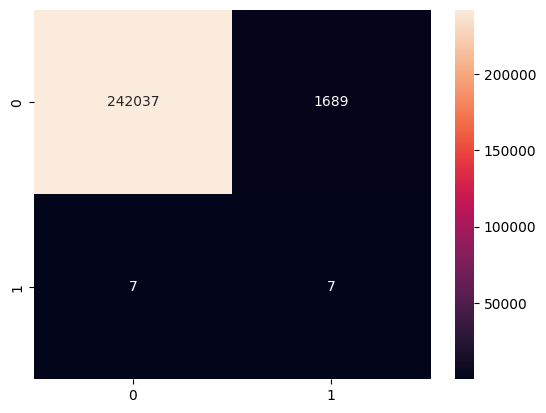

In [32]:
from sklearn.metrics import confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt

y_pred_test = predict(X_test_scaled, X_train_scaled)
print("y_pred_test  = ", type(y_pred_test))
sns.heatmap(confusion_matrix(y_test, y_pred_test), annot=True, fmt='.0f')
plt.show()